# Title: Take-Home Challange Relax Inc

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import date
from datetime import datetime
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier

## Problem Statement: 
Defining an "adopted user" as a user who has logged into the product on three separate days in at least one sevenday period, identify which factors predict future user adoption.

## Data preparation

In [207]:
user_engage = pd.read_csv('C:\\Users\\manas\\Desktop\\Springboard\\relax_challenge\\takehome_user_engagement.csv')
user_engage.head()

,time_stamp,user_id,visited
0,2014-04-22 03:53:30,1,1
1,2013-11-15 03:45:04,2,1
2,2013-11-29 03:45:04,2,1
3,2013-12-09 03:45:04,2,1
4,2013-12-25 03:45:04,2,1


In [208]:
# sort user_engage based on 'user_id' and then based on 'time_stamp', to estimate the difference in consecutive login days
user_engage = user_engage.sort_values(by=['user_id', 'time_stamp'])
user_engage.head()

,time_stamp,user_id,visited
0,2014-04-22 03:53:30,1,1
1,2013-11-15 03:45:04,2,1
2,2013-11-29 03:45:04,2,1
3,2013-12-09 03:45:04,2,1
4,2013-12-25 03:45:04,2,1


In [209]:
user_engage.shape

(207917, 3)

In [210]:
user_engage.visited.nunique()

1

In [211]:
user_engage.dtypes

time_stamp    object
user_id        int64
visited        int64
dtype: object

Description of the dataset: user_engaze contains 3 features: time_stamp (log in time of the user), user_id and visited (count as 1). The time_stamp is categorical and the other two are integer. Feature visited has one unique value 1.

We will find out the difference between consecutive login of individual user and finally find the difference in first and third login in days. If that is less than 7 days that customer is an adopted user. Difference in log in time of the same customer in days: delta_day.

In [212]:
#datetime.strptime(date[:10], "%Y-%m-%d")
prev_day = datetime.strptime(user_engage.time_stamp[0][:10], "%Y-%m-%d").date()
prev_id = 1
delta_day = []
visit = 0
num_visit = []
for i in range(len(user_engage.user_id)):
    if user_engage.user_id[i] == prev_id:
        day_diff = (datetime.strptime(user_engage.time_stamp[i][:10], "%Y-%m-%d").date() - prev_day).days
        prev_day = datetime.strptime(user_engage.time_stamp[i][:10], "%Y-%m-%d").date()
        prev_id = user_engage.user_id[i]
        visit = visit + 1
        print(i, user_engage.user_id[i], day_diff, visit)
    else:
        day_diff = 0
        prev_day = datetime.strptime(user_engage.time_stamp[i][:10], "%Y-%m-%d").date()
        prev_id = user_engage.user_id[i]
        visit = 1
        print(i, user_engage.user_id[i], day_diff, visit)
    delta_day.append(day_diff)
    num_visit.append(visit)

0 1 0 1
1 2 0 1
2 2 14 2
3 2 10 3
4 2 16 4
5 2 6 5
6 2 8 6
7 2 26 7
8 2 5 8
9 2 1 9
10 2 4 10
11 2 3 11
12 2 21 12
13 2 4 13
14 2 18 14
15 3 0 1
16 4 0 1
17 5 0 1
18 6 0 1
19 7 0 1
20 10 0 1
21 10 6 2
22 10 8 3
23 10 5 4
24 10 2 5
25 10 8 6
26 10 3 7
27 10 2 8
28 10 7 9
29 10 3 10
30 10 1 11
31 10 3 12
32 10 4 13
33 10 6 14
34 10 2 15
35 10 3 16
36 10 2 17
37 10 4 18
38 10 12 19
39 10 4 20
40 10 2 21
41 10 1 22
42 10 3 23
43 10 2 24
44 10 5 25
45 10 2 26
46 10 1 27
47 10 3 28
48 10 1 29
49 10 1 30
50 10 1 31
51 10 3 32
52 10 1 33
53 10 1 34
54 10 2 35
55 10 2 36
56 10 3 37
57 10 2 38
58 10 1 39
59 10 5 40
60 10 1 41
61 10 3 42
62 10 2 43
63 10 5 44
64 10 1 45
65 10 3 46
66 10 2 47
67 10 1 48
68 10 1 49
69 10 2 50
70 10 2 51
71 10 1 52
72 10 1 53
73 10 1 54
74 10 4 55
75 10 4 56
76 10 2 57
77 10 2 58
78 10 3 59
79 10 1 60
80 10 1 61
81 10 1 62
82 10 2 63
83 10 1 64
84 10 4 65
85 10 3 66
86 10 1 67
87 10 1 68
88 10 2 69
89 10 1 70
90 10 1 71
91 10 2 72
92 10 1 73
93 10 3 74
94 10 1 75
95

690 42 2 342
691 43 0 1
692 43 30 2
693 43 36 3
694 43 1 4
695 43 2 5
696 43 1 6
697 43 4 7
698 43 30 8
699 44 0 1
700 45 0 1
701 46 0 1
702 47 0 1
703 48 0 1
704 49 0 1
705 50 0 1
706 50 18 2
707 50 14 3
708 50 7 4
709 50 1 5
710 50 9 6
711 50 22 7
712 50 3 8
713 50 4 9
714 50 3 10
715 50 12 11
716 50 10 12
717 50 4 13
718 50 2 14
719 50 6 15
720 50 4 16
721 50 21 17
722 51 0 1
723 53 0 1
724 53 2 2
725 53 2 3
726 53 1 4
727 53 3 5
728 53 9 6
729 53 28 7
730 53 16 8
731 53 20 9
732 54 0 1
733 55 0 1
734 56 0 1
735 57 0 1
736 58 0 1
737 59 0 1
738 59 59 2
739 59 24 3
740 60 0 1
741 60 8 2
742 60 4 3
743 60 3 4
744 60 17 5
745 60 6 6
746 60 15 7
747 60 2 8
748 61 0 1
749 63 0 1
750 63 29 2
751 63 6 3
752 63 1 4
753 63 1 5
754 63 1 6
755 63 2 7
756 63 1 8
757 63 1 9
758 63 2 10
759 63 2 11
760 63 6 12
761 63 1 13
762 63 3 14
763 63 14 15
764 63 1 16
765 63 4 17
766 63 3 18
767 63 3 19
768 63 4 20
769 63 2 21
770 63 1 22
771 63 2 23
772 63 3 24
773 63 1 25
774 63 1 26
775 63 3 27
776 63 1

1439 69 1 324
1440 69 1 325
1441 69 1 326
1442 69 2 327
1443 69 1 328
1444 69 1 329
1445 69 1 330
1446 69 1 331
1447 69 1 332
1448 69 1 333
1449 69 2 334
1450 69 1 335
1451 69 1 336
1452 69 1 337
1453 69 1 338
1454 69 1 339
1455 69 1 340
1456 69 1 341
1457 69 1 342
1458 69 1 343
1459 69 2 344
1460 69 1 345
1461 69 1 346
1462 69 1 347
1463 69 1 348
1464 69 1 349
1465 69 1 350
1466 69 1 351
1467 69 1 352
1468 69 1 353
1469 69 1 354
1470 69 1 355
1471 69 1 356
1472 69 2 357
1473 69 1 358
1474 69 1 359
1475 69 1 360
1476 69 1 361
1477 69 1 362
1478 69 1 363
1479 69 1 364
1480 69 1 365
1481 69 1 366
1482 69 1 367
1483 69 1 368
1484 69 3 369
1485 69 1 370
1486 69 1 371
1487 69 1 372
1488 69 1 373
1489 69 1 374
1490 69 1 375
1491 69 1 376
1492 69 1 377
1493 69 1 378
1494 69 1 379
1495 69 1 380
1496 69 1 381
1497 69 1 382
1498 69 2 383
1499 69 1 384
1500 69 1 385
1501 69 1 386
1502 69 1 387
1503 69 1 388
1504 69 1 389
1505 69 1 390
1506 69 1 391
1507 69 1 392
1508 69 1 393
1509 69 1 394
1510 6

2189 133 2 41
2190 133 3 42
2191 133 1 43
2192 133 1 44
2193 133 2 45
2194 133 2 46
2195 133 1 47
2196 133 3 48
2197 133 1 49
2198 133 4 50
2199 133 1 51
2200 133 3 52
2201 133 3 53
2202 133 2 54
2203 133 3 55
2204 133 3 56
2205 133 1 57
2206 133 1 58
2207 133 3 59
2208 133 3 60
2209 133 2 61
2210 133 3 62
2211 133 2 63
2212 133 2 64
2213 133 1 65
2214 133 1 66
2215 133 4 67
2216 133 5 68
2217 133 2 69
2218 133 3 70
2219 133 1 71
2220 133 1 72
2221 135 0 1
2222 135 12 2
2223 135 17 3
2224 135 4 4
2225 135 1 5
2226 135 8 6
2227 135 1 7
2228 135 2 8
2229 135 5 9
2230 135 2 10
2231 135 1 11
2232 135 1 12
2233 135 13 13
2234 135 30 14
2235 135 1 15
2236 135 1 16
2237 135 5 17
2238 135 8 18
2239 135 4 19
2240 135 1 20
2241 135 3 21
2242 135 1 22
2243 135 4 23
2244 135 1 24
2245 136 0 1
2246 136 9 2
2247 136 19 3
2248 136 5 4
2249 136 10 5
2250 136 6 6
2251 138 0 1
2252 139 0 1
2253 140 0 1
2254 141 0 1
2255 141 1 2
2256 141 2 3
2257 141 4 4
2258 141 15 5
2259 141 13 6
2260 141 2 7
2261 141 

3030 168 2 307
3031 168 1 308
3032 168 1 309
3033 168 2 310
3034 168 1 311
3035 168 1 312
3036 168 1 313
3037 168 1 314
3038 168 1 315
3039 168 1 316
3040 168 1 317
3041 168 1 318
3042 168 2 319
3043 171 0 1
3044 171 12 2
3045 171 11 3
3046 171 4 4
3047 172 0 1
3048 172 7 2
3049 172 7 3
3050 172 20 4
3051 172 3 5
3052 172 10 6
3053 172 4 7
3054 172 5 8
3055 172 4 9
3056 172 2 10
3057 172 6 11
3058 172 15 12
3059 172 7 13
3060 173 0 1
3061 174 0 1
3062 174 8 2
3063 174 1 3
3064 174 2 4
3065 174 31 5
3066 174 7 6
3067 174 3 7
3068 174 5 8
3069 174 16 9
3070 174 8 10
3071 174 5 11
3072 174 3 12
3073 174 3 13
3074 174 19 14
3075 174 26 15
3076 174 7 16
3077 174 31 17
3078 174 3 18
3079 174 23 19
3080 174 2 20
3081 174 3 21
3082 174 15 22
3083 175 0 1
3084 176 0 1
3085 178 0 1
3086 179 0 1
3087 180 0 1
3088 181 0 1
3089 182 0 1
3090 183 0 1
3091 184 0 1
3092 185 0 1
3093 185 15 2
3094 185 23 3
3095 185 3 4
3096 185 2 5
3097 185 1 6
3098 185 1 7
3099 185 5 8
3100 185 2 9
3101 185 4 10
3102 1

3755 203 1 165
3756 203 1 166
3757 203 1 167
3758 203 1 168
3759 203 1 169
3760 203 2 170
3761 203 1 171
3762 203 1 172
3763 203 2 173
3764 203 3 174
3765 203 1 175
3766 203 1 176
3767 203 2 177
3768 203 1 178
3769 203 1 179
3770 203 1 180
3771 203 1 181
3772 203 1 182
3773 203 1 183
3774 203 2 184
3775 203 1 185
3776 203 1 186
3777 203 1 187
3778 203 1 188
3779 203 1 189
3780 203 1 190
3781 203 1 191
3782 203 1 192
3783 203 2 193
3784 203 1 194
3785 203 1 195
3786 203 1 196
3787 203 1 197
3788 203 1 198
3789 203 1 199
3790 203 1 200
3791 203 1 201
3792 203 1 202
3793 203 1 203
3794 203 1 204
3795 203 1 205
3796 203 1 206
3797 203 1 207
3798 203 1 208
3799 203 1 209
3800 203 1 210
3801 203 1 211
3802 203 1 212
3803 203 1 213
3804 204 0 1
3805 205 0 1
3806 206 0 1
3807 208 0 1
3808 209 0 1
3809 209 15 2
3810 209 3 3
3811 209 5 4
3812 209 13 5
3813 209 6 6
3814 209 1 7
3815 209 2 8
3816 209 12 9
3817 209 29 10
3818 209 2 11
3819 209 3 12
3820 209 2 13
3821 209 2 14
3822 209 5 15
3823 209

4438 245 2 42
4439 245 1 43
4440 245 1 44
4441 245 2 45
4442 245 2 46
4443 245 1 47
4444 245 2 48
4445 245 2 49
4446 245 2 50
4447 245 1 51
4448 245 1 52
4449 245 1 53
4450 245 1 54
4451 245 2 55
4452 245 3 56
4453 245 2 57
4454 245 1 58
4455 245 1 59
4456 245 1 60
4457 245 1 61
4458 245 1 62
4459 245 2 63
4460 245 1 64
4461 245 1 65
4462 245 1 66
4463 245 1 67
4464 245 2 68
4465 245 1 69
4466 245 1 70
4467 245 2 71
4468 245 1 72
4469 245 2 73
4470 245 1 74
4471 245 3 75
4472 245 1 76
4473 245 1 77
4474 245 1 78
4475 245 1 79
4476 245 2 80
4477 245 1 81
4478 245 1 82
4479 245 1 83
4480 245 1 84
4481 245 1 85
4482 245 2 86
4483 245 1 87
4484 245 1 88
4485 245 1 89
4486 245 1 90
4487 245 3 91
4488 245 1 92
4489 245 2 93
4490 245 2 94
4491 245 1 95
4492 245 1 96
4493 245 2 97
4494 245 1 98
4495 245 1 99
4496 245 1 100
4497 245 2 101
4498 245 1 102
4499 245 1 103
4500 245 1 104
4501 245 1 105
4502 245 1 106
4503 245 1 107
4504 245 1 108
4505 245 1 109
4506 245 1 110
4507 245 3 111
4508 245

5209 297 1 131
5210 297 1 132
5211 297 1 133
5212 297 1 134
5213 297 1 135
5214 297 1 136
5215 297 1 137
5216 297 1 138
5217 297 1 139
5218 297 1 140
5219 297 1 141
5220 297 1 142
5221 297 1 143
5222 297 1 144
5223 297 1 145
5224 297 1 146
5225 297 1 147
5226 297 1 148
5227 297 1 149
5228 297 1 150
5229 297 1 151
5230 297 1 152
5231 297 1 153
5232 297 1 154
5233 297 1 155
5234 297 1 156
5235 297 1 157
5236 297 1 158
5237 297 1 159
5238 297 1 160
5239 297 1 161
5240 297 1 162
5241 297 1 163
5242 297 1 164
5243 297 1 165
5244 297 1 166
5245 297 1 167
5246 297 1 168
5247 297 1 169
5248 297 1 170
5249 297 1 171
5250 297 1 172
5251 297 1 173
5252 297 1 174
5253 297 1 175
5254 297 1 176
5255 297 1 177
5256 297 1 178
5257 297 1 179
5258 297 1 180
5259 297 1 181
5260 297 1 182
5261 297 1 183
5262 297 1 184
5263 297 1 185
5264 297 1 186
5265 297 1 187
5266 297 1 188
5267 297 1 189
5268 297 1 190
5269 297 1 191
5270 297 1 192
5271 297 1 193
5272 297 1 194
5273 297 1 195
5274 297 1 196
5275 297 1

6051 341 1 106
6052 341 1 107
6053 341 2 108
6054 342 0 1
6055 343 0 1
6056 345 0 1
6057 345 17 2
6058 345 4 3
6059 345 16 4
6060 345 11 5
6061 345 3 6
6062 345 4 7
6063 345 10 8
6064 345 1 9
6065 346 0 1
6066 347 0 1
6067 347 4 2
6068 347 7 3
6069 347 5 4
6070 347 74 5
6071 347 8 6
6072 347 8 7
6073 347 2 8
6074 347 2 9
6075 349 0 1
6076 350 0 1
6077 350 16 2
6078 351 0 1
6079 351 4 2
6080 351 26 3
6081 351 4 4
6082 351 25 5
6083 351 8 6
6084 351 5 7
6085 351 2 8
6086 351 1 9
6087 351 8 10
6088 351 6 11
6089 351 5 12
6090 351 8 13
6091 351 3 14
6092 351 1 15
6093 351 5 16
6094 351 1 17
6095 351 3 18
6096 351 3 19
6097 351 2 20
6098 351 4 21
6099 351 6 22
6100 351 1 23
6101 351 4 24
6102 351 1 25
6103 351 1 26
6104 351 3 27
6105 351 2 28
6106 351 2 29
6107 351 2 30
6108 351 8 31
6109 351 1 32
6110 351 1 33
6111 352 0 1
6112 353 0 1
6113 354 0 1
6114 357 0 1
6115 360 0 1
6116 362 0 1
6117 362 6 2
6118 362 15 3
6119 362 10 4
6120 362 17 5
6121 362 20 6
6122 362 4 7
6123 362 3 8
6124 362 

6687 445 1 120
6688 445 2 121
6689 445 1 122
6690 445 1 123
6691 445 1 124
6692 445 1 125
6693 445 1 126
6694 445 1 127
6695 445 2 128
6696 445 1 129
6697 445 1 130
6698 445 2 131
6699 445 1 132
6700 445 1 133
6701 445 1 134
6702 445 1 135
6703 445 1 136
6704 445 3 137
6705 445 2 138
6706 445 1 139
6707 445 1 140
6708 445 1 141
6709 445 1 142
6710 445 2 143
6711 445 1 144
6712 445 2 145
6713 445 1 146
6714 445 1 147
6715 445 1 148
6716 445 3 149
6717 445 1 150
6718 445 1 151
6719 445 1 152
6720 445 1 153
6721 445 1 154
6722 445 2 155
6723 445 1 156
6724 445 1 157
6725 445 1 158
6726 445 1 159
6727 445 2 160
6728 445 2 161
6729 445 2 162
6730 445 2 163
6731 445 2 164
6732 445 1 165
6733 445 1 166
6734 445 1 167
6735 445 1 168
6736 445 1 169
6737 445 1 170
6738 445 1 171
6739 445 1 172
6740 445 1 173
6741 445 1 174
6742 445 1 175
6743 445 1 176
6744 445 1 177
6745 445 1 178
6746 445 2 179
6747 445 1 180
6748 445 1 181
6749 445 1 182
6750 445 1 183
6751 445 1 184
6752 445 1 185
6753 445 2

7457 479 7 2
7458 479 1 3
7459 479 3 4
7460 479 2 5
7461 479 1 6
7462 480 0 1
7463 481 0 1
7464 481 34 2
7465 481 2 3
7466 481 12 4
7467 481 7 5
7468 481 4 6
7469 482 0 1
7470 483 0 1
7471 483 4 2
7472 483 4 3
7473 483 1 4
7474 483 19 5
7475 483 16 6
7476 483 12 7
7477 483 1 8
7478 483 3 9
7479 483 2 10
7480 483 1 11
7481 483 1 12
7482 483 2 13
7483 483 1 14
7484 483 1 15
7485 483 3 16
7486 483 1 17
7487 483 1 18
7488 483 2 19
7489 483 3 20
7490 483 6 21
7491 483 1 22
7492 483 2 23
7493 483 2 24
7494 483 2 25
7495 483 1 26
7496 483 2 27
7497 483 1 28
7498 483 1 29
7499 483 3 30
7500 483 2 31
7501 483 1 32
7502 483 1 33
7503 483 1 34
7504 483 4 35
7505 483 4 36
7506 483 2 37
7507 483 3 38
7508 483 1 39
7509 483 2 40
7510 483 1 41
7511 483 1 42
7512 483 1 43
7513 483 1 44
7514 483 1 45
7515 483 1 46
7516 483 2 47
7517 483 2 48
7518 483 1 49
7519 483 1 50
7520 483 7 51
7521 483 2 52
7522 483 2 53
7523 483 5 54
7524 483 1 55
7525 483 4 56
7526 483 1 57
7527 483 6 58
7528 483 4 59
7529 483 

8051 509 1 134
8052 509 1 135
8053 509 1 136
8054 509 2 137
8055 509 1 138
8056 509 1 139
8057 509 1 140
8058 509 1 141
8059 509 1 142
8060 509 1 143
8061 509 1 144
8062 509 2 145
8063 509 1 146
8064 509 1 147
8065 509 1 148
8066 509 1 149
8067 509 1 150
8068 509 1 151
8069 509 1 152
8070 509 1 153
8071 509 1 154
8072 509 1 155
8073 509 1 156
8074 509 2 157
8075 509 1 158
8076 509 1 159
8077 509 1 160
8078 509 1 161
8079 509 2 162
8080 509 2 163
8081 509 4 164
8082 509 1 165
8083 509 1 166
8084 509 1 167
8085 509 2 168
8086 509 4 169
8087 509 1 170
8088 509 1 171
8089 509 2 172
8090 509 2 173
8091 509 1 174
8092 509 1 175
8093 509 1 176
8094 509 2 177
8095 509 1 178
8096 509 1 179
8097 509 2 180
8098 509 2 181
8099 509 2 182
8100 509 1 183
8101 509 1 184
8102 509 2 185
8103 509 2 186
8104 509 4 187
8105 509 5 188
8106 509 1 189
8107 509 2 190
8108 509 2 191
8109 509 6 192
8110 509 6 193
8111 509 3 194
8112 509 2 195
8113 509 5 196
8114 509 10 197
8115 509 4 198
8116 509 2 199
8117 509 

8630 512 2 119
8631 512 1 120
8632 512 1 121
8633 512 1 122
8634 512 1 123
8635 512 2 124
8636 512 3 125
8637 512 2 126
8638 512 1 127
8639 512 2 128
8640 512 1 129
8641 512 1 130
8642 512 1 131
8643 512 1 132
8644 512 4 133
8645 512 1 134
8646 513 0 1
8647 514 0 1
8648 515 0 1
8649 516 0 1
8650 517 0 1
8651 518 0 1
8652 518 21 2
8653 518 2 3
8654 518 13 4
8655 518 17 5
8656 518 7 6
8657 518 1 7
8658 518 1 8
8659 518 1 9
8660 518 1 10
8661 518 1 11
8662 518 3 12
8663 518 4 13
8664 518 1 14
8665 518 6 15
8666 518 1 16
8667 518 4 17
8668 518 7 18
8669 518 1 19
8670 518 4 20
8671 518 2 21
8672 518 9 22
8673 518 3 23
8674 518 1 24
8675 518 1 25
8676 518 2 26
8677 518 5 27
8678 518 6 28
8679 519 0 1
8680 520 0 1
8681 520 31 2
8682 520 10 3
8683 520 12 4
8684 520 6 5
8685 520 1 6
8686 520 7 7
8687 520 1 8
8688 520 12 9
8689 520 8 10
8690 520 2 11
8691 520 9 12
8692 521 0 1
8693 522 0 1
8694 522 10 2
8695 522 18 3
8696 522 1 4
8697 522 1 5
8698 522 3 6
8699 522 4 7
8700 522 2 8
8701 522 4 9
8

9381 553 1 118
9382 553 3 119
9383 553 3 120
9384 553 5 121
9385 553 1 122
9386 553 3 123
9387 553 1 124
9388 553 1 125
9389 553 4 126
9390 553 4 127
9391 553 2 128
9392 553 1 129
9393 553 1 130
9394 553 1 131
9395 553 2 132
9396 553 7 133
9397 553 4 134
9398 553 1 135
9399 553 1 136
9400 553 1 137
9401 553 2 138
9402 553 1 139
9403 553 1 140
9404 553 1 141
9405 553 1 142
9406 553 5 143
9407 553 1 144
9408 553 2 145
9409 553 1 146
9410 553 2 147
9411 553 1 148
9412 553 2 149
9413 553 1 150
9414 553 1 151
9415 553 1 152
9416 553 3 153
9417 553 1 154
9418 553 3 155
9419 553 2 156
9420 553 1 157
9421 553 1 158
9422 553 1 159
9423 553 1 160
9424 553 1 161
9425 553 1 162
9426 553 1 163
9427 553 3 164
9428 553 2 165
9429 553 2 166
9430 553 3 167
9431 553 1 168
9432 553 1 169
9433 553 1 170
9434 553 1 171
9435 553 1 172
9436 553 1 173
9437 553 1 174
9438 553 3 175
9439 553 1 176
9440 553 1 177
9441 553 4 178
9442 553 1 179
9443 553 6 180
9444 553 2 181
9445 553 5 182
9446 553 1 183
9447 553 6

10060 603 1 348
10061 603 1 349
10062 603 1 350
10063 603 1 351
10064 603 1 352
10065 603 1 353
10066 603 1 354
10067 603 1 355
10068 603 1 356
10069 603 1 357
10070 603 1 358
10071 603 1 359
10072 603 1 360
10073 603 1 361
10074 603 1 362
10075 603 1 363
10076 603 1 364
10077 603 1 365
10078 603 1 366
10079 603 1 367
10080 603 1 368
10081 603 1 369
10082 603 1 370
10083 603 1 371
10084 603 1 372
10085 603 1 373
10086 603 1 374
10087 603 1 375
10088 603 1 376
10089 603 1 377
10090 603 1 378
10091 603 1 379
10092 603 1 380
10093 603 1 381
10094 603 1 382
10095 603 1 383
10096 603 1 384
10097 603 1 385
10098 603 1 386
10099 603 1 387
10100 603 1 388
10101 603 1 389
10102 603 1 390
10103 603 1 391
10104 603 1 392
10105 603 1 393
10106 603 1 394
10107 603 1 395
10108 603 1 396
10109 603 1 397
10110 603 1 398
10111 603 1 399
10112 603 1 400
10113 603 2 401
10114 603 1 402
10115 603 1 403
10116 603 1 404
10117 603 1 405
10118 603 1 406
10119 603 1 407
10120 603 1 408
10121 603 1 409
10122 60

10809 632 3 43
10810 632 3 44
10811 632 5 45
10812 632 15 46
10813 632 5 47
10814 632 3 48
10815 632 3 49
10816 632 1 50
10817 632 4 51
10818 632 4 52
10819 632 4 53
10820 632 1 54
10821 632 2 55
10822 632 10 56
10823 632 5 57
10824 632 2 58
10825 632 15 59
10826 632 2 60
10827 632 4 61
10828 632 1 62
10829 632 4 63
10830 632 4 64
10831 632 1 65
10832 632 11 66
10833 632 1 67
10834 632 1 68
10835 632 2 69
10836 632 2 70
10837 632 1 71
10838 632 5 72
10839 632 6 73
10840 632 1 74
10841 632 2 75
10842 632 2 76
10843 632 2 77
10844 632 1 78
10845 632 1 79
10846 632 1 80
10847 632 4 81
10848 632 1 82
10849 632 5 83
10850 632 4 84
10851 632 1 85
10852 632 3 86
10853 632 5 87
10854 633 0 1
10855 634 0 1
10856 634 5 2
10857 634 2 3
10858 634 15 4
10859 634 5 5
10860 634 3 6
10861 634 2 7
10862 634 8 8
10863 634 3 9
10864 634 5 10
10865 634 5 11
10866 634 2 12
10867 634 1 13
10868 634 1 14
10869 634 5 15
10870 634 2 16
10871 634 2 17
10872 634 3 18
10873 634 3 19
10874 634 2 20
10875 634 1 21


11434 679 2 158
11435 679 1 159
11436 679 5 160
11437 679 1 161
11438 679 1 162
11439 679 2 163
11440 679 1 164
11441 679 1 165
11442 679 2 166
11443 679 2 167
11444 679 2 168
11445 679 1 169
11446 679 2 170
11447 679 2 171
11448 679 2 172
11449 679 3 173
11450 679 1 174
11451 679 2 175
11452 679 3 176
11453 679 2 177
11454 679 1 178
11455 679 1 179
11456 679 2 180
11457 679 1 181
11458 679 1 182
11459 679 1 183
11460 679 1 184
11461 679 1 185
11462 679 2 186
11463 679 3 187
11464 679 1 188
11465 679 1 189
11466 679 1 190
11467 679 1 191
11468 679 2 192
11469 679 1 193
11470 679 1 194
11471 679 1 195
11472 679 1 196
11473 679 1 197
11474 679 1 198
11475 679 1 199
11476 679 1 200
11477 679 2 201
11478 679 1 202
11479 679 1 203
11480 679 1 204
11481 679 1 205
11482 679 1 206
11483 679 1 207
11484 679 1 208
11485 679 1 209
11486 680 0 1
11487 680 2 2
11488 680 8 3
11489 680 59 4
11490 680 24 5
11491 680 9 6
11492 680 4 7
11493 680 6 8
11494 680 9 9
11495 680 1 10
11496 680 12 11
11497 680

12046 728 1 75
12047 728 1 76
12048 728 1 77
12049 728 3 78
12050 728 1 79
12051 728 1 80
12052 728 1 81
12053 728 1 82
12054 728 3 83
12055 728 1 84
12056 728 2 85
12057 728 1 86
12058 728 1 87
12059 728 1 88
12060 728 1 89
12061 728 1 90
12062 728 1 91
12063 728 1 92
12064 728 1 93
12065 728 1 94
12066 728 1 95
12067 728 1 96
12068 728 1 97
12069 728 1 98
12070 728 1 99
12071 728 1 100
12072 728 1 101
12073 728 1 102
12074 728 1 103
12075 728 1 104
12076 728 2 105
12077 728 2 106
12078 728 2 107
12079 728 1 108
12080 728 1 109
12081 728 1 110
12082 728 2 111
12083 728 1 112
12084 728 1 113
12085 728 1 114
12086 728 1 115
12087 728 1 116
12088 728 1 117
12089 728 2 118
12090 728 4 119
12091 728 2 120
12092 728 1 121
12093 728 2 122
12094 728 1 123
12095 728 2 124
12096 728 2 125
12097 728 2 126
12098 728 1 127
12099 728 1 128
12100 728 1 129
12101 728 1 130
12102 728 2 131
12103 728 1 132
12104 728 1 133
12105 728 2 134
12106 728 1 135
12107 728 1 136
12108 728 4 137
12109 728 2 138
1

12683 754 1 258
12684 754 1 259
12685 754 1 260
12686 754 1 261
12687 754 1 262
12688 754 1 263
12689 754 1 264
12690 754 1 265
12691 754 1 266
12692 754 1 267
12693 754 1 268
12694 754 1 269
12695 754 1 270
12696 754 1 271
12697 754 1 272
12698 754 1 273
12699 754 1 274
12700 754 1 275
12701 754 1 276
12702 754 1 277
12703 754 1 278
12704 754 2 279
12705 754 1 280
12706 754 1 281
12707 754 1 282
12708 754 1 283
12709 754 1 284
12710 754 1 285
12711 754 1 286
12712 754 1 287
12713 754 1 288
12714 754 1 289
12715 754 1 290
12716 754 1 291
12717 754 1 292
12718 754 1 293
12719 754 1 294
12720 754 1 295
12721 754 1 296
12722 754 1 297
12723 754 2 298
12724 754 1 299
12725 754 1 300
12726 754 1 301
12727 754 1 302
12728 754 1 303
12729 754 1 304
12730 754 1 305
12731 754 1 306
12732 754 1 307
12733 754 1 308
12734 754 1 309
12735 754 1 310
12736 754 1 311
12737 754 1 312
12738 754 1 313
12739 754 1 314
12740 754 1 315
12741 754 1 316
12742 754 1 317
12743 754 1 318
12744 754 1 319
12745 75

13297 783 3 95
13298 783 1 96
13299 783 1 97
13300 783 2 98
13301 783 3 99
13302 783 2 100
13303 783 1 101
13304 783 1 102
13305 783 1 103
13306 783 2 104
13307 783 1 105
13308 783 2 106
13309 783 3 107
13310 783 3 108
13311 783 2 109
13312 783 7 110
13313 783 1 111
13314 783 4 112
13315 783 1 113
13316 783 1 114
13317 783 1 115
13318 783 3 116
13319 783 1 117
13320 783 1 118
13321 783 1 119
13322 783 2 120
13323 783 1 121
13324 783 1 122
13325 783 2 123
13326 783 2 124
13327 783 2 125
13328 783 3 126
13329 783 1 127
13330 783 3 128
13331 783 1 129
13332 783 2 130
13333 783 2 131
13334 783 2 132
13335 783 1 133
13336 783 1 134
13337 783 1 135
13338 783 2 136
13339 783 3 137
13340 783 1 138
13341 783 1 139
13342 783 1 140
13343 783 1 141
13344 783 3 142
13345 783 2 143
13346 783 1 144
13347 783 2 145
13348 783 2 146
13349 783 1 147
13350 783 1 148
13351 783 1 149
13352 783 1 150
13353 783 1 151
13354 783 1 152
13355 783 1 153
13356 783 3 154
13357 783 1 155
13358 783 2 156
13359 783 1 1

14057 869 1 16
14058 869 2 17
14059 869 5 18
14060 869 1 19
14061 869 2 20
14062 869 4 21
14063 869 3 22
14064 869 10 23
14065 869 1 24
14066 869 2 25
14067 869 11 26
14068 869 1 27
14069 869 3 28
14070 869 4 29
14071 869 1 30
14072 869 2 31
14073 869 8 32
14074 869 1 33
14075 869 1 34
14076 869 2 35
14077 869 1 36
14078 869 3 37
14079 869 7 38
14080 869 4 39
14081 869 2 40
14082 869 7 41
14083 869 3 42
14084 869 3 43
14085 869 1 44
14086 869 4 45
14087 869 2 46
14088 869 3 47
14089 869 1 48
14090 869 6 49
14091 869 1 50
14092 869 5 51
14093 869 5 52
14094 869 9 53
14095 869 3 54
14096 869 5 55
14097 869 1 56
14098 869 2 57
14099 869 3 58
14100 869 1 59
14101 869 1 60
14102 869 3 61
14103 869 2 62
14104 869 15 63
14105 869 1 64
14106 869 1 65
14107 869 1 66
14108 869 1 67
14109 869 4 68
14110 872 0 1
14111 874 0 1
14112 874 8 2
14113 874 20 3
14114 874 1 4
14115 874 1 5
14116 874 2 6
14117 874 2 7
14118 874 2 8
14119 874 1 9
14120 874 6 10
14121 874 1 11
14122 874 2 12
14123 874 2 13
1

14682 901 2 113
14683 901 1 114
14684 901 1 115
14685 901 2 116
14686 901 1 117
14687 901 1 118
14688 901 1 119
14689 901 2 120
14690 901 1 121
14691 901 1 122
14692 901 1 123
14693 901 2 124
14694 901 1 125
14695 901 1 126
14696 901 1 127
14697 901 1 128
14698 901 1 129
14699 901 1 130
14700 901 2 131
14701 901 1 132
14702 901 1 133
14703 901 1 134
14704 901 1 135
14705 901 1 136
14706 901 3 137
14707 901 1 138
14708 901 2 139
14709 901 1 140
14710 901 1 141
14711 901 1 142
14712 901 2 143
14713 901 1 144
14714 901 2 145
14715 901 1 146
14716 901 2 147
14717 901 2 148
14718 901 1 149
14719 901 2 150
14720 901 2 151
14721 901 1 152
14722 901 2 153
14723 901 1 154
14724 901 2 155
14725 901 3 156
14726 901 2 157
14727 901 1 158
14728 901 1 159
14729 901 1 160
14730 901 2 161
14731 901 1 162
14732 901 1 163
14733 901 1 164
14734 901 1 165
14735 901 1 166
14736 901 2 167
14737 901 1 168
14738 901 1 169
14739 901 2 170
14740 901 2 171
14741 901 1 172
14742 901 2 173
14743 901 2 174
14744 90

15307 906 1 512
15308 906 1 513
15309 906 1 514
15310 906 1 515
15311 906 1 516
15312 906 1 517
15313 906 1 518
15314 906 1 519
15315 906 1 520
15316 906 1 521
15317 906 1 522
15318 906 1 523
15319 906 1 524
15320 906 1 525
15321 906 1 526
15322 906 1 527
15323 906 1 528
15324 906 1 529
15325 906 1 530
15326 906 1 531
15327 906 1 532
15328 906 1 533
15329 906 1 534
15330 906 1 535
15331 906 1 536
15332 906 1 537
15333 906 1 538
15334 906 1 539
15335 906 1 540
15336 906 1 541
15337 906 1 542
15338 906 1 543
15339 906 2 544
15340 906 1 545
15341 906 1 546
15342 906 1 547
15343 906 1 548
15344 906 1 549
15345 906 3 550
15346 906 2 551
15347 906 1 552
15348 906 1 553
15349 906 1 554
15350 906 1 555
15351 906 1 556
15352 906 1 557
15353 906 1 558
15354 906 1 559
15355 906 1 560
15356 906 2 561
15357 906 3 562
15358 906 1 563
15359 906 1 564
15360 906 1 565
15361 906 1 566
15362 906 1 567
15363 906 1 568
15364 906 1 569
15365 906 1 570
15366 906 1 571
15367 906 1 572
15368 906 1 573
15369 90

15855 928 1 120
15856 928 10 121
15857 928 2 122
15858 928 1 123
15859 928 3 124
15860 928 3 125
15861 928 5 126
15862 928 1 127
15863 928 6 128
15864 928 1 129
15865 928 2 130
15866 928 1 131
15867 929 0 1
15868 932 0 1
15869 932 11 2
15870 932 1 3
15871 932 5 4
15872 932 14 5
15873 932 1 6
15874 932 1 7
15875 932 3 8
15876 932 2 9
15877 932 1 10
15878 932 3 11
15879 932 3 12
15880 932 2 13
15881 932 2 14
15882 932 18 15
15883 932 3 16
15884 932 8 17
15885 932 1 18
15886 932 3 19
15887 932 1 20
15888 932 2 21
15889 932 10 22
15890 932 2 23
15891 932 1 24
15892 932 3 25
15893 932 2 26
15894 932 7 27
15895 932 1 28
15896 932 1 29
15897 932 5 30
15898 932 2 31
15899 932 7 32
15900 932 1 33
15901 932 3 34
15902 932 1 35
15903 932 3 36
15904 932 2 37
15905 932 1 38
15906 932 1 39
15907 932 1 40
15908 932 3 41
15909 932 2 42
15910 932 5 43
15911 932 1 44
15912 932 5 45
15913 932 1 46
15914 932 4 47
15915 932 2 48
15916 932 2 49
15917 932 1 50
15918 932 12 51
15919 932 7 52
15920 932 6 53
15

16449 960 0 1
16450 962 0 1
16451 963 0 1
16452 967 0 1
16453 969 0 1
16454 972 0 1
16455 973 0 1
16456 973 3 2
16457 975 0 1
16458 975 6 2
16459 976 0 1
16460 977 0 1
16461 978 0 1
16462 980 0 1
16463 980 39 2
16464 980 5 3
16465 980 2 4
16466 980 1 5
16467 980 9 6
16468 980 1 7
16469 980 1 8
16470 980 8 9
16471 980 5 10
16472 980 1 11
16473 980 2 12
16474 980 2 13
16475 980 3 14
16476 980 1 15
16477 980 2 16
16478 980 2 17
16479 980 1 18
16480 980 5 19
16481 980 9 20
16482 980 7 21
16483 980 2 22
16484 980 5 23
16485 980 5 24
16486 980 4 25
16487 980 2 26
16488 980 1 27
16489 980 3 28
16490 980 3 29
16491 980 1 30
16492 980 2 31
16493 980 8 32
16494 980 3 33
16495 980 6 34
16496 980 11 35
16497 980 1 36
16498 980 6 37
16499 980 2 38
16500 980 2 39
16501 980 1 40
16502 980 17 41
16503 980 33 42
16504 980 1 43
16505 980 9 44
16506 980 20 45
16507 980 8 46
16508 980 2 47
16509 980 5 48
16510 980 14 49
16511 980 1 50
16512 980 8 51
16513 980 1 52
16514 980 2 53
16515 980 1 54
16516 980 1

17021 1017 1 195
17022 1017 1 196
17023 1017 1 197
17024 1017 1 198
17025 1017 1 199
17026 1017 1 200
17027 1017 1 201
17028 1017 1 202
17029 1017 1 203
17030 1017 1 204
17031 1017 1 205
17032 1017 1 206
17033 1017 1 207
17034 1017 1 208
17035 1017 1 209
17036 1017 1 210
17037 1017 1 211
17038 1017 1 212
17039 1017 1 213
17040 1017 1 214
17041 1017 1 215
17042 1017 1 216
17043 1017 1 217
17044 1017 1 218
17045 1017 1 219
17046 1017 1 220
17047 1017 1 221
17048 1017 1 222
17049 1017 1 223
17050 1017 1 224
17051 1017 1 225
17052 1017 1 226
17053 1017 1 227
17054 1017 1 228
17055 1017 1 229
17056 1017 1 230
17057 1017 1 231
17058 1017 1 232
17059 1017 1 233
17060 1017 1 234
17061 1017 1 235
17062 1017 1 236
17063 1017 1 237
17064 1017 1 238
17065 1017 1 239
17066 1017 1 240
17067 1017 1 241
17068 1017 1 242
17069 1017 1 243
17070 1017 1 244
17071 1017 1 245
17072 1017 1 246
17073 1017 1 247
17074 1017 1 248
17075 1017 1 249
17076 1017 1 250
17077 1017 1 251
17078 1017 1 252
17079 1017 1 2

17618 1055 3 62
17619 1055 5 63
17620 1055 2 64
17621 1055 2 65
17622 1055 2 66
17623 1055 3 67
17624 1055 2 68
17625 1055 3 69
17626 1055 1 70
17627 1055 10 71
17628 1055 2 72
17629 1055 5 73
17630 1055 1 74
17631 1055 1 75
17632 1055 2 76
17633 1055 3 77
17634 1055 1 78
17635 1055 8 79
17636 1055 4 80
17637 1055 4 81
17638 1055 5 82
17639 1055 5 83
17640 1055 2 84
17641 1055 1 85
17642 1055 1 86
17643 1055 2 87
17644 1055 2 88
17645 1055 5 89
17646 1055 1 90
17647 1055 3 91
17648 1055 1 92
17649 1055 2 93
17650 1055 1 94
17651 1055 3 95
17652 1055 1 96
17653 1055 2 97
17654 1055 1 98
17655 1055 1 99
17656 1055 3 100
17657 1055 1 101
17658 1055 4 102
17659 1055 4 103
17660 1055 2 104
17661 1055 3 105
17662 1055 3 106
17663 1055 2 107
17664 1055 6 108
17665 1055 1 109
17666 1055 4 110
17667 1055 3 111
17668 1055 2 112
17669 1055 3 113
17670 1055 3 114
17671 1055 3 115
17672 1055 4 116
17673 1055 2 117
17674 1055 3 118
17675 1055 2 119
17676 1055 3 120
17677 1055 2 121
17678 1055 6 122


18207 1072 1 240
18208 1072 1 241
18209 1072 1 242
18210 1072 2 243
18211 1072 1 244
18212 1072 1 245
18213 1072 1 246
18214 1072 1 247
18215 1072 1 248
18216 1072 1 249
18217 1072 1 250
18218 1072 1 251
18219 1072 1 252
18220 1072 1 253
18221 1072 1 254
18222 1072 1 255
18223 1072 1 256
18224 1072 1 257
18225 1072 1 258
18226 1072 1 259
18227 1072 2 260
18228 1072 2 261
18229 1072 1 262
18230 1072 1 263
18231 1072 3 264
18232 1072 1 265
18233 1072 1 266
18234 1072 1 267
18235 1072 3 268
18236 1072 1 269
18237 1072 1 270
18238 1072 1 271
18239 1072 1 272
18240 1072 1 273
18241 1072 2 274
18242 1072 1 275
18243 1072 1 276
18244 1072 1 277
18245 1072 1 278
18246 1072 1 279
18247 1072 1 280
18248 1072 1 281
18249 1072 1 282
18250 1072 1 283
18251 1072 1 284
18252 1072 1 285
18253 1072 1 286
18254 1072 1 287
18255 1072 2 288
18256 1072 1 289
18257 1072 1 290
18258 1072 1 291
18259 1072 1 292
18260 1072 1 293
18261 1072 1 294
18262 1072 1 295
18263 1072 1 296
18264 1072 1 297
18265 1072 1 2

18804 1099 1 182
18805 1099 1 183
18806 1099 2 184
18807 1099 1 185
18808 1099 1 186
18809 1099 1 187
18810 1099 1 188
18811 1099 1 189
18812 1099 1 190
18813 1099 2 191
18814 1099 1 192
18815 1099 1 193
18816 1099 1 194
18817 1099 2 195
18818 1099 1 196
18819 1099 2 197
18820 1099 1 198
18821 1099 1 199
18822 1099 1 200
18823 1099 1 201
18824 1099 1 202
18825 1099 1 203
18826 1099 1 204
18827 1099 1 205
18828 1099 1 206
18829 1099 1 207
18830 1099 1 208
18831 1099 1 209
18832 1099 1 210
18833 1099 4 211
18834 1099 1 212
18835 1099 1 213
18836 1099 1 214
18837 1099 1 215
18838 1099 1 216
18839 1099 1 217
18840 1099 1 218
18841 1099 1 219
18842 1099 1 220
18843 1099 1 221
18844 1099 3 222
18845 1100 0 1
18846 1100 27 2
18847 1101 0 1
18848 1103 0 1
18849 1104 0 1
18850 1105 0 1
18851 1106 0 1
18852 1106 9 2
18853 1106 15 3
18854 1106 1 4
18855 1106 3 5
18856 1106 3 6
18857 1106 2 7
18858 1106 2 8
18859 1106 5 9
18860 1107 0 1
18861 1107 5 2
18862 1107 1 3
18863 1107 22 4
18864 1107 3 5


19356 1141 12 3
19357 1141 2 4
19358 1141 11 5
19359 1141 8 6
19360 1141 3 7
19361 1141 22 8
19362 1143 0 1
19363 1144 0 1
19364 1145 0 1
19365 1145 12 2
19366 1145 6 3
19367 1145 9 4
19368 1145 8 5
19369 1145 1 6
19370 1145 11 7
19371 1145 4 8
19372 1145 37 9
19373 1145 6 10
19374 1145 13 11
19375 1145 10 12
19376 1145 2 13
19377 1145 5 14
19378 1145 2 15
19379 1145 2 16
19380 1145 2 17
19381 1145 1 18
19382 1147 0 1
19383 1147 9 2
19384 1147 31 3
19385 1147 14 4
19386 1147 17 5
19387 1147 5 6
19388 1148 0 1
19389 1149 0 1
19390 1149 5 2
19391 1149 4 3
19392 1149 10 4
19393 1149 1 5
19394 1150 0 1
19395 1150 16 2
19396 1150 21 3
19397 1150 2 4
19398 1150 34 5
19399 1150 13 6
19400 1150 12 7
19401 1150 12 8
19402 1150 2 9
19403 1150 4 10
19404 1150 1 11
19405 1150 3 12
19406 1150 9 13
19407 1150 8 14
19408 1150 4 15
19409 1150 3 16
19410 1150 3 17
19411 1150 6 18
19412 1150 1 19
19413 1150 1 20
19414 1150 5 21
19415 1150 4 22
19416 1150 1 23
19417 1150 1 24
19418 1150 14 25
19419 1150 

19928 1156 2 79
19929 1156 1 80
19930 1156 5 81
19931 1156 3 82
19932 1156 3 83
19933 1156 1 84
19934 1156 3 85
19935 1156 1 86
19936 1156 2 87
19937 1156 1 88
19938 1156 1 89
19939 1156 2 90
19940 1156 1 91
19941 1156 1 92
19942 1156 4 93
19943 1156 2 94
19944 1156 2 95
19945 1156 3 96
19946 1156 5 97
19947 1156 3 98
19948 1156 1 99
19949 1156 5 100
19950 1156 1 101
19951 1156 1 102
19952 1156 1 103
19953 1156 3 104
19954 1156 1 105
19955 1156 1 106
19956 1156 1 107
19957 1156 1 108
19958 1156 1 109
19959 1156 2 110
19960 1156 1 111
19961 1156 2 112
19962 1156 1 113
19963 1156 1 114
19964 1156 1 115
19965 1156 2 116
19966 1156 2 117
19967 1156 1 118
19968 1156 1 119
19969 1156 1 120
19970 1156 1 121
19971 1156 1 122
19972 1156 1 123
19973 1156 1 124
19974 1156 2 125
19975 1156 1 126
19976 1156 1 127
19977 1156 4 128
19978 1156 1 129
19979 1156 3 130
19980 1156 1 131
19981 1156 2 132
19982 1156 2 133
19983 1156 1 134
19984 1156 1 135
19985 1156 1 136
19986 1156 1 137
19987 1157 0 1
199

20435 1202 1 201
20436 1202 1 202
20437 1202 1 203
20438 1202 1 204
20439 1202 1 205
20440 1202 1 206
20441 1202 1 207
20442 1202 1 208
20443 1202 1 209
20444 1202 1 210
20445 1202 1 211
20446 1202 1 212
20447 1202 1 213
20448 1202 1 214
20449 1202 1 215
20450 1202 1 216
20451 1202 2 217
20452 1202 1 218
20453 1202 1 219
20454 1202 1 220
20455 1202 1 221
20456 1202 1 222
20457 1202 2 223
20458 1202 1 224
20459 1202 1 225
20460 1202 1 226
20461 1202 1 227
20462 1202 1 228
20463 1202 1 229
20464 1202 1 230
20465 1202 1 231
20466 1202 1 232
20467 1202 1 233
20468 1202 2 234
20469 1202 1 235
20470 1202 1 236
20471 1202 2 237
20472 1202 1 238
20473 1202 1 239
20474 1202 3 240
20475 1202 1 241
20476 1202 1 242
20477 1202 2 243
20478 1202 1 244
20479 1202 2 245
20480 1202 1 246
20481 1202 1 247
20482 1202 1 248
20483 1202 1 249
20484 1202 1 250
20485 1202 1 251
20486 1202 1 252
20487 1202 2 253
20488 1202 1 254
20489 1202 1 255
20490 1202 1 256
20491 1202 2 257
20492 1202 2 258
20493 1202 1 2

21051 1280 3 120
21052 1280 2 121
21053 1280 2 122
21054 1280 1 123
21055 1280 3 124
21056 1280 1 125
21057 1280 1 126
21058 1280 1 127
21059 1280 1 128
21060 1280 3 129
21061 1280 3 130
21062 1280 3 131
21063 1280 7 132
21064 1280 1 133
21065 1280 5 134
21066 1280 1 135
21067 1280 2 136
21068 1280 2 137
21069 1280 1 138
21070 1280 2 139
21071 1280 1 140
21072 1280 2 141
21073 1280 5 142
21074 1280 4 143
21075 1280 9 144
21076 1280 3 145
21077 1280 15 146
21078 1280 1 147
21079 1280 1 148
21080 1280 9 149
21081 1280 1 150
21082 1280 9 151
21083 1280 11 152
21084 1280 2 153
21085 1280 18 154
21086 1280 4 155
21087 1280 2 156
21088 1280 1 157
21089 1280 3 158
21090 1280 1 159
21091 1280 6 160
21092 1280 3 161
21093 1280 3 162
21094 1280 2 163
21095 1280 2 164
21096 1280 1 165
21097 1280 4 166
21098 1280 1 167
21099 1280 10 168
21100 1280 18 169
21101 1280 4 170
21102 1280 2 171
21103 1280 5 172
21104 1280 4 173
21105 1280 2 174
21106 1280 5 175
21107 1280 2 176
21108 1280 4 177
21109 128

21563 1320 3 80
21564 1320 1 81
21565 1320 2 82
21566 1320 1 83
21567 1320 2 84
21568 1320 1 85
21569 1320 1 86
21570 1320 1 87
21571 1320 1 88
21572 1320 1 89
21573 1320 1 90
21574 1320 1 91
21575 1320 1 92
21576 1320 2 93
21577 1320 3 94
21578 1320 1 95
21579 1320 5 96
21580 1320 1 97
21581 1320 2 98
21582 1320 2 99
21583 1320 2 100
21584 1320 2 101
21585 1320 1 102
21586 1320 2 103
21587 1320 1 104
21588 1320 1 105
21589 1320 2 106
21590 1320 1 107
21591 1320 2 108
21592 1320 3 109
21593 1320 3 110
21594 1320 1 111
21595 1320 1 112
21596 1320 1 113
21597 1320 1 114
21598 1320 1 115
21599 1320 1 116
21600 1320 2 117
21601 1320 3 118
21602 1320 3 119
21603 1320 2 120
21604 1320 1 121
21605 1320 2 122
21606 1320 1 123
21607 1320 1 124
21608 1320 2 125
21609 1320 1 126
21610 1320 1 127
21611 1320 1 128
21612 1320 1 129
21613 1320 1 130
21614 1320 1 131
21615 1320 1 132
21616 1320 1 133
21617 1320 1 134
21618 1320 2 135
21619 1320 2 136
21620 1320 2 137
21621 1320 1 138
21622 1320 1 139


22175 1343 0 1
22176 1343 12 2
22177 1343 16 3
22178 1343 6 4
22179 1343 6 5
22180 1343 14 6
22181 1343 2 7
22182 1343 4 8
22183 1343 1 9
22184 1343 1 10
22185 1343 1 11
22186 1343 1 12
22187 1343 3 13
22188 1343 4 14
22189 1343 11 15
22190 1343 2 16
22191 1343 2 17
22192 1343 2 18
22193 1343 1 19
22194 1343 1 20
22195 1343 1 21
22196 1343 2 22
22197 1343 1 23
22198 1343 6 24
22199 1343 1 25
22200 1343 7 26
22201 1343 2 27
22202 1343 2 28
22203 1343 1 29
22204 1343 1 30
22205 1343 1 31
22206 1343 3 32
22207 1343 1 33
22208 1343 2 34
22209 1343 1 35
22210 1343 2 36
22211 1343 1 37
22212 1343 1 38
22213 1343 5 39
22214 1343 1 40
22215 1343 1 41
22216 1343 1 42
22217 1343 1 43
22218 1343 1 44
22219 1343 3 45
22220 1343 1 46
22221 1343 1 47
22222 1343 2 48
22223 1343 2 49
22224 1343 1 50
22225 1343 1 51
22226 1343 2 52
22227 1343 1 53
22228 1343 1 54
22229 1343 1 55
22230 1343 2 56
22231 1343 1 57
22232 1343 1 58
22233 1343 1 59
22234 1343 1 60
22235 1343 1 61
22236 1343 5 62
22237 1343 2 

22800 1357 1 67
22801 1357 1 68
22802 1357 4 69
22803 1357 5 70
22804 1357 1 71
22805 1357 1 72
22806 1357 2 73
22807 1357 3 74
22808 1357 1 75
22809 1357 5 76
22810 1357 1 77
22811 1357 2 78
22812 1357 2 79
22813 1357 3 80
22814 1357 2 81
22815 1357 4 82
22816 1357 4 83
22817 1357 1 84
22818 1357 2 85
22819 1357 1 86
22820 1357 3 87
22821 1357 5 88
22822 1357 1 89
22823 1357 2 90
22824 1357 1 91
22825 1357 1 92
22826 1357 1 93
22827 1357 4 94
22828 1357 1 95
22829 1357 4 96
22830 1357 3 97
22831 1357 6 98
22832 1357 4 99
22833 1357 2 100
22834 1357 5 101
22835 1357 1 102
22836 1357 3 103
22837 1357 1 104
22838 1357 1 105
22839 1357 4 106
22840 1357 5 107
22841 1357 1 108
22842 1357 2 109
22843 1357 6 110
22844 1357 1 111
22845 1357 2 112
22846 1357 4 113
22847 1357 2 114
22848 1357 2 115
22849 1357 2 116
22850 1357 6 117
22851 1357 4 118
22852 1357 2 119
22853 1357 1 120
22854 1357 1 121
22855 1357 10 122
22856 1357 1 123
22857 1357 2 124
22858 1357 4 125
22859 1357 6 126
22860 1357 1

23555 1411 1 113
23556 1411 2 114
23557 1411 1 115
23558 1411 1 116
23559 1411 1 117
23560 1411 1 118
23561 1411 1 119
23562 1411 1 120
23563 1411 1 121
23564 1411 1 122
23565 1411 3 123
23566 1411 1 124
23567 1411 1 125
23568 1411 1 126
23569 1411 2 127
23570 1411 1 128
23571 1411 1 129
23572 1411 1 130
23573 1411 1 131
23574 1411 1 132
23575 1411 1 133
23576 1411 2 134
23577 1411 1 135
23578 1411 1 136
23579 1411 2 137
23580 1411 2 138
23581 1411 1 139
23582 1411 3 140
23583 1411 1 141
23584 1411 1 142
23585 1411 1 143
23586 1411 3 144
23587 1411 1 145
23588 1411 1 146
23589 1411 1 147
23590 1411 2 148
23591 1411 1 149
23592 1411 1 150
23593 1411 1 151
23594 1411 1 152
23595 1411 1 153
23596 1411 1 154
23597 1411 1 155
23598 1411 1 156
23599 1411 1 157
23600 1411 1 158
23601 1411 1 159
23602 1411 4 160
23603 1411 1 161
23604 1411 1 162
23605 1411 1 163
23606 1411 1 164
23607 1411 1 165
23608 1411 1 166
23609 1411 1 167
23610 1411 1 168
23611 1411 4 169
23612 1411 1 170
23613 1411 2 1

24173 1457 0 1
24174 1458 0 1
24175 1461 0 1
24176 1462 0 1
24177 1464 0 1
24178 1464 29 2
24179 1464 36 3
24180 1464 31 4
24181 1464 2 5
24182 1464 16 6
24183 1464 13 7
24184 1464 20 8
24185 1464 8 9
24186 1464 2 10
24187 1464 13 11
24188 1464 13 12
24189 1464 16 13
24190 1464 2 14
24191 1464 1 15
24192 1464 1 16
24193 1464 4 17
24194 1464 5 18
24195 1464 1 19
24196 1464 3 20
24197 1464 2 21
24198 1464 1 22
24199 1464 1 23
24200 1464 1 24
24201 1464 2 25
24202 1464 1 26
24203 1464 1 27
24204 1464 1 28
24205 1464 3 29
24206 1464 3 30
24207 1464 1 31
24208 1464 1 32
24209 1464 2 33
24210 1464 2 34
24211 1464 2 35
24212 1464 1 36
24213 1464 2 37
24214 1464 1 38
24215 1464 1 39
24216 1464 1 40
24217 1464 2 41
24218 1464 1 42
24219 1464 3 43
24220 1464 3 44
24221 1464 2 45
24222 1464 2 46
24223 1464 4 47
24224 1464 3 48
24225 1464 1 49
24226 1464 1 50
24227 1464 2 51
24228 1464 1 52
24229 1464 3 53
24230 1464 1 54
24231 1464 2 55
24232 1464 2 56
24233 1464 1 57
24234 1464 1 58
24235 1464 1

24760 1479 4 37
24761 1479 5 38
24762 1479 1 39
24763 1479 2 40
24764 1479 2 41
24765 1479 3 42
24766 1479 6 43
24767 1479 1 44
24768 1479 10 45
24769 1479 2 46
24770 1479 1 47
24771 1479 1 48
24772 1479 2 49
24773 1479 1 50
24774 1479 1 51
24775 1479 1 52
24776 1479 5 53
24777 1479 4 54
24778 1479 1 55
24779 1479 1 56
24780 1479 1 57
24781 1479 1 58
24782 1479 3 59
24783 1479 3 60
24784 1479 3 61
24785 1479 2 62
24786 1479 1 63
24787 1479 1 64
24788 1479 2 65
24789 1479 1 66
24790 1479 1 67
24791 1479 3 68
24792 1479 1 69
24793 1479 1 70
24794 1479 2 71
24795 1479 3 72
24796 1479 1 73
24797 1479 1 74
24798 1479 1 75
24799 1479 1 76
24800 1479 2 77
24801 1479 1 78
24802 1479 1 79
24803 1479 4 80
24804 1479 1 81
24805 1479 2 82
24806 1479 1 83
24807 1479 1 84
24808 1479 3 85
24809 1479 1 86
24810 1479 2 87
24811 1479 1 88
24812 1479 7 89
24813 1479 3 90
24814 1479 1 91
24815 1479 3 92
24816 1479 1 93
24817 1479 3 94
24818 1479 6 95
24819 1479 1 96
24820 1479 1 97
24821 1479 3 98
24822 1

25424 1507 2 145
25425 1507 1 146
25426 1507 1 147
25427 1507 1 148
25428 1507 2 149
25429 1507 2 150
25430 1507 2 151
25431 1508 0 1
25432 1508 10 2
25433 1508 18 3
25434 1508 9 4
25435 1508 28 5
25436 1508 3 6
25437 1508 3 7
25438 1508 5 8
25439 1508 5 9
25440 1508 4 10
25441 1508 1 11
25442 1508 3 12
25443 1508 7 13
25444 1508 1 14
25445 1508 1 15
25446 1508 1 16
25447 1508 1 17
25448 1508 4 18
25449 1508 2 19
25450 1508 3 20
25451 1508 4 21
25452 1508 4 22
25453 1508 2 23
25454 1508 3 24
25455 1508 1 25
25456 1508 4 26
25457 1508 1 27
25458 1508 1 28
25459 1508 1 29
25460 1508 1 30
25461 1508 2 31
25462 1508 8 32
25463 1508 6 33
25464 1508 15 34
25465 1508 4 35
25466 1508 1 36
25467 1508 2 37
25468 1508 1 38
25469 1508 2 39
25470 1508 3 40
25471 1508 3 41
25472 1508 1 42
25473 1508 1 43
25474 1508 2 44
25475 1508 2 45
25476 1508 3 46
25477 1508 2 47
25478 1508 1 48
25479 1508 2 49
25480 1508 1 50
25481 1508 1 51
25482 1508 1 52
25483 1508 2 53
25484 1508 3 54
25485 1508 1 55
25486 

26173 1617 1 299
26174 1617 5 300
26175 1617 1 301
26176 1617 1 302
26177 1617 2 303
26178 1617 1 304
26179 1618 0 1
26180 1619 0 1
26181 1621 0 1
26182 1621 22 2
26183 1621 24 3
26184 1621 7 4
26185 1621 1 5
26186 1621 13 6
26187 1621 8 7
26188 1621 6 8
26189 1622 0 1
26190 1623 0 1
26191 1624 0 1
26192 1624 4 2
26193 1624 16 3
26194 1624 1 4
26195 1624 3 5
26196 1624 12 6
26197 1624 15 7
26198 1624 6 8
26199 1624 6 9
26200 1624 2 10
26201 1624 14 11
26202 1624 1 12
26203 1624 3 13
26204 1624 3 14
26205 1624 1 15
26206 1624 4 16
26207 1624 9 17
26208 1624 1 18
26209 1624 5 19
26210 1624 19 20
26211 1624 2 21
26212 1624 17 22
26213 1624 1 23
26214 1624 7 24
26215 1624 2 25
26216 1624 1 26
26217 1624 1 27
26218 1624 2 28
26219 1624 4 29
26220 1624 1 30
26221 1624 5 31
26222 1624 1 32
26223 1624 2 33
26224 1624 1 34
26225 1624 4 35
26226 1624 1 36
26227 1624 2 37
26228 1624 1 38
26229 1624 1 39
26230 1624 2 40
26231 1624 1 41
26232 1624 2 42
26233 1624 3 43
26234 1624 1 44
26235 1624 1 4

26798 1690 2 28
26799 1690 2 29
26800 1690 2 30
26801 1690 7 31
26802 1690 3 32
26803 1690 13 33
26804 1690 1 34
26805 1690 1 35
26806 1690 3 36
26807 1690 3 37
26808 1690 7 38
26809 1690 1 39
26810 1690 1 40
26811 1690 4 41
26812 1690 3 42
26813 1690 5 43
26814 1690 2 44
26815 1690 2 45
26816 1690 3 46
26817 1691 0 1
26818 1691 13 2
26819 1691 5 3
26820 1692 0 1
26821 1693 0 1
26822 1693 5 2
26823 1693 4 3
26824 1693 1 4
26825 1693 5 5
26826 1693 2 6
26827 1693 4 7
26828 1693 1 8
26829 1693 2 9
26830 1693 8 10
26831 1693 1 11
26832 1693 5 12
26833 1693 8 13
26834 1693 16 14
26835 1693 4 15
26836 1693 8 16
26837 1693 3 17
26838 1693 12 18
26839 1693 4 19
26840 1693 3 20
26841 1693 6 21
26842 1693 6 22
26843 1693 2 23
26844 1693 1 24
26845 1693 2 25
26846 1693 4 26
26847 1693 9 27
26848 1693 1 28
26849 1693 2 29
26850 1693 1 30
26851 1693 6 31
26852 1693 2 32
26853 1693 2 33
26854 1693 2 34
26855 1693 4 35
26856 1693 1 36
26857 1693 5 37
26858 1693 1 38
26859 1693 2 39
26860 1693 2 40
2

27423 1709 2 192
27424 1709 1 193
27425 1709 3 194
27426 1709 1 195
27427 1709 5 196
27428 1709 5 197
27429 1709 2 198
27430 1709 1 199
27431 1709 4 200
27432 1709 3 201
27433 1709 1 202
27434 1709 1 203
27435 1709 1 204
27436 1709 2 205
27437 1709 2 206
27438 1709 3 207
27439 1709 1 208
27440 1709 7 209
27441 1709 1 210
27442 1709 1 211
27443 1709 1 212
27444 1709 2 213
27445 1709 1 214
27446 1709 2 215
27447 1709 1 216
27448 1709 1 217
27449 1709 1 218
27450 1709 6 219
27451 1709 1 220
27452 1709 6 221
27453 1709 4 222
27454 1709 3 223
27455 1709 2 224
27456 1709 4 225
27457 1709 2 226
27458 1709 1 227
27459 1709 1 228
27460 1709 1 229
27461 1709 5 230
27462 1709 2 231
27463 1709 2 232
27464 1709 1 233
27465 1709 1 234
27466 1709 3 235
27467 1709 3 236
27468 1709 3 237
27469 1709 3 238
27470 1709 1 239
27471 1709 1 240
27472 1709 1 241
27473 1709 1 242
27474 1709 2 243
27475 1709 3 244
27476 1709 1 245
27477 1709 3 246
27478 1709 2 247
27479 1709 1 248
27480 1709 4 249
27481 1709 1 2

28047 1769 4 30
28048 1769 1 31
28049 1769 6 32
28050 1769 1 33
28051 1769 1 34
28052 1769 2 35
28053 1769 1 36
28054 1769 1 37
28055 1769 1 38
28056 1769 1 39
28057 1769 1 40
28058 1769 1 41
28059 1769 1 42
28060 1769 1 43
28061 1769 1 44
28062 1769 1 45
28063 1769 1 46
28064 1769 1 47
28065 1769 1 48
28066 1769 1 49
28067 1769 1 50
28068 1769 1 51
28069 1769 1 52
28070 1769 1 53
28071 1769 1 54
28072 1769 1 55
28073 1769 1 56
28074 1769 1 57
28075 1769 1 58
28076 1769 1 59
28077 1769 1 60
28078 1769 1 61
28079 1769 1 62
28080 1769 1 63
28081 1769 1 64
28082 1769 1 65
28083 1769 1 66
28084 1769 1 67
28085 1769 1 68
28086 1769 1 69
28087 1769 1 70
28088 1769 1 71
28089 1769 1 72
28090 1769 1 73
28091 1769 1 74
28092 1769 1 75
28093 1769 1 76
28094 1769 1 77
28095 1769 1 78
28096 1769 1 79
28097 1769 1 80
28098 1769 1 81
28099 1769 1 82
28100 1769 1 83
28101 1769 1 84
28102 1769 1 85
28103 1769 1 86
28104 1769 1 87
28105 1769 1 88
28106 1769 1 89
28107 1769 1 90
28108 1769 1 91
28109 17

28672 1781 5 56
28673 1781 1 57
28674 1781 1 58
28675 1781 2 59
28676 1781 2 60
28677 1781 3 61
28678 1781 4 62
28679 1781 2 63
28680 1781 1 64
28681 1781 1 65
28682 1781 2 66
28683 1781 3 67
28684 1781 10 68
28685 1781 2 69
28686 1781 1 70
28687 1781 1 71
28688 1781 6 72
28689 1781 2 73
28690 1781 1 74
28691 1781 1 75
28692 1781 1 76
28693 1781 1 77
28694 1781 1 78
28695 1781 1 79
28696 1781 4 80
28697 1781 3 81
28698 1781 1 82
28699 1781 2 83
28700 1781 2 84
28701 1781 1 85
28702 1781 1 86
28703 1781 3 87
28704 1781 1 88
28705 1781 3 89
28706 1781 1 90
28707 1781 2 91
28708 1781 2 92
28709 1781 2 93
28710 1781 3 94
28711 1781 1 95
28712 1781 1 96
28713 1781 2 97
28714 1781 2 98
28715 1781 1 99
28716 1781 1 100
28717 1781 3 101
28718 1781 1 102
28719 1782 0 1
28720 1783 0 1
28721 1783 17 2
28722 1783 5 3
28723 1783 8 4
28724 1783 2 5
28725 1783 2 6
28726 1783 1 7
28727 1783 1 8
28728 1783 1 9
28729 1783 6 10
28730 1783 6 11
28731 1783 1 12
28732 1783 2 13
28733 1783 1 14
28734 1783 1 

29297 1811 1 63
29298 1811 1 64
29299 1811 1 65
29300 1811 2 66
29301 1811 1 67
29302 1811 1 68
29303 1811 3 69
29304 1811 1 70
29305 1811 1 71
29306 1811 1 72
29307 1811 2 73
29308 1811 1 74
29309 1811 2 75
29310 1811 1 76
29311 1811 1 77
29312 1811 1 78
29313 1811 1 79
29314 1811 1 80
29315 1811 1 81
29316 1811 1 82
29317 1811 1 83
29318 1811 1 84
29319 1811 2 85
29320 1811 1 86
29321 1811 1 87
29322 1811 1 88
29323 1811 1 89
29324 1811 2 90
29325 1811 1 91
29326 1811 1 92
29327 1811 2 93
29328 1811 1 94
29329 1811 4 95
29330 1811 3 96
29331 1811 2 97
29332 1811 1 98
29333 1811 1 99
29334 1811 2 100
29335 1811 1 101
29336 1811 2 102
29337 1811 2 103
29338 1811 2 104
29339 1811 1 105
29340 1811 1 106
29341 1811 1 107
29342 1811 1 108
29343 1811 1 109
29344 1811 1 110
29345 1811 1 111
29346 1811 1 112
29347 1811 1 113
29348 1811 1 114
29349 1811 1 115
29350 1811 1 116
29351 1811 1 117
29352 1811 1 118
29353 1811 1 119
29354 1811 1 120
29355 1811 1 121
29356 1811 1 122
29357 1811 1 123


29922 1821 1 57
29923 1821 2 58
29924 1821 3 59
29925 1821 1 60
29926 1821 1 61
29927 1821 4 62
29928 1821 1 63
29929 1821 3 64
29930 1821 1 65
29931 1821 2 66
29932 1821 2 67
29933 1821 2 68
29934 1821 2 69
29935 1821 1 70
29936 1821 2 71
29937 1821 1 72
29938 1821 6 73
29939 1821 2 74
29940 1821 2 75
29941 1821 1 76
29942 1821 1 77
29943 1821 1 78
29944 1821 1 79
29945 1821 1 80
29946 1821 1 81
29947 1821 1 82
29948 1821 2 83
29949 1821 2 84
29950 1821 1 85
29951 1821 1 86
29952 1821 1 87
29953 1821 1 88
29954 1821 1 89
29955 1821 1 90
29956 1821 1 91
29957 1821 1 92
29958 1821 1 93
29959 1821 2 94
29960 1821 1 95
29961 1821 2 96
29962 1821 1 97
29963 1821 1 98
29964 1821 1 99
29965 1821 1 100
29966 1821 1 101
29967 1821 1 102
29968 1821 1 103
29969 1821 1 104
29970 1821 1 105
29971 1821 2 106
29972 1821 1 107
29973 1821 1 108
29974 1821 3 109
29975 1821 1 110
29976 1821 1 111
29977 1821 1 112
29978 1821 2 113
29979 1821 1 114
29980 1821 1 115
29981 1821 1 116
29982 1821 1 117
29983 

30546 1822 1 439
30547 1822 2 440
30548 1822 1 441
30549 1822 1 442
30550 1822 1 443
30551 1822 3 444
30552 1822 1 445
30553 1822 2 446
30554 1822 1 447
30555 1822 1 448
30556 1822 1 449
30557 1822 1 450
30558 1822 1 451
30559 1822 1 452
30560 1822 1 453
30561 1822 1 454
30562 1822 1 455
30563 1822 1 456
30564 1822 1 457
30565 1822 1 458
30566 1822 1 459
30567 1822 1 460
30568 1822 1 461
30569 1822 1 462
30570 1822 1 463
30571 1822 1 464
30572 1822 1 465
30573 1822 1 466
30574 1822 1 467
30575 1822 1 468
30576 1822 2 469
30577 1822 1 470
30578 1823 0 1
30579 1823 16 2
30580 1823 4 3
30581 1823 21 4
30582 1825 0 1
30583 1825 5 2
30584 1825 1 3
30585 1825 4 4
30586 1825 11 5
30587 1825 10 6
30588 1825 4 7
30589 1825 1 8
30590 1825 9 9
30591 1825 7 10
30592 1825 4 11
30593 1825 12 12
30594 1825 3 13
30595 1825 1 14
30596 1825 10 15
30597 1825 5 16
30598 1825 6 17
30599 1825 12 18
30600 1825 4 19
30601 1825 7 20
30602 1825 3 21
30603 1825 1 22
30604 1825 5 23
30605 1825 5 24
30606 1825 3 2

31171 1865 1 242
31172 1865 1 243
31173 1865 1 244
31174 1865 1 245
31175 1865 1 246
31176 1865 1 247
31177 1865 1 248
31178 1865 1 249
31179 1865 1 250
31180 1865 1 251
31181 1865 1 252
31182 1865 1 253
31183 1865 1 254
31184 1865 1 255
31185 1865 1 256
31186 1865 1 257
31187 1865 1 258
31188 1865 2 259
31189 1865 1 260
31190 1865 1 261
31191 1865 2 262
31192 1865 1 263
31193 1865 1 264
31194 1865 1 265
31195 1865 1 266
31196 1865 1 267
31197 1865 1 268
31198 1865 1 269
31199 1865 1 270
31200 1865 1 271
31201 1865 1 272
31202 1865 1 273
31203 1865 1 274
31204 1865 1 275
31205 1865 1 276
31206 1865 1 277
31207 1865 1 278
31208 1865 1 279
31209 1865 1 280
31210 1865 1 281
31211 1865 1 282
31212 1865 1 283
31213 1865 1 284
31214 1865 1 285
31215 1865 1 286
31216 1865 1 287
31217 1865 1 288
31218 1865 1 289
31219 1865 1 290
31220 1865 1 291
31221 1865 1 292
31222 1865 1 293
31223 1865 1 294
31224 1865 1 295
31225 1865 1 296
31226 1865 1 297
31227 1865 1 298
31228 1865 1 299
31229 1865 1 3

31671 1885 1 75
31672 1885 2 76
31673 1885 1 77
31674 1885 1 78
31675 1885 1 79
31676 1885 2 80
31677 1885 3 81
31678 1885 3 82
31679 1885 1 83
31680 1885 3 84
31681 1885 1 85
31682 1885 1 86
31683 1885 3 87
31684 1885 1 88
31685 1885 3 89
31686 1885 1 90
31687 1885 2 91
31688 1885 1 92
31689 1885 4 93
31690 1885 4 94
31691 1885 2 95
31692 1885 2 96
31693 1885 1 97
31694 1885 2 98
31695 1885 2 99
31696 1885 1 100
31697 1885 1 101
31698 1885 2 102
31699 1885 3 103
31700 1885 1 104
31701 1885 1 105
31702 1885 3 106
31703 1885 4 107
31704 1885 1 108
31705 1885 1 109
31706 1885 1 110
31707 1885 1 111
31708 1885 1 112
31709 1885 1 113
31710 1885 5 114
31711 1885 3 115
31712 1885 2 116
31713 1885 1 117
31714 1885 1 118
31715 1885 1 119
31716 1885 2 120
31717 1885 4 121
31718 1885 1 122
31719 1885 1 123
31720 1885 1 124
31721 1885 1 125
31722 1885 1 126
31723 1885 1 127
31724 1885 2 128
31725 1885 1 129
31726 1885 2 130
31727 1885 1 131
31728 1885 3 132
31729 1885 1 133
31730 1885 1 134
31731

32207 1954 7 9
32208 1954 7 10
32209 1954 1 11
32210 1954 3 12
32211 1954 1 13
32212 1954 5 14
32213 1954 17 15
32214 1954 7 16
32215 1954 1 17
32216 1954 10 18
32217 1954 1 19
32218 1954 1 20
32219 1954 3 21
32220 1954 4 22
32221 1954 2 23
32222 1954 10 24
32223 1954 2 25
32224 1954 14 26
32225 1954 1 27
32226 1954 9 28
32227 1954 9 29
32228 1954 4 30
32229 1954 4 31
32230 1954 7 32
32231 1954 7 33
32232 1954 1 34
32233 1954 12 35
32234 1954 2 36
32235 1954 19 37
32236 1954 1 38
32237 1954 1 39
32238 1954 3 40
32239 1954 8 41
32240 1954 3 42
32241 1954 2 43
32242 1954 10 44
32243 1960 0 1
32244 1961 0 1
32245 1962 0 1
32246 1963 0 1
32247 1964 0 1
32248 1965 0 1
32249 1966 0 1
32250 1967 0 1
32251 1968 0 1
32252 1969 0 1
32253 1970 0 1
32254 1972 0 1
32255 1973 0 1
32256 1974 0 1
32257 1974 12 2
32258 1974 4 3
32259 1974 11 4
32260 1974 1 5
32261 1974 3 6
32262 1974 4 7
32263 1974 1 8
32264 1974 1 9
32265 1974 1 10
32266 1974 4 11
32267 1974 1 12
32268 1974 1 13
32269 1974 8 14
32270 

32721 2011 1 235
32722 2011 1 236
32723 2013 0 1
32724 2013 32 2
32725 2013 4 3
32726 2013 7 4
32727 2013 8 5
32728 2013 3 6
32729 2013 10 7
32730 2013 3 8
32731 2013 2 9
32732 2013 16 10
32733 2013 2 11
32734 2013 6 12
32735 2013 1 13
32736 2013 4 14
32737 2013 4 15
32738 2013 11 16
32739 2013 1 17
32740 2013 2 18
32741 2013 6 19
32742 2013 1 20
32743 2013 6 21
32744 2013 4 22
32745 2013 2 23
32746 2013 3 24
32747 2013 5 25
32748 2013 3 26
32749 2013 2 27
32750 2013 5 28
32751 2013 1 29
32752 2013 2 30
32753 2013 4 31
32754 2013 1 32
32755 2013 2 33
32756 2013 1 34
32757 2013 1 35
32758 2013 1 36
32759 2013 4 37
32760 2013 1 38
32761 2013 2 39
32762 2013 3 40
32763 2013 2 41
32764 2013 2 42
32765 2013 4 43
32766 2013 1 44
32767 2013 4 45
32768 2013 1 46
32769 2013 8 47
32770 2013 1 48
32771 2013 1 49
32772 2013 1 50
32773 2013 3 51
32774 2013 1 52
32775 2013 3 53
32776 2013 7 54
32777 2013 2 55
32778 2013 2 56
32779 2013 1 57
32780 2013 2 58
32781 2013 1 59
32782 2013 1 60
32783 2013 

33241 2033 1 181
33242 2033 1 182
33243 2033 1 183
33244 2033 1 184
33245 2033 1 185
33246 2033 1 186
33247 2033 1 187
33248 2033 2 188
33249 2033 1 189
33250 2033 1 190
33251 2033 2 191
33252 2033 1 192
33253 2033 1 193
33254 2033 1 194
33255 2033 1 195
33256 2033 2 196
33257 2033 2 197
33258 2033 1 198
33259 2033 1 199
33260 2033 2 200
33261 2033 2 201
33262 2033 1 202
33263 2033 1 203
33264 2033 1 204
33265 2033 2 205
33266 2033 1 206
33267 2033 1 207
33268 2033 1 208
33269 2033 3 209
33270 2033 4 210
33271 2033 1 211
33272 2033 1 212
33273 2033 1 213
33274 2033 1 214
33275 2033 2 215
33276 2033 1 216
33277 2033 1 217
33278 2033 1 218
33279 2033 1 219
33280 2033 1 220
33281 2033 1 221
33282 2033 1 222
33283 2033 2 223
33284 2033 1 224
33285 2033 1 225
33286 2033 2 226
33287 2033 2 227
33288 2033 1 228
33289 2033 1 229
33290 2033 1 230
33291 2033 1 231
33292 2033 1 232
33293 2033 1 233
33294 2033 1 234
33295 2033 1 235
33296 2033 1 236
33297 2033 1 237
33298 2033 1 238
33299 2033 1 2

33920 2074 1 7
33921 2074 1 8
33922 2074 10 9
33923 2074 3 10
33924 2074 3 11
33925 2074 12 12
33926 2074 11 13
33927 2074 15 14
33928 2074 12 15
33929 2074 4 16
33930 2074 9 17
33931 2074 6 18
33932 2074 2 19
33933 2074 4 20
33934 2074 5 21
33935 2074 1 22
33936 2074 1 23
33937 2074 1 24
33938 2074 3 25
33939 2074 1 26
33940 2074 9 27
33941 2074 1 28
33942 2074 1 29
33943 2074 2 30
33944 2074 1 31
33945 2074 1 32
33946 2074 2 33
33947 2074 2 34
33948 2074 1 35
33949 2074 2 36
33950 2074 2 37
33951 2074 3 38
33952 2074 8 39
33953 2074 1 40
33954 2074 2 41
33955 2074 5 42
33956 2074 3 43
33957 2074 9 44
33958 2074 10 45
33959 2074 5 46
33960 2074 3 47
33961 2074 1 48
33962 2074 2 49
33963 2074 1 50
33964 2074 2 51
33965 2074 5 52
33966 2074 1 53
33967 2074 8 54
33968 2074 1 55
33969 2074 1 56
33970 2074 5 57
33971 2074 2 58
33972 2074 5 59
33973 2074 12 60
33974 2074 1 61
33975 2074 7 62
33976 2074 2 63
33977 2074 2 64
33978 2074 2 65
33979 2074 1 66
33980 2074 2 67
33981 2074 2 68
3398

34544 2078 1 488
34545 2079 0 1
34546 2080 0 1
34547 2080 3 2
34548 2080 3 3
34549 2080 1 4
34550 2080 23 5
34551 2080 3 6
34552 2080 1 7
34553 2080 1 8
34554 2080 20 9
34555 2080 3 10
34556 2080 2 11
34557 2080 1 12
34558 2080 1 13
34559 2080 1 14
34560 2080 1 15
34561 2080 1 16
34562 2080 1 17
34563 2080 3 18
34564 2080 1 19
34565 2080 1 20
34566 2080 1 21
34567 2080 1 22
34568 2080 4 23
34569 2080 2 24
34570 2080 2 25
34571 2080 1 26
34572 2080 2 27
34573 2080 2 28
34574 2080 1 29
34575 2080 1 30
34576 2080 2 31
34577 2080 1 32
34578 2080 3 33
34579 2080 2 34
34580 2080 1 35
34581 2080 16 36
34582 2080 2 37
34583 2080 1 38
34584 2080 2 39
34585 2080 1 40
34586 2080 1 41
34587 2080 2 42
34588 2080 1 43
34589 2080 2 44
34590 2080 2 45
34591 2080 2 46
34592 2080 3 47
34593 2080 1 48
34594 2080 3 49
34595 2080 1 50
34596 2080 1 51
34597 2080 2 52
34598 2080 1 53
34599 2080 1 54
34600 2080 2 55
34601 2080 1 56
34602 2080 2 57
34603 2080 1 58
34604 2080 1 59
34605 2080 2 60
34606 2080 2 6

35067 2113 1 45
35068 2113 3 46
35069 2113 2 47
35070 2113 3 48
35071 2113 2 49
35072 2113 4 50
35073 2113 5 51
35074 2113 1 52
35075 2115 0 1
35076 2118 0 1
35077 2118 11 2
35078 2119 0 1
35079 2120 0 1
35080 2122 0 1
35081 2123 0 1
35082 2124 0 1
35083 2124 1 2
35084 2124 1 3
35085 2124 1 4
35086 2124 8 5
35087 2124 1 6
35088 2124 5 7
35089 2124 1 8
35090 2124 5 9
35091 2124 4 10
35092 2124 6 11
35093 2124 15 12
35094 2124 21 13
35095 2124 12 14
35096 2126 0 1
35097 2126 3 2
35098 2127 0 1
35099 2128 0 1
35100 2129 0 1
35101 2129 34 2
35102 2129 11 3
35103 2129 13 4
35104 2129 4 5
35105 2129 12 6
35106 2129 9 7
35107 2129 6 8
35108 2129 1 9
35109 2129 3 10
35110 2129 3 11
35111 2129 6 12
35112 2129 9 13
35113 2131 0 1
35114 2131 39 2
35115 2131 23 3
35116 2132 0 1
35117 2134 0 1
35118 2134 13 2
35119 2134 15 3
35120 2134 19 4
35121 2134 5 5
35122 2134 3 6
35123 2134 11 7
35124 2134 4 8
35125 2134 41 9
35126 2134 4 10
35127 2134 12 11
35128 2134 2 12
35129 2134 9 13
35130 2135 0 1
351

35892 2193 1 273
35893 2193 1 274
35894 2193 2 275
35895 2193 2 276
35896 2193 1 277
35897 2193 1 278
35898 2193 5 279
35899 2194 0 1
35900 2194 16 2
35901 2194 10 3
35902 2196 0 1
35903 2196 10 2
35904 2196 18 3
35905 2196 1 4
35906 2196 10 5
35907 2196 12 6
35908 2196 1 7
35909 2196 16 8
35910 2197 0 1
35911 2198 0 1
35912 2198 7 2
35913 2199 0 1
35914 2199 10 2
35915 2199 1 3
35916 2199 1 4
35917 2199 24 5
35918 2199 23 6
35919 2199 1 7
35920 2199 15 8
35921 2199 2 9
35922 2199 2 10
35923 2199 3 11
35924 2199 21 12
35925 2199 1 13
35926 2199 5 14
35927 2199 10 15
35928 2199 7 16
35929 2199 2 17
35930 2199 5 18
35931 2199 2 19
35932 2199 12 20
35933 2199 3 21
35934 2199 1 22
35935 2199 12 23
35936 2199 24 24
35937 2199 10 25
35938 2199 5 26
35939 2199 8 27
35940 2199 2 28
35941 2199 4 29
35942 2199 3 30
35943 2199 7 31
35944 2199 3 32
35945 2199 10 33
35946 2199 3 34
35947 2199 10 35
35948 2199 3 36
35949 2199 6 37
35950 2199 1 38
35951 2199 3 39
35952 2199 1 40
35953 2199 1 41
35954

36493 2270 3 25
36494 2270 6 26
36495 2270 4 27
36496 2270 5 28
36497 2270 3 29
36498 2270 1 30
36499 2270 1 31
36500 2270 7 32
36501 2270 2 33
36502 2270 3 34
36503 2270 7 35
36504 2270 1 36
36505 2270 1 37
36506 2270 5 38
36507 2270 1 39
36508 2270 1 40
36509 2270 1 41
36510 2270 2 42
36511 2270 1 43
36512 2270 4 44
36513 2270 5 45
36514 2270 1 46
36515 2270 5 47
36516 2270 1 48
36517 2270 12 49
36518 2270 3 50
36519 2270 2 51
36520 2270 3 52
36521 2270 6 53
36522 2270 6 54
36523 2270 2 55
36524 2270 2 56
36525 2270 1 57
36526 2270 1 58
36527 2270 1 59
36528 2270 9 60
36529 2270 3 61
36530 2270 4 62
36531 2270 2 63
36532 2270 1 64
36533 2270 2 65
36534 2270 6 66
36535 2270 1 67
36536 2270 1 68
36537 2270 7 69
36538 2270 2 70
36539 2270 2 71
36540 2270 3 72
36541 2270 1 73
36542 2270 4 74
36543 2270 1 75
36544 2270 1 76
36545 2270 2 77
36546 2270 3 78
36547 2270 3 79
36548 2270 1 80
36549 2270 4 81
36550 2270 2 82
36551 2270 2 83
36552 2270 1 84
36553 2270 1 85
36554 2270 1 86
36555 2

37119 2289 1 56
37120 2289 1 57
37121 2289 2 58
37122 2289 2 59
37123 2289 1 60
37124 2289 2 61
37125 2289 2 62
37126 2289 1 63
37127 2289 2 64
37128 2289 1 65
37129 2289 4 66
37130 2289 1 67
37131 2289 1 68
37132 2289 5 69
37133 2289 4 70
37134 2289 1 71
37135 2289 1 72
37136 2289 1 73
37137 2289 1 74
37138 2289 3 75
37139 2289 4 76
37140 2289 3 77
37141 2289 3 78
37142 2289 5 79
37143 2289 2 80
37144 2289 5 81
37145 2289 1 82
37146 2289 2 83
37147 2289 1 84
37148 2289 1 85
37149 2289 1 86
37150 2289 1 87
37151 2289 5 88
37152 2289 2 89
37153 2289 1 90
37154 2289 2 91
37155 2289 6 92
37156 2289 2 93
37157 2289 1 94
37158 2289 2 95
37159 2289 4 96
37160 2289 2 97
37161 2289 2 98
37162 2289 3 99
37163 2289 3 100
37164 2289 4 101
37165 2289 1 102
37166 2289 4 103
37167 2289 1 104
37168 2289 7 105
37169 2289 6 106
37170 2289 6 107
37171 2289 1 108
37172 2289 1 109
37173 2289 6 110
37174 2289 3 111
37175 2289 1 112
37176 2289 1 113
37177 2289 6 114
37178 2289 2 115
37179 2289 4 116
37180 2

37858 2316 2 7
37859 2316 6 8
37860 2316 2 9
37861 2316 2 10
37862 2316 11 11
37863 2316 1 12
37864 2316 1 13
37865 2316 2 14
37866 2316 1 15
37867 2316 1 16
37868 2316 3 17
37869 2316 1 18
37870 2316 10 19
37871 2316 2 20
37872 2316 3 21
37873 2316 2 22
37874 2316 2 23
37875 2316 3 24
37876 2316 1 25
37877 2316 3 26
37878 2316 2 27
37879 2316 1 28
37880 2316 1 29
37881 2316 2 30
37882 2316 1 31
37883 2316 1 32
37884 2316 2 33
37885 2316 2 34
37886 2316 4 35
37887 2316 2 36
37888 2316 1 37
37889 2316 1 38
37890 2316 4 39
37891 2316 6 40
37892 2316 3 41
37893 2316 7 42
37894 2316 2 43
37895 2316 1 44
37896 2316 1 45
37897 2316 3 46
37898 2316 2 47
37899 2316 1 48
37900 2316 1 49
37901 2316 1 50
37902 2316 1 51
37903 2316 1 52
37904 2316 1 53
37905 2316 1 54
37906 2316 5 55
37907 2316 1 56
37908 2316 1 57
37909 2316 1 58
37910 2316 2 59
37911 2316 2 60
37912 2316 1 61
37913 2316 1 62
37914 2316 6 63
37915 2316 2 64
37916 2316 1 65
37917 2316 2 66
37918 2316 2 67
37919 2316 1 68
37920 231

38418 2324 1 7
38419 2324 8 8
38420 2324 2 9
38421 2324 1 10
38422 2324 1 11
38423 2324 1 12
38424 2324 4 13
38425 2324 1 14
38426 2324 7 15
38427 2324 1 16
38428 2324 10 17
38429 2324 7 18
38430 2324 1 19
38431 2324 7 20
38432 2324 4 21
38433 2324 1 22
38434 2324 4 23
38435 2324 1 24
38436 2324 1 25
38437 2324 2 26
38438 2324 1 27
38439 2324 4 28
38440 2324 3 29
38441 2324 1 30
38442 2324 1 31
38443 2324 1 32
38444 2324 3 33
38445 2324 2 34
38446 2324 1 35
38447 2324 1 36
38448 2324 1 37
38449 2324 2 38
38450 2324 1 39
38451 2324 1 40
38452 2324 1 41
38453 2324 1 42
38454 2324 1 43
38455 2324 1 44
38456 2324 1 45
38457 2324 3 46
38458 2324 1 47
38459 2324 1 48
38460 2324 2 49
38461 2324 1 50
38462 2324 2 51
38463 2324 1 52
38464 2324 1 53
38465 2324 2 54
38466 2324 2 55
38467 2324 3 56
38468 2324 1 57
38469 2324 1 58
38470 2324 1 59
38471 2324 2 60
38472 2324 1 61
38473 2324 1 62
38474 2324 1 63
38475 2324 2 64
38476 2324 1 65
38477 2324 1 66
38478 2324 1 67
38479 2324 1 68
38480 2324

39037 2337 1 50
39038 2337 6 51
39039 2337 9 52
39040 2337 3 53
39041 2337 13 54
39042 2337 1 55
39043 2337 5 56
39044 2337 6 57
39045 2337 17 58
39046 2337 2 59
39047 2337 5 60
39048 2337 3 61
39049 2337 1 62
39050 2337 7 63
39051 2337 5 64
39052 2337 5 65
39053 2337 5 66
39054 2337 2 67
39055 2337 4 68
39056 2337 5 69
39057 2337 10 70
39058 2337 12 71
39059 2339 0 1
39060 2339 18 2
39061 2339 4 3
39062 2339 6 4
39063 2339 1 5
39064 2339 3 6
39065 2339 7 7
39066 2339 5 8
39067 2339 1 9
39068 2339 2 10
39069 2339 5 11
39070 2339 7 12
39071 2339 1 13
39072 2339 3 14
39073 2339 1 15
39074 2339 4 16
39075 2339 1 17
39076 2339 1 18
39077 2339 2 19
39078 2339 1 20
39079 2339 1 21
39080 2339 7 22
39081 2339 3 23
39082 2339 3 24
39083 2339 4 25
39084 2339 1 26
39085 2339 2 27
39086 2339 1 28
39087 2339 2 29
39088 2339 1 30
39089 2339 1 31
39090 2339 2 32
39091 2339 3 33
39092 2339 1 34
39093 2339 2 35
39094 2339 2 36
39095 2339 3 37
39096 2339 2 38
39097 2339 2 39
39098 2339 2 40
39099 2339 1

39634 2425 2 28
39635 2425 6 29
39636 2425 1 30
39637 2425 6 31
39638 2425 4 32
39639 2425 2 33
39640 2425 12 34
39641 2425 1 35
39642 2425 5 36
39643 2425 2 37
39644 2425 3 38
39645 2425 2 39
39646 2425 3 40
39647 2425 3 41
39648 2425 3 42
39649 2425 2 43
39650 2425 2 44
39651 2425 1 45
39652 2425 2 46
39653 2425 1 47
39654 2425 1 48
39655 2425 1 49
39656 2425 1 50
39657 2425 1 51
39658 2425 4 52
39659 2425 3 53
39660 2425 9 54
39661 2425 1 55
39662 2425 1 56
39663 2425 1 57
39664 2425 4 58
39665 2425 6 59
39666 2425 4 60
39667 2425 5 61
39668 2425 5 62
39669 2425 10 63
39670 2425 5 64
39671 2425 1 65
39672 2425 2 66
39673 2425 4 67
39674 2425 8 68
39675 2425 4 69
39676 2425 8 70
39677 2425 1 71
39678 2425 12 72
39679 2425 9 73
39680 2425 1 74
39681 2425 1 75
39682 2425 3 76
39683 2425 9 77
39684 2425 1 78
39685 2425 2 79
39686 2425 2 80
39687 2425 2 81
39688 2425 1 82
39689 2425 4 83
39690 2425 1 84
39691 2425 12 85
39692 2425 1 86
39693 2425 7 87
39694 2425 8 88
39695 2425 5 89
3969

40240 2474 4 9
40241 2474 1 10
40242 2474 2 11
40243 2474 1 12
40244 2474 5 13
40245 2474 4 14
40246 2474 3 15
40247 2474 2 16
40248 2474 2 17
40249 2474 1 18
40250 2474 2 19
40251 2474 4 20
40252 2474 1 21
40253 2474 2 22
40254 2474 2 23
40255 2474 4 24
40256 2474 4 25
40257 2474 1 26
40258 2474 2 27
40259 2474 1 28
40260 2474 1 29
40261 2474 3 30
40262 2474 1 31
40263 2474 1 32
40264 2474 1 33
40265 2474 1 34
40266 2474 1 35
40267 2474 2 36
40268 2474 1 37
40269 2474 1 38
40270 2474 1 39
40271 2474 2 40
40272 2474 1 41
40273 2474 2 42
40274 2474 1 43
40275 2474 2 44
40276 2474 3 45
40277 2474 2 46
40278 2474 1 47
40279 2474 1 48
40280 2474 1 49
40281 2474 1 50
40282 2474 2 51
40283 2474 1 52
40284 2474 1 53
40285 2474 1 54
40286 2474 1 55
40287 2474 1 56
40288 2474 1 57
40289 2474 2 58
40290 2474 1 59
40291 2474 1 60
40292 2474 3 61
40293 2474 1 62
40294 2474 2 63
40295 2474 1 64
40296 2474 1 65
40297 2474 1 66
40298 2474 1 67
40299 2474 1 68
40300 2474 1 69
40301 2474 1 70
40302 247

40892 2490 4 43
40893 2490 6 44
40894 2490 1 45
40895 2490 2 46
40896 2490 7 47
40897 2490 3 48
40898 2490 4 49
40899 2490 1 50
40900 2490 2 51
40901 2490 1 52
40902 2490 2 53
40903 2490 1 54
40904 2490 2 55
40905 2490 6 56
40906 2490 1 57
40907 2490 3 58
40908 2490 5 59
40909 2490 5 60
40910 2490 2 61
40911 2490 1 62
40912 2490 2 63
40913 2490 5 64
40914 2490 1 65
40915 2490 8 66
40916 2490 1 67
40917 2490 8 68
40918 2490 1 69
40919 2490 2 70
40920 2490 4 71
40921 2490 3 72
40922 2490 4 73
40923 2490 6 74
40924 2490 6 75
40925 2490 1 76
40926 2490 1 77
40927 2490 2 78
40928 2490 2 79
40929 2490 5 80
40930 2490 2 81
40931 2490 5 82
40932 2490 1 83
40933 2490 1 84
40934 2490 1 85
40935 2490 2 86
40936 2490 3 87
40937 2490 3 88
40938 2490 1 89
40939 2490 1 90
40940 2490 1 91
40941 2490 2 92
40942 2490 3 93
40943 2490 1 94
40944 2490 1 95
40945 2490 1 96
40946 2490 1 97
40947 2490 3 98
40948 2490 1 99
40949 2490 1 100
40950 2490 1 101
40951 2490 1 102
40952 2490 1 103
40953 2490 1 104
409

41490 2519 1 68
41491 2519 2 69
41492 2519 1 70
41493 2519 2 71
41494 2519 4 72
41495 2519 1 73
41496 2519 1 74
41497 2519 3 75
41498 2519 1 76
41499 2519 1 77
41500 2519 1 78
41501 2519 1 79
41502 2519 1 80
41503 2519 1 81
41504 2519 1 82
41505 2519 1 83
41506 2519 3 84
41507 2519 1 85
41508 2519 1 86
41509 2519 1 87
41510 2519 2 88
41511 2519 1 89
41512 2519 1 90
41513 2519 1 91
41514 2519 1 92
41515 2519 1 93
41516 2519 2 94
41517 2519 2 95
41518 2519 1 96
41519 2519 2 97
41520 2519 1 98
41521 2519 1 99
41522 2519 1 100
41523 2519 1 101
41524 2519 1 102
41525 2519 1 103
41526 2519 2 104
41527 2519 2 105
41528 2519 1 106
41529 2519 1 107
41530 2519 1 108
41531 2519 1 109
41532 2519 1 110
41533 2519 1 111
41534 2519 1 112
41535 2519 3 113
41536 2519 1 114
41537 2519 1 115
41538 2519 2 116
41539 2519 1 117
41540 2519 1 118
41541 2519 2 119
41542 2519 1 120
41543 2519 1 121
41544 2519 1 122
41545 2519 1 123
41546 2519 1 124
41547 2519 1 125
41548 2519 1 126
41549 2519 2 127
41550 2519 1

42124 2539 1 170
42125 2539 1 171
42126 2539 1 172
42127 2539 1 173
42128 2539 1 174
42129 2539 1 175
42130 2539 1 176
42131 2539 1 177
42132 2539 1 178
42133 2539 1 179
42134 2539 1 180
42135 2539 1 181
42136 2539 1 182
42137 2539 1 183
42138 2539 1 184
42139 2539 1 185
42140 2539 1 186
42141 2539 1 187
42142 2539 1 188
42143 2539 1 189
42144 2539 1 190
42145 2539 1 191
42146 2539 1 192
42147 2539 1 193
42148 2539 1 194
42149 2539 1 195
42150 2539 1 196
42151 2539 1 197
42152 2539 1 198
42153 2539 1 199
42154 2539 1 200
42155 2539 1 201
42156 2539 1 202
42157 2539 1 203
42158 2539 1 204
42159 2539 1 205
42160 2539 2 206
42161 2539 1 207
42162 2539 1 208
42163 2539 1 209
42164 2539 1 210
42165 2539 1 211
42166 2539 1 212
42167 2539 1 213
42168 2539 1 214
42169 2539 2 215
42170 2539 1 216
42171 2539 1 217
42172 2539 1 218
42173 2539 1 219
42174 2539 1 220
42175 2539 1 221
42176 2539 1 222
42177 2539 1 223
42178 2539 1 224
42179 2539 1 225
42180 2539 1 226
42181 2539 1 227
42182 2539 1 2

42771 2557 4 79
42772 2557 2 80
42773 2557 2 81
42774 2557 7 82
42775 2557 4 83
42776 2557 1 84
42777 2557 2 85
42778 2557 3 86
42779 2557 3 87
42780 2557 4 88
42781 2557 3 89
42782 2557 1 90
42783 2557 2 91
42784 2557 2 92
42785 2557 2 93
42786 2557 1 94
42787 2557 1 95
42788 2557 1 96
42789 2557 2 97
42790 2557 1 98
42791 2557 4 99
42792 2557 1 100
42793 2557 1 101
42794 2557 1 102
42795 2557 1 103
42796 2557 3 104
42797 2557 1 105
42798 2557 1 106
42799 2557 3 107
42800 2557 2 108
42801 2557 1 109
42802 2557 1 110
42803 2557 2 111
42804 2557 1 112
42805 2557 6 113
42806 2557 2 114
42807 2557 1 115
42808 2557 1 116
42809 2557 1 117
42810 2557 1 118
42811 2557 1 119
42812 2557 1 120
42813 2557 1 121
42814 2557 1 122
42815 2557 1 123
42816 2557 1 124
42817 2557 1 125
42818 2557 1 126
42819 2557 3 127
42820 2557 2 128
42821 2557 2 129
42822 2557 3 130
42823 2557 1 131
42824 2557 1 132
42825 2557 3 133
42826 2557 2 134
42827 2557 1 135
42828 2557 1 136
42829 2557 3 137
42830 2557 1 138
4

43360 2568 2 168
43361 2568 2 169
43362 2568 1 170
43363 2568 1 171
43364 2568 1 172
43365 2568 1 173
43366 2568 1 174
43367 2568 1 175
43368 2568 3 176
43369 2568 1 177
43370 2568 1 178
43371 2568 1 179
43372 2568 1 180
43373 2568 1 181
43374 2568 1 182
43375 2568 1 183
43376 2568 2 184
43377 2568 1 185
43378 2568 1 186
43379 2568 2 187
43380 2568 3 188
43381 2568 1 189
43382 2568 1 190
43383 2568 2 191
43384 2568 1 192
43385 2568 1 193
43386 2568 1 194
43387 2568 1 195
43388 2568 1 196
43389 2568 1 197
43390 2568 1 198
43391 2568 1 199
43392 2568 1 200
43393 2568 1 201
43394 2568 1 202
43395 2568 1 203
43396 2568 1 204
43397 2568 1 205
43398 2568 1 206
43399 2568 1 207
43400 2568 1 208
43401 2568 1 209
43402 2568 1 210
43403 2568 1 211
43404 2568 1 212
43405 2568 1 213
43406 2568 1 214
43407 2568 1 215
43408 2568 1 216
43409 2568 1 217
43410 2568 1 218
43411 2568 1 219
43412 2568 1 220
43413 2568 1 221
43414 2568 1 222
43415 2568 1 223
43416 2568 1 224
43417 2568 1 225
43418 2568 1 2

44035 2604 3 56
44036 2604 6 57
44037 2604 1 58
44038 2604 2 59
44039 2604 4 60
44040 2604 2 61
44041 2604 4 62
44042 2604 3 63
44043 2604 1 64
44044 2604 2 65
44045 2604 5 66
44046 2604 3 67
44047 2604 1 68
44048 2604 3 69
44049 2604 7 70
44050 2604 2 71
44051 2604 2 72
44052 2604 1 73
44053 2604 1 74
44054 2604 1 75
44055 2604 1 76
44056 2604 3 77
44057 2604 2 78
44058 2604 3 79
44059 2604 2 80
44060 2604 1 81
44061 2604 12 82
44062 2604 1 83
44063 2604 1 84
44064 2604 1 85
44065 2604 2 86
44066 2604 2 87
44067 2604 6 88
44068 2604 1 89
44069 2604 1 90
44070 2604 3 91
44071 2604 1 92
44072 2604 10 93
44073 2604 7 94
44074 2604 4 95
44075 2604 1 96
44076 2604 3 97
44077 2604 38 98
44078 2604 4 99
44079 2604 11 100
44080 2604 1 101
44081 2604 5 102
44082 2604 2 103
44083 2604 9 104
44084 2604 5 105
44085 2604 1 106
44086 2604 11 107
44087 2604 1 108
44088 2604 4 109
44089 2604 3 110
44090 2604 3 111
44091 2604 3 112
44092 2604 6 113
44093 2604 1 114
44094 2604 6 115
44095 2605 0 1
4409

44540 2620 1 397
44541 2620 1 398
44542 2620 1 399
44543 2620 1 400
44544 2620 1 401
44545 2620 1 402
44546 2620 1 403
44547 2620 1 404
44548 2620 1 405
44549 2620 1 406
44550 2620 1 407
44551 2620 1 408
44552 2620 1 409
44553 2620 1 410
44554 2620 1 411
44555 2620 2 412
44556 2620 1 413
44557 2620 1 414
44558 2620 1 415
44559 2620 1 416
44560 2620 3 417
44561 2620 1 418
44562 2620 1 419
44563 2620 1 420
44564 2620 1 421
44565 2620 1 422
44566 2620 1 423
44567 2620 1 424
44568 2620 1 425
44569 2620 1 426
44570 2620 1 427
44571 2620 1 428
44572 2620 1 429
44573 2620 1 430
44574 2620 1 431
44575 2620 1 432
44576 2620 1 433
44577 2620 1 434
44578 2620 1 435
44579 2620 1 436
44580 2620 1 437
44581 2620 1 438
44582 2621 0 1
44583 2622 0 1
44584 2622 12 2
44585 2622 2 3
44586 2622 24 4
44587 2622 4 5
44588 2622 12 6
44589 2622 19 7
44590 2622 15 8
44591 2622 5 9
44592 2622 3 10
44593 2622 1 11
44594 2622 1 12
44595 2622 2 13
44596 2622 8 14
44597 2622 3 15
44598 2622 3 16
44599 2622 2 17
446

45165 2647 3 25
45166 2647 2 26
45167 2647 6 27
45168 2647 1 28
45169 2647 5 29
45170 2647 2 30
45171 2647 1 31
45172 2647 1 32
45173 2647 2 33
45174 2647 3 34
45175 2647 1 35
45176 2647 3 36
45177 2647 2 37
45178 2647 1 38
45179 2647 3 39
45180 2647 3 40
45181 2647 1 41
45182 2647 2 42
45183 2647 1 43
45184 2647 2 44
45185 2647 1 45
45186 2647 1 46
45187 2647 1 47
45188 2647 1 48
45189 2647 3 49
45190 2647 1 50
45191 2647 1 51
45192 2647 1 52
45193 2647 1 53
45194 2647 1 54
45195 2647 3 55
45196 2647 2 56
45197 2647 2 57
45198 2647 2 58
45199 2647 1 59
45200 2647 1 60
45201 2647 2 61
45202 2647 1 62
45203 2647 4 63
45204 2647 1 64
45205 2647 1 65
45206 2647 4 66
45207 2647 1 67
45208 2647 1 68
45209 2647 1 69
45210 2647 2 70
45211 2647 7 71
45212 2647 3 72
45213 2647 2 73
45214 2647 1 74
45215 2647 1 75
45216 2647 2 76
45217 2647 1 77
45218 2647 1 78
45219 2647 4 79
45220 2647 1 80
45221 2647 3 81
45222 2647 1 82
45223 2647 2 83
45224 2647 1 84
45225 2647 1 85
45226 2647 1 86
45227 26

45763 2658 1 510
45764 2658 1 511
45765 2658 1 512
45766 2658 1 513
45767 2658 1 514
45768 2658 1 515
45769 2658 1 516
45770 2658 1 517
45771 2658 1 518
45772 2658 1 519
45773 2658 1 520
45774 2658 1 521
45775 2658 1 522
45776 2658 1 523
45777 2658 1 524
45778 2658 1 525
45779 2658 1 526
45780 2659 0 1
45781 2660 0 1
45782 2661 0 1
45783 2663 0 1
45784 2664 0 1
45785 2665 0 1
45786 2667 0 1
45787 2668 0 1
45788 2669 0 1
45789 2670 0 1
45790 2671 0 1
45791 2672 0 1
45792 2672 5 2
45793 2672 4 3
45794 2672 2 4
45795 2672 10 5
45796 2672 6 6
45797 2672 1 7
45798 2672 5 8
45799 2672 1 9
45800 2672 3 10
45801 2672 6 11
45802 2672 3 12
45803 2672 1 13
45804 2672 1 14
45805 2672 9 15
45806 2672 6 16
45807 2672 6 17
45808 2672 1 18
45809 2672 3 19
45810 2672 12 20
45811 2672 1 21
45812 2672 1 22
45813 2672 6 23
45814 2672 1 24
45815 2672 2 25
45816 2672 1 26
45817 2672 2 27
45818 2672 1 28
45819 2672 2 29
45820 2672 1 30
45821 2672 1 31
45822 2672 1 32
45823 2672 2 33
45824 2672 2 34
45825 267

46359 2723 4 68
46360 2723 1 69
46361 2723 2 70
46362 2723 1 71
46363 2723 2 72
46364 2723 1 73
46365 2723 1 74
46366 2723 5 75
46367 2723 1 76
46368 2723 1 77
46369 2723 1 78
46370 2723 1 79
46371 2723 3 80
46372 2723 4 81
46373 2723 1 82
46374 2723 3 83
46375 2723 1 84
46376 2723 1 85
46377 2723 3 86
46378 2723 1 87
46379 2723 1 88
46380 2723 1 89
46381 2723 1 90
46382 2723 1 91
46383 2723 1 92
46384 2723 2 93
46385 2723 1 94
46386 2723 1 95
46387 2723 1 96
46388 2723 1 97
46389 2723 1 98
46390 2723 1 99
46391 2723 1 100
46392 2723 1 101
46393 2723 1 102
46394 2723 1 103
46395 2723 1 104
46396 2723 1 105
46397 2723 1 106
46398 2723 1 107
46399 2723 1 108
46400 2723 1 109
46401 2723 1 110
46402 2723 1 111
46403 2723 1 112
46404 2723 1 113
46405 2723 1 114
46406 2723 1 115
46407 2723 1 116
46408 2723 1 117
46409 2723 1 118
46410 2723 1 119
46411 2723 1 120
46412 2723 1 121
46413 2723 1 122
46414 2723 1 123
46415 2723 1 124
46416 2723 1 125
46417 2723 1 126
46418 2723 1 127
46419 2723 1

46914 2739 1 87
46915 2739 1 88
46916 2739 1 89
46917 2739 1 90
46918 2739 1 91
46919 2739 1 92
46920 2739 1 93
46921 2739 1 94
46922 2739 1 95
46923 2739 2 96
46924 2739 1 97
46925 2739 2 98
46926 2739 1 99
46927 2739 1 100
46928 2739 1 101
46929 2739 1 102
46930 2739 1 103
46931 2739 2 104
46932 2739 1 105
46933 2739 1 106
46934 2739 1 107
46935 2739 1 108
46936 2739 1 109
46937 2739 1 110
46938 2739 1 111
46939 2739 1 112
46940 2739 1 113
46941 2739 1 114
46942 2739 1 115
46943 2739 1 116
46944 2739 1 117
46945 2739 1 118
46946 2739 1 119
46947 2739 1 120
46948 2739 1 121
46949 2739 1 122
46950 2739 1 123
46951 2739 1 124
46952 2739 4 125
46953 2739 1 126
46954 2739 1 127
46955 2739 1 128
46956 2739 1 129
46957 2739 1 130
46958 2739 1 131
46959 2739 2 132
46960 2739 2 133
46961 2739 1 134
46962 2739 1 135
46963 2739 1 136
46964 2739 1 137
46965 2739 1 138
46966 2739 2 139
46967 2739 1 140
46968 2739 1 141
46969 2739 1 142
46970 2739 1 143
46971 2739 1 144
46972 2739 1 145
46973 2739

47539 2747 22 2
47540 2748 0 1
47541 2750 0 1
47542 2750 45 2
47543 2750 1 3
47544 2750 1 4
47545 2750 2 5
47546 2750 10 6
47547 2750 1 7
47548 2750 1 8
47549 2750 2 9
47550 2750 6 10
47551 2750 2 11
47552 2750 3 12
47553 2750 1 13
47554 2750 1 14
47555 2752 0 1
47556 2753 0 1
47557 2754 0 1
47558 2755 0 1
47559 2756 0 1
47560 2759 0 1
47561 2760 0 1
47562 2760 27 2
47563 2762 0 1
47564 2762 2 2
47565 2762 4 3
47566 2762 1 4
47567 2762 9 5
47568 2762 1 6
47569 2762 11 7
47570 2762 2 8
47571 2762 3 9
47572 2762 6 10
47573 2762 5 11
47574 2762 6 12
47575 2762 3 13
47576 2762 1 14
47577 2762 10 15
47578 2762 3 16
47579 2762 3 17
47580 2762 2 18
47581 2762 9 19
47582 2762 1 20
47583 2762 1 21
47584 2762 2 22
47585 2762 2 23
47586 2762 1 24
47587 2762 3 25
47588 2762 6 26
47589 2762 5 27
47590 2762 1 28
47591 2762 1 29
47592 2762 5 30
47593 2762 1 31
47594 2762 2 32
47595 2762 2 33
47596 2762 5 34
47597 2762 2 35
47598 2762 1 36
47599 2762 1 37
47600 2762 1 38
47601 2762 1 39
47602 2762 4 4

48164 2793 0 1
48165 2794 0 1
48166 2795 0 1
48167 2796 0 1
48168 2797 0 1
48169 2798 0 1
48170 2798 11 2
48171 2798 9 3
48172 2798 13 4
48173 2798 5 5
48174 2798 1 6
48175 2798 13 7
48176 2799 0 1
48177 2800 0 1
48178 2802 0 1
48179 2804 0 1
48180 2805 0 1
48181 2807 0 1
48182 2809 0 1
48183 2809 9 2
48184 2809 7 3
48185 2809 14 4
48186 2809 1 5
48187 2809 2 6
48188 2809 1 7
48189 2809 1 8
48190 2809 3 9
48191 2809 1 10
48192 2809 7 11
48193 2809 10 12
48194 2809 4 13
48195 2809 1 14
48196 2809 1 15
48197 2809 2 16
48198 2809 1 17
48199 2809 1 18
48200 2809 2 19
48201 2809 1 20
48202 2809 1 21
48203 2809 3 22
48204 2809 1 23
48205 2809 3 24
48206 2809 4 25
48207 2809 8 26
48208 2809 1 27
48209 2809 1 28
48210 2809 1 29
48211 2809 1 30
48212 2809 2 31
48213 2809 1 32
48214 2809 8 33
48215 2809 2 34
48216 2809 3 35
48217 2809 3 36
48218 2809 2 37
48219 2809 3 38
48220 2809 1 39
48221 2809 2 40
48222 2809 1 41
48223 2809 1 42
48224 2809 1 43
48225 2809 3 44
48226 2809 1 45
48227 2809 1 4

48787 2881 1 129
48788 2881 1 130
48789 2881 1 131
48790 2881 1 132
48791 2881 1 133
48792 2881 1 134
48793 2881 1 135
48794 2881 2 136
48795 2881 1 137
48796 2881 3 138
48797 2881 1 139
48798 2881 1 140
48799 2881 3 141
48800 2881 6 142
48801 2881 3 143
48802 2881 1 144
48803 2881 1 145
48804 2881 1 146
48805 2881 1 147
48806 2881 1 148
48807 2881 1 149
48808 2881 1 150
48809 2881 1 151
48810 2881 1 152
48811 2881 1 153
48812 2881 1 154
48813 2881 1 155
48814 2881 2 156
48815 2881 1 157
48816 2881 1 158
48817 2881 1 159
48818 2881 1 160
48819 2881 1 161
48820 2881 1 162
48821 2881 1 163
48822 2881 1 164
48823 2881 1 165
48824 2881 2 166
48825 2881 1 167
48826 2881 1 168
48827 2881 1 169
48828 2881 1 170
48829 2881 2 171
48830 2881 1 172
48831 2881 1 173
48832 2881 3 174
48833 2881 1 175
48834 2881 1 176
48835 2881 1 177
48836 2881 1 178
48837 2881 1 179
48838 2881 1 180
48839 2881 1 181
48840 2881 1 182
48841 2881 1 183
48842 2881 1 184
48843 2881 1 185
48844 2881 3 186
48845 2881 1 1

49381 2915 1 34
49382 2915 8 35
49383 2915 1 36
49384 2915 1 37
49385 2915 2 38
49386 2915 6 39
49387 2915 4 40
49388 2915 5 41
49389 2915 1 42
49390 2915 3 43
49391 2915 3 44
49392 2915 1 45
49393 2915 8 46
49394 2915 2 47
49395 2915 10 48
49396 2915 2 49
49397 2915 1 50
49398 2915 3 51
49399 2915 1 52
49400 2915 15 53
49401 2915 9 54
49402 2915 9 55
49403 2915 3 56
49404 2915 25 57
49405 2915 2 58
49406 2915 13 59
49407 2915 5 60
49408 2915 40 61
49409 2915 4 62
49410 2915 3 63
49411 2915 7 64
49412 2915 15 65
49413 2915 18 66
49414 2915 1 67
49415 2915 5 68
49416 2915 2 69
49417 2915 3 70
49418 2915 2 71
49419 2915 3 72
49420 2915 1 73
49421 2915 7 74
49422 2915 2 75
49423 2915 1 76
49424 2915 2 77
49425 2915 1 78
49426 2915 7 79
49427 2915 4 80
49428 2915 1 81
49429 2915 2 82
49430 2915 1 83
49431 2915 1 84
49432 2915 1 85
49433 2915 1 86
49434 2915 1 87
49435 2915 1 88
49436 2915 4 89
49437 2915 3 90
49438 2915 1 91
49439 2915 1 92
49440 2915 1 93
49441 2915 2 94
49442 2915 1 95
4

50005 2946 8 18
50006 2946 1 19
50007 2946 1 20
50008 2947 0 1
50009 2948 0 1
50010 2948 1 2
50011 2948 27 3
50012 2948 3 4
50013 2948 4 5
50014 2948 1 6
50015 2948 4 7
50016 2948 12 8
50017 2948 1 9
50018 2948 5 10
50019 2948 8 11
50020 2948 1 12
50021 2948 3 13
50022 2948 2 14
50023 2948 20 15
50024 2948 8 16
50025 2948 2 17
50026 2948 15 18
50027 2948 9 19
50028 2948 1 20
50029 2948 7 21
50030 2948 1 22
50031 2948 2 23
50032 2948 3 24
50033 2948 1 25
50034 2948 1 26
50035 2948 2 27
50036 2948 2 28
50037 2948 3 29
50038 2948 2 30
50039 2948 6 31
50040 2948 1 32
50041 2948 1 33
50042 2948 4 34
50043 2948 1 35
50044 2948 5 36
50045 2948 1 37
50046 2948 6 38
50047 2948 1 39
50048 2948 1 40
50049 2948 4 41
50050 2948 1 42
50051 2948 2 43
50052 2948 2 44
50053 2948 1 45
50054 2948 1 46
50055 2948 3 47
50056 2948 4 48
50057 2948 1 49
50058 2948 1 50
50059 2948 4 51
50060 2948 2 52
50061 2948 2 53
50062 2948 1 54
50063 2948 9 55
50064 2948 1 56
50065 2949 0 1
50066 2949 5 2
50067 2949 9 3
5

50647 3018 4 22
50648 3018 1 23
50649 3018 1 24
50650 3018 2 25
50651 3018 4 26
50652 3018 3 27
50653 3018 2 28
50654 3018 2 29
50655 3018 1 30
50656 3018 1 31
50657 3018 2 32
50658 3018 2 33
50659 3018 1 34
50660 3018 1 35
50661 3018 1 36
50662 3018 2 37
50663 3018 2 38
50664 3018 1 39
50665 3018 5 40
50666 3018 1 41
50667 3018 1 42
50668 3018 2 43
50669 3018 1 44
50670 3018 1 45
50671 3018 1 46
50672 3018 6 47
50673 3018 1 48
50674 3018 1 49
50675 3018 1 50
50676 3018 5 51
50677 3018 2 52
50678 3018 1 53
50679 3018 2 54
50680 3018 1 55
50681 3019 0 1
50682 3020 0 1
50683 3021 0 1
50684 3023 0 1
50685 3024 0 1
50686 3025 0 1
50687 3025 3 2
50688 3025 6 3
50689 3025 2 4
50690 3025 5 5
50691 3025 6 6
50692 3025 1 7
50693 3025 8 8
50694 3025 7 9
50695 3025 6 10
50696 3025 6 11
50697 3025 6 12
50698 3025 4 13
50699 3025 2 14
50700 3025 1 15
50701 3025 2 16
50702 3025 2 17
50703 3025 5 18
50704 3025 2 19
50705 3025 2 20
50706 3025 1 21
50707 3025 3 22
50708 3025 1 23
50709 3025 4 24
50710 

51239 3066 6 18
51240 3066 2 19
51241 3066 2 20
51242 3066 5 21
51243 3066 2 22
51244 3066 4 23
51245 3066 3 24
51246 3066 3 25
51247 3066 1 26
51248 3066 2 27
51249 3066 2 28
51250 3066 2 29
51251 3066 3 30
51252 3066 1 31
51253 3066 2 32
51254 3066 1 33
51255 3066 1 34
51256 3066 1 35
51257 3066 1 36
51258 3066 3 37
51259 3066 4 38
51260 3066 1 39
51261 3066 1 40
51262 3066 1 41
51263 3066 1 42
51264 3066 2 43
51265 3066 2 44
51266 3066 4 45
51267 3066 3 46
51268 3066 2 47
51269 3066 2 48
51270 3066 1 49
51271 3066 2 50
51272 3066 1 51
51273 3066 2 52
51274 3066 1 53
51275 3066 3 54
51276 3066 1 55
51277 3066 4 56
51278 3066 1 57
51279 3066 2 58
51280 3066 2 59
51281 3066 1 60
51282 3066 1 61
51283 3066 1 62
51284 3066 1 63
51285 3066 1 64
51286 3066 1 65
51287 3066 1 66
51288 3066 3 67
51289 3066 1 68
51290 3066 1 69
51291 3066 1 70
51292 3066 1 71
51293 3066 1 72
51294 3066 2 73
51295 3066 2 74
51296 3066 2 75
51297 3066 1 76
51298 3066 1 77
51299 3066 1 78
51300 3066 3 79
51301 30

51787 3067 3 158
51788 3067 3 159
51789 3067 3 160
51790 3067 3 161
51791 3067 2 162
51792 3067 1 163
51793 3067 3 164
51794 3067 2 165
51795 3067 1 166
51796 3067 7 167
51797 3067 1 168
51798 3067 3 169
51799 3067 2 170
51800 3067 3 171
51801 3067 3 172
51802 3067 2 173
51803 3067 1 174
51804 3067 3 175
51805 3067 3 176
51806 3067 1 177
51807 3067 1 178
51808 3067 4 179
51809 3067 3 180
51810 3067 5 181
51811 3067 1 182
51812 3069 0 1
51813 3069 9 2
51814 3069 21 3
51815 3069 1 4
51816 3069 9 5
51817 3069 5 6
51818 3069 14 7
51819 3069 1 8
51820 3069 15 9
51821 3069 8 10
51822 3070 0 1
51823 3071 0 1
51824 3071 5 2
51825 3071 7 3
51826 3071 1 4
51827 3071 10 5
51828 3071 2 6
51829 3071 2 7
51830 3071 7 8
51831 3071 4 9
51832 3071 7 10
51833 3071 1 11
51834 3071 1 12
51835 3071 1 13
51836 3071 1 14
51837 3071 8 15
51838 3071 1 16
51839 3071 6 17
51840 3071 4 18
51841 3071 2 19
51842 3071 8 20
51843 3071 16 21
51844 3071 2 22
51845 3071 9 23
51846 3071 3 24
51847 3071 3 25
51848 3071 7 

52412 3093 1 229
52413 3093 1 230
52414 3093 1 231
52415 3093 1 232
52416 3093 1 233
52417 3093 1 234
52418 3093 1 235
52419 3093 1 236
52420 3093 1 237
52421 3093 1 238
52422 3093 1 239
52423 3093 1 240
52424 3093 1 241
52425 3093 1 242
52426 3093 1 243
52427 3093 1 244
52428 3093 1 245
52429 3093 1 246
52430 3093 1 247
52431 3093 1 248
52432 3093 1 249
52433 3093 1 250
52434 3093 1 251
52435 3093 1 252
52436 3093 1 253
52437 3093 1 254
52438 3093 1 255
52439 3093 1 256
52440 3093 1 257
52441 3093 1 258
52442 3093 1 259
52443 3093 1 260
52444 3093 1 261
52445 3093 1 262
52446 3093 1 263
52447 3093 1 264
52448 3093 2 265
52449 3093 1 266
52450 3093 2 267
52451 3093 1 268
52452 3093 1 269
52453 3093 1 270
52454 3093 3 271
52455 3093 1 272
52456 3093 1 273
52457 3093 1 274
52458 3093 1 275
52459 3093 1 276
52460 3093 1 277
52461 3093 1 278
52462 3093 1 279
52463 3093 1 280
52464 3093 1 281
52465 3093 1 282
52466 3093 1 283
52467 3093 2 284
52468 3093 1 285
52469 3093 1 286
52470 3093 1 2

53037 3137 1 27
53038 3137 1 28
53039 3137 9 29
53040 3137 2 30
53041 3137 2 31
53042 3137 8 32
53043 3137 20 33
53044 3137 8 34
53045 3137 3 35
53046 3137 2 36
53047 3137 7 37
53048 3137 2 38
53049 3137 10 39
53050 3137 4 40
53051 3137 5 41
53052 3137 1 42
53053 3137 2 43
53054 3137 2 44
53055 3137 2 45
53056 3137 1 46
53057 3137 4 47
53058 3137 1 48
53059 3137 3 49
53060 3137 3 50
53061 3137 2 51
53062 3137 1 52
53063 3137 1 53
53064 3137 2 54
53065 3137 3 55
53066 3137 1 56
53067 3137 9 57
53068 3137 3 58
53069 3137 4 59
53070 3137 1 60
53071 3137 6 61
53072 3137 1 62
53073 3137 4 63
53074 3137 1 64
53075 3137 2 65
53076 3137 2 66
53077 3137 1 67
53078 3137 2 68
53079 3137 1 69
53080 3137 3 70
53081 3137 2 71
53082 3137 2 72
53083 3137 4 73
53084 3137 1 74
53085 3137 2 75
53086 3137 1 76
53087 3137 2 77
53088 3137 4 78
53089 3137 1 79
53090 3137 4 80
53091 3137 1 81
53092 3137 1 82
53093 3137 1 83
53094 3137 3 84
53095 3137 1 85
53096 3137 2 86
53097 3137 1 87
53098 3137 1 88
53099 

53749 3160 3 91
53750 3160 1 92
53751 3160 2 93
53752 3160 1 94
53753 3160 2 95
53754 3160 3 96
53755 3160 1 97
53756 3160 1 98
53757 3160 2 99
53758 3160 1 100
53759 3160 2 101
53760 3160 1 102
53761 3160 2 103
53762 3160 1 104
53763 3160 1 105
53764 3160 1 106
53765 3160 1 107
53766 3160 1 108
53767 3160 1 109
53768 3160 1 110
53769 3160 1 111
53770 3160 1 112
53771 3160 2 113
53772 3160 2 114
53773 3160 2 115
53774 3160 1 116
53775 3160 1 117
53776 3160 2 118
53777 3160 1 119
53778 3160 1 120
53779 3160 3 121
53780 3160 3 122
53781 3160 1 123
53782 3160 1 124
53783 3160 1 125
53784 3160 1 126
53785 3160 1 127
53786 3160 1 128
53787 3160 2 129
53788 3160 1 130
53789 3160 2 131
53790 3160 1 132
53791 3160 1 133
53792 3160 1 134
53793 3160 1 135
53794 3160 1 136
53795 3160 1 137
53796 3160 1 138
53797 3160 1 139
53798 3160 1 140
53799 3160 1 141
53800 3160 1 142
53801 3160 1 143
53802 3160 1 144
53803 3160 1 145
53804 3160 1 146
53805 3160 1 147
53806 3160 1 148
53807 3160 1 149
53808 

54286 3175 1 116
54287 3175 1 117
54288 3175 1 118
54289 3175 1 119
54290 3175 5 120
54291 3175 2 121
54292 3175 1 122
54293 3175 3 123
54294 3175 2 124
54295 3175 1 125
54296 3175 2 126
54297 3175 2 127
54298 3175 4 128
54299 3175 4 129
54300 3175 1 130
54301 3175 1 131
54302 3175 3 132
54303 3175 1 133
54304 3175 1 134
54305 3175 2 135
54306 3175 1 136
54307 3175 1 137
54308 3175 1 138
54309 3175 3 139
54310 3175 1 140
54311 3175 1 141
54312 3175 1 142
54313 3175 1 143
54314 3175 2 144
54315 3175 2 145
54316 3175 1 146
54317 3175 1 147
54318 3175 1 148
54319 3175 3 149
54320 3175 1 150
54321 3175 2 151
54322 3175 1 152
54323 3175 1 153
54324 3175 1 154
54325 3175 1 155
54326 3175 1 156
54327 3175 1 157
54328 3175 1 158
54329 3175 1 159
54330 3175 2 160
54331 3175 1 161
54332 3175 1 162
54333 3175 1 163
54334 3175 2 164
54335 3175 1 165
54336 3175 1 166
54337 3175 2 167
54338 3175 1 168
54339 3175 1 169
54340 3175 2 170
54341 3175 1 171
54342 3175 1 172
54343 3175 1 173
54344 3175 1 1

54910 3193 2 128
54911 3193 1 129
54912 3193 1 130
54913 3193 1 131
54914 3193 2 132
54915 3193 1 133
54916 3193 1 134
54917 3193 1 135
54918 3193 1 136
54919 3193 2 137
54920 3193 1 138
54921 3193 1 139
54922 3193 1 140
54923 3193 3 141
54924 3193 5 142
54925 3193 2 143
54926 3193 2 144
54927 3193 1 145
54928 3193 1 146
54929 3193 1 147
54930 3193 1 148
54931 3193 1 149
54932 3193 1 150
54933 3193 1 151
54934 3193 1 152
54935 3193 1 153
54936 3193 1 154
54937 3193 1 155
54938 3193 1 156
54939 3193 1 157
54940 3193 2 158
54941 3193 1 159
54942 3193 2 160
54943 3193 1 161
54944 3193 2 162
54945 3193 1 163
54946 3193 1 164
54947 3193 1 165
54948 3193 1 166
54949 3193 2 167
54950 3193 1 168
54951 3193 1 169
54952 3193 1 170
54953 3193 1 171
54954 3193 2 172
54955 3193 1 173
54956 3193 1 174
54957 3193 1 175
54958 3193 1 176
54959 3193 1 177
54960 3193 2 178
54961 3193 2 179
54962 3193 1 180
54963 3193 1 181
54964 3193 1 182
54965 3193 1 183
54966 3193 1 184
54967 3193 1 185
54968 3193 1 1

55514 3217 1 235
55515 3217 1 236
55516 3217 1 237
55517 3217 1 238
55518 3217 1 239
55519 3217 1 240
55520 3217 1 241
55521 3217 1 242
55522 3217 1 243
55523 3217 1 244
55524 3217 1 245
55525 3217 1 246
55526 3217 1 247
55527 3217 1 248
55528 3217 1 249
55529 3217 1 250
55530 3217 1 251
55531 3217 1 252
55532 3217 1 253
55533 3217 1 254
55534 3217 1 255
55535 3217 1 256
55536 3217 1 257
55537 3217 1 258
55538 3217 1 259
55539 3217 1 260
55540 3217 1 261
55541 3217 1 262
55542 3217 1 263
55543 3217 1 264
55544 3217 1 265
55545 3217 1 266
55546 3217 1 267
55547 3217 1 268
55548 3217 1 269
55549 3217 1 270
55550 3217 1 271
55551 3217 1 272
55552 3217 1 273
55553 3217 1 274
55554 3217 1 275
55555 3217 1 276
55556 3217 1 277
55557 3217 1 278
55558 3217 1 279
55559 3217 1 280
55560 3217 1 281
55561 3217 1 282
55562 3217 1 283
55563 3217 1 284
55564 3217 1 285
55565 3217 1 286
55566 3217 1 287
55567 3217 1 288
55568 3217 1 289
55569 3217 1 290
55570 3217 1 291
55571 3217 1 292
55572 3217 1 2

56142 3232 4 12
56143 3232 1 13
56144 3232 4 14
56145 3232 4 15
56146 3232 6 16
56147 3232 3 17
56148 3232 2 18
56149 3232 1 19
56150 3232 7 20
56151 3232 2 21
56152 3232 5 22
56153 3232 2 23
56154 3232 2 24
56155 3232 3 25
56156 3232 1 26
56157 3232 6 27
56158 3232 2 28
56159 3232 7 29
56160 3232 3 30
56161 3232 4 31
56162 3232 9 32
56163 3232 2 33
56164 3232 2 34
56165 3232 3 35
56166 3232 3 36
56167 3232 3 37
56168 3232 4 38
56169 3232 8 39
56170 3232 10 40
56171 3232 4 41
56172 3232 2 42
56173 3232 1 43
56174 3232 6 44
56175 3232 4 45
56176 3232 1 46
56177 3232 1 47
56178 3232 1 48
56179 3232 1 49
56180 3232 4 50
56181 3232 1 51
56182 3232 2 52
56183 3232 1 53
56184 3232 10 54
56185 3232 1 55
56186 3232 2 56
56187 3232 1 57
56188 3232 2 58
56189 3232 1 59
56190 3232 2 60
56191 3232 4 61
56192 3232 1 62
56193 3232 1 63
56194 3232 2 64
56195 3232 1 65
56196 3232 5 66
56197 3232 1 67
56198 3232 5 68
56199 3232 2 69
56200 3232 1 70
56201 3232 2 71
56202 3232 2 72
56203 3232 2 73
56204 

56752 3244 1 232
56753 3244 1 233
56754 3244 1 234
56755 3244 1 235
56756 3244 1 236
56757 3244 1 237
56758 3244 1 238
56759 3244 1 239
56760 3244 1 240
56761 3244 1 241
56762 3244 1 242
56763 3244 1 243
56764 3244 1 244
56765 3244 1 245
56766 3244 1 246
56767 3244 1 247
56768 3244 2 248
56769 3244 1 249
56770 3244 2 250
56771 3244 1 251
56772 3244 1 252
56773 3244 1 253
56774 3244 1 254
56775 3244 1 255
56776 3244 1 256
56777 3244 1 257
56778 3244 2 258
56779 3244 1 259
56780 3244 1 260
56781 3244 1 261
56782 3244 1 262
56783 3244 1 263
56784 3244 1 264
56785 3244 1 265
56786 3244 2 266
56787 3244 1 267
56788 3244 1 268
56789 3244 1 269
56790 3244 1 270
56791 3244 1 271
56792 3244 1 272
56793 3244 1 273
56794 3244 1 274
56795 3244 1 275
56796 3244 1 276
56797 3244 1 277
56798 3244 1 278
56799 3244 1 279
56800 3244 1 280
56801 3244 1 281
56802 3244 1 282
56803 3244 1 283
56804 3244 1 284
56805 3244 1 285
56806 3245 0 1
56807 3248 0 1
56808 3249 0 1
56809 3250 0 1
56810 3251 0 1
56811 3

57381 3269 1 556
57382 3269 1 557
57383 3269 1 558
57384 3269 1 559
57385 3269 1 560
57386 3269 1 561
57387 3269 1 562
57388 3269 1 563
57389 3269 1 564
57390 3269 1 565
57391 3269 1 566
57392 3270 0 1
57393 3272 0 1
57394 3272 20 2
57395 3273 0 1
57396 3273 21 2
57397 3273 23 3
57398 3273 2 4
57399 3273 2 5
57400 3273 20 6
57401 3273 1 7
57402 3273 8 8
57403 3273 5 9
57404 3274 0 1
57405 3275 0 1
57406 3277 0 1
57407 3278 0 1
57408 3280 0 1
57409 3280 1 2
57410 3280 1 3
57411 3280 2 4
57412 3280 8 5
57413 3283 0 1
57414 3284 0 1
57415 3287 0 1
57416 3288 0 1
57417 3291 0 1
57418 3292 0 1
57419 3293 0 1
57420 3293 20 2
57421 3294 0 1
57422 3294 53 2
57423 3294 32 3
57424 3294 6 4
57425 3294 2 5
57426 3294 9 6
57427 3294 5 7
57428 3294 2 8
57429 3295 0 1
57430 3301 0 1
57431 3302 0 1
57432 3303 0 1
57433 3306 0 1
57434 3307 0 1
57435 3309 0 1
57436 3310 0 1
57437 3310 12 2
57438 3310 3 3
57439 3310 9 4
57440 3311 0 1
57441 3311 4 2
57442 3311 25 3
57443 3311 4 4
57444 3311 8 5
57445 331

57992 3353 1 108
57993 3353 1 109
57994 3353 1 110
57995 3353 1 111
57996 3353 2 112
57997 3353 1 113
57998 3353 1 114
57999 3353 1 115
58000 3353 2 116
58001 3353 1 117
58002 3353 1 118
58003 3353 1 119
58004 3353 1 120
58005 3353 1 121
58006 3353 2 122
58007 3353 1 123
58008 3353 1 124
58009 3353 1 125
58010 3353 1 126
58011 3353 1 127
58012 3353 2 128
58013 3353 1 129
58014 3353 1 130
58015 3353 1 131
58016 3353 1 132
58017 3353 1 133
58018 3353 1 134
58019 3353 1 135
58020 3353 1 136
58021 3353 1 137
58022 3353 1 138
58023 3353 1 139
58024 3353 1 140
58025 3353 1 141
58026 3353 1 142
58027 3353 1 143
58028 3353 1 144
58029 3353 2 145
58030 3353 1 146
58031 3353 1 147
58032 3353 1 148
58033 3353 2 149
58034 3353 1 150
58035 3353 1 151
58036 3353 1 152
58037 3353 1 153
58038 3353 1 154
58039 3353 1 155
58040 3353 2 156
58041 3353 2 157
58042 3353 1 158
58043 3353 1 159
58044 3353 1 160
58045 3353 2 161
58046 3353 1 162
58047 3353 1 163
58048 3353 1 164
58049 3353 1 165
58050 3353 1 1

58534 3389 8 27
58535 3389 1 28
58536 3389 1 29
58537 3389 2 30
58538 3389 1 31
58539 3389 1 32
58540 3389 1 33
58541 3389 1 34
58542 3389 1 35
58543 3389 2 36
58544 3389 1 37
58545 3389 1 38
58546 3389 1 39
58547 3389 1 40
58548 3389 1 41
58549 3389 1 42
58550 3389 2 43
58551 3389 1 44
58552 3389 1 45
58553 3389 1 46
58554 3389 1 47
58555 3389 1 48
58556 3389 1 49
58557 3389 1 50
58558 3389 1 51
58559 3389 1 52
58560 3389 1 53
58561 3389 3 54
58562 3389 1 55
58563 3389 1 56
58564 3389 1 57
58565 3389 1 58
58566 3389 1 59
58567 3389 1 60
58568 3389 1 61
58569 3389 1 62
58570 3389 1 63
58571 3389 1 64
58572 3389 1 65
58573 3389 1 66
58574 3389 1 67
58575 3389 1 68
58576 3389 1 69
58577 3389 1 70
58578 3389 2 71
58579 3389 1 72
58580 3389 1 73
58581 3389 1 74
58582 3389 3 75
58583 3389 1 76
58584 3389 1 77
58585 3389 2 78
58586 3389 2 79
58587 3389 5 80
58588 3389 2 81
58589 3389 1 82
58590 3389 1 83
58591 3389 1 84
58592 3389 1 85
58593 3389 1 86
58594 3389 1 87
58595 3389 1 88
58596 33

59159 3411 1 138
59160 3411 1 139
59161 3411 2 140
59162 3411 1 141
59163 3411 1 142
59164 3411 1 143
59165 3411 1 144
59166 3411 1 145
59167 3411 2 146
59168 3411 1 147
59169 3411 1 148
59170 3411 1 149
59171 3411 2 150
59172 3411 1 151
59173 3411 2 152
59174 3411 2 153
59175 3411 1 154
59176 3411 4 155
59177 3411 1 156
59178 3411 1 157
59179 3411 1 158
59180 3411 3 159
59181 3411 1 160
59182 3411 1 161
59183 3411 1 162
59184 3411 1 163
59185 3411 3 164
59186 3411 1 165
59187 3411 2 166
59188 3411 1 167
59189 3411 1 168
59190 3411 1 169
59191 3411 1 170
59192 3411 4 171
59193 3411 3 172
59194 3411 1 173
59195 3411 1 174
59196 3411 1 175
59197 3411 3 176
59198 3411 1 177
59199 3411 1 178
59200 3411 8 179
59201 3411 1 180
59202 3411 1 181
59203 3411 1 182
59204 3411 1 183
59205 3411 1 184
59206 3411 1 185
59207 3411 3 186
59208 3411 2 187
59209 3411 2 188
59210 3411 1 189
59211 3411 3 190
59212 3411 1 191
59213 3411 1 192
59214 3411 2 193
59215 3411 2 194
59216 3411 2 195
59217 3411 1 1

59784 3451 1 134
59785 3451 1 135
59786 3451 1 136
59787 3451 1 137
59788 3451 1 138
59789 3451 1 139
59790 3451 1 140
59791 3451 1 141
59792 3451 1 142
59793 3451 1 143
59794 3451 1 144
59795 3451 1 145
59796 3451 1 146
59797 3451 1 147
59798 3451 1 148
59799 3451 1 149
59800 3451 1 150
59801 3451 1 151
59802 3451 1 152
59803 3451 1 153
59804 3451 1 154
59805 3451 1 155
59806 3451 1 156
59807 3451 1 157
59808 3451 1 158
59809 3451 1 159
59810 3451 1 160
59811 3451 1 161
59812 3451 1 162
59813 3451 1 163
59814 3451 1 164
59815 3451 1 165
59816 3451 1 166
59817 3451 1 167
59818 3451 1 168
59819 3451 1 169
59820 3451 1 170
59821 3451 1 171
59822 3451 1 172
59823 3451 1 173
59824 3451 1 174
59825 3451 1 175
59826 3451 1 176
59827 3451 1 177
59828 3451 1 178
59829 3451 1 179
59830 3451 1 180
59831 3451 1 181
59832 3451 1 182
59833 3451 1 183
59834 3451 1 184
59835 3451 1 185
59836 3451 1 186
59837 3451 1 187
59838 3451 1 188
59839 3451 1 189
59840 3451 1 190
59841 3451 1 191
59842 3451 1 1

60409 3522 18 17
60410 3522 7 18
60411 3522 3 19
60412 3522 3 20
60413 3522 2 21
60414 3522 3 22
60415 3522 2 23
60416 3522 69 24
60417 3522 1 25
60418 3522 1 26
60419 3522 3 27
60420 3522 18 28
60421 3522 1 29
60422 3522 1 30
60423 3522 1 31
60424 3522 16 32
60425 3522 6 33
60426 3522 15 34
60427 3522 2 35
60428 3522 12 36
60429 3522 2 37
60430 3522 2 38
60431 3522 2 39
60432 3522 3 40
60433 3522 6 41
60434 3522 9 42
60435 3522 5 43
60436 3522 20 44
60437 3522 3 45
60438 3522 10 46
60439 3522 5 47
60440 3522 2 48
60441 3522 7 49
60442 3522 6 50
60443 3522 2 51
60444 3522 1 52
60445 3522 1 53
60446 3522 9 54
60447 3522 7 55
60448 3522 1 56
60449 3522 2 57
60450 3522 3 58
60451 3522 3 59
60452 3522 1 60
60453 3522 2 61
60454 3522 1 62
60455 3522 1 63
60456 3522 1 64
60457 3522 1 65
60458 3522 2 66
60459 3522 3 67
60460 3522 1 68
60461 3522 2 69
60462 3522 1 70
60463 3522 1 71
60464 3522 1 72
60465 3522 1 73
60466 3522 2 74
60467 3522 4 75
60468 3522 2 76
60469 3522 2 77
60470 3522 1 78


60908 3531 1 272
60909 3531 1 273
60910 3531 1 274
60911 3531 1 275
60912 3531 1 276
60913 3531 1 277
60914 3531 1 278
60915 3531 1 279
60916 3531 1 280
60917 3531 1 281
60918 3531 1 282
60919 3531 1 283
60920 3531 1 284
60921 3531 1 285
60922 3531 1 286
60923 3531 1 287
60924 3531 1 288
60925 3531 1 289
60926 3531 1 290
60927 3531 1 291
60928 3531 1 292
60929 3531 1 293
60930 3532 0 1
60931 3533 0 1
60932 3536 0 1
60933 3539 0 1
60934 3540 0 1
60935 3541 0 1
60936 3541 1 2
60937 3541 4 3
60938 3541 8 4
60939 3541 8 5
60940 3541 1 6
60941 3541 2 7
60942 3541 16 8
60943 3541 22 9
60944 3541 21 10
60945 3541 1 11
60946 3541 3 12
60947 3541 13 13
60948 3541 9 14
60949 3541 13 15
60950 3541 15 16
60951 3541 3 17
60952 3541 8 18
60953 3541 1 19
60954 3541 2 20
60955 3541 5 21
60956 3541 3 22
60957 3541 9 23
60958 3541 1 24
60959 3541 4 25
60960 3541 2 26
60961 3541 9 27
60962 3541 2 28
60963 3541 4 29
60964 3541 9 30
60965 3541 1 31
60966 3541 6 32
60967 3541 4 33
60968 3541 3 34
60969 3541

61435 3556 1 302
61436 3556 1 303
61437 3556 1 304
61438 3556 1 305
61439 3556 1 306
61440 3556 1 307
61441 3556 2 308
61442 3556 1 309
61443 3556 1 310
61444 3556 1 311
61445 3556 1 312
61446 3556 1 313
61447 3556 1 314
61448 3556 1 315
61449 3556 1 316
61450 3556 1 317
61451 3556 1 318
61452 3556 1 319
61453 3556 1 320
61454 3556 1 321
61455 3556 1 322
61456 3556 2 323
61457 3556 1 324
61458 3556 1 325
61459 3556 1 326
61460 3556 1 327
61461 3556 1 328
61462 3556 1 329
61463 3556 1 330
61464 3556 1 331
61465 3556 1 332
61466 3556 1 333
61467 3556 1 334
61468 3556 1 335
61469 3556 1 336
61470 3556 1 337
61471 3556 1 338
61472 3556 1 339
61473 3556 1 340
61474 3556 1 341
61475 3556 1 342
61476 3556 1 343
61477 3556 1 344
61478 3556 1 345
61479 3556 1 346
61480 3556 1 347
61481 3556 1 348
61482 3556 1 349
61483 3556 1 350
61484 3557 0 1
61485 3558 0 1
61486 3558 4 2
61487 3559 0 1
61488 3560 0 1
61489 3560 47 2
61490 3560 7 3
61491 3560 15 4
61492 3560 3 5
61493 3560 6 6
61494 3560 14 7

62262 3593 1 51
62263 3593 12 52
62264 3593 1 53
62265 3593 17 54
62266 3594 0 1
62267 3595 0 1
62268 3596 0 1
62269 3597 0 1
62270 3597 14 2
62271 3597 3 3
62272 3597 17 4
62273 3597 2 5
62274 3597 2 6
62275 3597 12 7
62276 3598 0 1
62277 3598 1 2
62278 3598 1 3
62279 3598 4 4
62280 3598 3 5
62281 3598 3 6
62282 3598 9 7
62283 3598 5 8
62284 3598 2 9
62285 3598 8 10
62286 3598 12 11
62287 3598 2 12
62288 3598 4 13
62289 3598 2 14
62290 3598 2 15
62291 3598 1 16
62292 3598 1 17
62293 3598 2 18
62294 3598 4 19
62295 3598 3 20
62296 3598 1 21
62297 3598 2 22
62298 3598 1 23
62299 3598 1 24
62300 3598 2 25
62301 3598 1 26
62302 3598 3 27
62303 3598 13 28
62304 3598 9 29
62305 3598 2 30
62306 3598 2 31
62307 3598 6 32
62308 3598 3 33
62309 3598 3 34
62310 3598 1 35
62311 3598 1 36
62312 3598 1 37
62313 3598 3 38
62314 3598 3 39
62315 3598 4 40
62316 3598 1 41
62317 3598 1 42
62318 3598 2 43
62319 3598 1 44
62320 3598 3 45
62321 3598 5 46
62322 3598 2 47
62323 3598 13 48
62324 3598 3 49
623

62868 3623 1 152
62869 3623 1 153
62870 3623 1 154
62871 3623 1 155
62872 3623 1 156
62873 3623 1 157
62874 3623 1 158
62875 3623 1 159
62876 3623 1 160
62877 3623 1 161
62878 3623 1 162
62879 3623 1 163
62880 3623 1 164
62881 3623 1 165
62882 3623 1 166
62883 3623 1 167
62884 3623 1 168
62885 3623 1 169
62886 3623 1 170
62887 3623 1 171
62888 3623 1 172
62889 3623 1 173
62890 3623 1 174
62891 3623 1 175
62892 3623 1 176
62893 3623 1 177
62894 3623 1 178
62895 3623 1 179
62896 3623 1 180
62897 3623 1 181
62898 3623 1 182
62899 3623 1 183
62900 3623 1 184
62901 3623 1 185
62902 3623 1 186
62903 3623 1 187
62904 3623 1 188
62905 3623 1 189
62906 3623 1 190
62907 3623 1 191
62908 3623 1 192
62909 3623 1 193
62910 3623 1 194
62911 3623 1 195
62912 3623 1 196
62913 3623 1 197
62914 3623 1 198
62915 3623 1 199
62916 3623 3 200
62917 3623 1 201
62918 3623 1 202
62919 3623 1 203
62920 3623 1 204
62921 3623 1 205
62922 3623 1 206
62923 3623 2 207
62924 3623 2 208
62925 3623 1 209
62926 3623 1 2

63525 3642 1 156
63526 3642 1 157
63527 3642 1 158
63528 3642 1 159
63529 3642 1 160
63530 3642 2 161
63531 3642 2 162
63532 3642 1 163
63533 3642 1 164
63534 3642 2 165
63535 3642 1 166
63536 3642 2 167
63537 3642 1 168
63538 3642 1 169
63539 3642 1 170
63540 3642 5 171
63541 3642 1 172
63542 3642 1 173
63543 3642 2 174
63544 3642 1 175
63545 3642 4 176
63546 3642 2 177
63547 3642 1 178
63548 3642 2 179
63549 3642 1 180
63550 3642 1 181
63551 3642 1 182
63552 3642 1 183
63553 3642 1 184
63554 3642 1 185
63555 3642 1 186
63556 3642 1 187
63557 3642 2 188
63558 3642 1 189
63559 3642 1 190
63560 3642 1 191
63561 3642 1 192
63562 3642 3 193
63563 3642 6 194
63564 3642 1 195
63565 3642 1 196
63566 3642 2 197
63567 3642 1 198
63568 3642 1 199
63569 3642 1 200
63570 3642 1 201
63571 3642 1 202
63572 3642 1 203
63573 3642 1 204
63574 3642 1 205
63575 3642 1 206
63576 3642 1 207
63577 3642 1 208
63578 3642 2 209
63579 3642 1 210
63580 3642 2 211
63581 3642 1 212
63582 3642 1 213
63583 3642 1 2

64157 3671 1 193
64158 3671 1 194
64159 3671 1 195
64160 3671 1 196
64161 3671 1 197
64162 3671 3 198
64163 3671 1 199
64164 3671 1 200
64165 3671 1 201
64166 3671 1 202
64167 3671 1 203
64168 3671 1 204
64169 3671 1 205
64170 3671 1 206
64171 3671 1 207
64172 3671 1 208
64173 3671 1 209
64174 3671 1 210
64175 3671 1 211
64176 3671 1 212
64177 3671 1 213
64178 3671 1 214
64179 3671 1 215
64180 3671 1 216
64181 3671 1 217
64182 3671 1 218
64183 3671 1 219
64184 3671 1 220
64185 3671 1 221
64186 3671 1 222
64187 3671 1 223
64188 3671 1 224
64189 3671 1 225
64190 3671 1 226
64191 3671 1 227
64192 3671 1 228
64193 3671 1 229
64194 3672 0 1
64195 3673 0 1
64196 3673 43 2
64197 3673 6 3
64198 3673 2 4
64199 3673 5 5
64200 3673 3 6
64201 3673 2 7
64202 3673 1 8
64203 3673 7 9
64204 3673 1 10
64205 3673 1 11
64206 3673 4 12
64207 3673 5 13
64208 3673 3 14
64209 3673 1 15
64210 3673 3 16
64211 3673 2 17
64212 3673 3 18
64213 3673 4 19
64214 3673 4 20
64215 3673 2 21
64216 3673 1 22
64217 3673 2

64776 3718 1 179
64777 3718 1 180
64778 3718 1 181
64779 3718 1 182
64780 3718 1 183
64781 3718 1 184
64782 3718 1 185
64783 3718 1 186
64784 3719 0 1
64785 3721 0 1
64786 3722 0 1
64787 3723 0 1
64788 3725 0 1
64789 3726 0 1
64790 3728 0 1
64791 3729 0 1
64792 3730 0 1
64793 3731 0 1
64794 3732 0 1
64795 3733 0 1
64796 3734 0 1
64797 3735 0 1
64798 3736 0 1
64799 3737 0 1
64800 3738 0 1
64801 3739 0 1
64802 3739 4 2
64803 3739 3 3
64804 3739 24 4
64805 3739 3 5
64806 3739 30 6
64807 3739 14 7
64808 3739 16 8
64809 3740 0 1
64810 3741 0 1
64811 3742 0 1
64812 3744 0 1
64813 3746 0 1
64814 3747 0 1
64815 3748 0 1
64816 3749 0 1
64817 3749 1 2
64818 3749 92 3
64819 3749 11 4
64820 3749 2 5
64821 3749 2 6
64822 3749 5 7
64823 3749 7 8
64824 3749 4 9
64825 3749 14 10
64826 3750 0 1
64827 3751 0 1
64828 3752 0 1
64829 3752 7 2
64830 3752 6 3
64831 3752 5 4
64832 3752 24 5
64833 3752 3 6
64834 3752 6 7
64835 3752 8 8
64836 3752 7 9
64837 3752 81 10
64838 3752 2 11
64839 3752 4 12
64840 3752 

65400 3812 1 162
65401 3812 2 163
65402 3812 1 164
65403 3812 1 165
65404 3812 1 166
65405 3812 1 167
65406 3812 1 168
65407 3812 1 169
65408 3812 1 170
65409 3812 1 171
65410 3812 1 172
65411 3812 1 173
65412 3812 1 174
65413 3812 1 175
65414 3812 1 176
65415 3812 1 177
65416 3812 2 178
65417 3812 1 179
65418 3812 1 180
65419 3812 2 181
65420 3812 1 182
65421 3812 1 183
65422 3812 1 184
65423 3812 1 185
65424 3812 1 186
65425 3812 1 187
65426 3812 1 188
65427 3812 1 189
65428 3812 1 190
65429 3812 1 191
65430 3812 1 192
65431 3812 1 193
65432 3812 1 194
65433 3812 1 195
65434 3812 1 196
65435 3812 2 197
65436 3812 1 198
65437 3812 1 199
65438 3812 2 200
65439 3812 1 201
65440 3812 2 202
65441 3812 4 203
65442 3812 3 204
65443 3812 1 205
65444 3812 1 206
65445 3812 1 207
65446 3812 1 208
65447 3812 4 209
65448 3812 1 210
65449 3812 1 211
65450 3812 1 212
65451 3812 1 213
65452 3812 1 214
65453 3812 1 215
65454 3812 1 216
65455 3812 4 217
65456 3812 3 218
65457 3812 1 219
65458 3812 2 2

66004 3824 1 173
66005 3824 1 174
66006 3824 2 175
66007 3824 1 176
66008 3824 1 177
66009 3824 1 178
66010 3824 2 179
66011 3824 1 180
66012 3824 1 181
66013 3824 1 182
66014 3824 1 183
66015 3824 1 184
66016 3824 1 185
66017 3824 1 186
66018 3824 1 187
66019 3824 1 188
66020 3824 1 189
66021 3824 1 190
66022 3824 1 191
66023 3824 4 192
66024 3824 1 193
66025 3824 1 194
66026 3824 1 195
66027 3824 1 196
66028 3824 1 197
66029 3824 1 198
66030 3824 2 199
66031 3824 1 200
66032 3824 1 201
66033 3824 1 202
66034 3824 1 203
66035 3824 1 204
66036 3824 1 205
66037 3824 1 206
66038 3824 1 207
66039 3824 1 208
66040 3824 1 209
66041 3824 1 210
66042 3824 1 211
66043 3824 1 212
66044 3824 1 213
66045 3824 1 214
66046 3824 1 215
66047 3824 1 216
66048 3824 1 217
66049 3824 1 218
66050 3824 1 219
66051 3824 1 220
66052 3824 1 221
66053 3824 1 222
66054 3824 1 223
66055 3824 2 224
66056 3824 1 225
66057 3824 1 226
66058 3824 1 227
66059 3824 1 228
66060 3824 1 229
66061 3824 1 230
66062 3824 1 2

66645 3843 1 277
66646 3843 1 278
66647 3843 1 279
66648 3843 1 280
66649 3843 1 281
66650 3843 1 282
66651 3843 1 283
66652 3843 1 284
66653 3843 1 285
66654 3843 1 286
66655 3843 1 287
66656 3843 1 288
66657 3843 1 289
66658 3843 1 290
66659 3843 1 291
66660 3843 1 292
66661 3843 1 293
66662 3843 1 294
66663 3843 1 295
66664 3843 1 296
66665 3843 1 297
66666 3843 1 298
66667 3843 1 299
66668 3843 1 300
66669 3843 1 301
66670 3843 1 302
66671 3843 1 303
66672 3843 1 304
66673 3843 1 305
66674 3843 1 306
66675 3843 1 307
66676 3843 1 308
66677 3843 1 309
66678 3843 1 310
66679 3843 1 311
66680 3843 2 312
66681 3843 1 313
66682 3843 1 314
66683 3843 1 315
66684 3843 1 316
66685 3843 1 317
66686 3843 1 318
66687 3843 1 319
66688 3845 0 1
66689 3846 0 1
66690 3848 0 1
66691 3849 0 1
66692 3852 0 1
66693 3852 9 2
66694 3852 20 3
66695 3852 1 4
66696 3852 1 5
66697 3852 8 6
66698 3852 1 7
66699 3852 2 8
66700 3852 2 9
66701 3852 5 10
66702 3852 1 11
66703 3852 3 12
66704 3852 13 13
66705 38

67259 3882 5 32
67260 3882 1 33
67261 3882 1 34
67262 3882 1 35
67263 3882 1 36
67264 3882 3 37
67265 3882 1 38
67266 3882 1 39
67267 3882 1 40
67268 3882 1 41
67269 3882 2 42
67270 3882 16 43
67271 3882 5 44
67272 3882 1 45
67273 3882 2 46
67274 3882 1 47
67275 3882 1 48
67276 3882 4 49
67277 3882 2 50
67278 3882 2 51
67279 3882 2 52
67280 3882 2 53
67281 3882 2 54
67282 3882 1 55
67283 3882 1 56
67284 3882 1 57
67285 3882 3 58
67286 3882 3 59
67287 3882 3 60
67288 3882 1 61
67289 3882 1 62
67290 3882 2 63
67291 3882 2 64
67292 3882 2 65
67293 3882 1 66
67294 3882 1 67
67295 3882 1 68
67296 3882 2 69
67297 3882 2 70
67298 3882 2 71
67299 3882 3 72
67300 3882 1 73
67301 3882 2 74
67302 3882 2 75
67303 3882 1 76
67304 3882 1 77
67305 3882 1 78
67306 3882 1 79
67307 3882 1 80
67308 3882 2 81
67309 3882 2 82
67310 3882 1 83
67311 3882 1 84
67312 3882 1 85
67313 3882 1 86
67314 3882 1 87
67315 3882 1 88
67316 3882 1 89
67317 3882 1 90
67318 3882 1 91
67319 3882 1 92
67320 3882 1 93
67321 3

67886 3957 5 38
67887 3957 1 39
67888 3957 6 40
67889 3957 2 41
67890 3957 11 42
67891 3957 5 43
67892 3957 6 44
67893 3957 3 45
67894 3957 2 46
67895 3957 4 47
67896 3957 1 48
67897 3957 3 49
67898 3957 1 50
67899 3957 1 51
67900 3957 3 52
67901 3957 5 53
67902 3957 7 54
67903 3957 2 55
67904 3957 1 56
67905 3957 3 57
67906 3957 1 58
67907 3957 3 59
67908 3957 2 60
67909 3957 15 61
67910 3957 5 62
67911 3957 3 63
67912 3957 1 64
67913 3957 1 65
67914 3957 1 66
67915 3957 1 67
67916 3957 1 68
67917 3957 2 69
67918 3957 1 70
67919 3957 2 71
67920 3957 1 72
67921 3957 1 73
67922 3957 1 74
67923 3957 1 75
67924 3957 2 76
67925 3957 3 77
67926 3957 1 78
67927 3957 1 79
67928 3957 3 80
67929 3957 1 81
67930 3957 1 82
67931 3957 1 83
67932 3957 1 84
67933 3957 1 85
67934 3957 4 86
67935 3957 1 87
67936 3957 1 88
67937 3957 1 89
67938 3957 1 90
67939 3957 6 91
67940 3957 1 92
67941 3957 2 93
67942 3957 1 94
67943 3957 1 95
67944 3957 1 96
67945 3957 2 97
67946 3957 1 98
67947 3957 1 99
67948 

68508 3960 1 286
68509 3960 1 287
68510 3960 1 288
68511 3960 1 289
68512 3960 1 290
68513 3960 1 291
68514 3960 1 292
68515 3960 3 293
68516 3960 1 294
68517 3960 3 295
68518 3960 1 296
68519 3960 1 297
68520 3960 1 298
68521 3960 1 299
68522 3960 1 300
68523 3960 1 301
68524 3960 1 302
68525 3960 3 303
68526 3960 1 304
68527 3960 1 305
68528 3960 2 306
68529 3960 4 307
68530 3960 1 308
68531 3960 1 309
68532 3960 1 310
68533 3960 2 311
68534 3960 1 312
68535 3960 1 313
68536 3960 1 314
68537 3960 2 315
68538 3960 1 316
68539 3960 1 317
68540 3960 1 318
68541 3960 1 319
68542 3960 1 320
68543 3960 1 321
68544 3960 2 322
68545 3960 1 323
68546 3960 1 324
68547 3960 1 325
68548 3960 1 326
68549 3960 1 327
68550 3960 2 328
68551 3960 1 329
68552 3960 1 330
68553 3960 1 331
68554 3960 2 332
68555 3960 1 333
68556 3960 1 334
68557 3960 1 335
68558 3960 1 336
68559 3960 1 337
68560 3960 1 338
68561 3960 2 339
68562 3960 1 340
68563 3960 1 341
68564 3960 1 342
68565 3960 1 343
68566 3960 1 3

69155 4019 2 139
69156 4019 1 140
69157 4019 1 141
69158 4019 2 142
69159 4019 2 143
69160 4019 2 144
69161 4019 1 145
69162 4019 1 146
69163 4019 1 147
69164 4019 1 148
69165 4019 1 149
69166 4019 1 150
69167 4019 2 151
69168 4019 2 152
69169 4019 4 153
69170 4019 1 154
69171 4019 4 155
69172 4019 2 156
69173 4019 1 157
69174 4019 1 158
69175 4019 4 159
69176 4019 1 160
69177 4019 1 161
69178 4019 1 162
69179 4019 1 163
69180 4019 1 164
69181 4019 1 165
69182 4019 1 166
69183 4019 1 167
69184 4019 1 168
69185 4019 2 169
69186 4019 1 170
69187 4019 1 171
69188 4019 2 172
69189 4019 2 173
69190 4019 1 174
69191 4019 1 175
69192 4019 2 176
69193 4019 1 177
69194 4019 1 178
69195 4019 3 179
69196 4019 1 180
69197 4019 2 181
69198 4019 1 182
69199 4019 1 183
69200 4019 3 184
69201 4019 1 185
69202 4019 1 186
69203 4019 2 187
69204 4019 2 188
69205 4019 1 189
69206 4019 1 190
69207 4019 1 191
69208 4019 1 192
69209 4019 1 193
69210 4019 1 194
69211 4019 1 195
69212 4019 1 196
69213 4019 1 1

69780 4022 1 243
69781 4022 1 244
69782 4022 1 245
69783 4022 1 246
69784 4022 1 247
69785 4022 1 248
69786 4022 1 249
69787 4022 1 250
69788 4022 1 251
69789 4022 1 252
69790 4022 1 253
69791 4022 1 254
69792 4022 1 255
69793 4022 1 256
69794 4022 1 257
69795 4022 1 258
69796 4022 1 259
69797 4022 1 260
69798 4022 1 261
69799 4022 1 262
69800 4022 1 263
69801 4022 1 264
69802 4022 1 265
69803 4022 1 266
69804 4022 1 267
69805 4022 1 268
69806 4022 1 269
69807 4022 1 270
69808 4022 1 271
69809 4022 1 272
69810 4022 1 273
69811 4022 1 274
69812 4022 1 275
69813 4022 1 276
69814 4022 1 277
69815 4022 1 278
69816 4022 1 279
69817 4022 1 280
69818 4022 1 281
69819 4022 1 282
69820 4022 1 283
69821 4022 2 284
69822 4022 1 285
69823 4022 1 286
69824 4022 1 287
69825 4022 1 288
69826 4022 1 289
69827 4022 1 290
69828 4022 1 291
69829 4022 1 292
69830 4022 1 293
69831 4022 1 294
69832 4022 1 295
69833 4022 1 296
69834 4022 1 297
69835 4022 1 298
69836 4022 1 299
69837 4022 1 300
69838 4022 1 3

70280 4029 5 160
70281 4029 1 161
70282 4029 1 162
70283 4029 1 163
70284 4029 2 164
70285 4029 1 165
70286 4029 1 166
70287 4029 4 167
70288 4029 2 168
70289 4029 1 169
70290 4029 1 170
70291 4029 6 171
70292 4029 1 172
70293 4029 2 173
70294 4029 1 174
70295 4029 4 175
70296 4029 1 176
70297 4029 1 177
70298 4029 1 178
70299 4029 1 179
70300 4029 1 180
70301 4029 5 181
70302 4029 1 182
70303 4029 1 183
70304 4029 1 184
70305 4029 2 185
70306 4029 5 186
70307 4029 3 187
70308 4029 1 188
70309 4029 2 189
70310 4029 1 190
70311 4029 3 191
70312 4029 1 192
70313 4029 1 193
70314 4029 4 194
70315 4029 1 195
70316 4029 1 196
70317 4029 1 197
70318 4029 6 198
70319 4029 2 199
70320 4029 1 200
70321 4029 1 201
70322 4029 1 202
70323 4029 3 203
70324 4029 3 204
70325 4029 1 205
70326 4029 1 206
70327 4029 3 207
70328 4029 1 208
70329 4029 1 209
70330 4029 2 210
70331 4029 1 211
70332 4029 2 212
70333 4029 2 213
70334 4029 2 214
70335 4029 1 215
70336 4029 1 216
70337 4029 1 217
70338 4029 1 2

70779 4052 2 16
70780 4052 2 17
70781 4052 4 18
70782 4052 1 19
70783 4052 3 20
70784 4052 17 21
70785 4052 6 22
70786 4052 4 23
70787 4052 10 24
70788 4052 1 25
70789 4052 1 26
70790 4052 1 27
70791 4052 4 28
70792 4052 12 29
70793 4053 0 1
70794 4056 0 1
70795 4059 0 1
70796 4060 0 1
70797 4061 0 1
70798 4065 0 1
70799 4065 44 2
70800 4065 2 3
70801 4065 7 4
70802 4065 1 5
70803 4065 6 6
70804 4066 0 1
70805 4067 0 1
70806 4067 18 2
70807 4067 4 3
70808 4067 4 4
70809 4067 7 5
70810 4067 5 6
70811 4067 21 7
70812 4067 7 8
70813 4067 10 9
70814 4067 11 10
70815 4067 3 11
70816 4067 1 12
70817 4067 2 13
70818 4067 1 14
70819 4067 2 15
70820 4067 8 16
70821 4067 2 17
70822 4067 6 18
70823 4067 4 19
70824 4067 8 20
70825 4067 3 21
70826 4067 3 22
70827 4067 5 23
70828 4067 1 24
70829 4067 2 25
70830 4067 4 26
70831 4067 1 27
70832 4067 6 28
70833 4067 3 29
70834 4067 2 30
70835 4067 5 31
70836 4067 1 32
70837 4067 6 33
70838 4067 4 34
70839 4067 4 35
70840 4067 1 36
70841 4067 5 37
70842

71627 4143 1 64
71628 4143 1 65
71629 4143 1 66
71630 4143 1 67
71631 4143 1 68
71632 4143 1 69
71633 4143 2 70
71634 4143 1 71
71635 4143 1 72
71636 4143 1 73
71637 4143 1 74
71638 4143 1 75
71639 4143 2 76
71640 4143 1 77
71641 4143 1 78
71642 4143 1 79
71643 4143 1 80
71644 4143 1 81
71645 4143 2 82
71646 4143 1 83
71647 4143 1 84
71648 4143 1 85
71649 4143 1 86
71650 4143 1 87
71651 4143 1 88
71652 4143 1 89
71653 4143 1 90
71654 4143 1 91
71655 4143 1 92
71656 4143 1 93
71657 4143 1 94
71658 4143 1 95
71659 4143 1 96
71660 4143 1 97
71661 4143 1 98
71662 4143 1 99
71663 4143 1 100
71664 4143 1 101
71665 4143 1 102
71666 4143 1 103
71667 4143 1 104
71668 4143 1 105
71669 4143 1 106
71670 4143 1 107
71671 4143 1 108
71672 4143 1 109
71673 4143 1 110
71674 4143 1 111
71675 4143 1 112
71676 4143 1 113
71677 4143 1 114
71678 4143 1 115
71679 4143 1 116
71680 4143 1 117
71681 4143 1 118
71682 4143 1 119
71683 4143 2 120
71684 4143 1 121
71685 4143 1 122
71686 4143 1 123
71687 4143 1 124

72279 4145 1 281
72280 4145 1 282
72281 4145 1 283
72282 4145 1 284
72283 4145 2 285
72284 4145 1 286
72285 4145 1 287
72286 4145 1 288
72287 4145 1 289
72288 4145 1 290
72289 4145 1 291
72290 4145 1 292
72291 4145 1 293
72292 4145 1 294
72293 4145 1 295
72294 4145 1 296
72295 4145 1 297
72296 4145 1 298
72297 4145 1 299
72298 4145 1 300
72299 4145 1 301
72300 4145 1 302
72301 4145 1 303
72302 4145 1 304
72303 4145 1 305
72304 4145 1 306
72305 4145 1 307
72306 4145 1 308
72307 4145 1 309
72308 4145 1 310
72309 4145 1 311
72310 4145 1 312
72311 4145 1 313
72312 4145 1 314
72313 4145 1 315
72314 4145 1 316
72315 4145 1 317
72316 4145 1 318
72317 4145 1 319
72318 4145 1 320
72319 4145 1 321
72320 4145 1 322
72321 4145 1 323
72322 4145 1 324
72323 4145 1 325
72324 4145 1 326
72325 4145 1 327
72326 4145 1 328
72327 4145 1 329
72328 4145 1 330
72329 4145 1 331
72330 4145 1 332
72331 4146 0 1
72332 4146 13 2
72333 4146 11 3
72334 4147 0 1
72335 4148 0 1
72336 4149 0 1
72337 4150 0 1
72338 415

72788 4181 1 337
72789 4181 1 338
72790 4181 1 339
72791 4181 2 340
72792 4181 3 341
72793 4181 1 342
72794 4181 1 343
72795 4181 2 344
72796 4181 1 345
72797 4181 6 346
72798 4181 1 347
72799 4181 1 348
72800 4181 1 349
72801 4181 1 350
72802 4181 1 351
72803 4181 1 352
72804 4181 1 353
72805 4181 2 354
72806 4181 1 355
72807 4181 1 356
72808 4181 1 357
72809 4181 1 358
72810 4181 1 359
72811 4181 2 360
72812 4181 1 361
72813 4181 2 362
72814 4181 1 363
72815 4181 1 364
72816 4181 1 365
72817 4181 1 366
72818 4181 1 367
72819 4181 1 368
72820 4181 2 369
72821 4181 2 370
72822 4181 1 371
72823 4181 1 372
72824 4181 1 373
72825 4181 1 374
72826 4181 2 375
72827 4181 2 376
72828 4181 1 377
72829 4181 2 378
72830 4181 1 379
72831 4181 1 380
72832 4181 1 381
72833 4181 1 382
72834 4181 2 383
72835 4181 1 384
72836 4181 2 385
72837 4181 1 386
72838 4182 0 1
72839 4182 34 2
72840 4182 20 3
72841 4182 2 4
72842 4182 4 5
72843 4182 5 6
72844 4182 4 7
72845 4182 10 8
72846 4182 34 9
72847 4182 

73532 4206 7 10
73533 4206 1 11
73534 4206 1 12
73535 4206 1 13
73536 4206 5 14
73537 4206 3 15
73538 4206 1 16
73539 4206 9 17
73540 4206 2 18
73541 4206 1 19
73542 4206 10 20
73543 4206 4 21
73544 4206 1 22
73545 4206 1 23
73546 4206 4 24
73547 4206 2 25
73548 4206 1 26
73549 4206 1 27
73550 4206 2 28
73551 4206 3 29
73552 4206 2 30
73553 4206 2 31
73554 4206 3 32
73555 4206 1 33
73556 4206 2 34
73557 4206 1 35
73558 4206 1 36
73559 4206 3 37
73560 4206 1 38
73561 4206 11 39
73562 4206 1 40
73563 4206 3 41
73564 4206 9 42
73565 4206 2 43
73566 4206 5 44
73567 4206 3 45
73568 4206 3 46
73569 4206 3 47
73570 4206 3 48
73571 4206 2 49
73572 4206 5 50
73573 4206 7 51
73574 4206 1 52
73575 4206 1 53
73576 4206 2 54
73577 4206 1 55
73578 4206 3 56
73579 4206 2 57
73580 4206 1 58
73581 4206 2 59
73582 4206 2 60
73583 4206 1 61
73584 4206 1 62
73585 4206 1 63
73586 4206 3 64
73587 4206 1 65
73588 4206 1 66
73589 4206 1 67
73590 4206 2 68
73591 4206 1 69
73592 4206 1 70
73593 4206 1 71
73594 

74126 4223 7 33
74127 4223 5 34
74128 4223 4 35
74129 4223 5 36
74130 4223 5 37
74131 4223 7 38
74132 4223 2 39
74133 4223 15 40
74134 4223 1 41
74135 4223 3 42
74136 4223 3 43
74137 4223 3 44
74138 4223 4 45
74139 4223 6 46
74140 4223 3 47
74141 4223 3 48
74142 4223 1 49
74143 4223 3 50
74144 4223 1 51
74145 4223 2 52
74146 4223 1 53
74147 4223 2 54
74148 4223 4 55
74149 4223 4 56
74150 4223 1 57
74151 4223 9 58
74152 4223 3 59
74153 4223 5 60
74154 4223 1 61
74155 4223 5 62
74156 4223 2 63
74157 4223 2 64
74158 4223 1 65
74159 4223 5 66
74160 4223 3 67
74161 4223 5 68
74162 4223 1 69
74163 4223 7 70
74164 4223 3 71
74165 4223 2 72
74166 4223 11 73
74167 4223 1 74
74168 4223 2 75
74169 4223 10 76
74170 4223 2 77
74171 4223 4 78
74172 4223 1 79
74173 4223 1 80
74174 4223 1 81
74175 4223 3 82
74176 4223 1 83
74177 4223 1 84
74178 4223 1 85
74179 4223 4 86
74180 4223 1 87
74181 4223 1 88
74182 4223 1 89
74183 4223 1 90
74184 4223 1 91
74185 4223 1 92
74186 4223 1 93
74187 4223 1 94
74188

74777 4243 4 7
74778 4243 5 8
74779 4243 1 9
74780 4243 1 10
74781 4243 1 11
74782 4243 1 12
74783 4243 5 13
74784 4243 2 14
74785 4243 6 15
74786 4243 2 16
74787 4243 1 17
74788 4243 2 18
74789 4243 3 19
74790 4243 4 20
74791 4243 2 21
74792 4243 2 22
74793 4243 7 23
74794 4243 5 24
74795 4243 1 25
74796 4243 3 26
74797 4243 2 27
74798 4243 1 28
74799 4243 13 29
74800 4243 2 30
74801 4243 33 31
74802 4243 3 32
74803 4243 3 33
74804 4243 1 34
74805 4243 1 35
74806 4243 2 36
74807 4243 1 37
74808 4243 22 38
74809 4243 8 39
74810 4243 6 40
74811 4243 1 41
74812 4243 3 42
74813 4243 6 43
74814 4243 1 44
74815 4243 1 45
74816 4243 4 46
74817 4243 1 47
74818 4244 0 1
74819 4244 16 2
74820 4244 29 3
74821 4244 11 4
74822 4244 4 5
74823 4244 5 6
74824 4244 4 7
74825 4244 1 8
74826 4244 3 9
74827 4244 1 10
74828 4244 4 11
74829 4244 1 12
74830 4244 2 13
74831 4244 3 14
74832 4244 1 15
74833 4244 4 16
74834 4244 3 17
74835 4244 9 18
74836 4244 5 19
74837 4244 2 20
74838 4244 12 21
74839 4244 2 

75277 4248 1 240
75278 4248 1 241
75279 4248 1 242
75280 4248 1 243
75281 4248 1 244
75282 4248 1 245
75283 4248 1 246
75284 4248 1 247
75285 4248 1 248
75286 4248 1 249
75287 4248 1 250
75288 4248 1 251
75289 4248 1 252
75290 4248 1 253
75291 4248 1 254
75292 4248 1 255
75293 4248 1 256
75294 4248 1 257
75295 4248 1 258
75296 4248 1 259
75297 4248 2 260
75298 4248 1 261
75299 4248 1 262
75300 4248 1 263
75301 4248 1 264
75302 4248 2 265
75303 4248 3 266
75304 4248 1 267
75305 4248 1 268
75306 4248 1 269
75307 4248 1 270
75308 4248 1 271
75309 4248 1 272
75310 4248 1 273
75311 4248 1 274
75312 4248 2 275
75313 4248 1 276
75314 4248 1 277
75315 4248 1 278
75316 4248 1 279
75317 4248 1 280
75318 4248 1 281
75319 4248 1 282
75320 4248 1 283
75321 4248 1 284
75322 4248 1 285
75323 4248 1 286
75324 4248 1 287
75325 4248 1 288
75326 4248 2 289
75327 4248 1 290
75328 4248 1 291
75329 4248 2 292
75330 4248 2 293
75331 4248 1 294
75332 4248 1 295
75333 4248 1 296
75334 4248 1 297
75335 4248 1 2

75777 4263 1 347
75778 4263 1 348
75779 4263 1 349
75780 4263 1 350
75781 4263 1 351
75782 4263 1 352
75783 4263 1 353
75784 4263 1 354
75785 4263 1 355
75786 4263 1 356
75787 4263 1 357
75788 4263 1 358
75789 4263 1 359
75790 4263 1 360
75791 4263 1 361
75792 4263 1 362
75793 4263 1 363
75794 4263 1 364
75795 4263 1 365
75796 4263 1 366
75797 4263 1 367
75798 4263 1 368
75799 4263 2 369
75800 4263 1 370
75801 4263 1 371
75802 4263 1 372
75803 4263 1 373
75804 4263 1 374
75805 4263 1 375
75806 4263 1 376
75807 4263 2 377
75808 4263 1 378
75809 4263 1 379
75810 4263 1 380
75811 4263 2 381
75812 4263 1 382
75813 4263 1 383
75814 4263 1 384
75815 4263 1 385
75816 4263 1 386
75817 4263 1 387
75818 4263 1 388
75819 4263 2 389
75820 4263 1 390
75821 4263 1 391
75822 4263 1 392
75823 4263 1 393
75824 4263 2 394
75825 4263 1 395
75826 4263 1 396
75827 4263 1 397
75828 4263 1 398
75829 4263 1 399
75830 4263 1 400
75831 4263 1 401
75832 4263 1 402
75833 4263 1 403
75834 4263 1 404
75835 4263 1 4

76402 4282 2 17
76403 4282 4 18
76404 4282 4 19
76405 4282 2 20
76406 4282 1 21
76407 4282 4 22
76408 4282 2 23
76409 4282 1 24
76410 4282 1 25
76411 4282 1 26
76412 4282 4 27
76413 4282 5 28
76414 4282 5 29
76415 4282 3 30
76416 4282 1 31
76417 4282 1 32
76418 4282 2 33
76419 4282 1 34
76420 4282 3 35
76421 4282 1 36
76422 4282 2 37
76423 4282 2 38
76424 4282 1 39
76425 4282 1 40
76426 4282 2 41
76427 4282 1 42
76428 4282 2 43
76429 4282 3 44
76430 4282 5 45
76431 4282 4 46
76432 4282 1 47
76433 4282 3 48
76434 4282 6 49
76435 4282 1 50
76436 4282 1 51
76437 4282 2 52
76438 4282 2 53
76439 4282 1 54
76440 4282 1 55
76441 4282 1 56
76442 4282 1 57
76443 4282 1 58
76444 4282 1 59
76445 4282 1 60
76446 4282 1 61
76447 4282 1 62
76448 4282 1 63
76449 4282 1 64
76450 4282 1 65
76451 4282 1 66
76452 4282 2 67
76453 4282 2 68
76454 4282 3 69
76455 4282 2 70
76456 4282 1 71
76457 4282 1 72
76458 4282 1 73
76459 4282 2 74
76460 4282 1 75
76461 4282 1 76
76462 4282 5 77
76463 4282 1 78
76464 42

76955 4295 1 91
76956 4295 1 92
76957 4295 1 93
76958 4295 2 94
76959 4295 2 95
76960 4295 1 96
76961 4295 1 97
76962 4295 3 98
76963 4295 2 99
76964 4295 1 100
76965 4295 1 101
76966 4295 2 102
76967 4295 1 103
76968 4295 1 104
76969 4295 2 105
76970 4295 2 106
76971 4295 1 107
76972 4295 1 108
76973 4295 1 109
76974 4295 1 110
76975 4295 1 111
76976 4295 1 112
76977 4295 2 113
76978 4295 2 114
76979 4295 1 115
76980 4295 2 116
76981 4295 1 117
76982 4295 2 118
76983 4295 1 119
76984 4295 1 120
76985 4295 1 121
76986 4295 1 122
76987 4295 1 123
76988 4295 2 124
76989 4295 1 125
76990 4295 1 126
76991 4295 1 127
76992 4295 1 128
76993 4295 3 129
76994 4295 1 130
76995 4295 3 131
76996 4295 1 132
76997 4295 5 133
76998 4295 1 134
76999 4295 2 135
77000 4295 1 136
77001 4295 1 137
77002 4295 1 138
77003 4295 1 139
77004 4295 1 140
77005 4295 1 141
77006 4295 2 142
77007 4295 1 143
77008 4295 1 144
77009 4295 1 145
77010 4295 1 146
77011 4295 1 147
77012 4295 1 148
77013 4295 1 149
77014 

77524 4317 1 240
77525 4317 1 241
77526 4317 1 242
77527 4317 1 243
77528 4322 0 1
77529 4323 0 1
77530 4324 0 1
77531 4326 0 1
77532 4327 0 1
77533 4327 5 2
77534 4327 7 3
77535 4329 0 1
77536 4330 0 1
77537 4330 28 2
77538 4330 4 3
77539 4330 4 4
77540 4330 20 5
77541 4330 2 6
77542 4330 7 7
77543 4330 4 8
77544 4330 3 9
77545 4330 2 10
77546 4330 1 11
77547 4330 2 12
77548 4330 16 13
77549 4330 2 14
77550 4330 2 15
77551 4330 2 16
77552 4330 1 17
77553 4330 4 18
77554 4330 1 19
77555 4330 2 20
77556 4330 1 21
77557 4330 1 22
77558 4330 2 23
77559 4330 2 24
77560 4330 2 25
77561 4330 4 26
77562 4330 4 27
77563 4330 1 28
77564 4330 3 29
77565 4330 1 30
77566 4330 9 31
77567 4330 2 32
77568 4330 5 33
77569 4330 1 34
77570 4330 7 35
77571 4330 4 36
77572 4330 2 37
77573 4330 2 38
77574 4330 5 39
77575 4330 2 40
77576 4330 2 41
77577 4330 7 42
77578 4330 10 43
77579 4330 10 44
77580 4330 10 45
77581 4330 4 46
77582 4330 14 47
77583 4330 2 48
77584 4330 1 49
77585 4330 3 50
77586 4330 3 5

78126 4354 2 106
78127 4354 1 107
78128 4354 1 108
78129 4354 1 109
78130 4354 5 110
78131 4354 8 111
78132 4354 4 112
78133 4354 2 113
78134 4354 4 114
78135 4354 4 115
78136 4354 1 116
78137 4354 5 117
78138 4354 4 118
78139 4354 1 119
78140 4354 2 120
78141 4354 5 121
78142 4354 2 122
78143 4354 1 123
78144 4354 2 124
78145 4354 1 125
78146 4354 1 126
78147 4354 9 127
78148 4354 10 128
78149 4354 1 129
78150 4354 3 130
78151 4354 1 131
78152 4354 8 132
78153 4354 2 133
78154 4354 1 134
78155 4354 1 135
78156 4354 1 136
78157 4354 2 137
78158 4354 1 138
78159 4354 1 139
78160 4354 2 140
78161 4354 7 141
78162 4354 1 142
78163 4354 1 143
78164 4354 1 144
78165 4354 1 145
78166 4354 2 146
78167 4354 1 147
78168 4354 1 148
78169 4354 1 149
78170 4354 3 150
78171 4354 1 151
78172 4354 1 152
78173 4354 2 153
78174 4354 1 154
78175 4354 4 155
78176 4354 6 156
78177 4354 2 157
78178 4354 1 158
78179 4354 1 159
78180 4354 1 160
78181 4354 1 161
78182 4354 2 162
78183 4354 1 163
78184 4354 3 

78770 4402 1 255
78771 4402 1 256
78772 4402 1 257
78773 4402 1 258
78774 4402 1 259
78775 4402 1 260
78776 4402 1 261
78777 4402 1 262
78778 4402 1 263
78779 4402 1 264
78780 4402 1 265
78781 4402 1 266
78782 4402 1 267
78783 4402 1 268
78784 4402 1 269
78785 4402 1 270
78786 4402 1 271
78787 4402 1 272
78788 4402 1 273
78789 4402 1 274
78790 4402 1 275
78791 4402 1 276
78792 4402 1 277
78793 4402 1 278
78794 4402 1 279
78795 4402 1 280
78796 4402 1 281
78797 4402 1 282
78798 4402 1 283
78799 4402 1 284
78800 4402 1 285
78801 4402 1 286
78802 4402 1 287
78803 4402 1 288
78804 4402 1 289
78805 4402 1 290
78806 4402 1 291
78807 4402 1 292
78808 4402 1 293
78809 4402 1 294
78810 4402 1 295
78811 4402 1 296
78812 4402 1 297
78813 4402 1 298
78814 4402 1 299
78815 4402 1 300
78816 4402 1 301
78817 4402 1 302
78818 4402 1 303
78819 4402 1 304
78820 4402 1 305
78821 4402 1 306
78822 4402 1 307
78823 4402 1 308
78824 4402 1 309
78825 4402 1 310
78826 4402 1 311
78827 4402 1 312
78828 4402 1 3

79356 4421 2 71
79357 4421 5 72
79358 4421 4 73
79359 4421 1 74
79360 4421 1 75
79361 4421 1 76
79362 4421 3 77
79363 4421 2 78
79364 4421 1 79
79365 4421 2 80
79366 4421 2 81
79367 4421 1 82
79368 4421 1 83
79369 4421 4 84
79370 4421 3 85
79371 4421 1 86
79372 4421 3 87
79373 4421 3 88
79374 4421 1 89
79375 4421 1 90
79376 4421 1 91
79377 4421 1 92
79378 4421 2 93
79379 4421 2 94
79380 4421 1 95
79381 4421 1 96
79382 4421 1 97
79383 4421 1 98
79384 4421 1 99
79385 4421 1 100
79386 4421 2 101
79387 4421 1 102
79388 4421 4 103
79389 4421 1 104
79390 4421 2 105
79391 4421 1 106
79392 4421 2 107
79393 4421 1 108
79394 4421 2 109
79395 4421 1 110
79396 4421 1 111
79397 4421 1 112
79398 4421 2 113
79399 4421 3 114
79400 4421 1 115
79401 4421 2 116
79402 4421 1 117
79403 4421 1 118
79404 4421 7 119
79405 4421 3 120
79406 4421 2 121
79407 4421 1 122
79408 4421 1 123
79409 4421 1 124
79410 4421 4 125
79411 4421 1 126
79412 4421 1 127
79413 4421 1 128
79414 4421 1 129
79415 4421 1 130
79416 442

80017 4444 3 132
80018 4444 1 133
80019 4444 1 134
80020 4444 1 135
80021 4444 1 136
80022 4444 1 137
80023 4444 1 138
80024 4444 1 139
80025 4444 1 140
80026 4444 1 141
80027 4444 1 142
80028 4444 1 143
80029 4444 1 144
80030 4444 1 145
80031 4444 1 146
80032 4444 1 147
80033 4444 1 148
80034 4444 1 149
80035 4444 1 150
80036 4444 1 151
80037 4444 1 152
80038 4444 1 153
80039 4444 1 154
80040 4444 1 155
80041 4444 1 156
80042 4444 1 157
80043 4444 1 158
80044 4444 1 159
80045 4444 1 160
80046 4444 1 161
80047 4444 1 162
80048 4444 1 163
80049 4444 1 164
80050 4444 1 165
80051 4444 1 166
80052 4444 1 167
80053 4444 1 168
80054 4444 1 169
80055 4444 1 170
80056 4444 1 171
80057 4444 1 172
80058 4444 1 173
80059 4444 1 174
80060 4444 1 175
80061 4444 1 176
80062 4444 1 177
80063 4444 1 178
80064 4444 1 179
80065 4444 1 180
80066 4444 1 181
80067 4444 1 182
80068 4444 1 183
80069 4444 1 184
80070 4444 1 185
80071 4444 1 186
80072 4444 1 187
80073 4444 1 188
80074 4444 1 189
80075 4444 1 1

80632 4481 1 161
80633 4481 3 162
80634 4481 1 163
80635 4481 1 164
80636 4481 2 165
80637 4481 1 166
80638 4481 1 167
80639 4481 1 168
80640 4481 1 169
80641 4481 1 170
80642 4481 1 171
80643 4481 1 172
80644 4483 0 1
80645 4484 0 1
80646 4485 0 1
80647 4485 4 2
80648 4485 8 3
80649 4485 12 4
80650 4485 33 5
80651 4485 1 6
80652 4485 4 7
80653 4485 4 8
80654 4485 4 9
80655 4485 14 10
80656 4485 5 11
80657 4485 6 12
80658 4485 1 13
80659 4485 14 14
80660 4485 4 15
80661 4485 2 16
80662 4485 6 17
80663 4485 4 18
80664 4485 2 19
80665 4485 6 20
80666 4485 3 21
80667 4485 4 22
80668 4485 8 23
80669 4485 8 24
80670 4485 12 25
80671 4485 2 26
80672 4485 1 27
80673 4485 1 28
80674 4485 1 29
80675 4485 3 30
80676 4485 9 31
80677 4485 2 32
80678 4485 2 33
80679 4485 3 34
80680 4485 1 35
80681 4485 1 36
80682 4485 1 37
80683 4485 1 38
80684 4485 1 39
80685 4485 3 40
80686 4485 1 41
80687 4485 1 42
80688 4485 1 43
80689 4485 4 44
80690 4485 2 45
80691 4485 6 46
80692 4485 1 47
80693 4485 3 48
80

81228 4489 1 338
81229 4489 1 339
81230 4489 1 340
81231 4489 1 341
81232 4489 1 342
81233 4489 1 343
81234 4489 1 344
81235 4489 1 345
81236 4489 1 346
81237 4489 1 347
81238 4489 1 348
81239 4489 1 349
81240 4489 1 350
81241 4489 1 351
81242 4489 1 352
81243 4489 1 353
81244 4489 1 354
81245 4489 1 355
81246 4489 1 356
81247 4489 1 357
81248 4489 1 358
81249 4489 1 359
81250 4489 1 360
81251 4489 1 361
81252 4489 1 362
81253 4489 1 363
81254 4489 3 364
81255 4489 1 365
81256 4489 1 366
81257 4489 1 367
81258 4489 1 368
81259 4489 2 369
81260 4489 1 370
81261 4489 1 371
81262 4489 1 372
81263 4489 2 373
81264 4489 1 374
81265 4489 2 375
81266 4489 2 376
81267 4489 2 377
81268 4489 1 378
81269 4489 1 379
81270 4489 1 380
81271 4489 1 381
81272 4489 1 382
81273 4489 1 383
81274 4489 2 384
81275 4489 1 385
81276 4489 1 386
81277 4489 1 387
81278 4489 1 388
81279 4489 1 389
81280 4489 1 390
81281 4489 1 391
81282 4489 1 392
81283 4489 1 393
81284 4489 1 394
81285 4489 1 395
81286 4489 1 3

81888 4535 0 1
81889 4535 5 2
81890 4535 21 3
81891 4535 12 4
81892 4535 7 5
81893 4535 1 6
81894 4535 7 7
81895 4535 2 8
81896 4535 6 9
81897 4535 15 10
81898 4535 5 11
81899 4535 28 12
81900 4536 0 1
81901 4537 0 1
81902 4539 0 1
81903 4539 8 2
81904 4541 0 1
81905 4542 0 1
81906 4543 0 1
81907 4544 0 1
81908 4546 0 1
81909 4549 0 1
81910 4550 0 1
81911 4551 0 1
81912 4551 5 2
81913 4551 14 3
81914 4552 0 1
81915 4553 0 1
81916 4553 22 2
81917 4553 3 3
81918 4554 0 1
81919 4556 0 1
81920 4558 0 1
81921 4558 31 2
81922 4558 3 3
81923 4558 18 4
81924 4558 1 5
81925 4558 8 6
81926 4558 3 7
81927 4558 5 8
81928 4558 1 9
81929 4558 1 10
81930 4558 4 11
81931 4558 1 12
81932 4558 1 13
81933 4558 3 14
81934 4558 1 15
81935 4558 3 16
81936 4558 7 17
81937 4558 1 18
81938 4558 1 19
81939 4558 2 20
81940 4558 2 21
81941 4558 2 22
81942 4558 1 23
81943 4558 1 24
81944 4558 5 25
81945 4558 2 26
81946 4558 3 27
81947 4558 1 28
81948 4558 1 29
81949 4558 5 30
81950 4558 2 31
81951 4558 4 32
81952 

82478 4565 1 29
82479 4565 1 30
82480 4565 1 31
82481 4565 3 32
82482 4565 1 33
82483 4565 1 34
82484 4565 4 35
82485 4565 2 36
82486 4565 1 37
82487 4565 1 38
82488 4565 1 39
82489 4565 2 40
82490 4565 1 41
82491 4565 1 42
82492 4565 1 43
82493 4565 2 44
82494 4565 2 45
82495 4565 1 46
82496 4565 1 47
82497 4565 4 48
82498 4565 1 49
82499 4565 3 50
82500 4565 1 51
82501 4565 1 52
82502 4565 1 53
82503 4565 4 54
82504 4565 2 55
82505 4565 1 56
82506 4565 2 57
82507 4565 1 58
82508 4565 1 59
82509 4565 1 60
82510 4565 2 61
82511 4565 1 62
82512 4565 1 63
82513 4565 1 64
82514 4565 3 65
82515 4565 1 66
82516 4565 5 67
82517 4565 2 68
82518 4565 1 69
82519 4565 2 70
82520 4565 1 71
82521 4565 2 72
82522 4565 1 73
82523 4565 1 74
82524 4565 2 75
82525 4565 1 76
82526 4565 1 77
82527 4565 2 78
82528 4565 2 79
82529 4565 1 80
82530 4565 1 81
82531 4565 1 82
82532 4565 1 83
82533 4565 2 84
82534 4565 1 85
82535 4565 1 86
82536 4565 1 87
82537 4565 1 88
82538 4565 3 89
82539 4565 1 90
82540 45

83128 4609 6 34
83129 4609 1 35
83130 4609 4 36
83131 4609 2 37
83132 4609 6 38
83133 4609 6 39
83134 4609 2 40
83135 4609 4 41
83136 4609 3 42
83137 4609 8 43
83138 4609 8 44
83139 4609 11 45
83140 4609 2 46
83141 4609 5 47
83142 4609 7 48
83143 4609 1 49
83144 4609 2 50
83145 4609 2 51
83146 4609 2 52
83147 4609 2 53
83148 4609 2 54
83149 4609 2 55
83150 4609 1 56
83151 4609 2 57
83152 4609 1 58
83153 4609 1 59
83154 4609 1 60
83155 4609 3 61
83156 4609 1 62
83157 4611 0 1
83158 4611 4 2
83159 4611 3 3
83160 4611 6 4
83161 4611 8 5
83162 4611 14 6
83163 4611 1 7
83164 4611 14 8
83165 4611 20 9
83166 4611 8 10
83167 4611 14 11
83168 4611 3 12
83169 4611 6 13
83170 4611 1 14
83171 4611 1 15
83172 4611 4 16
83173 4611 2 17
83174 4612 0 1
83175 4612 4 2
83176 4612 5 3
83177 4612 4 4
83178 4612 10 5
83179 4612 13 6
83180 4612 5 7
83181 4612 1 8
83182 4612 3 9
83183 4612 17 10
83184 4612 12 11
83185 4612 2 12
83186 4612 2 13
83187 4612 1 14
83188 4612 9 15
83189 4612 6 16
83190 4612 1 17
8

83749 4618 1 84
83750 4618 1 85
83751 4618 1 86
83752 4618 1 87
83753 4618 2 88
83754 4618 1 89
83755 4618 1 90
83756 4618 4 91
83757 4618 2 92
83758 4618 3 93
83759 4618 3 94
83760 4618 1 95
83761 4618 2 96
83762 4618 1 97
83763 4618 1 98
83764 4618 1 99
83765 4618 1 100
83766 4618 1 101
83767 4618 2 102
83768 4618 1 103
83769 4618 1 104
83770 4618 1 105
83771 4618 3 106
83772 4618 4 107
83773 4618 1 108
83774 4618 2 109
83775 4618 1 110
83776 4618 2 111
83777 4618 2 112
83778 4618 3 113
83779 4618 1 114
83780 4618 1 115
83781 4618 1 116
83782 4618 1 117
83783 4618 2 118
83784 4618 1 119
83785 4618 1 120
83786 4618 1 121
83787 4618 1 122
83788 4618 3 123
83789 4618 1 124
83790 4618 1 125
83791 4618 2 126
83792 4618 1 127
83793 4618 1 128
83794 4618 1 129
83795 4618 2 130
83796 4618 1 131
83797 4618 1 132
83798 4618 1 133
83799 4618 1 134
83800 4618 1 135
83801 4618 1 136
83802 4618 3 137
83803 4618 1 138
83804 4618 2 139
83805 4618 1 140
83806 4618 1 141
83807 4618 1 142
83808 4618 2 

84366 4680 3 14
84367 4680 3 15
84368 4680 16 16
84369 4680 3 17
84370 4680 1 18
84371 4680 2 19
84372 4680 1 20
84373 4680 2 21
84374 4680 2 22
84375 4680 4 23
84376 4680 3 24
84377 4680 1 25
84378 4680 1 26
84379 4680 3 27
84380 4680 1 28
84381 4680 1 29
84382 4680 2 30
84383 4680 2 31
84384 4680 1 32
84385 4680 1 33
84386 4680 2 34
84387 4680 3 35
84388 4680 1 36
84389 4680 1 37
84390 4680 1 38
84391 4680 1 39
84392 4680 1 40
84393 4680 1 41
84394 4680 1 42
84395 4680 1 43
84396 4680 1 44
84397 4680 1 45
84398 4680 1 46
84399 4680 2 47
84400 4680 16 48
84401 4680 1 49
84402 4680 1 50
84403 4680 1 51
84404 4680 1 52
84405 4680 2 53
84406 4680 4 54
84407 4680 3 55
84408 4680 3 56
84409 4680 3 57
84410 4680 1 58
84411 4680 2 59
84412 4680 2 60
84413 4680 2 61
84414 4680 1 62
84415 4680 3 63
84416 4680 5 64
84417 4680 2 65
84418 4680 2 66
84419 4680 3 67
84420 4680 3 68
84421 4680 1 69
84422 4680 3 70
84423 4680 6 71
84424 4680 1 72
84425 4680 3 73
84426 4680 3 74
84427 4680 3 75
84428 

85023 4742 2 31
85024 4742 1 32
85025 4742 2 33
85026 4742 2 34
85027 4742 1 35
85028 4742 2 36
85029 4742 3 37
85030 4742 2 38
85031 4742 5 39
85032 4742 3 40
85033 4742 9 41
85034 4742 1 42
85035 4742 2 43
85036 4742 2 44
85037 4742 6 45
85038 4742 4 46
85039 4742 2 47
85040 4742 11 48
85041 4742 5 49
85042 4742 4 50
85043 4742 8 51
85044 4742 1 52
85045 4742 1 53
85046 4742 2 54
85047 4742 1 55
85048 4742 3 56
85049 4742 2 57
85050 4742 7 58
85051 4742 4 59
85052 4742 2 60
85053 4742 1 61
85054 4742 9 62
85055 4742 1 63
85056 4742 1 64
85057 4742 2 65
85058 4742 1 66
85059 4742 3 67
85060 4742 4 68
85061 4742 1 69
85062 4742 2 70
85063 4742 6 71
85064 4742 4 72
85065 4742 1 73
85066 4742 1 74
85067 4742 5 75
85068 4742 3 76
85069 4742 2 77
85070 4742 2 78
85071 4742 1 79
85072 4742 1 80
85073 4742 3 81
85074 4742 1 82
85075 4742 1 83
85076 4742 4 84
85077 4742 6 85
85078 4742 3 86
85079 4742 1 87
85080 4742 4 88
85081 4742 4 89
85082 4742 3 90
85083 4742 7 91
85084 4742 1 92
85085 4

85523 4745 1 150
85524 4745 1 151
85525 4745 1 152
85526 4745 1 153
85527 4745 1 154
85528 4745 1 155
85529 4745 1 156
85530 4745 1 157
85531 4745 1 158
85532 4745 1 159
85533 4745 1 160
85534 4745 1 161
85535 4745 1 162
85536 4745 1 163
85537 4745 1 164
85538 4745 1 165
85539 4745 1 166
85540 4745 1 167
85541 4745 1 168
85542 4745 2 169
85543 4745 1 170
85544 4745 1 171
85545 4745 2 172
85546 4745 1 173
85547 4745 1 174
85548 4745 2 175
85549 4745 1 176
85550 4745 3 177
85551 4745 1 178
85552 4745 1 179
85553 4745 2 180
85554 4745 1 181
85555 4745 1 182
85556 4745 1 183
85557 4745 1 184
85558 4745 1 185
85559 4745 1 186
85560 4745 1 187
85561 4745 1 188
85562 4745 1 189
85563 4745 1 190
85564 4745 2 191
85565 4745 1 192
85566 4745 1 193
85567 4745 1 194
85568 4745 1 195
85569 4745 1 196
85570 4745 2 197
85571 4745 1 198
85572 4745 1 199
85573 4745 1 200
85574 4745 1 201
85575 4745 1 202
85576 4745 1 203
85577 4745 1 204
85578 4745 1 205
85579 4745 1 206
85580 4745 1 207
85581 4745 1 2

86022 4780 4 212
86023 4780 2 213
86024 4780 1 214
86025 4780 2 215
86026 4780 4 216
86027 4780 4 217
86028 4780 1 218
86029 4780 5 219
86030 4780 6 220
86031 4780 1 221
86032 4780 1 222
86033 4780 2 223
86034 4780 1 224
86035 4780 1 225
86036 4780 1 226
86037 4780 3 227
86038 4780 3 228
86039 4780 1 229
86040 4780 1 230
86041 4780 4 231
86042 4780 1 232
86043 4780 2 233
86044 4780 1 234
86045 4780 2 235
86046 4780 1 236
86047 4780 1 237
86048 4780 1 238
86049 4780 2 239
86050 4780 2 240
86051 4780 2 241
86052 4780 1 242
86053 4780 3 243
86054 4780 1 244
86055 4780 1 245
86056 4780 1 246
86057 4780 1 247
86058 4780 1 248
86059 4780 2 249
86060 4780 2 250
86061 4780 1 251
86062 4780 1 252
86063 4780 3 253
86064 4780 1 254
86065 4780 1 255
86066 4780 5 256
86067 4780 3 257
86068 4780 1 258
86069 4780 1 259
86070 4780 1 260
86071 4780 1 261
86072 4780 1 262
86073 4780 1 263
86074 4780 1 264
86075 4780 3 265
86076 4780 1 266
86077 4780 2 267
86078 4780 1 268
86079 4780 1 269
86080 4780 2 2

86647 4793 3 77
86648 4793 3 78
86649 4793 1 79
86650 4793 1 80
86651 4793 2 81
86652 4793 2 82
86653 4793 1 83
86654 4793 2 84
86655 4793 2 85
86656 4793 1 86
86657 4793 1 87
86658 4793 1 88
86659 4793 2 89
86660 4793 1 90
86661 4793 1 91
86662 4793 1 92
86663 4793 4 93
86664 4793 1 94
86665 4793 3 95
86666 4793 2 96
86667 4793 1 97
86668 4793 1 98
86669 4793 1 99
86670 4793 1 100
86671 4793 5 101
86672 4793 1 102
86673 4793 2 103
86674 4793 4 104
86675 4793 1 105
86676 4793 1 106
86677 4793 1 107
86678 4793 1 108
86679 4793 3 109
86680 4793 4 110
86681 4793 2 111
86682 4793 4 112
86683 4793 2 113
86684 4793 1 114
86685 4793 1 115
86686 4793 19 116
86687 4793 1 117
86688 4793 4 118
86689 4793 1 119
86690 4793 2 120
86691 4793 3 121
86692 4793 1 122
86693 4793 1 123
86694 4793 1 124
86695 4793 1 125
86696 4793 3 126
86697 4793 2 127
86698 4793 1 128
86699 4793 4 129
86700 4793 1 130
86701 4793 2 131
86702 4793 1 132
86703 4793 1 133
86704 4793 2 134
86705 4793 5 135
86706 4793 3 136
86

87272 4805 1 52
87273 4805 1 53
87274 4805 1 54
87275 4805 3 55
87276 4805 1 56
87277 4805 1 57
87278 4805 5 58
87279 4805 4 59
87280 4805 2 60
87281 4805 3 61
87282 4805 9 62
87283 4805 2 63
87284 4805 4 64
87285 4805 5 65
87286 4805 8 66
87287 4805 1 67
87288 4805 1 68
87289 4805 4 69
87290 4805 3 70
87291 4805 2 71
87292 4805 5 72
87293 4805 1 73
87294 4805 3 74
87295 4805 1 75
87296 4805 4 76
87297 4805 2 77
87298 4805 6 78
87299 4805 2 79
87300 4805 2 80
87301 4805 2 81
87302 4805 2 82
87303 4805 1 83
87304 4805 2 84
87305 4805 9 85
87306 4805 2 86
87307 4805 8 87
87308 4805 1 88
87309 4805 11 89
87310 4805 1 90
87311 4805 1 91
87312 4805 5 92
87313 4805 4 93
87314 4805 1 94
87315 4805 28 95
87316 4809 0 1
87317 4810 0 1
87318 4810 13 2
87319 4811 0 1
87320 4812 0 1
87321 4812 34 2
87322 4812 7 3
87323 4812 8 4
87324 4812 9 5
87325 4812 6 6
87326 4812 4 7
87327 4812 2 8
87328 4812 5 9
87329 4812 8 10
87330 4812 2 11
87331 4812 2 12
87332 4812 1 13
87333 4812 20 14
87334 4812 4 15


87897 4835 1 320
87898 4835 5 321
87899 4835 1 322
87900 4835 2 323
87901 4835 1 324
87902 4835 3 325
87903 4835 2 326
87904 4835 2 327
87905 4835 1 328
87906 4835 1 329
87907 4835 1 330
87908 4835 2 331
87909 4835 2 332
87910 4835 2 333
87911 4835 1 334
87912 4835 1 335
87913 4835 1 336
87914 4835 1 337
87915 4835 1 338
87916 4835 2 339
87917 4835 5 340
87918 4835 1 341
87919 4835 1 342
87920 4835 1 343
87921 4835 2 344
87922 4835 2 345
87923 4835 1 346
87924 4835 1 347
87925 4835 1 348
87926 4835 2 349
87927 4835 1 350
87928 4835 1 351
87929 4835 1 352
87930 4835 3 353
87931 4835 1 354
87932 4835 1 355
87933 4835 1 356
87934 4835 3 357
87935 4835 2 358
87936 4835 1 359
87937 4835 1 360
87938 4835 1 361
87939 4835 1 362
87940 4835 2 363
87941 4836 0 1
87942 4837 0 1
87943 4837 6 2
87944 4837 21 3
87945 4837 11 4
87946 4837 1 5
87947 4837 2 6
87948 4837 5 7
87949 4837 4 8
87950 4837 2 9
87951 4837 1 10
87952 4837 1 11
87953 4837 1 12
87954 4837 5 13
87955 4837 2 14
87956 4837 5 15
8795

88521 4870 2 3
88522 4870 17 4
88523 4870 13 5
88524 4870 1 6
88525 4870 3 7
88526 4870 1 8
88527 4870 5 9
88528 4870 4 10
88529 4870 1 11
88530 4870 1 12
88531 4870 4 13
88532 4870 10 14
88533 4870 10 15
88534 4870 55 16
88535 4872 0 1
88536 4873 0 1
88537 4874 0 1
88538 4874 20 2
88539 4874 7 3
88540 4876 0 1
88541 4876 4 2
88542 4876 28 3
88543 4876 1 4
88544 4876 13 5
88545 4876 4 6
88546 4876 30 7
88547 4876 8 8
88548 4876 4 9
88549 4876 16 10
88550 4876 32 11
88551 4876 2 12
88552 4876 2 13
88553 4876 14 14
88554 4876 16 15
88555 4876 4 16
88556 4876 51 17
88557 4876 1 18
88558 4876 2 19
88559 4876 3 20
88560 4876 6 21
88561 4876 3 22
88562 4876 1 23
88563 4876 3 24
88564 4876 1 25
88565 4876 7 26
88566 4876 1 27
88567 4876 1 28
88568 4876 2 29
88569 4876 2 30
88570 4876 1 31
88571 4876 3 32
88572 4876 4 33
88573 4876 1 34
88574 4876 2 35
88575 4876 1 36
88576 4876 2 37
88577 4876 1 38
88578 4876 1 39
88579 4876 1 40
88580 4876 1 41
88581 4876 3 42
88582 4876 2 43
88583 4876 1 44

89119 4924 1 185
89120 4924 2 186
89121 4924 1 187
89122 4924 1 188
89123 4924 1 189
89124 4924 1 190
89125 4924 2 191
89126 4924 1 192
89127 4924 1 193
89128 4924 1 194
89129 4924 1 195
89130 4924 1 196
89131 4924 2 197
89132 4924 1 198
89133 4924 2 199
89134 4924 1 200
89135 4924 1 201
89136 4924 1 202
89137 4924 1 203
89138 4924 1 204
89139 4924 1 205
89140 4924 1 206
89141 4924 1 207
89142 4924 2 208
89143 4924 2 209
89144 4924 1 210
89145 4924 2 211
89146 4924 1 212
89147 4924 1 213
89148 4924 1 214
89149 4924 1 215
89150 4924 1 216
89151 4924 2 217
89152 4924 1 218
89153 4924 1 219
89154 4924 1 220
89155 4924 2 221
89156 4924 2 222
89157 4924 2 223
89158 4924 1 224
89159 4924 2 225
89160 4924 1 226
89161 4924 1 227
89162 4924 1 228
89163 4924 1 229
89164 4924 3 230
89165 4924 1 231
89166 4924 2 232
89167 4924 3 233
89168 4924 3 234
89169 4924 1 235
89170 4924 1 236
89171 4924 2 237
89172 4924 1 238
89173 4924 4 239
89174 4924 1 240
89175 4924 1 241
89176 4924 1 242
89177 4924 2 2

89730 4934 1 353
89731 4934 1 354
89732 4934 1 355
89733 4934 1 356
89734 4934 1 357
89735 4934 1 358
89736 4934 1 359
89737 4934 1 360
89738 4934 1 361
89739 4934 1 362
89740 4934 1 363
89741 4934 1 364
89742 4934 1 365
89743 4934 1 366
89744 4934 1 367
89745 4934 1 368
89746 4934 1 369
89747 4934 1 370
89748 4934 1 371
89749 4934 1 372
89750 4934 1 373
89751 4934 1 374
89752 4934 1 375
89753 4934 1 376
89754 4934 1 377
89755 4934 1 378
89756 4934 1 379
89757 4934 1 380
89758 4935 0 1
89759 4935 21 2
89760 4935 6 3
89761 4935 1 4
89762 4935 5 5
89763 4935 9 6
89764 4935 14 7
89765 4935 10 8
89766 4935 11 9
89767 4937 0 1
89768 4941 0 1
89769 4942 0 1
89770 4943 0 1
89771 4943 1 2
89772 4943 30 3
89773 4943 6 4
89774 4943 2 5
89775 4943 5 6
89776 4943 11 7
89777 4943 6 8
89778 4943 2 9
89779 4943 5 10
89780 4943 25 11
89781 4943 5 12
89782 4943 5 13
89783 4943 5 14
89784 4943 20 15
89785 4943 2 16
89786 4943 2 17
89787 4943 1 18
89788 4943 7 19
89789 4943 10 20
89790 4943 6 21
89791 49

90357 4965 1 215
90358 4965 1 216
90359 4965 1 217
90360 4965 1 218
90361 4965 1 219
90362 4965 1 220
90363 4965 1 221
90364 4965 1 222
90365 4965 1 223
90366 4965 1 224
90367 4965 1 225
90368 4965 1 226
90369 4965 1 227
90370 4965 1 228
90371 4965 1 229
90372 4965 1 230
90373 4965 1 231
90374 4965 1 232
90375 4965 1 233
90376 4965 1 234
90377 4965 1 235
90378 4965 1 236
90379 4965 1 237
90380 4965 1 238
90381 4965 1 239
90382 4965 1 240
90383 4965 1 241
90384 4965 1 242
90385 4965 1 243
90386 4965 1 244
90387 4965 1 245
90388 4965 1 246
90389 4965 1 247
90390 4965 1 248
90391 4965 1 249
90392 4965 1 250
90393 4965 1 251
90394 4965 1 252
90395 4965 1 253
90396 4965 1 254
90397 4965 1 255
90398 4965 1 256
90399 4965 1 257
90400 4965 1 258
90401 4965 1 259
90402 4965 1 260
90403 4965 1 261
90404 4965 1 262
90405 4965 1 263
90406 4965 1 264
90407 4965 1 265
90408 4965 1 266
90409 4965 1 267
90410 4965 1 268
90411 4965 1 269
90412 4965 1 270
90413 4965 1 271
90414 4965 1 272
90415 4965 1 2

91014 5013 1 263
91015 5013 1 264
91016 5013 1 265
91017 5013 4 266
91018 5013 1 267
91019 5013 1 268
91020 5013 1 269
91021 5013 2 270
91022 5013 1 271
91023 5013 1 272
91024 5015 0 1
91025 5015 16 2
91026 5015 11 3
91027 5015 11 4
91028 5015 1 5
91029 5015 20 6
91030 5015 4 7
91031 5015 4 8
91032 5015 12 9
91033 5015 6 10
91034 5015 7 11
91035 5015 1 12
91036 5015 2 13
91037 5015 1 14
91038 5015 1 15
91039 5015 2 16
91040 5015 2 17
91041 5015 3 18
91042 5015 6 19
91043 5015 1 20
91044 5015 1 21
91045 5015 1 22
91046 5015 4 23
91047 5015 2 24
91048 5015 3 25
91049 5015 1 26
91050 5015 1 27
91051 5015 8 28
91052 5015 4 29
91053 5015 2 30
91054 5015 6 31
91055 5015 1 32
91056 5015 1 33
91057 5015 4 34
91058 5015 1 35
91059 5015 1 36
91060 5015 6 37
91061 5015 6 38
91062 5015 2 39
91063 5015 5 40
91064 5015 3 41
91065 5015 3 42
91066 5015 2 43
91067 5015 4 44
91068 5015 4 45
91069 5015 4 46
91070 5015 2 47
91071 5015 1 48
91072 5015 2 49
91073 5015 1 50
91074 5015 11 51
91075 5015 1 52
9

91620 5063 1 39
91621 5063 4 40
91622 5063 2 41
91623 5063 3 42
91624 5063 1 43
91625 5063 2 44
91626 5063 5 45
91627 5063 1 46
91628 5063 6 47
91629 5063 3 48
91630 5063 2 49
91631 5063 1 50
91632 5063 1 51
91633 5063 4 52
91634 5063 1 53
91635 5063 12 54
91636 5063 4 55
91637 5063 1 56
91638 5063 4 57
91639 5063 7 58
91640 5063 2 59
91641 5063 7 60
91642 5063 4 61
91643 5063 4 62
91644 5063 1 63
91645 5063 2 64
91646 5063 3 65
91647 5063 8 66
91648 5063 1 67
91649 5063 3 68
91650 5063 3 69
91651 5063 10 70
91652 5063 4 71
91653 5063 4 72
91654 5063 4 73
91655 5063 1 74
91656 5063 3 75
91657 5063 2 76
91658 5063 1 77
91659 5063 2 78
91660 5063 2 79
91661 5063 5 80
91662 5063 2 81
91663 5063 4 82
91664 5063 18 83
91665 5063 1 84
91666 5063 7 85
91667 5064 0 1
91668 5065 0 1
91669 5066 0 1
91670 5067 0 1
91671 5067 35 2
91672 5067 20 3
91673 5067 1 4
91674 5067 3 5
91675 5067 2 6
91676 5067 1 7
91677 5067 1 8
91678 5067 1 9
91679 5067 5 10
91680 5067 3 11
91681 5067 2 12
91682 5067 7 13

92219 5073 1 40
92220 5073 1 41
92221 5073 3 42
92222 5073 1 43
92223 5073 1 44
92224 5073 1 45
92225 5073 4 46
92226 5073 2 47
92227 5073 1 48
92228 5073 2 49
92229 5073 2 50
92230 5073 4 51
92231 5073 1 52
92232 5073 1 53
92233 5073 1 54
92234 5073 1 55
92235 5073 1 56
92236 5073 1 57
92237 5073 2 58
92238 5073 1 59
92239 5073 2 60
92240 5073 1 61
92241 5073 1 62
92242 5073 1 63
92243 5073 1 64
92244 5073 1 65
92245 5073 1 66
92246 5073 2 67
92247 5073 1 68
92248 5073 1 69
92249 5073 5 70
92250 5073 1 71
92251 5073 2 72
92252 5073 2 73
92253 5073 1 74
92254 5073 2 75
92255 5073 2 76
92256 5073 1 77
92257 5073 1 78
92258 5073 1 79
92259 5073 3 80
92260 5073 1 81
92261 5073 1 82
92262 5073 1 83
92263 5073 3 84
92264 5073 3 85
92265 5073 2 86
92266 5073 1 87
92267 5073 1 88
92268 5073 1 89
92269 5073 3 90
92270 5073 2 91
92271 5073 1 92
92272 5073 3 93
92273 5073 1 94
92274 5073 2 95
92275 5073 2 96
92276 5073 1 97
92277 5073 1 98
92278 5073 2 99
92279 5073 1 100
92280 5073 1 101
92281 

92770 5101 1 398
92771 5101 1 399
92772 5101 1 400
92773 5101 1 401
92774 5101 1 402
92775 5101 1 403
92776 5101 1 404
92777 5101 1 405
92778 5101 1 406
92779 5101 1 407
92780 5101 1 408
92781 5101 1 409
92782 5101 1 410
92783 5101 1 411
92784 5101 1 412
92785 5101 1 413
92786 5101 1 414
92787 5101 1 415
92788 5101 1 416
92789 5101 1 417
92790 5101 1 418
92791 5101 1 419
92792 5101 1 420
92793 5101 1 421
92794 5101 1 422
92795 5101 1 423
92796 5101 1 424
92797 5101 1 425
92798 5101 1 426
92799 5101 1 427
92800 5101 1 428
92801 5101 1 429
92802 5101 2 430
92803 5101 1 431
92804 5101 1 432
92805 5101 1 433
92806 5101 1 434
92807 5101 1 435
92808 5101 1 436
92809 5101 1 437
92810 5101 2 438
92811 5101 2 439
92812 5101 1 440
92813 5101 1 441
92814 5101 3 442
92815 5101 1 443
92816 5101 1 444
92817 5101 2 445
92818 5101 1 446
92819 5101 2 447
92820 5101 1 448
92821 5101 1 449
92822 5101 1 450
92823 5101 2 451
92824 5101 1 452
92825 5101 1 453
92826 5101 1 454
92827 5101 2 455
92828 5101 1 4

93394 5151 1 254
93395 5151 2 255
93396 5151 1 256
93397 5151 2 257
93398 5151 1 258
93399 5151 1 259
93400 5151 1 260
93401 5151 1 261
93402 5151 1 262
93403 5151 1 263
93404 5151 1 264
93405 5151 1 265
93406 5151 1 266
93407 5151 1 267
93408 5151 1 268
93409 5151 1 269
93410 5151 1 270
93411 5151 1 271
93412 5151 1 272
93413 5151 1 273
93414 5151 1 274
93415 5151 1 275
93416 5151 1 276
93417 5151 1 277
93418 5151 1 278
93419 5151 1 279
93420 5151 1 280
93421 5151 1 281
93422 5151 1 282
93423 5151 1 283
93424 5151 1 284
93425 5151 1 285
93426 5151 1 286
93427 5151 1 287
93428 5151 1 288
93429 5151 1 289
93430 5151 1 290
93431 5151 1 291
93432 5151 1 292
93433 5151 1 293
93434 5151 1 294
93435 5151 1 295
93436 5151 1 296
93437 5151 1 297
93438 5151 1 298
93439 5151 1 299
93440 5151 1 300
93441 5151 1 301
93442 5151 1 302
93443 5151 1 303
93444 5151 1 304
93445 5151 1 305
93446 5151 1 306
93447 5151 1 307
93448 5151 1 308
93449 5151 1 309
93450 5151 1 310
93451 5151 1 311
93452 5151 1 3

94019 5200 1 33
94020 5200 1 34
94021 5200 4 35
94022 5200 1 36
94023 5200 2 37
94024 5200 4 38
94025 5200 1 39
94026 5200 3 40
94027 5200 1 41
94028 5200 2 42
94029 5200 3 43
94030 5200 1 44
94031 5200 9 45
94032 5200 1 46
94033 5200 6 47
94034 5200 2 48
94035 5200 1 49
94036 5200 1 50
94037 5200 3 51
94038 5200 1 52
94039 5200 2 53
94040 5200 2 54
94041 5200 1 55
94042 5200 5 56
94043 5200 1 57
94044 5200 1 58
94045 5200 1 59
94046 5200 1 60
94047 5200 2 61
94048 5200 3 62
94049 5200 1 63
94050 5200 1 64
94051 5200 3 65
94052 5200 1 66
94053 5200 2 67
94054 5200 1 68
94055 5200 1 69
94056 5200 9 70
94057 5200 1 71
94058 5200 2 72
94059 5200 3 73
94060 5200 3 74
94061 5200 3 75
94062 5200 1 76
94063 5200 1 77
94064 5200 1 78
94065 5200 1 79
94066 5200 4 80
94067 5200 1 81
94068 5200 1 82
94069 5200 1 83
94070 5200 5 84
94071 5200 1 85
94072 5200 2 86
94073 5200 2 87
94074 5200 2 88
94075 5200 1 89
94076 5200 2 90
94077 5200 2 91
94078 5200 1 92
94079 5200 1 93
94080 5200 1 94
94081 52

94644 5240 1 20
94645 5240 3 21
94646 5240 3 22
94647 5240 3 23
94648 5240 2 24
94649 5240 7 25
94650 5240 1 26
94651 5240 6 27
94652 5240 1 28
94653 5240 1 29
94654 5240 1 30
94655 5240 3 31
94656 5240 1 32
94657 5240 1 33
94658 5240 6 34
94659 5240 5 35
94660 5240 1 36
94661 5240 2 37
94662 5240 4 38
94663 5240 3 39
94664 5240 1 40
94665 5240 1 41
94666 5240 1 42
94667 5240 1 43
94668 5240 1 44
94669 5240 3 45
94670 5240 2 46
94671 5240 9 47
94672 5240 2 48
94673 5240 1 49
94674 5240 1 50
94675 5240 1 51
94676 5240 2 52
94677 5240 1 53
94678 5240 1 54
94679 5240 1 55
94680 5240 3 56
94681 5240 2 57
94682 5240 2 58
94683 5240 4 59
94684 5240 3 60
94685 5240 1 61
94686 5240 2 62
94687 5240 1 63
94688 5240 4 64
94689 5240 4 65
94690 5240 2 66
94691 5240 1 67
94692 5240 2 68
94693 5240 2 69
94694 5240 2 70
94695 5240 2 71
94696 5240 1 72
94697 5240 2 73
94698 5240 2 74
94699 5240 2 75
94700 5240 1 76
94701 5240 1 77
94702 5240 1 78
94703 5240 3 79
94704 5240 1 80
94705 5240 1 81
94706 52

95372 5259 1 147
95373 5259 1 148
95374 5259 1 149
95375 5259 2 150
95376 5259 1 151
95377 5259 1 152
95378 5259 1 153
95379 5259 1 154
95380 5259 1 155
95381 5259 1 156
95382 5259 2 157
95383 5259 1 158
95384 5259 2 159
95385 5259 1 160
95386 5259 1 161
95387 5259 1 162
95388 5259 1 163
95389 5259 1 164
95390 5259 1 165
95391 5259 1 166
95392 5259 1 167
95393 5259 1 168
95394 5259 1 169
95395 5259 1 170
95396 5259 1 171
95397 5259 1 172
95398 5259 1 173
95399 5259 1 174
95400 5259 1 175
95401 5259 2 176
95402 5259 2 177
95403 5259 1 178
95404 5259 2 179
95405 5259 1 180
95406 5259 1 181
95407 5259 1 182
95408 5259 1 183
95409 5259 2 184
95410 5259 2 185
95411 5259 1 186
95412 5259 1 187
95413 5259 1 188
95414 5259 2 189
95415 5259 1 190
95416 5259 1 191
95417 5259 1 192
95418 5259 1 193
95419 5259 1 194
95420 5259 1 195
95421 5259 1 196
95422 5259 1 197
95423 5259 1 198
95424 5259 1 199
95425 5259 3 200
95426 5259 1 201
95427 5259 3 202
95428 5259 1 203
95429 5259 1 204
95430 5259 1 2

95999 5297 1 159
96000 5297 1 160
96001 5297 1 161
96002 5297 1 162
96003 5297 1 163
96004 5297 1 164
96005 5297 1 165
96006 5297 1 166
96007 5297 1 167
96008 5297 1 168
96009 5297 1 169
96010 5297 1 170
96011 5297 1 171
96012 5297 1 172
96013 5297 1 173
96014 5297 1 174
96015 5297 1 175
96016 5297 1 176
96017 5297 1 177
96018 5297 1 178
96019 5297 1 179
96020 5297 1 180
96021 5297 1 181
96022 5297 1 182
96023 5297 2 183
96024 5297 1 184
96025 5297 1 185
96026 5297 1 186
96027 5297 1 187
96028 5297 1 188
96029 5297 1 189
96030 5297 1 190
96031 5297 1 191
96032 5297 1 192
96033 5297 1 193
96034 5297 2 194
96035 5297 1 195
96036 5297 1 196
96037 5297 1 197
96038 5297 1 198
96039 5297 1 199
96040 5297 1 200
96041 5297 1 201
96042 5297 1 202
96043 5297 1 203
96044 5297 1 204
96045 5297 1 205
96046 5297 1 206
96047 5297 1 207
96048 5297 1 208
96049 5297 1 209
96050 5297 1 210
96051 5297 1 211
96052 5297 1 212
96053 5297 1 213
96054 5297 1 214
96055 5297 1 215
96056 5297 1 216
96057 5297 1 2

96565 5307 1 90
96566 5307 3 91
96567 5307 1 92
96568 5307 3 93
96569 5307 1 94
96570 5307 1 95
96571 5307 2 96
96572 5307 1 97
96573 5307 1 98
96574 5307 1 99
96575 5307 2 100
96576 5307 4 101
96577 5307 2 102
96578 5307 1 103
96579 5307 1 104
96580 5307 6 105
96581 5307 2 106
96582 5307 2 107
96583 5307 3 108
96584 5307 2 109
96585 5307 1 110
96586 5307 2 111
96587 5307 3 112
96588 5307 1 113
96589 5307 3 114
96590 5307 1 115
96591 5307 1 116
96592 5307 1 117
96593 5307 1 118
96594 5307 1 119
96595 5307 7 120
96596 5307 2 121
96597 5307 1 122
96598 5307 2 123
96599 5307 4 124
96600 5307 1 125
96601 5307 1 126
96602 5307 3 127
96603 5307 1 128
96604 5307 1 129
96605 5307 1 130
96606 5307 2 131
96607 5307 3 132
96608 5307 2 133
96609 5307 1 134
96610 5307 1 135
96611 5307 3 136
96612 5307 2 137
96613 5307 2 138
96614 5307 1 139
96615 5307 3 140
96616 5307 5 141
96617 5307 2 142
96618 5307 1 143
96619 5307 4 144
96620 5307 1 145
96621 5307 2 146
96622 5307 2 147
96623 5307 2 148
96624 5

97143 5350 1 153
97144 5350 1 154
97145 5350 2 155
97146 5350 1 156
97147 5350 1 157
97148 5350 1 158
97149 5350 2 159
97150 5350 1 160
97151 5350 1 161
97152 5350 1 162
97153 5350 1 163
97154 5350 1 164
97155 5350 1 165
97156 5350 1 166
97157 5350 1 167
97158 5350 1 168
97159 5351 0 1
97160 5351 2 2
97161 5351 6 3
97162 5351 1 4
97163 5351 5 5
97164 5351 6 6
97165 5351 5 7
97166 5351 4 8
97167 5351 9 9
97168 5351 3 10
97169 5351 8 11
97170 5351 1 12
97171 5351 4 13
97172 5351 12 14
97173 5351 6 15
97174 5351 20 16
97175 5351 5 17
97176 5351 13 18
97177 5351 8 19
97178 5351 6 20
97179 5351 33 21
97180 5351 15 22
97181 5351 4 23
97182 5351 7 24
97183 5351 2 25
97184 5351 13 26
97185 5351 7 27
97186 5351 3 28
97187 5351 13 29
97188 5351 9 30
97189 5351 15 31
97190 5351 1 32
97191 5351 1 33
97192 5352 0 1
97193 5354 0 1
97194 5355 0 1
97195 5355 17 2
97196 5356 0 1
97197 5357 0 1
97198 5360 0 1
97199 5360 33 2
97200 5360 22 3
97201 5360 7 4
97202 5360 5 5
97203 5360 9 6
97204 5360 10 7
97

97889 5365 1 185
97890 5365 1 186
97891 5365 1 187
97892 5365 2 188
97893 5365 3 189
97894 5365 1 190
97895 5365 3 191
97896 5365 1 192
97897 5365 1 193
97898 5365 1 194
97899 5365 2 195
97900 5365 1 196
97901 5365 2 197
97902 5365 1 198
97903 5365 2 199
97904 5365 1 200
97905 5365 2 201
97906 5365 3 202
97907 5365 1 203
97908 5365 1 204
97909 5365 1 205
97910 5365 1 206
97911 5365 2 207
97912 5365 1 208
97913 5365 2 209
97914 5365 1 210
97915 5365 1 211
97916 5365 1 212
97917 5365 1 213
97918 5365 1 214
97919 5365 2 215
97920 5365 1 216
97921 5365 1 217
97922 5365 1 218
97923 5365 3 219
97924 5365 1 220
97925 5365 2 221
97926 5365 1 222
97927 5365 2 223
97928 5365 2 224
97929 5365 1 225
97930 5365 2 226
97931 5365 1 227
97932 5365 3 228
97933 5365 1 229
97934 5365 1 230
97935 5365 1 231
97936 5365 1 232
97937 5365 1 233
97938 5365 1 234
97939 5365 1 235
97940 5365 1 236
97941 5365 1 237
97942 5365 4 238
97943 5365 1 239
97944 5365 1 240
97945 5365 1 241
97946 5365 1 242
97947 5365 1 2

98478 5386 0 1
98479 5386 31 2
98480 5386 4 3
98481 5386 3 4
98482 5386 8 5
98483 5386 16 6
98484 5386 1 7
98485 5386 14 8
98486 5386 1 9
98487 5386 3 10
98488 5386 2 11
98489 5386 1 12
98490 5386 8 13
98491 5386 1 14
98492 5386 8 15
98493 5386 5 16
98494 5386 2 17
98495 5386 1 18
98496 5386 1 19
98497 5386 1 20
98498 5386 2 21
98499 5386 1 22
98500 5386 9 23
98501 5386 8 24
98502 5386 11 25
98503 5386 16 26
98504 5386 2 27
98505 5386 5 28
98506 5386 3 29
98507 5386 4 30
98508 5386 1 31
98509 5386 2 32
98510 5386 5 33
98511 5386 1 34
98512 5386 5 35
98513 5386 3 36
98514 5386 3 37
98515 5386 1 38
98516 5386 2 39
98517 5386 1 40
98518 5386 2 41
98519 5386 5 42
98520 5386 4 43
98521 5386 2 44
98522 5386 5 45
98523 5386 1 46
98524 5386 5 47
98525 5386 2 48
98526 5386 8 49
98527 5386 1 50
98528 5386 2 51
98529 5386 3 52
98530 5386 7 53
98531 5386 1 54
98532 5386 7 55
98533 5386 2 56
98534 5386 1 57
98535 5386 1 58
98536 5386 2 59
98537 5386 1 60
98538 5386 1 61
98539 5386 2 62
98540 5386 1

99133 5412 9 10
99134 5412 5 11
99135 5412 8 12
99136 5412 7 13
99137 5412 19 14
99138 5412 7 15
99139 5412 2 16
99140 5412 4 17
99141 5412 1 18
99142 5413 0 1
99143 5414 0 1
99144 5415 0 1
99145 5415 2 2
99146 5415 15 3
99147 5415 12 4
99148 5415 2 5
99149 5415 9 6
99150 5415 5 7
99151 5415 4 8
99152 5415 5 9
99153 5415 1 10
99154 5415 2 11
99155 5415 1 12
99156 5415 1 13
99157 5415 1 14
99158 5415 3 15
99159 5415 4 16
99160 5415 1 17
99161 5415 1 18
99162 5415 3 19
99163 5415 6 20
99164 5415 7 21
99165 5415 5 22
99166 5415 3 23
99167 5415 11 24
99168 5415 6 25
99169 5415 2 26
99170 5415 2 27
99171 5415 1 28
99172 5415 3 29
99173 5415 5 30
99174 5415 4 31
99175 5415 2 32
99176 5415 2 33
99177 5415 1 34
99178 5415 8 35
99179 5415 2 36
99180 5415 1 37
99181 5415 2 38
99182 5415 2 39
99183 5415 3 40
99184 5415 1 41
99185 5415 3 42
99186 5415 2 43
99187 5415 3 44
99188 5415 2 45
99189 5415 1 46
99190 5415 2 47
99191 5415 2 48
99192 5415 1 49
99193 5415 1 50
99194 5415 1 51
99195 5415 1 52

99739 5437 0 1
99740 5437 16 2
99741 5438 0 1
99742 5439 0 1
99743 5439 57 2
99744 5439 15 3
99745 5440 0 1
99746 5441 0 1
99747 5441 26 2
99748 5441 4 3
99749 5441 20 4
99750 5441 32 5
99751 5441 47 6
99752 5441 1 7
99753 5441 2 8
99754 5441 9 9
99755 5441 7 10
99756 5441 6 11
99757 5441 2 12
99758 5441 2 13
99759 5441 1 14
99760 5441 5 15
99761 5441 1 16
99762 5441 5 17
99763 5441 1 18
99764 5441 7 19
99765 5441 1 20
99766 5441 4 21
99767 5441 9 22
99768 5441 4 23
99769 5441 4 24
99770 5441 16 25
99771 5442 0 1
99772 5443 0 1
99773 5445 0 1
99774 5445 8 2
99775 5445 22 3
99776 5445 1 4
99777 5445 2 5
99778 5445 10 6
99779 5445 1 7
99780 5445 3 8
99781 5445 42 9
99782 5445 9 10
99783 5445 15 11
99784 5445 4 12
99785 5445 8 13
99786 5445 5 14
99787 5446 0 1
99788 5447 0 1
99789 5449 0 1
99790 5450 0 1
99791 5451 0 1
99792 5452 0 1
99793 5453 0 1
99794 5454 0 1
99795 5454 8 2
99796 5454 2 3
99797 5455 0 1
99798 5456 0 1
99799 5456 30 2
99800 5456 10 3
99801 5456 3 4
99802 5456 13 5
9980

100379 5483 3 105
100380 5483 1 106
100381 5483 2 107
100382 5483 1 108
100383 5483 1 109
100384 5483 2 110
100385 5483 1 111
100386 5484 0 1
100387 5485 0 1
100388 5486 0 1
100389 5487 0 1
100390 5488 0 1
100391 5490 0 1
100392 5491 0 1
100393 5491 14 2
100394 5493 0 1
100395 5494 0 1
100396 5494 11 2
100397 5494 8 3
100398 5494 2 4
100399 5494 6 5
100400 5494 1 6
100401 5494 1 7
100402 5494 1 8
100403 5494 3 9
100404 5494 12 10
100405 5494 2 11
100406 5494 4 12
100407 5494 1 13
100408 5494 2 14
100409 5494 1 15
100410 5494 7 16
100411 5494 1 17
100412 5494 1 18
100413 5494 1 19
100414 5494 2 20
100415 5494 2 21
100416 5494 3 22
100417 5494 2 23
100418 5494 4 24
100419 5494 4 25
100420 5494 1 26
100421 5494 1 27
100422 5494 1 28
100423 5494 1 29
100424 5494 6 30
100425 5494 1 31
100426 5494 4 32
100427 5494 1 33
100428 5494 1 34
100429 5494 1 35
100430 5494 2 36
100431 5494 1 37
100432 5494 3 38
100433 5494 1 39
100434 5494 2 40
100435 5494 2 41
100436 5494 1 42
100437 5494 1 43
10043

100989 5507 1 272
100990 5507 1 273
100991 5507 2 274
100992 5507 1 275
100993 5507 1 276
100994 5507 1 277
100995 5507 1 278
100996 5507 1 279
100997 5507 1 280
100998 5507 1 281
100999 5507 1 282
101000 5507 1 283
101001 5507 1 284
101002 5507 1 285
101003 5507 1 286
101004 5507 1 287
101005 5507 1 288
101006 5507 1 289
101007 5507 1 290
101008 5507 1 291
101009 5507 1 292
101010 5507 1 293
101011 5507 1 294
101012 5507 2 295
101013 5507 1 296
101014 5507 1 297
101015 5507 1 298
101016 5507 1 299
101017 5507 1 300
101018 5507 1 301
101019 5507 1 302
101020 5507 1 303
101021 5507 2 304
101022 5507 2 305
101023 5507 1 306
101024 5507 1 307
101025 5507 1 308
101026 5507 1 309
101027 5507 1 310
101028 5507 1 311
101029 5507 2 312
101030 5507 1 313
101031 5507 2 314
101032 5507 1 315
101033 5507 1 316
101034 5507 1 317
101035 5507 1 318
101036 5507 1 319
101037 5507 1 320
101038 5507 1 321
101039 5507 1 322
101040 5507 1 323
101041 5507 1 324
101042 5507 1 325
101043 5507 2 326
101044 550

101638 5552 3 51
101639 5552 3 52
101640 5552 3 53
101641 5552 3 54
101642 5552 2 55
101643 5552 1 56
101644 5552 4 57
101645 5552 4 58
101646 5552 4 59
101647 5552 7 60
101648 5552 1 61
101649 5552 2 62
101650 5552 1 63
101651 5552 2 64
101652 5552 1 65
101653 5552 1 66
101654 5552 1 67
101655 5552 5 68
101656 5552 3 69
101657 5552 1 70
101658 5552 2 71
101659 5552 2 72
101660 5552 3 73
101661 5552 1 74
101662 5552 2 75
101663 5552 1 76
101664 5552 1 77
101665 5552 2 78
101666 5552 3 79
101667 5552 3 80
101668 5552 1 81
101669 5552 1 82
101670 5552 3 83
101671 5552 2 84
101672 5552 1 85
101673 5552 1 86
101674 5552 1 87
101675 5552 2 88
101676 5552 2 89
101677 5552 4 90
101678 5552 1 91
101679 5552 1 92
101680 5552 2 93
101681 5552 2 94
101682 5552 2 95
101683 5552 2 96
101684 5552 1 97
101685 5552 3 98
101686 5552 1 99
101687 5552 2 100
101688 5552 3 101
101689 5552 1 102
101690 5552 3 103
101691 5552 1 104
101692 5552 1 105
101693 5552 1 106
101694 5552 1 107
101695 5552 3 108
10169

102238 5579 1 130
102239 5579 3 131
102240 5579 2 132
102241 5579 1 133
102242 5579 1 134
102243 5579 2 135
102244 5579 1 136
102245 5579 2 137
102246 5579 1 138
102247 5579 1 139
102248 5579 2 140
102249 5579 2 141
102250 5579 1 142
102251 5579 1 143
102252 5579 1 144
102253 5579 1 145
102254 5579 1 146
102255 5579 1 147
102256 5579 1 148
102257 5579 1 149
102258 5579 1 150
102259 5579 3 151
102260 5579 2 152
102261 5579 1 153
102262 5579 2 154
102263 5579 2 155
102264 5579 2 156
102265 5579 1 157
102266 5579 2 158
102267 5579 4 159
102268 5579 1 160
102269 5579 2 161
102270 5579 1 162
102271 5579 2 163
102272 5579 2 164
102273 5579 3 165
102274 5579 1 166
102275 5579 1 167
102276 5579 1 168
102277 5579 1 169
102278 5579 1 170
102279 5579 1 171
102280 5579 2 172
102281 5579 1 173
102282 5579 1 174
102283 5579 1 175
102284 5579 1 176
102285 5579 1 177
102286 5579 1 178
102287 5579 1 179
102288 5579 1 180
102289 5579 1 181
102290 5579 1 182
102291 5579 1 183
102292 5579 1 184
102293 557

102878 5609 1 451
102879 5609 1 452
102880 5609 1 453
102881 5609 1 454
102882 5609 1 455
102883 5609 1 456
102884 5609 1 457
102885 5609 1 458
102886 5609 1 459
102887 5609 1 460
102888 5609 1 461
102889 5609 1 462
102890 5609 1 463
102891 5609 1 464
102892 5609 1 465
102893 5609 1 466
102894 5609 1 467
102895 5609 1 468
102896 5609 1 469
102897 5609 1 470
102898 5609 1 471
102899 5609 1 472
102900 5609 1 473
102901 5609 1 474
102902 5609 1 475
102903 5609 1 476
102904 5609 1 477
102905 5609 1 478
102906 5609 1 479
102907 5609 1 480
102908 5611 0 1
102909 5611 17 2
102910 5611 8 3
102911 5611 7 4
102912 5611 5 5
102913 5611 14 6
102914 5612 0 1
102915 5612 23 2
102916 5613 0 1
102917 5614 0 1
102918 5615 0 1
102919 5616 0 1
102920 5617 0 1
102921 5619 0 1
102922 5620 0 1
102923 5620 22 2
102924 5620 6 3
102925 5620 3 4
102926 5620 3 5
102927 5620 7 6
102928 5620 12 7
102929 5620 59 8
102930 5620 4 9
102931 5620 13 10
102932 5620 3 11
102933 5621 0 1
102934 5623 0 1
102935 5623 26 2
10

103468 5681 1 100
103469 5681 1 101
103470 5681 2 102
103471 5681 1 103
103472 5681 1 104
103473 5681 1 105
103474 5681 1 106
103475 5681 1 107
103476 5681 1 108
103477 5681 1 109
103478 5681 1 110
103479 5681 1 111
103480 5681 1 112
103481 5681 2 113
103482 5681 1 114
103483 5681 1 115
103484 5681 1 116
103485 5681 1 117
103486 5681 1 118
103487 5681 2 119
103488 5681 1 120
103489 5681 1 121
103490 5681 1 122
103491 5681 1 123
103492 5681 2 124
103493 5681 1 125
103494 5681 1 126
103495 5681 1 127
103496 5681 2 128
103497 5681 3 129
103498 5681 1 130
103499 5681 1 131
103500 5681 1 132
103501 5681 2 133
103502 5681 1 134
103503 5681 1 135
103504 5681 1 136
103505 5681 1 137
103506 5681 2 138
103507 5681 1 139
103508 5681 1 140
103509 5681 1 141
103510 5681 1 142
103511 5681 1 143
103512 5681 1 144
103513 5681 1 145
103514 5681 1 146
103515 5681 1 147
103516 5681 1 148
103517 5681 1 149
103518 5681 1 150
103519 5681 1 151
103520 5681 1 152
103521 5681 1 153
103522 5681 1 154
103523 568

104117 5685 1 118
104118 5685 1 119
104119 5685 2 120
104120 5685 1 121
104121 5685 1 122
104122 5685 1 123
104123 5685 1 124
104124 5685 1 125
104125 5685 1 126
104126 5685 2 127
104127 5685 2 128
104128 5685 1 129
104129 5685 1 130
104130 5685 2 131
104131 5685 1 132
104132 5685 2 133
104133 5685 1 134
104134 5685 1 135
104135 5685 1 136
104136 5685 1 137
104137 5685 2 138
104138 5685 2 139
104139 5685 1 140
104140 5685 1 141
104141 5685 1 142
104142 5685 1 143
104143 5685 1 144
104144 5685 1 145
104145 5685 4 146
104146 5685 1 147
104147 5685 2 148
104148 5685 1 149
104149 5685 1 150
104150 5685 2 151
104151 5685 2 152
104152 5685 2 153
104153 5685 1 154
104154 5685 3 155
104155 5685 2 156
104156 5685 3 157
104157 5685 3 158
104158 5685 2 159
104159 5685 1 160
104160 5685 1 161
104161 5685 1 162
104162 5685 1 163
104163 5685 1 164
104164 5685 2 165
104165 5685 3 166
104166 5685 3 167
104167 5685 4 168
104168 5685 1 169
104169 5685 3 170
104170 5685 1 171
104171 5685 1 172
104172 568

104687 5718 3 6
104688 5718 1 7
104689 5718 1 8
104690 5718 19 9
104691 5718 2 10
104692 5718 2 11
104693 5718 9 12
104694 5718 3 13
104695 5718 1 14
104696 5718 2 15
104697 5718 3 16
104698 5718 1 17
104699 5718 3 18
104700 5718 4 19
104701 5718 1 20
104702 5718 2 21
104703 5718 7 22
104704 5718 3 23
104705 5718 1 24
104706 5718 2 25
104707 5718 5 26
104708 5718 4 27
104709 5718 1 28
104710 5718 1 29
104711 5718 1 30
104712 5718 2 31
104713 5718 7 32
104714 5718 1 33
104715 5718 1 34
104716 5718 2 35
104717 5718 3 36
104718 5718 10 37
104719 5718 3 38
104720 5718 1 39
104721 5718 1 40
104722 5718 12 41
104723 5718 1 42
104724 5718 1 43
104725 5718 1 44
104726 5718 1 45
104727 5718 8 46
104728 5718 3 47
104729 5718 12 48
104730 5718 2 49
104731 5718 7 50
104732 5718 1 51
104733 5718 4 52
104734 5718 3 53
104735 5718 2 54
104736 5718 1 55
104737 5718 2 56
104738 5718 3 57
104739 5718 2 58
104740 5718 1 59
104741 5718 1 60
104742 5718 5 61
104743 5718 2 62
104744 5718 1 63
104745 5718 2 

105265 5756 8 21
105266 5756 1 22
105267 5756 7 23
105268 5756 1 24
105269 5756 2 25
105270 5756 5 26
105271 5756 2 27
105272 5756 3 28
105273 5756 2 29
105274 5756 4 30
105275 5756 3 31
105276 5756 1 32
105277 5756 1 33
105278 5756 1 34
105279 5756 1 35
105280 5756 2 36
105281 5756 2 37
105282 5756 3 38
105283 5756 1 39
105284 5756 1 40
105285 5756 3 41
105286 5756 1 42
105287 5756 1 43
105288 5756 2 44
105289 5756 1 45
105290 5756 2 46
105291 5756 1 47
105292 5756 1 48
105293 5756 2 49
105294 5756 1 50
105295 5756 2 51
105296 5757 0 1
105297 5760 0 1
105298 5760 20 2
105299 5761 0 1
105300 5761 40 2
105301 5761 6 3
105302 5761 9 4
105303 5761 8 5
105304 5761 6 6
105305 5761 7 7
105306 5761 4 8
105307 5761 9 9
105308 5761 23 10
105309 5761 2 11
105310 5761 15 12
105311 5762 0 1
105312 5764 0 1
105313 5766 0 1
105314 5767 0 1
105315 5768 0 1
105316 5769 0 1
105317 5772 0 1
105318 5773 0 1
105319 5774 0 1
105320 5775 0 1
105321 5776 0 1
105322 5777 0 1
105323 5777 2 2
105324 5777 27 3
1

105764 5832 3 7
105765 5832 7 8
105766 5832 1 9
105767 5832 1 10
105768 5832 2 11
105769 5832 1 12
105770 5832 1 13
105771 5832 1 14
105772 5832 2 15
105773 5832 1 16
105774 5832 1 17
105775 5832 3 18
105776 5832 1 19
105777 5832 1 20
105778 5832 3 21
105779 5832 2 22
105780 5832 3 23
105781 5832 2 24
105782 5833 0 1
105783 5835 0 1
105784 5836 0 1
105785 5838 0 1
105786 5840 0 1
105787 5840 32 2
105788 5840 5 3
105789 5840 1 4
105790 5840 4 5
105791 5840 14 6
105792 5840 2 7
105793 5840 2 8
105794 5840 4 9
105795 5840 7 10
105796 5840 5 11
105797 5840 5 12
105798 5840 3 13
105799 5840 7 14
105800 5840 5 15
105801 5840 5 16
105802 5840 5 17
105803 5840 3 18
105804 5840 3 19
105805 5840 6 20
105806 5840 3 21
105807 5840 3 22
105808 5840 4 23
105809 5840 2 24
105810 5840 8 25
105811 5840 1 26
105812 5840 2 27
105813 5840 4 28
105814 5840 1 29
105815 5840 20 30
105816 5840 1 31
105817 5840 1 32
105818 5840 2 33
105819 5840 3 34
105820 5840 2 35
105821 5840 1 36
105822 5840 2 37
105823 584

106379 5861 1 340
106380 5861 1 341
106381 5861 1 342
106382 5861 1 343
106383 5861 1 344
106384 5861 1 345
106385 5861 1 346
106386 5861 1 347
106387 5861 1 348
106388 5861 1 349
106389 5861 1 350
106390 5861 1 351
106391 5861 1 352
106392 5861 1 353
106393 5861 1 354
106394 5861 1 355
106395 5861 1 356
106396 5861 1 357
106397 5861 1 358
106398 5861 1 359
106399 5861 1 360
106400 5861 1 361
106401 5861 1 362
106402 5861 1 363
106403 5861 1 364
106404 5861 1 365
106405 5861 1 366
106406 5861 1 367
106407 5861 1 368
106408 5861 1 369
106409 5861 1 370
106410 5861 1 371
106411 5861 1 372
106412 5861 1 373
106413 5861 1 374
106414 5861 1 375
106415 5861 1 376
106416 5861 1 377
106417 5861 1 378
106418 5861 1 379
106419 5861 1 380
106420 5861 1 381
106421 5861 1 382
106422 5861 1 383
106423 5861 1 384
106424 5861 1 385
106425 5861 1 386
106426 5861 1 387
106427 5861 1 388
106428 5861 1 389
106429 5861 1 390
106430 5861 1 391
106431 5861 1 392
106432 5861 1 393
106433 5861 1 394
106434 586

106982 5939 1 30
106983 5939 1 31
106984 5939 1 32
106985 5939 1 33
106986 5939 3 34
106987 5939 6 35
106988 5939 3 36
106989 5939 6 37
106990 5939 3 38
106991 5939 3 39
106992 5939 5 40
106993 5939 1 41
106994 5939 4 42
106995 5939 1 43
106996 5939 1 44
106997 5939 4 45
106998 5939 2 46
106999 5939 1 47
107000 5939 2 48
107001 5939 3 49
107002 5939 2 50
107003 5939 1 51
107004 5939 1 52
107005 5939 1 53
107006 5939 1 54
107007 5939 1 55
107008 5939 1 56
107009 5939 1 57
107010 5939 1 58
107011 5939 5 59
107012 5939 9 60
107013 5939 2 61
107014 5939 2 62
107015 5939 6 63
107016 5939 1 64
107017 5939 4 65
107018 5939 3 66
107019 5939 3 67
107020 5939 2 68
107021 5939 3 69
107022 5939 4 70
107023 5939 3 71
107024 5939 2 72
107025 5939 3 73
107026 5939 1 74
107027 5939 1 75
107028 5939 2 76
107029 5939 3 77
107030 5939 1 78
107031 5939 2 79
107032 5939 1 80
107033 5939 1 81
107034 5939 2 82
107035 5939 1 83
107036 5939 1 84
107037 5939 1 85
107038 5939 2 86
107039 5939 3 87
107040 5939 1 

107612 5950 4 87
107613 5950 1 88
107614 5950 2 89
107615 5952 0 1
107616 5954 0 1
107617 5955 0 1
107618 5956 0 1
107619 5958 0 1
107620 5959 0 1
107621 5960 0 1
107622 5960 16 2
107623 5960 9 3
107624 5960 4 4
107625 5960 1 5
107626 5960 19 6
107627 5960 1 7
107628 5963 0 1
107629 5964 0 1
107630 5965 0 1
107631 5965 31 2
107632 5965 12 3
107633 5965 11 4
107634 5965 6 5
107635 5965 3 6
107636 5965 2 7
107637 5965 15 8
107638 5965 7 9
107639 5965 1 10
107640 5965 7 11
107641 5965 18 12
107642 5965 3 13
107643 5965 2 14
107644 5965 1 15
107645 5965 11 16
107646 5965 1 17
107647 5965 2 18
107648 5965 1 19
107649 5965 5 20
107650 5965 2 21
107651 5965 5 22
107652 5965 1 23
107653 5965 2 24
107654 5965 1 25
107655 5965 4 26
107656 5965 1 27
107657 5965 5 28
107658 5965 3 29
107659 5965 4 30
107660 5965 4 31
107661 5965 4 32
107662 5965 1 33
107663 5965 4 34
107664 5965 1 35
107665 5965 3 36
107666 5965 2 37
107667 5965 2 38
107668 5965 1 39
107669 5965 1 40
107670 5965 3 41
107671 5965 2

108138 5993 1 16
108139 5993 8 17
108140 5993 4 18
108141 5993 10 19
108142 5993 1 20
108143 5993 3 21
108144 5993 5 22
108145 5993 2 23
108146 5993 2 24
108147 5993 2 25
108148 5993 1 26
108149 5993 1 27
108150 5993 2 28
108151 5993 4 29
108152 5993 3 30
108153 5993 5 31
108154 5993 1 32
108155 5993 2 33
108156 5993 2 34
108157 5993 1 35
108158 5993 1 36
108159 5994 0 1
108160 5995 0 1
108161 5996 0 1
108162 5996 4 2
108163 5996 8 3
108164 5996 7 4
108165 5997 0 1
108166 5999 0 1
108167 6001 0 1
108168 6004 0 1
108169 6007 0 1
108170 6007 6 2
108171 6007 23 3
108172 6007 3 4
108173 6007 7 5
108174 6007 2 6
108175 6008 0 1
108176 6009 0 1
108177 6009 13 2
108178 6010 0 1
108179 6011 0 1
108180 6011 9 2
108181 6011 18 3
108182 6011 1 4
108183 6011 27 5
108184 6012 0 1
108185 6012 6 2
108186 6012 10 3
108187 6014 0 1
108188 6014 10 2
108189 6014 10 3
108190 6015 0 1
108191 6016 0 1
108192 6016 34 2
108193 6016 22 3
108194 6016 23 4
108195 6016 5 5
108196 6016 2 6
108197 6016 6 7
108198 6

108684 6050 4 168
108685 6050 1 169
108686 6050 4 170
108687 6050 2 171
108688 6050 2 172
108689 6050 6 173
108690 6050 4 174
108691 6050 1 175
108692 6050 3 176
108693 6050 1 177
108694 6050 2 178
108695 6050 3 179
108696 6050 5 180
108697 6050 4 181
108698 6050 2 182
108699 6050 1 183
108700 6050 1 184
108701 6050 1 185
108702 6050 1 186
108703 6050 1 187
108704 6050 1 188
108705 6050 1 189
108706 6050 3 190
108707 6050 1 191
108708 6050 6 192
108709 6050 2 193
108710 6050 1 194
108711 6050 4 195
108712 6050 12 196
108713 6050 8 197
108714 6050 2 198
108715 6050 1 199
108716 6050 8 200
108717 6050 1 201
108718 6050 4 202
108719 6050 2 203
108720 6050 1 204
108721 6050 1 205
108722 6050 1 206
108723 6050 1 207
108724 6050 1 208
108725 6050 1 209
108726 6050 2 210
108727 6050 2 211
108728 6050 1 212
108729 6050 2 213
108730 6050 2 214
108731 6050 1 215
108732 6050 1 216
108733 6050 2 217
108734 6050 3 218
108735 6050 2 219
108736 6050 3 220
108737 6050 3 221
108738 6050 3 222
108739 60

109263 6064 1 457
109264 6064 1 458
109265 6064 1 459
109266 6064 1 460
109267 6064 1 461
109268 6064 1 462
109269 6064 1 463
109270 6064 1 464
109271 6064 1 465
109272 6064 1 466
109273 6064 1 467
109274 6064 1 468
109275 6064 1 469
109276 6065 0 1
109277 6065 115 2
109278 6065 1 3
109279 6065 7 4
109280 6065 24 5
109281 6065 6 6
109282 6065 3 7
109283 6065 10 8
109284 6066 0 1
109285 6067 0 1
109286 6068 0 1
109287 6069 0 1
109288 6070 0 1
109289 6070 22 2
109290 6070 5 3
109291 6070 5 4
109292 6070 26 5
109293 6070 3 6
109294 6070 13 7
109295 6070 1 8
109296 6070 13 9
109297 6070 2 10
109298 6070 1 11
109299 6070 4 12
109300 6070 1 13
109301 6070 10 14
109302 6070 2 15
109303 6070 2 16
109304 6070 1 17
109305 6070 1 18
109306 6070 2 19
109307 6070 4 20
109308 6070 2 21
109309 6070 1 22
109310 6070 9 23
109311 6070 4 24
109312 6070 7 25
109313 6070 8 26
109314 6070 1 27
109315 6070 1 28
109316 6070 2 29
109317 6070 1 30
109318 6070 2 31
109319 6070 2 32
109320 6070 1 33
109321 6070 1

109888 6126 3 81
109889 6126 1 82
109890 6126 4 83
109891 6126 3 84
109892 6126 2 85
109893 6126 1 86
109894 6126 38 87
109895 6126 9 88
109896 6126 23 89
109897 6126 11 90
109898 6126 1 91
109899 6126 5 92
109900 6126 7 93
109901 6126 18 94
109902 6126 8 95
109903 6126 10 96
109904 6126 2 97
109905 6126 49 98
109906 6126 18 99
109907 6126 5 100
109908 6126 4 101
109909 6126 1 102
109910 6126 13 103
109911 6126 4 104
109912 6126 1 105
109913 6126 7 106
109914 6126 4 107
109915 6126 5 108
109916 6126 12 109
109917 6126 7 110
109918 6126 1 111
109919 6126 8 112
109920 6127 0 1
109921 6128 0 1
109922 6129 0 1
109923 6130 0 1
109924 6132 0 1
109925 6134 0 1
109926 6134 2 2
109927 6134 49 3
109928 6134 17 4
109929 6134 7 5
109930 6134 9 6
109931 6134 9 7
109932 6134 1 8
109933 6134 2 9
109934 6134 5 10
109935 6134 5 11
109936 6134 2 12
109937 6134 1 13
109938 6134 1 14
109939 6134 6 15
109940 6134 1 16
109941 6134 3 17
109942 6134 1 18
109943 6134 4 19
109944 6134 5 20
109945 6134 1 21
1099

110512 6171 4 18
110513 6171 12 19
110514 6171 3 20
110515 6171 1 21
110516 6171 4 22
110517 6171 6 23
110518 6171 11 24
110519 6171 1 25
110520 6171 3 26
110521 6171 4 27
110522 6171 4 28
110523 6171 2 29
110524 6171 2 30
110525 6171 10 31
110526 6171 9 32
110527 6171 3 33
110528 6171 1 34
110529 6171 2 35
110530 6171 2 36
110531 6171 1 37
110532 6171 2 38
110533 6171 2 39
110534 6171 6 40
110535 6171 4 41
110536 6171 3 42
110537 6171 1 43
110538 6171 1 44
110539 6171 2 45
110540 6171 3 46
110541 6171 1 47
110542 6171 2 48
110543 6171 3 49
110544 6171 2 50
110545 6171 1 51
110546 6171 2 52
110547 6171 1 53
110548 6171 5 54
110549 6171 1 55
110550 6171 1 56
110551 6171 5 57
110552 6171 2 58
110553 6171 1 59
110554 6171 1 60
110555 6171 1 61
110556 6171 5 62
110557 6171 1 63
110558 6171 2 64
110559 6171 2 65
110560 6171 2 66
110561 6171 3 67
110562 6171 1 68
110563 6171 2 69
110564 6171 1 70
110565 6171 1 71
110566 6171 1 72
110567 6171 1 73
110568 6171 2 74
110569 6171 1 75
110570 6171

111137 6187 1 115
111138 6187 3 116
111139 6187 1 117
111140 6187 2 118
111141 6187 1 119
111142 6187 1 120
111143 6187 1 121
111144 6187 1 122
111145 6187 2 123
111146 6187 1 124
111147 6187 1 125
111148 6187 1 126
111149 6187 1 127
111150 6187 1 128
111151 6187 1 129
111152 6187 1 130
111153 6187 1 131
111154 6187 6 132
111155 6187 2 133
111156 6187 1 134
111157 6187 1 135
111158 6187 1 136
111159 6187 1 137
111160 6187 2 138
111161 6187 1 139
111162 6187 2 140
111163 6187 1 141
111164 6187 1 142
111165 6187 2 143
111166 6187 2 144
111167 6187 1 145
111168 6187 1 146
111169 6187 2 147
111170 6187 1 148
111171 6187 5 149
111172 6187 1 150
111173 6187 1 151
111174 6187 1 152
111175 6187 1 153
111176 6187 1 154
111177 6187 1 155
111178 6187 1 156
111179 6187 1 157
111180 6187 1 158
111181 6187 1 159
111182 6187 2 160
111183 6187 1 161
111184 6187 4 162
111185 6187 1 163
111186 6187 1 164
111187 6187 1 165
111188 6187 1 166
111189 6187 1 167
111190 6187 3 168
111191 6187 1 169
111192 618

111872 6210 1 66
111873 6210 1 67
111874 6210 1 68
111875 6210 1 69
111876 6210 5 70
111877 6210 4 71
111878 6210 1 72
111879 6210 1 73
111880 6210 9 74
111881 6210 9 75
111882 6210 9 76
111883 6210 2 77
111884 6210 2 78
111885 6210 2 79
111886 6212 0 1
111887 6215 0 1
111888 6216 0 1
111889 6217 0 1
111890 6217 2 2
111891 6217 5 3
111892 6217 2 4
111893 6217 13 5
111894 6217 34 6
111895 6217 4 7
111896 6217 3 8
111897 6217 1 9
111898 6217 2 10
111899 6217 1 11
111900 6217 2 12
111901 6217 3 13
111902 6217 4 14
111903 6217 3 15
111904 6217 5 16
111905 6217 1 17
111906 6217 2 18
111907 6217 2 19
111908 6217 3 20
111909 6217 3 21
111910 6217 2 22
111911 6217 4 23
111912 6217 1 24
111913 6217 2 25
111914 6217 4 26
111915 6217 4 27
111916 6217 4 28
111917 6217 1 29
111918 6217 1 30
111919 6217 1 31
111920 6217 3 32
111921 6217 1 33
111922 6217 3 34
111923 6217 1 35
111924 6217 2 36
111925 6217 1 37
111926 6217 2 38
111927 6217 2 39
111928 6217 4 40
111929 6218 0 1
111930 6219 0 1
111931 62

112468 6258 5 44
112469 6258 3 45
112470 6258 5 46
112471 6258 5 47
112472 6258 1 48
112473 6258 8 49
112474 6258 1 50
112475 6258 6 51
112476 6258 3 52
112477 6258 5 53
112478 6259 0 1
112479 6259 1 2
112480 6259 12 3
112481 6260 0 1
112482 6262 0 1
112483 6263 0 1
112484 6266 0 1
112485 6266 3 2
112486 6266 5 3
112487 6266 15 4
112488 6266 19 5
112489 6266 9 6
112490 6266 9 7
112491 6266 11 8
112492 6266 2 9
112493 6266 10 10
112494 6266 4 11
112495 6266 9 12
112496 6266 5 13
112497 6266 10 14
112498 6266 1 15
112499 6266 1 16
112500 6266 2 17
112501 6266 3 18
112502 6266 1 19
112503 6266 4 20
112504 6266 1 21
112505 6266 10 22
112506 6266 4 23
112507 6266 6 24
112508 6266 9 25
112509 6266 6 26
112510 6266 4 27
112511 6266 1 28
112512 6266 1 29
112513 6266 3 30
112514 6266 1 31
112515 6266 1 32
112516 6266 7 33
112517 6266 1 34
112518 6266 4 35
112519 6266 1 36
112520 6266 1 37
112521 6266 3 38
112522 6266 4 39
112523 6266 1 40
112524 6266 3 41
112525 6266 2 42
112526 6266 3 43
11252

113109 6282 2 395
113110 6282 1 396
113111 6282 1 397
113112 6282 1 398
113113 6282 1 399
113114 6282 2 400
113115 6282 1 401
113116 6282 1 402
113117 6282 1 403
113118 6282 1 404
113119 6282 2 405
113120 6282 1 406
113121 6282 1 407
113122 6282 2 408
113123 6282 1 409
113124 6282 2 410
113125 6282 2 411
113126 6282 1 412
113127 6282 3 413
113128 6282 2 414
113129 6282 1 415
113130 6282 1 416
113131 6282 1 417
113132 6282 2 418
113133 6282 1 419
113134 6282 2 420
113135 6282 2 421
113136 6282 2 422
113137 6282 1 423
113138 6283 0 1
113139 6284 0 1
113140 6284 56 2
113141 6284 1 3
113142 6284 2 4
113143 6284 1 5
113144 6284 1 6
113145 6284 1 7
113146 6284 3 8
113147 6284 1 9
113148 6284 3 10
113149 6284 3 11
113150 6284 4 12
113151 6284 3 13
113152 6284 2 14
113153 6284 1 15
113154 6284 3 16
113155 6284 2 17
113156 6284 1 18
113157 6284 1 19
113158 6284 4 20
113159 6284 1 21
113160 6284 1 22
113161 6284 1 23
113162 6284 3 24
113163 6284 1 25
113164 6284 3 26
113165 6284 1 27
113166 6284

113761 6312 1 103
113762 6312 1 104
113763 6312 1 105
113764 6312 1 106
113765 6312 1 107
113766 6312 1 108
113767 6312 2 109
113768 6312 2 110
113769 6312 2 111
113770 6312 1 112
113771 6312 1 113
113772 6312 1 114
113773 6312 1 115
113774 6312 1 116
113775 6312 1 117
113776 6312 1 118
113777 6312 1 119
113778 6312 1 120
113779 6312 1 121
113780 6312 1 122
113781 6312 1 123
113782 6312 1 124
113783 6312 1 125
113784 6312 1 126
113785 6312 1 127
113786 6312 1 128
113787 6312 1 129
113788 6312 1 130
113789 6312 1 131
113790 6312 1 132
113791 6312 1 133
113792 6312 1 134
113793 6312 1 135
113794 6312 2 136
113795 6312 1 137
113796 6312 1 138
113797 6312 1 139
113798 6312 1 140
113799 6312 1 141
113800 6312 1 142
113801 6312 1 143
113802 6312 1 144
113803 6312 1 145
113804 6312 1 146
113805 6312 1 147
113806 6312 1 148
113807 6312 1 149
113808 6312 1 150
113809 6312 1 151
113810 6312 1 152
113811 6312 1 153
113812 6312 1 154
113813 6312 1 155
113814 6312 1 156
113815 6312 1 157
113816 631

114343 6322 2 90
114344 6322 4 91
114345 6322 2 92
114346 6322 1 93
114347 6322 1 94
114348 6322 3 95
114349 6322 1 96
114350 6322 4 97
114351 6322 1 98
114352 6322 1 99
114353 6322 1 100
114354 6322 2 101
114355 6322 2 102
114356 6322 5 103
114357 6322 5 104
114358 6322 4 105
114359 6322 2 106
114360 6322 1 107
114361 6322 1 108
114362 6322 1 109
114363 6322 8 110
114364 6322 4 111
114365 6322 2 112
114366 6322 9 113
114367 6322 1 114
114368 6322 2 115
114369 6322 6 116
114370 6322 1 117
114371 6322 2 118
114372 6322 1 119
114373 6322 4 120
114374 6322 1 121
114375 6322 12 122
114376 6322 3 123
114377 6322 1 124
114378 6322 5 125
114379 6322 4 126
114380 6322 6 127
114381 6322 1 128
114382 6322 2 129
114383 6322 1 130
114384 6322 1 131
114385 6322 9 132
114386 6322 4 133
114387 6322 4 134
114388 6322 2 135
114389 6322 3 136
114390 6322 7 137
114391 6322 2 138
114392 6322 1 139
114393 6322 1 140
114394 6322 5 141
114395 6322 2 142
114396 6322 11 143
114397 6322 6 144
114398 6322 1 145


114983 6388 2 36
114984 6388 2 37
114985 6388 1 38
114986 6388 1 39
114987 6388 2 40
114988 6388 1 41
114989 6388 1 42
114990 6388 3 43
114991 6388 2 44
114992 6388 1 45
114993 6388 1 46
114994 6388 5 47
114995 6388 5 48
114996 6388 2 49
114997 6388 4 50
114998 6388 2 51
114999 6388 1 52
115000 6388 1 53
115001 6388 1 54
115002 6388 1 55
115003 6388 1 56
115004 6388 1 57
115005 6388 1 58
115006 6388 3 59
115007 6388 1 60
115008 6388 2 61
115009 6388 1 62
115010 6388 1 63
115011 6388 1 64
115012 6388 2 65
115013 6388 1 66
115014 6388 1 67
115015 6388 2 68
115016 6388 2 69
115017 6388 1 70
115018 6388 1 71
115019 6388 1 72
115020 6388 1 73
115021 6388 1 74
115022 6388 1 75
115023 6388 2 76
115024 6388 1 77
115025 6388 1 78
115026 6388 1 79
115027 6388 1 80
115028 6388 1 81
115029 6388 1 82
115030 6388 1 83
115031 6388 1 84
115032 6388 1 85
115033 6388 1 86
115034 6388 1 87
115035 6388 1 88
115036 6388 1 89
115037 6388 1 90
115038 6388 1 91
115039 6388 1 92
115040 6388 1 93
115041 6388 1 

115616 6405 1 230
115617 6405 1 231
115618 6405 1 232
115619 6405 1 233
115620 6405 1 234
115621 6405 1 235
115622 6405 1 236
115623 6405 1 237
115624 6405 1 238
115625 6405 1 239
115626 6405 1 240
115627 6405 1 241
115628 6405 1 242
115629 6405 1 243
115630 6405 1 244
115631 6405 1 245
115632 6405 1 246
115633 6405 1 247
115634 6405 1 248
115635 6405 1 249
115636 6405 1 250
115637 6405 1 251
115638 6405 1 252
115639 6405 1 253
115640 6405 1 254
115641 6405 1 255
115642 6405 1 256
115643 6405 1 257
115644 6405 1 258
115645 6405 1 259
115646 6405 1 260
115647 6405 1 261
115648 6405 1 262
115649 6405 1 263
115650 6405 1 264
115651 6405 1 265
115652 6405 1 266
115653 6405 1 267
115654 6405 1 268
115655 6405 1 269
115656 6405 1 270
115657 6405 1 271
115658 6405 1 272
115659 6405 1 273
115660 6405 1 274
115661 6405 1 275
115662 6405 1 276
115663 6405 1 277
115664 6405 1 278
115665 6405 1 279
115666 6405 1 280
115667 6405 1 281
115668 6405 1 282
115669 6405 1 283
115670 6405 1 284
115671 640

116238 6463 2 57
116239 6463 2 58
116240 6463 1 59
116241 6463 1 60
116242 6463 1 61
116243 6463 2 62
116244 6463 1 63
116245 6463 2 64
116246 6463 1 65
116247 6463 1 66
116248 6463 1 67
116249 6463 1 68
116250 6463 3 69
116251 6463 1 70
116252 6463 1 71
116253 6463 1 72
116254 6463 1 73
116255 6463 4 74
116256 6463 1 75
116257 6463 2 76
116258 6463 2 77
116259 6463 1 78
116260 6463 1 79
116261 6463 2 80
116262 6463 1 81
116263 6463 1 82
116264 6463 1 83
116265 6463 2 84
116266 6463 2 85
116267 6463 1 86
116268 6463 6 87
116269 6463 1 88
116270 6463 2 89
116271 6463 5 90
116272 6463 1 91
116273 6463 4 92
116274 6463 2 93
116275 6463 2 94
116276 6463 2 95
116277 6463 1 96
116278 6463 1 97
116279 6463 1 98
116280 6463 1 99
116281 6463 1 100
116282 6464 0 1
116283 6464 9 2
116284 6464 2 3
116285 6464 17 4
116286 6464 25 5
116287 6464 2 6
116288 6464 19 7
116289 6464 11 8
116290 6464 2 9
116291 6464 5 10
116292 6464 8 11
116293 6464 7 12
116294 6464 4 13
116295 6464 2 14
116296 6464 8 15
1

116760 6504 2 69
116761 6504 1 70
116762 6504 10 71
116763 6504 7 72
116764 6504 4 73
116765 6504 4 74
116766 6504 2 75
116767 6504 4 76
116768 6504 1 77
116769 6504 4 78
116770 6504 1 79
116771 6504 1 80
116772 6504 2 81
116773 6504 6 82
116774 6504 1 83
116775 6504 1 84
116776 6504 1 85
116777 6504 1 86
116778 6504 3 87
116779 6504 1 88
116780 6504 1 89
116781 6504 2 90
116782 6504 3 91
116783 6504 1 92
116784 6504 4 93
116785 6504 2 94
116786 6504 2 95
116787 6504 1 96
116788 6504 3 97
116789 6504 3 98
116790 6504 1 99
116791 6504 1 100
116792 6504 1 101
116793 6504 4 102
116794 6504 2 103
116795 6504 1 104
116796 6504 3 105
116797 6504 3 106
116798 6504 3 107
116799 6504 1 108
116800 6504 1 109
116801 6504 5 110
116802 6504 3 111
116803 6504 2 112
116804 6504 1 113
116805 6504 2 114
116806 6504 2 115
116807 6504 1 116
116808 6504 1 117
116809 6504 2 118
116810 6504 1 119
116811 6504 1 120
116812 6504 1 121
116813 6504 4 122
116814 6504 3 123
116815 6504 7 124
116816 6504 1 125
1168

117305 6532 1 105
117306 6532 2 106
117307 6532 1 107
117308 6532 3 108
117309 6532 1 109
117310 6532 2 110
117311 6532 2 111
117312 6532 1 112
117313 6532 3 113
117314 6532 1 114
117315 6532 1 115
117316 6532 2 116
117317 6532 3 117
117318 6532 1 118
117319 6532 2 119
117320 6532 1 120
117321 6532 1 121
117322 6532 1 122
117323 6532 1 123
117324 6532 1 124
117325 6532 1 125
117326 6532 2 126
117327 6532 2 127
117328 6532 2 128
117329 6532 1 129
117330 6532 2 130
117331 6532 1 131
117332 6532 1 132
117333 6534 0 1
117334 6535 0 1
117335 6538 0 1
117336 6539 0 1
117337 6539 7 2
117338 6539 16 3
117339 6542 0 1
117340 6545 0 1
117341 6546 0 1
117342 6548 0 1
117343 6548 17 2
117344 6549 0 1
117345 6550 0 1
117346 6551 0 1
117347 6555 0 1
117348 6555 7 2
117349 6555 15 3
117350 6557 0 1
117351 6558 0 1
117352 6559 0 1
117353 6560 0 1
117354 6562 0 1
117355 6563 0 1
117356 6564 0 1
117357 6565 0 1
117358 6567 0 1
117359 6569 0 1
117360 6569 13 2
117361 6569 4 3
117362 6570 0 1
117363 6571 

117884 6617 2 4
117885 6617 5 5
117886 6617 7 6
117887 6617 10 7
117888 6617 6 8
117889 6617 31 9
117890 6617 1 10
117891 6618 0 1
117892 6619 0 1
117893 6620 0 1
117894 6621 0 1
117895 6623 0 1
117896 6623 38 2
117897 6623 32 3
117898 6623 46 4
117899 6623 10 5
117900 6623 4 6
117901 6623 5 7
117902 6623 6 8
117903 6623 1 9
117904 6623 5 10
117905 6623 2 11
117906 6623 1 12
117907 6623 2 13
117908 6623 1 14
117909 6623 2 15
117910 6623 1 16
117911 6623 2 17
117912 6623 1 18
117913 6623 1 19
117914 6623 1 20
117915 6623 1 21
117916 6623 2 22
117917 6623 1 23
117918 6623 3 24
117919 6623 2 25
117920 6623 1 26
117921 6623 2 27
117922 6623 1 28
117923 6623 1 29
117924 6623 1 30
117925 6623 1 31
117926 6623 1 32
117927 6623 4 33
117928 6623 4 34
117929 6623 1 35
117930 6623 1 36
117931 6623 1 37
117932 6623 3 38
117933 6623 1 39
117934 6623 2 40
117935 6623 2 41
117936 6623 2 42
117937 6623 1 43
117938 6623 2 44
117939 6623 1 45
117940 6623 2 46
117941 6623 1 47
117942 6623 1 48
117943 662

118509 6688 4 14
118510 6688 9 15
118511 6688 3 16
118512 6688 1 17
118513 6688 5 18
118514 6690 0 1
118515 6692 0 1
118516 6693 0 1
118517 6694 0 1
118518 6695 0 1
118519 6702 0 1
118520 6703 0 1
118521 6705 0 1
118522 6705 36 2
118523 6705 1 3
118524 6706 0 1
118525 6707 0 1
118526 6708 0 1
118527 6709 0 1
118528 6710 0 1
118529 6711 0 1
118530 6711 32 2
118531 6711 14 3
118532 6711 3 4
118533 6713 0 1
118534 6713 6 2
118535 6713 2 3
118536 6713 6 4
118537 6714 0 1
118538 6715 0 1
118539 6717 0 1
118540 6717 10 2
118541 6717 6 3
118542 6718 0 1
118543 6719 0 1
118544 6721 0 1
118545 6722 0 1
118546 6723 0 1
118547 6724 0 1
118548 6725 0 1
118549 6726 0 1
118550 6727 0 1
118551 6728 0 1
118552 6729 0 1
118553 6729 42 2
118554 6729 13 3
118555 6729 13 4
118556 6729 21 5
118557 6729 2 6
118558 6729 1 7
118559 6729 5 8
118560 6729 1 9
118561 6729 1 10
118562 6729 5 11
118563 6729 1 12
118564 6729 6 13
118565 6729 6 14
118566 6729 1 15
118567 6729 2 16
118568 6729 2 17
118569 6729 2 18
11

119134 6742 1 170
119135 6742 1 171
119136 6742 1 172
119137 6742 1 173
119138 6742 2 174
119139 6742 3 175
119140 6742 2 176
119141 6742 2 177
119142 6742 1 178
119143 6742 2 179
119144 6742 1 180
119145 6742 1 181
119146 6742 1 182
119147 6742 1 183
119148 6742 1 184
119149 6742 1 185
119150 6742 1 186
119151 6742 1 187
119152 6742 2 188
119153 6742 3 189
119154 6742 1 190
119155 6742 1 191
119156 6742 1 192
119157 6742 1 193
119158 6742 1 194
119159 6742 1 195
119160 6742 1 196
119161 6742 1 197
119162 6742 1 198
119163 6742 2 199
119164 6742 1 200
119165 6742 3 201
119166 6742 1 202
119167 6742 1 203
119168 6742 1 204
119169 6742 1 205
119170 6742 1 206
119171 6742 2 207
119172 6742 1 208
119173 6742 1 209
119174 6742 2 210
119175 6742 1 211
119176 6742 1 212
119177 6742 1 213
119178 6742 1 214
119179 6742 1 215
119180 6742 1 216
119181 6742 1 217
119182 6742 1 218
119183 6742 1 219
119184 6742 2 220
119185 6742 2 221
119186 6742 1 222
119187 6742 1 223
119188 6742 1 224
119189 674

119861 6786 1 27
119862 6786 1 28
119863 6786 2 29
119864 6786 1 30
119865 6786 2 31
119866 6786 2 32
119867 6786 2 33
119868 6786 2 34
119869 6786 4 35
119870 6786 4 36
119871 6786 1 37
119872 6786 1 38
119873 6786 2 39
119874 6786 12 40
119875 6786 1 41
119876 6786 1 42
119877 6786 4 43
119878 6786 2 44
119879 6786 1 45
119880 6786 3 46
119881 6786 3 47
119882 6786 1 48
119883 6786 2 49
119884 6786 1 50
119885 6786 3 51
119886 6786 2 52
119887 6786 4 53
119888 6786 1 54
119889 6786 2 55
119890 6786 1 56
119891 6786 1 57
119892 6786 1 58
119893 6786 1 59
119894 6786 1 60
119895 6786 2 61
119896 6786 3 62
119897 6786 2 63
119898 6786 3 64
119899 6786 1 65
119900 6786 2 66
119901 6786 1 67
119902 6786 1 68
119903 6786 1 69
119904 6786 3 70
119905 6786 3 71
119906 6786 3 72
119907 6786 1 73
119908 6786 6 74
119909 6786 1 75
119910 6786 3 76
119911 6786 1 77
119912 6786 3 78
119913 6786 2 79
119914 6786 1 80
119915 6786 4 81
119916 6786 2 82
119917 6786 3 83
119918 6786 1 84
119919 6786 1

120436 6851 1 166
120437 6852 0 1
120438 6853 0 1
120439 6856 0 1
120440 6856 42 2
120441 6856 27 3
120442 6856 20 4
120443 6856 6 5
120444 6856 5 6
120445 6856 8 7
120446 6856 1 8
120447 6856 2 9
120448 6856 2 10
120449 6856 2 11
120450 6856 10 12
120451 6856 1 13
120452 6856 4 14
120453 6856 3 15
120454 6856 1 16
120455 6856 1 17
120456 6856 4 18
120457 6856 3 19
120458 6856 2 20
120459 6856 5 21
120460 6856 4 22
120461 6856 5 23
120462 6856 10 24
120463 6856 1 25
120464 6856 12 26
120465 6856 4 27
120466 6856 11 28
120467 6856 11 29
120468 6856 20 30
120469 6856 1 31
120470 6856 3 32
120471 6856 13 33
120472 6856 4 34
120473 6856 5 35
120474 6856 5 36
120475 6856 2 37
120476 6856 3 38
120477 6856 6 39
120478 6856 3 40
120479 6856 1 41
120480 6857 0 1
120481 6857 3 2
120482 6858 0 1
120483 6859 0 1
120484 6860 0 1
120485 6861 0 1
120486 6862 0 1
120487 6862 30 2
120488 6862 3 3
120489 6862 25 4
120490 6862 2 5
120491 6862 3 6
120492 6862 1 7
120493 6862 7 8
120494 6862 2 9
120495 686

121008 6870 1 277
121009 6870 1 278
121010 6870 1 279
121011 6870 1 280
121012 6870 1 281
121013 6870 1 282
121014 6870 1 283
121015 6870 1 284
121016 6870 1 285
121017 6870 1 286
121018 6870 1 287
121019 6870 1 288
121020 6870 1 289
121021 6870 1 290
121022 6870 1 291
121023 6870 1 292
121024 6870 1 293
121025 6870 1 294
121026 6870 1 295
121027 6870 1 296
121028 6870 1 297
121029 6872 0 1
121030 6874 0 1
121031 6875 0 1
121032 6878 0 1
121033 6879 0 1
121034 6879 21 2
121035 6880 0 1
121036 6882 0 1
121037 6884 0 1
121038 6885 0 1
121039 6886 0 1
121040 6886 3 2
121041 6886 3 3
121042 6886 18 4
121043 6888 0 1
121044 6890 0 1
121045 6892 0 1
121046 6893 0 1
121047 6893 9 2
121048 6893 1 3
121049 6893 6 4
121050 6894 0 1
121051 6894 8 2
121052 6894 2 3
121053 6894 1 4
121054 6894 13 5
121055 6894 11 6
121056 6894 12 7
121057 6894 2 8
121058 6894 4 9
121059 6894 21 10
121060 6894 26 11
121061 6894 5 12
121062 6894 10 13
121063 6894 6 14
121064 6894 10 15
121065 6894 1 16
121066 6894 2 

121633 6909 1 371
121634 6909 1 372
121635 6909 1 373
121636 6909 1 374
121637 6909 1 375
121638 6909 1 376
121639 6909 1 377
121640 6909 1 378
121641 6909 1 379
121642 6909 1 380
121643 6909 1 381
121644 6909 1 382
121645 6909 1 383
121646 6909 1 384
121647 6909 1 385
121648 6909 1 386
121649 6909 1 387
121650 6909 1 388
121651 6909 1 389
121652 6909 1 390
121653 6909 1 391
121654 6909 1 392
121655 6909 1 393
121656 6909 1 394
121657 6909 1 395
121658 6909 1 396
121659 6909 1 397
121660 6909 1 398
121661 6909 1 399
121662 6909 1 400
121663 6909 1 401
121664 6909 1 402
121665 6909 1 403
121666 6909 1 404
121667 6909 1 405
121668 6909 1 406
121669 6909 1 407
121670 6909 1 408
121671 6909 1 409
121672 6909 1 410
121673 6909 1 411
121674 6909 1 412
121675 6909 1 413
121676 6909 1 414
121677 6909 1 415
121678 6909 1 416
121679 6909 1 417
121680 6909 1 418
121681 6909 1 419
121682 6909 1 420
121683 6909 1 421
121684 6909 1 422
121685 6910 0 1
121686 6911 0 1
121687 6913 0 1
121688 6913 25 2

122258 6938 1 233
122259 6938 1 234
122260 6938 2 235
122261 6938 1 236
122262 6938 1 237
122263 6938 2 238
122264 6938 1 239
122265 6938 1 240
122266 6938 1 241
122267 6938 1 242
122268 6938 1 243
122269 6938 1 244
122270 6938 2 245
122271 6938 1 246
122272 6938 3 247
122273 6938 1 248
122274 6938 1 249
122275 6938 1 250
122276 6938 1 251
122277 6938 1 252
122278 6938 2 253
122279 6938 1 254
122280 6938 1 255
122281 6938 2 256
122282 6938 2 257
122283 6938 1 258
122284 6938 1 259
122285 6938 1 260
122286 6938 3 261
122287 6938 1 262
122288 6938 1 263
122289 6938 2 264
122290 6938 1 265
122291 6938 1 266
122292 6938 2 267
122293 6938 1 268
122294 6938 1 269
122295 6938 1 270
122296 6938 2 271
122297 6938 2 272
122298 6938 1 273
122299 6938 1 274
122300 6938 1 275
122301 6938 1 276
122302 6938 1 277
122303 6938 1 278
122304 6938 1 279
122305 6938 3 280
122306 6938 1 281
122307 6938 1 282
122308 6938 1 283
122309 6938 1 284
122310 6938 1 285
122311 6938 2 286
122312 6938 1 287
122313 693

122882 6978 1 342
122883 6978 3 343
122884 6978 1 344
122885 6978 1 345
122886 6978 4 346
122887 6978 1 347
122888 6978 1 348
122889 6978 1 349
122890 6978 1 350
122891 6978 2 351
122892 6978 1 352
122893 6978 1 353
122894 6978 1 354
122895 6978 1 355
122896 6978 2 356
122897 6978 3 357
122898 6978 5 358
122899 6978 1 359
122900 6978 4 360
122901 6978 2 361
122902 6978 1 362
122903 6978 5 363
122904 6978 6 364
122905 6978 2 365
122906 6978 2 366
122907 6978 2 367
122908 6978 3 368
122909 6978 1 369
122910 6978 4 370
122911 6978 1 371
122912 6978 4 372
122913 6978 1 373
122914 6978 1 374
122915 6978 2 375
122916 6978 1 376
122917 6978 1 377
122918 6978 1 378
122919 6978 2 379
122920 6978 2 380
122921 6978 1 381
122922 6978 2 382
122923 6978 1 383
122924 6979 0 1
122925 6980 0 1
122926 6981 0 1
122927 6981 2 2
122928 6981 3 3
122929 6982 0 1
122930 6982 2 2
122931 6982 6 3
122932 6982 2 4
122933 6982 8 5
122934 6982 15 6
122935 6982 2 7
122936 6982 6 8
122937 6982 6 9
122938 6982 5 10
12

123507 7019 1 77
123508 7019 11 78
123509 7019 1 79
123510 7019 2 80
123511 7019 2 81
123512 7019 5 82
123513 7019 6 83
123514 7019 2 84
123515 7019 5 85
123516 7019 6 86
123517 7019 12 87
123518 7019 1 88
123519 7019 1 89
123520 7019 4 90
123521 7019 2 91
123522 7019 1 92
123523 7019 7 93
123524 7020 0 1
123525 7020 5 2
123526 7020 35 3
123527 7021 0 1
123528 7022 0 1
123529 7023 0 1
123530 7023 15 2
123531 7023 21 3
123532 7023 9 4
123533 7023 10 5
123534 7023 2 6
123535 7023 4 7
123536 7023 6 8
123537 7023 5 9
123538 7023 1 10
123539 7023 1 11
123540 7023 4 12
123541 7023 3 13
123542 7023 2 14
123543 7023 7 15
123544 7023 2 16
123545 7023 3 17
123546 7023 12 18
123547 7023 1 19
123548 7023 1 20
123549 7023 1 21
123550 7023 5 22
123551 7023 1 23
123552 7023 3 24
123553 7023 2 25
123554 7023 1 26
123555 7023 2 27
123556 7023 3 28
123557 7023 1 29
123558 7023 1 30
123559 7023 1 31
123560 7023 1 32
123561 7023 2 33
123562 7023 1 34
123563 7023 2 35
123564 7023 4 36
123565 7023 2 37
1235

124124 7071 1 104
124125 7071 3 105
124126 7071 1 106
124127 7071 2 107
124128 7071 4 108
124129 7071 7 109
124130 7071 1 110
124131 7071 1 111
124132 7071 1 112
124133 7071 1 113
124134 7071 1 114
124135 7071 1 115
124136 7071 1 116
124137 7071 1 117
124138 7071 1 118
124139 7071 1 119
124140 7071 1 120
124141 7071 1 121
124142 7071 1 122
124143 7071 1 123
124144 7071 1 124
124145 7071 1 125
124146 7071 1 126
124147 7071 2 127
124148 7071 1 128
124149 7071 1 129
124150 7071 1 130
124151 7071 1 131
124152 7071 2 132
124153 7071 1 133
124154 7071 1 134
124155 7071 1 135
124156 7071 1 136
124157 7071 1 137
124158 7071 5 138
124159 7071 1 139
124160 7071 1 140
124161 7071 2 141
124162 7071 1 142
124163 7071 1 143
124164 7071 3 144
124165 7071 2 145
124166 7071 1 146
124167 7071 3 147
124168 7071 1 148
124169 7071 1 149
124170 7071 1 150
124171 7071 1 151
124172 7071 1 152
124173 7071 2 153
124174 7071 1 154
124175 7071 1 155
124176 7071 1 156
124177 7071 1 157
124178 7071 2 158
124179 707

124704 7104 1 122
124705 7104 1 123
124706 7104 2 124
124707 7104 1 125
124708 7104 3 126
124709 7104 1 127
124710 7104 2 128
124711 7104 2 129
124712 7104 1 130
124713 7104 1 131
124714 7104 2 132
124715 7104 3 133
124716 7104 1 134
124717 7104 1 135
124718 7104 13 136
124719 7104 3 137
124720 7104 1 138
124721 7104 1 139
124722 7104 1 140
124723 7104 2 141
124724 7104 1 142
124725 7104 1 143
124726 7104 3 144
124727 7104 3 145
124728 7104 1 146
124729 7104 2 147
124730 7104 1 148
124731 7104 1 149
124732 7104 3 150
124733 7104 1 151
124734 7104 3 152
124735 7104 1 153
124736 7104 1 154
124737 7104 2 155
124738 7104 1 156
124739 7104 1 157
124740 7104 1 158
124741 7104 1 159
124742 7104 1 160
124743 7104 6 161
124744 7104 5 162
124745 7104 1 163
124746 7104 6 164
124747 7104 1 165
124748 7104 1 166
124749 7104 1 167
124750 7104 2 168
124751 7104 2 169
124752 7104 2 170
124753 7104 1 171
124754 7104 3 172
124755 7104 1 173
124756 7104 1 174
124757 7104 1 175
124758 7104 4 176
124759 71

125256 7114 1 19
125257 7114 3 20
125258 7114 1 21
125259 7114 1 22
125260 7114 1 23
125261 7114 3 24
125262 7114 1 25
125263 7114 1 26
125264 7114 1 27
125265 7114 1 28
125266 7114 1 29
125267 7114 3 30
125268 7114 2 31
125269 7114 1 32
125270 7114 1 33
125271 7114 3 34
125272 7114 3 35
125273 7114 4 36
125274 7114 1 37
125275 7114 1 38
125276 7114 1 39
125277 7114 1 40
125278 7114 2 41
125279 7114 3 42
125280 7114 2 43
125281 7114 1 44
125282 7114 2 45
125283 7114 2 46
125284 7114 2 47
125285 7114 1 48
125286 7114 3 49
125287 7114 7 50
125288 7114 9 51
125289 7114 3 52
125290 7114 2 53
125291 7114 4 54
125292 7114 2 55
125293 7114 4 56
125294 7114 1 57
125295 7114 1 58
125296 7114 5 59
125297 7114 1 60
125298 7114 1 61
125299 7114 5 62
125300 7114 3 63
125301 7114 3 64
125302 7114 17 65
125303 7114 4 66
125304 7114 6 67
125305 7115 0 1
125306 7116 0 1
125307 7117 0 1
125308 7119 0 1
125309 7120 0 1
125310 7120 16 2
125311 7120 23 3
125312 7120 10 4
125313 7120 1 5
125314 7120 7 6
125

125858 7131 3 62
125859 7131 2 63
125860 7131 1 64
125861 7131 1 65
125862 7131 3 66
125863 7131 4 67
125864 7131 1 68
125865 7131 2 69
125866 7131 2 70
125867 7131 2 71
125868 7131 1 72
125869 7131 2 73
125870 7131 1 74
125871 7131 2 75
125872 7131 2 76
125873 7131 1 77
125874 7131 2 78
125875 7131 1 79
125876 7131 1 80
125877 7131 1 81
125878 7131 1 82
125879 7131 1 83
125880 7131 2 84
125881 7131 1 85
125882 7131 2 86
125883 7131 1 87
125884 7131 1 88
125885 7131 1 89
125886 7131 1 90
125887 7131 1 91
125888 7131 1 92
125889 7131 1 93
125890 7131 1 94
125891 7131 1 95
125892 7131 1 96
125893 7131 1 97
125894 7131 1 98
125895 7131 1 99
125896 7131 1 100
125897 7131 2 101
125898 7131 1 102
125899 7131 1 103
125900 7131 1 104
125901 7131 1 105
125902 7131 1 106
125903 7131 2 107
125904 7131 2 108
125905 7131 1 109
125906 7131 2 110
125907 7131 2 111
125908 7131 1 112
125909 7131 1 113
125910 7131 1 114
125911 7131 2 115
125912 7131 1 116
125913 7131 1 117
125914 7131 1 118
125915 7131 

126487 7153 3 353
126488 7153 1 354
126489 7153 1 355
126490 7153 1 356
126491 7153 2 357
126492 7153 2 358
126493 7153 2 359
126494 7153 1 360
126495 7153 2 361
126496 7153 1 362
126497 7153 2 363
126498 7153 1 364
126499 7153 1 365
126500 7153 1 366
126501 7153 2 367
126502 7153 1 368
126503 7153 2 369
126504 7153 1 370
126505 7153 1 371
126506 7153 1 372
126507 7153 3 373
126508 7153 4 374
126509 7153 1 375
126510 7153 1 376
126511 7153 1 377
126512 7153 1 378
126513 7154 0 1
126514 7155 0 1
126515 7156 0 1
126516 7156 4 2
126517 7156 3 3
126518 7156 3 4
126519 7156 5 5
126520 7156 2 6
126521 7156 1 7
126522 7156 2 8
126523 7156 4 9
126524 7157 0 1
126525 7158 0 1
126526 7158 10 2
126527 7158 2 3
126528 7158 21 4
126529 7158 7 5
126530 7158 10 6
126531 7161 0 1
126532 7162 0 1
126533 7164 0 1
126534 7165 0 1
126535 7165 11 2
126536 7165 7 3
126537 7165 7 4
126538 7166 0 1
126539 7167 0 1
126540 7168 0 1
126541 7169 0 1
126542 7170 0 1
126543 7170 2 2
126544 7170 26 3
126545 7170 14 

127094 7209 2 58
127095 7209 2 59
127096 7209 2 60
127097 7209 1 61
127098 7209 2 62
127099 7209 2 63
127100 7209 10 64
127101 7209 4 65
127102 7209 1 66
127103 7209 4 67
127104 7209 1 68
127105 7209 3 69
127106 7209 1 70
127107 7209 7 71
127108 7209 1 72
127109 7209 4 73
127110 7209 2 74
127111 7209 1 75
127112 7209 5 76
127113 7209 1 77
127114 7209 1 78
127115 7209 1 79
127116 7209 1 80
127117 7209 1 81
127118 7209 2 82
127119 7209 1 83
127120 7209 4 84
127121 7209 3 85
127122 7209 3 86
127123 7209 1 87
127124 7209 1 88
127125 7209 1 89
127126 7209 1 90
127127 7209 3 91
127128 7209 3 92
127129 7209 2 93
127130 7209 1 94
127131 7209 1 95
127132 7209 3 96
127133 7209 1 97
127134 7209 1 98
127135 7209 1 99
127136 7209 1 100
127137 7209 1 101
127138 7209 2 102
127139 7209 1 103
127140 7209 2 104
127141 7209 2 105
127142 7209 2 106
127143 7209 1 107
127144 7209 1 108
127145 7209 2 109
127146 7209 1 110
127147 7209 1 111
127148 7209 1 112
127149 7209 3 113
127150 7209 3 114
127151 7209 3 1

127712 7210 1 482
127713 7210 1 483
127714 7210 2 484
127715 7210 1 485
127716 7210 1 486
127717 7210 1 487
127718 7210 1 488
127719 7210 2 489
127720 7210 1 490
127721 7210 1 491
127722 7210 1 492
127723 7210 1 493
127724 7210 2 494
127725 7210 1 495
127726 7210 2 496
127727 7210 1 497
127728 7210 1 498
127729 7210 1 499
127730 7210 1 500
127731 7210 1 501
127732 7210 1 502
127733 7210 1 503
127734 7210 1 504
127735 7210 1 505
127736 7210 1 506
127737 7210 1 507
127738 7210 1 508
127739 7210 1 509
127740 7210 1 510
127741 7210 1 511
127742 7210 1 512
127743 7210 1 513
127744 7210 1 514
127745 7210 1 515
127746 7210 1 516
127747 7210 1 517
127748 7210 1 518
127749 7210 1 519
127750 7210 1 520
127751 7210 1 521
127752 7210 1 522
127753 7210 1 523
127754 7210 1 524
127755 7210 1 525
127756 7210 1 526
127757 7210 1 527
127758 7210 1 528
127759 7210 1 529
127760 7210 1 530
127761 7210 1 531
127762 7210 1 532
127763 7210 1 533
127764 7210 1 534
127765 7210 1 535
127766 7210 1 536
127767 721

128362 7323 2 5
128363 7323 2 6
128364 7323 5 7
128365 7323 3 8
128366 7323 5 9
128367 7323 11 10
128368 7324 0 1
128369 7325 0 1
128370 7326 0 1
128371 7327 0 1
128372 7327 2 2
128373 7327 4 3
128374 7327 2 4
128375 7327 4 5
128376 7327 3 6
128377 7328 0 1
128378 7329 0 1
128379 7331 0 1
128380 7331 1 2
128381 7333 0 1
128382 7335 0 1
128383 7337 0 1
128384 7338 0 1
128385 7341 0 1
128386 7342 0 1
128387 7342 1 2
128388 7342 53 3
128389 7342 27 4
128390 7342 21 5
128391 7342 13 6
128392 7342 45 7
128393 7342 26 8
128394 7344 0 1
128395 7345 0 1
128396 7346 0 1
128397 7347 0 1
128398 7348 0 1
128399 7349 0 1
128400 7349 2 2
128401 7349 19 3
128402 7349 5 4
128403 7349 5 5
128404 7351 0 1
128405 7351 38 2
128406 7351 1 3
128407 7351 1 4
128408 7351 2 5
128409 7351 1 6
128410 7351 1 7
128411 7351 2 8
128412 7351 6 9
128413 7351 6 10
128414 7351 5 11
128415 7351 1 12
128416 7351 9 13
128417 7351 9 14
128418 7351 1 15
128419 7351 7 16
128420 7351 4 17
128421 7351 7 18
128422 7351 4 19
1284

128994 7386 1 38
128995 7386 1 39
128996 7386 4 40
128997 7386 1 41
128998 7386 1 42
128999 7386 2 43
129000 7386 2 44
129001 7386 1 45
129002 7386 1 46
129003 7386 2 47
129004 7386 2 48
129005 7386 1 49
129006 7386 1 50
129007 7386 1 51
129008 7386 4 52
129009 7386 1 53
129010 7386 1 54
129011 7386 2 55
129012 7386 1 56
129013 7386 1 57
129014 7386 1 58
129015 7386 1 59
129016 7386 2 60
129017 7386 1 61
129018 7386 1 62
129019 7386 2 63
129020 7386 1 64
129021 7386 1 65
129022 7386 2 66
129023 7386 1 67
129024 7386 1 68
129025 7386 1 69
129026 7386 1 70
129027 7386 2 71
129028 7386 1 72
129029 7386 1 73
129030 7386 1 74
129031 7386 1 75
129032 7386 1 76
129033 7386 2 77
129034 7386 1 78
129035 7386 3 79
129036 7386 2 80
129037 7386 1 81
129038 7386 1 82
129039 7386 2 83
129040 7386 2 84
129041 7386 1 85
129042 7386 1 86
129043 7386 1 87
129044 7386 1 88
129045 7386 1 89
129046 7386 1 90
129047 7386 1 91
129048 7386 1 92
129049 7386 1 93
129050 7386 1 94
129051 7386 2 95
129052 7386 1 

129604 7431 1 13
129605 7431 2 14
129606 7431 4 15
129607 7431 2 16
129608 7431 1 17
129609 7431 5 18
129610 7431 1 19
129611 7431 2 20
129612 7431 2 21
129613 7431 1 22
129614 7431 5 23
129615 7431 4 24
129616 7431 1 25
129617 7431 2 26
129618 7431 4 27
129619 7431 1 28
129620 7431 3 29
129621 7431 1 30
129622 7431 1 31
129623 7431 10 32
129624 7431 1 33
129625 7431 5 34
129626 7431 1 35
129627 7431 3 36
129628 7431 4 37
129629 7431 6 38
129630 7431 3 39
129631 7431 3 40
129632 7431 1 41
129633 7431 2 42
129634 7431 3 43
129635 7431 3 44
129636 7431 4 45
129637 7431 1 46
129638 7431 1 47
129639 7431 1 48
129640 7431 1 49
129641 7431 1 50
129642 7431 2 51
129643 7431 1 52
129644 7431 2 53
129645 7431 1 54
129646 7431 1 55
129647 7431 1 56
129648 7431 1 57
129649 7431 1 58
129650 7431 2 59
129651 7431 1 60
129652 7431 3 61
129653 7431 3 62
129654 7431 1 63
129655 7431 2 64
129656 7431 1 65
129657 7431 2 66
129658 7431 4 67
129659 7431 1 68
129660 7431 2 69
129661 7431 5 70
129662 7431 3

130171 7441 29 2
130172 7441 1 3
130173 7441 1 4
130174 7441 1 5
130175 7441 2 6
130176 7441 1 7
130177 7441 1 8
130178 7441 2 9
130179 7441 5 10
130180 7441 1 11
130181 7441 4 12
130182 7441 1 13
130183 7443 0 1
130184 7443 34 2
130185 7443 5 3
130186 7443 10 4
130187 7443 9 5
130188 7443 5 6
130189 7443 2 7
130190 7443 1 8
130191 7443 1 9
130192 7443 3 10
130193 7443 5 11
130194 7443 5 12
130195 7443 8 13
130196 7443 2 14
130197 7443 1 15
130198 7443 2 16
130199 7443 3 17
130200 7443 1 18
130201 7443 1 19
130202 7443 1 20
130203 7443 1 21
130204 7443 1 22
130205 7443 1 23
130206 7443 1 24
130207 7443 1 25
130208 7443 2 26
130209 7443 1 27
130210 7443 3 28
130211 7443 3 29
130212 7443 3 30
130213 7443 1 31
130214 7443 3 32
130215 7443 1 33
130216 7443 2 34
130217 7443 3 35
130218 7443 3 36
130219 7443 6 37
130220 7443 1 38
130221 7443 3 39
130222 7443 1 40
130223 7443 2 41
130224 7443 1 42
130225 7443 1 43
130226 7443 2 44
130227 7443 1 45
130228 7443 2 46
130229 7443 2 47
130230 7443

130754 7511 1 256
130755 7511 1 257
130756 7511 1 258
130757 7511 1 259
130758 7511 1 260
130759 7511 1 261
130760 7511 1 262
130761 7511 1 263
130762 7511 1 264
130763 7511 1 265
130764 7511 1 266
130765 7511 1 267
130766 7511 1 268
130767 7511 1 269
130768 7511 1 270
130769 7511 1 271
130770 7511 1 272
130771 7511 1 273
130772 7511 1 274
130773 7511 1 275
130774 7511 1 276
130775 7511 1 277
130776 7511 1 278
130777 7511 2 279
130778 7511 2 280
130779 7511 1 281
130780 7511 1 282
130781 7511 1 283
130782 7511 1 284
130783 7511 1 285
130784 7511 1 286
130785 7511 1 287
130786 7511 2 288
130787 7511 1 289
130788 7511 1 290
130789 7511 1 291
130790 7511 1 292
130791 7511 1 293
130792 7511 1 294
130793 7511 1 295
130794 7511 1 296
130795 7511 1 297
130796 7511 1 298
130797 7511 1 299
130798 7511 1 300
130799 7511 1 301
130800 7511 2 302
130801 7511 1 303
130802 7511 1 304
130803 7511 1 305
130804 7511 1 306
130805 7511 3 307
130806 7511 1 308
130807 7511 1 309
130808 7511 1 310
130809 751

131379 7536 1 370
131380 7536 1 371
131381 7536 1 372
131382 7536 1 373
131383 7536 1 374
131384 7536 1 375
131385 7536 1 376
131386 7536 1 377
131387 7536 1 378
131388 7536 1 379
131389 7536 1 380
131390 7536 1 381
131391 7536 1 382
131392 7536 1 383
131393 7536 1 384
131394 7536 1 385
131395 7536 1 386
131396 7536 1 387
131397 7536 1 388
131398 7536 1 389
131399 7536 1 390
131400 7536 1 391
131401 7536 1 392
131402 7536 1 393
131403 7536 1 394
131404 7536 1 395
131405 7536 1 396
131406 7536 1 397
131407 7536 1 398
131408 7536 1 399
131409 7536 1 400
131410 7536 1 401
131411 7536 1 402
131412 7536 1 403
131413 7536 1 404
131414 7536 1 405
131415 7536 1 406
131416 7536 1 407
131417 7536 1 408
131418 7536 1 409
131419 7536 1 410
131420 7536 1 411
131421 7536 1 412
131422 7536 1 413
131423 7536 1 414
131424 7536 1 415
131425 7536 1 416
131426 7536 1 417
131427 7536 1 418
131428 7536 2 419
131429 7536 1 420
131430 7536 1 421
131431 7536 1 422
131432 7536 1 423
131433 7536 2 424
131434 753

132004 7572 4 64
132005 7572 1 65
132006 7572 2 66
132007 7572 3 67
132008 7572 1 68
132009 7572 5 69
132010 7572 1 70
132011 7572 4 71
132012 7572 1 72
132013 7572 1 73
132014 7572 1 74
132015 7572 2 75
132016 7572 2 76
132017 7572 1 77
132018 7572 1 78
132019 7572 2 79
132020 7572 5 80
132021 7572 1 81
132022 7572 1 82
132023 7572 1 83
132024 7572 3 84
132025 7572 2 85
132026 7572 2 86
132027 7572 3 87
132028 7572 1 88
132029 7572 2 89
132030 7572 1 90
132031 7572 2 91
132032 7572 3 92
132033 7572 1 93
132034 7572 1 94
132035 7572 1 95
132036 7572 1 96
132037 7572 1 97
132038 7572 1 98
132039 7572 1 99
132040 7572 1 100
132041 7572 2 101
132042 7572 1 102
132043 7572 1 103
132044 7572 2 104
132045 7572 1 105
132046 7572 1 106
132047 7572 3 107
132048 7572 1 108
132049 7572 1 109
132050 7572 1 110
132051 7572 2 111
132052 7572 1 112
132053 7572 2 113
132054 7572 1 114
132055 7572 1 115
132056 7572 2 116
132057 7572 1 117
132058 7572 1 118
132059 7572 1 119
132060 7572 1 120
132061 757

132628 7590 1 174
132629 7590 1 175
132630 7590 1 176
132631 7590 1 177
132632 7590 1 178
132633 7590 1 179
132634 7590 1 180
132635 7590 1 181
132636 7590 1 182
132637 7590 1 183
132638 7590 1 184
132639 7590 1 185
132640 7590 1 186
132641 7590 1 187
132642 7590 1 188
132643 7590 1 189
132644 7590 1 190
132645 7590 1 191
132646 7590 1 192
132647 7590 1 193
132648 7590 1 194
132649 7590 1 195
132650 7590 1 196
132651 7590 1 197
132652 7590 1 198
132653 7590 1 199
132654 7590 1 200
132655 7590 1 201
132656 7590 1 202
132657 7590 1 203
132658 7590 1 204
132659 7590 1 205
132660 7590 1 206
132661 7590 1 207
132662 7590 1 208
132663 7590 1 209
132664 7590 1 210
132665 7590 1 211
132666 7590 1 212
132667 7590 1 213
132668 7590 1 214
132669 7590 1 215
132670 7590 1 216
132671 7590 1 217
132672 7590 1 218
132673 7590 1 219
132674 7590 1 220
132675 7590 1 221
132676 7590 1 222
132677 7590 1 223
132678 7590 1 224
132679 7590 1 225
132680 7590 1 226
132681 7590 1 227
132682 7590 1 228
132683 759

133253 7600 1 197
133254 7600 2 198
133255 7600 1 199
133256 7600 1 200
133257 7600 1 201
133258 7600 2 202
133259 7600 1 203
133260 7600 1 204
133261 7600 1 205
133262 7600 1 206
133263 7600 1 207
133264 7600 1 208
133265 7600 1 209
133266 7600 2 210
133267 7600 1 211
133268 7600 1 212
133269 7600 1 213
133270 7600 1 214
133271 7600 1 215
133272 7600 1 216
133273 7600 1 217
133274 7600 1 218
133275 7600 1 219
133276 7600 1 220
133277 7600 1 221
133278 7600 1 222
133279 7600 1 223
133280 7600 1 224
133281 7600 1 225
133282 7600 1 226
133283 7600 1 227
133284 7600 1 228
133285 7600 1 229
133286 7600 1 230
133287 7600 1 231
133288 7600 1 232
133289 7600 1 233
133290 7600 1 234
133291 7600 1 235
133292 7600 1 236
133293 7600 1 237
133294 7600 1 238
133295 7600 1 239
133296 7600 1 240
133297 7600 1 241
133298 7600 1 242
133299 7600 1 243
133300 7600 1 244
133301 7600 1 245
133302 7600 1 246
133303 7600 1 247
133304 7600 1 248
133305 7600 1 249
133306 7600 1 250
133307 7600 1 251
133308 760

133878 7641 5 47
133879 7641 1 48
133880 7641 6 49
133881 7641 4 50
133882 7641 5 51
133883 7641 2 52
133884 7641 1 53
133885 7641 1 54
133886 7641 2 55
133887 7641 6 56
133888 7641 6 57
133889 7641 3 58
133890 7641 5 59
133891 7641 2 60
133892 7641 2 61
133893 7641 2 62
133894 7641 1 63
133895 7641 5 64
133896 7641 3 65
133897 7641 1 66
133898 7641 2 67
133899 7641 2 68
133900 7641 1 69
133901 7641 3 70
133902 7641 1 71
133903 7641 2 72
133904 7641 10 73
133905 7641 3 74
133906 7641 1 75
133907 7641 31 76
133908 7641 3 77
133909 7641 1 78
133910 7643 0 1
133911 7644 0 1
133912 7644 11 2
133913 7644 42 3
133914 7644 10 4
133915 7644 3 5
133916 7644 18 6
133917 7644 4 7
133918 7644 5 8
133919 7644 5 9
133920 7644 1 10
133921 7644 1 11
133922 7644 5 12
133923 7644 1 13
133924 7644 4 14
133925 7644 2 15
133926 7644 3 16
133927 7644 2 17
133928 7644 1 18
133929 7644 3 19
133930 7644 2 20
133931 7644 2 21
133932 7644 1 22
133933 7644 3 23
133934 7644 2 24
133935 7644 4 25
133936 7644 5 26
1

134503 7682 1 115
134504 7682 1 116
134505 7682 1 117
134506 7682 1 118
134507 7682 2 119
134508 7682 1 120
134509 7682 1 121
134510 7682 2 122
134511 7682 1 123
134512 7682 1 124
134513 7682 1 125
134514 7682 1 126
134515 7682 1 127
134516 7682 1 128
134517 7682 1 129
134518 7682 1 130
134519 7682 1 131
134520 7682 2 132
134521 7682 1 133
134522 7682 1 134
134523 7682 1 135
134524 7682 1 136
134525 7682 2 137
134526 7683 0 1
134527 7683 6 2
134528 7683 3 3
134529 7683 4 4
134530 7683 11 5
134531 7683 5 6
134532 7683 2 7
134533 7683 1 8
134534 7683 13 9
134535 7683 26 10
134536 7683 6 11
134537 7683 8 12
134538 7683 4 13
134539 7683 5 14
134540 7683 4 15
134541 7683 5 16
134542 7683 4 17
134543 7683 14 18
134544 7683 4 19
134545 7683 3 20
134546 7683 6 21
134547 7683 20 22
134548 7683 2 23
134549 7683 2 24
134550 7683 1 25
134551 7683 5 26
134552 7683 3 27
134553 7683 2 28
134554 7683 8 29
134555 7683 22 30
134556 7683 2 31
134557 7683 5 32
134558 7683 13 33
134559 7683 5 34
134560 768

135127 7691 1 94
135128 7691 1 95
135129 7691 1 96
135130 7691 2 97
135131 7691 1 98
135132 7691 1 99
135133 7691 1 100
135134 7691 2 101
135135 7691 1 102
135136 7691 1 103
135137 7691 2 104
135138 7691 1 105
135139 7691 1 106
135140 7691 1 107
135141 7691 1 108
135142 7691 1 109
135143 7691 2 110
135144 7691 1 111
135145 7691 1 112
135146 7691 1 113
135147 7691 1 114
135148 7691 2 115
135149 7691 1 116
135150 7691 1 117
135151 7691 1 118
135152 7691 1 119
135153 7691 1 120
135154 7691 1 121
135155 7691 2 122
135156 7691 2 123
135157 7691 1 124
135158 7691 1 125
135159 7691 2 126
135160 7691 1 127
135161 7691 2 128
135162 7691 2 129
135163 7691 1 130
135164 7691 1 131
135165 7691 1 132
135166 7691 2 133
135167 7691 1 134
135168 7691 2 135
135169 7691 1 136
135170 7691 1 137
135171 7691 1 138
135172 7691 1 139
135173 7691 1 140
135174 7691 1 141
135175 7691 1 142
135176 7691 2 143
135177 7691 1 144
135178 7691 1 145
135179 7691 1 146
135180 7691 1 147
135181 7691 1 148
135182 7691 3 14

135845 7720 1 123
135846 7720 2 124
135847 7720 3 125
135848 7720 3 126
135849 7720 1 127
135850 7720 8 128
135851 7720 1 129
135852 7720 2 130
135853 7720 1 131
135854 7720 1 132
135855 7720 1 133
135856 7720 1 134
135857 7720 1 135
135858 7720 3 136
135859 7720 3 137
135860 7720 2 138
135861 7720 2 139
135862 7720 1 140
135863 7720 1 141
135864 7720 1 142
135865 7720 1 143
135866 7720 1 144
135867 7720 2 145
135868 7720 1 146
135869 7720 1 147
135870 7720 1 148
135871 7720 1 149
135872 7720 1 150
135873 7720 1 151
135874 7720 1 152
135875 7720 1 153
135876 7720 4 154
135877 7720 1 155
135878 7720 3 156
135879 7720 2 157
135880 7720 1 158
135881 7720 4 159
135882 7720 2 160
135883 7720 2 161
135884 7720 1 162
135885 7720 1 163
135886 7720 1 164
135887 7720 4 165
135888 7720 1 166
135889 7720 1 167
135890 7720 3 168
135891 7720 1 169
135892 7720 1 170
135893 7720 1 171
135894 7720 1 172
135895 7720 3 173
135896 7720 2 174
135897 7720 1 175
135898 7720 1 176
135899 7720 1 177
135900 772

136482 7789 1 266
136483 7789 1 267
136484 7789 2 268
136485 7789 1 269
136486 7789 2 270
136487 7789 1 271
136488 7789 1 272
136489 7789 1 273
136490 7789 1 274
136491 7789 1 275
136492 7789 1 276
136493 7789 1 277
136494 7789 1 278
136495 7789 2 279
136496 7789 1 280
136497 7789 2 281
136498 7789 2 282
136499 7789 1 283
136500 7789 3 284
136501 7789 3 285
136502 7789 1 286
136503 7789 1 287
136504 7789 3 288
136505 7789 1 289
136506 7789 1 290
136507 7789 1 291
136508 7791 0 1
136509 7792 0 1
136510 7792 9 2
136511 7792 16 3
136512 7792 7 4
136513 7792 3 5
136514 7792 4 6
136515 7792 1 7
136516 7792 3 8
136517 7792 3 9
136518 7792 4 10
136519 7792 3 11
136520 7792 1 12
136521 7792 1 13
136522 7793 0 1
136523 7795 0 1
136524 7796 0 1
136525 7797 0 1
136526 7798 0 1
136527 7798 38 2
136528 7798 2 3
136529 7798 2 4
136530 7798 8 5
136531 7798 9 6
136532 7798 5 7
136533 7798 1 8
136534 7798 5 9
136535 7798 10 10
136536 7798 9 11
136537 7798 12 12
136538 7798 3 13
136539 7798 1 14
136540 

137079 7818 1 77
137080 7818 3 78
137081 7818 1 79
137082 7818 1 80
137083 7818 1 81
137084 7818 1 82
137085 7818 1 83
137086 7818 2 84
137087 7818 2 85
137088 7818 1 86
137089 7818 3 87
137090 7818 1 88
137091 7818 2 89
137092 7818 1 90
137093 7818 2 91
137094 7818 1 92
137095 7818 4 93
137096 7818 2 94
137097 7818 1 95
137098 7818 2 96
137099 7818 1 97
137100 7818 1 98
137101 7818 1 99
137102 7818 2 100
137103 7818 1 101
137104 7818 1 102
137105 7818 1 103
137106 7818 2 104
137107 7818 1 105
137108 7818 1 106
137109 7818 1 107
137110 7818 1 108
137111 7818 1 109
137112 7818 1 110
137113 7818 1 111
137114 7818 2 112
137115 7818 1 113
137116 7818 3 114
137117 7818 2 115
137118 7818 2 116
137119 7818 1 117
137120 7818 1 118
137121 7818 1 119
137122 7818 1 120
137123 7818 1 121
137124 7818 1 122
137125 7818 1 123
137126 7818 1 124
137127 7818 1 125
137128 7818 1 126
137129 7818 1 127
137130 7818 1 128
137131 7818 1 129
137132 7818 1 130
137133 7818 1 131
137134 7818 1 132
137135 7818 1 1

137751 7878 1 48
137752 7878 1 49
137753 7878 4 50
137754 7878 1 51
137755 7878 1 52
137756 7878 2 53
137757 7878 1 54
137758 7878 5 55
137759 7878 1 56
137760 7878 1 57
137761 7878 1 58
137762 7878 1 59
137763 7878 1 60
137764 7878 1 61
137765 7878 2 62
137766 7878 1 63
137767 7878 3 64
137768 7878 1 65
137769 7878 2 66
137770 7878 3 67
137771 7878 1 68
137772 7878 1 69
137773 7878 1 70
137774 7878 1 71
137775 7878 1 72
137776 7878 1 73
137777 7878 1 74
137778 7878 1 75
137779 7878 1 76
137780 7878 3 77
137781 7878 1 78
137782 7878 1 79
137783 7878 1 80
137784 7878 3 81
137785 7878 2 82
137786 7878 1 83
137787 7878 2 84
137788 7878 2 85
137789 7878 1 86
137790 7878 2 87
137791 7878 1 88
137792 7878 6 89
137793 7878 2 90
137794 7878 2 91
137795 7878 1 92
137796 7878 4 93
137797 7878 1 94
137798 7878 2 95
137799 7878 2 96
137800 7878 1 97
137801 7878 1 98
137802 7878 2 99
137803 7878 1 100
137804 7878 1 101
137805 7878 1 102
137806 7878 1 103
137807 7878 1 104
137808 7878 1 105
137809 7

138376 7905 1 72
138377 7905 1 73
138378 7905 2 74
138379 7905 1 75
138380 7905 1 76
138381 7905 2 77
138382 7906 0 1
138383 7909 0 1
138384 7910 0 1
138385 7910 11 2
138386 7910 4 3
138387 7910 9 4
138388 7912 0 1
138389 7912 16 2
138390 7913 0 1
138391 7916 0 1
138392 7917 0 1
138393 7918 0 1
138394 7920 0 1
138395 7920 11 2
138396 7920 2 3
138397 7920 3 4
138398 7920 1 5
138399 7920 1 6
138400 7920 2 7
138401 7920 7 8
138402 7920 13 9
138403 7920 7 10
138404 7920 20 11
138405 7920 4 12
138406 7920 7 13
138407 7921 0 1
138408 7922 0 1
138409 7924 0 1
138410 7926 0 1
138411 7926 35 2
138412 7926 12 3
138413 7926 3 4
138414 7926 6 5
138415 7926 5 6
138416 7926 18 7
138417 7926 3 8
138418 7926 6 9
138419 7926 3 10
138420 7926 1 11
138421 7926 3 12
138422 7926 5 13
138423 7926 6 14
138424 7926 4 15
138425 7926 3 16
138426 7926 1 17
138427 7926 1 18
138428 7926 5 19
138429 7926 1 20
138430 7926 5 21
138431 7926 1 22
138432 7926 1 23
138433 7926 1 24
138434 7926 1 25
138435 7926 2 26
13843

139001 7971 1 84
139002 7971 2 85
139003 7971 1 86
139004 7971 1 87
139005 7971 1 88
139006 7971 1 89
139007 7971 1 90
139008 7971 7 91
139009 7971 1 92
139010 7971 3 93
139011 7971 4 94
139012 7971 6 95
139013 7971 1 96
139014 7971 1 97
139015 7971 4 98
139016 7971 3 99
139017 7971 1 100
139018 7971 4 101
139019 7971 2 102
139020 7971 1 103
139021 7971 2 104
139022 7971 2 105
139023 7971 1 106
139024 7971 3 107
139025 7971 2 108
139026 7971 1 109
139027 7971 2 110
139028 7971 3 111
139029 7971 5 112
139030 7971 4 113
139031 7971 1 114
139032 7971 1 115
139033 7971 4 116
139034 7971 1 117
139035 7971 4 118
139036 7971 4 119
139037 7971 2 120
139038 7971 2 121
139039 7971 2 122
139040 7971 1 123
139041 7971 1 124
139042 7971 1 125
139043 7971 3 126
139044 7971 5 127
139045 7971 4 128
139046 7971 1 129
139047 7971 3 130
139048 7971 2 131
139049 7971 1 132
139050 7971 6 133
139051 7971 2 134
139052 7971 4 135
139053 7971 4 136
139054 7971 4 137
139055 7971 2 138
139056 7971 1 139
139057 7

139626 8029 1 4
139627 8029 7 5
139628 8029 2 6
139629 8029 2 7
139630 8029 1 8
139631 8029 3 9
139632 8029 1 10
139633 8029 2 11
139634 8029 2 12
139635 8029 1 13
139636 8029 1 14
139637 8029 1 15
139638 8029 2 16
139639 8029 1 17
139640 8029 2 18
139641 8029 2 19
139642 8029 2 20
139643 8029 4 21
139644 8029 1 22
139645 8029 2 23
139646 8029 1 24
139647 8029 1 25
139648 8029 1 26
139649 8029 1 27
139650 8029 2 28
139651 8029 1 29
139652 8029 2 30
139653 8029 2 31
139654 8029 1 32
139655 8029 1 33
139656 8029 2 34
139657 8029 2 35
139658 8029 3 36
139659 8029 1 37
139660 8029 1 38
139661 8029 1 39
139662 8029 2 40
139663 8029 1 41
139664 8029 2 42
139665 8029 1 43
139666 8029 6 44
139667 8029 1 45
139668 8029 1 46
139669 8029 1 47
139670 8029 1 48
139671 8029 3 49
139672 8029 1 50
139673 8029 1 51
139674 8029 1 52
139675 8029 1 53
139676 8029 3 54
139677 8029 5 55
139678 8029 1 56
139679 8029 3 57
139680 8029 1 58
139681 8029 1 59
139682 8029 2 60
139683 8029 1 61
139684 8029 1 62
139

140250 8031 3 86
140251 8031 1 87
140252 8031 1 88
140253 8031 1 89
140254 8031 1 90
140255 8031 8 91
140256 8031 2 92
140257 8031 1 93
140258 8031 1 94
140259 8031 2 95
140260 8031 5 96
140261 8031 1 97
140262 8031 2 98
140263 8031 3 99
140264 8031 5 100
140265 8031 15 101
140266 8031 6 102
140267 8031 3 103
140268 8031 1 104
140269 8031 3 105
140270 8031 5 106
140271 8031 1 107
140272 8031 2 108
140273 8031 2 109
140274 8031 3 110
140275 8031 1 111
140276 8031 2 112
140277 8031 1 113
140278 8031 1 114
140279 8031 6 115
140280 8031 6 116
140281 8031 3 117
140282 8031 1 118
140283 8031 1 119
140284 8031 1 120
140285 8031 1 121
140286 8031 1 122
140287 8031 1 123
140288 8031 4 124
140289 8031 1 125
140290 8031 1 126
140291 8031 1 127
140292 8031 3 128
140293 8031 1 129
140294 8031 1 130
140295 8031 2 131
140296 8031 2 132
140297 8031 1 133
140298 8031 1 134
140299 8031 1 135
140300 8031 1 136
140301 8031 4 137
140302 8031 3 138
140303 8031 1 139
140304 8031 3 140
140305 8031 1 141
14030

140875 8068 4 96
140876 8068 4 97
140877 8068 2 98
140878 8068 1 99
140879 8068 2 100
140880 8068 1 101
140881 8068 2 102
140882 8068 2 103
140883 8068 1 104
140884 8068 2 105
140885 8068 1 106
140886 8068 3 107
140887 8068 1 108
140888 8068 1 109
140889 8068 1 110
140890 8068 1 111
140891 8068 1 112
140892 8068 1 113
140893 8068 1 114
140894 8068 2 115
140895 8068 1 116
140896 8068 1 117
140897 8068 1 118
140898 8068 2 119
140899 8068 1 120
140900 8068 1 121
140901 8068 2 122
140902 8068 1 123
140903 8068 1 124
140904 8068 1 125
140905 8068 1 126
140906 8068 1 127
140907 8068 1 128
140908 8068 1 129
140909 8068 1 130
140910 8068 1 131
140911 8068 1 132
140912 8068 1 133
140913 8068 1 134
140914 8068 1 135
140915 8068 1 136
140916 8068 1 137
140917 8068 1 138
140918 8068 1 139
140919 8068 1 140
140920 8068 1 141
140921 8068 1 142
140922 8068 1 143
140923 8068 1 144
140924 8068 1 145
140925 8068 1 146
140926 8068 1 147
140927 8068 1 148
140928 8068 1 149
140929 8068 1 150
140930 8068 1 

141500 8070 4 8
141501 8070 28 9
141502 8070 5 10
141503 8070 5 11
141504 8070 22 12
141505 8070 1 13
141506 8070 4 14
141507 8071 0 1
141508 8071 4 2
141509 8071 8 3
141510 8071 25 4
141511 8071 2 5
141512 8071 3 6
141513 8071 2 7
141514 8071 2 8
141515 8071 6 9
141516 8071 1 10
141517 8071 2 11
141518 8071 7 12
141519 8071 10 13
141520 8071 14 14
141521 8071 1 15
141522 8071 3 16
141523 8071 2 17
141524 8071 4 18
141525 8071 3 19
141526 8071 3 20
141527 8071 13 21
141528 8071 1 22
141529 8071 2 23
141530 8071 1 24
141531 8071 3 25
141532 8071 1 26
141533 8071 12 27
141534 8071 1 28
141535 8071 4 29
141536 8071 3 30
141537 8071 1 31
141538 8071 2 32
141539 8071 1 33
141540 8071 1 34
141541 8071 1 35
141542 8071 1 36
141543 8071 1 37
141544 8071 1 38
141545 8071 2 39
141546 8071 10 40
141547 8071 1 41
141548 8071 1 42
141549 8071 2 43
141550 8071 2 44
141551 8071 2 45
141552 8071 3 46
141553 8071 2 47
141554 8071 2 48
141555 8071 6 49
141556 8071 1 50
141557 8071 1 51
141558 8071 3 52


142125 8137 12 14
142126 8137 1 15
142127 8137 2 16
142128 8137 3 17
142129 8137 5 18
142130 8137 2 19
142131 8137 1 20
142132 8137 10 21
142133 8137 2 22
142134 8137 3 23
142135 8137 1 24
142136 8137 1 25
142137 8137 1 26
142138 8137 2 27
142139 8137 1 28
142140 8137 1 29
142141 8137 3 30
142142 8137 8 31
142143 8137 2 32
142144 8137 4 33
142145 8137 17 34
142146 8137 9 35
142147 8138 0 1
142148 8139 0 1
142149 8140 0 1
142150 8141 0 1
142151 8143 0 1
142152 8144 0 1
142153 8145 0 1
142154 8146 0 1
142155 8147 0 1
142156 8149 0 1
142157 8149 59 2
142158 8149 2 3
142159 8149 3 4
142160 8149 2 5
142161 8149 15 6
142162 8149 12 7
142163 8149 1 8
142164 8149 1 9
142165 8149 4 10
142166 8149 5 11
142167 8149 3 12
142168 8150 0 1
142169 8152 0 1
142170 8153 0 1
142171 8155 0 1
142172 8156 0 1
142173 8156 6 2
142174 8156 8 3
142175 8156 13 4
142176 8156 23 5
142177 8156 2 6
142178 8156 3 7
142179 8157 0 1
142180 8157 27 2
142181 8157 6 3
142182 8157 2 4
142183 8157 14 5
142184 8159 0 1
14218

142749 8196 1 103
142750 8196 1 104
142751 8196 3 105
142752 8196 1 106
142753 8196 2 107
142754 8196 1 108
142755 8196 1 109
142756 8196 2 110
142757 8196 1 111
142758 8196 1 112
142759 8196 1 113
142760 8196 2 114
142761 8196 2 115
142762 8196 2 116
142763 8196 1 117
142764 8196 3 118
142765 8196 1 119
142766 8196 1 120
142767 8196 1 121
142768 8196 1 122
142769 8196 1 123
142770 8196 1 124
142771 8196 1 125
142772 8196 2 126
142773 8196 1 127
142774 8196 1 128
142775 8196 2 129
142776 8196 3 130
142777 8196 1 131
142778 8196 2 132
142779 8196 1 133
142780 8196 1 134
142781 8196 1 135
142782 8196 3 136
142783 8196 1 137
142784 8196 2 138
142785 8196 1 139
142786 8196 3 140
142787 8198 0 1
142788 8199 0 1
142789 8200 0 1
142790 8201 0 1
142791 8201 3 2
142792 8201 3 3
142793 8201 10 4
142794 8201 23 5
142795 8202 0 1
142796 8203 0 1
142797 8205 0 1
142798 8206 0 1
142799 8206 13 2
142800 8206 4 3
142801 8207 0 1
142802 8208 0 1
142803 8209 0 1
142804 8211 0 1
142805 8214 0 1
142806 82

143374 8235 2 69
143375 8235 5 70
143376 8235 2 71
143377 8235 1 72
143378 8235 3 73
143379 8235 1 74
143380 8235 2 75
143381 8235 1 76
143382 8235 6 77
143383 8235 6 78
143384 8235 3 79
143385 8235 1 80
143386 8235 1 81
143387 8235 5 82
143388 8235 1 83
143389 8235 1 84
143390 8235 2 85
143391 8235 1 86
143392 8235 2 87
143393 8235 6 88
143394 8235 1 89
143395 8235 3 90
143396 8235 2 91
143397 8235 2 92
143398 8235 4 93
143399 8235 3 94
143400 8235 2 95
143401 8235 1 96
143402 8235 2 97
143403 8235 1 98
143404 8235 1 99
143405 8235 4 100
143406 8235 3 101
143407 8235 2 102
143408 8235 3 103
143409 8235 4 104
143410 8235 1 105
143411 8235 3 106
143412 8235 1 107
143413 8235 1 108
143414 8235 10 109
143415 8235 1 110
143416 8235 1 111
143417 8235 1 112
143418 8235 3 113
143419 8235 1 114
143420 8235 7 115
143421 8235 3 116
143422 8235 1 117
143423 8235 1 118
143424 8235 2 119
143425 8235 3 120
143426 8235 1 121
143427 8235 1 122
143428 8235 1 123
143429 8235 2 124
143430 8235 3 125
1434

143999 8259 1 49
144000 8259 6 50
144001 8259 1 51
144002 8259 3 52
144003 8259 1 53
144004 8259 1 54
144005 8259 1 55
144006 8259 1 56
144007 8259 1 57
144008 8259 1 58
144009 8259 3 59
144010 8259 1 60
144011 8259 2 61
144012 8259 1 62
144013 8259 2 63
144014 8259 1 64
144015 8259 1 65
144016 8259 1 66
144017 8259 3 67
144018 8259 2 68
144019 8259 3 69
144020 8259 3 70
144021 8259 1 71
144022 8259 1 72
144023 8259 1 73
144024 8259 2 74
144025 8259 1 75
144026 8259 1 76
144027 8259 4 77
144028 8259 8 78
144029 8259 2 79
144030 8259 2 80
144031 8259 3 81
144032 8259 1 82
144033 8259 1 83
144034 8259 2 84
144035 8259 1 85
144036 8259 1 86
144037 8259 2 87
144038 8259 4 88
144039 8259 1 89
144040 8259 2 90
144041 8259 1 91
144042 8259 1 92
144043 8259 1 93
144044 8259 3 94
144045 8259 1 95
144046 8259 1 96
144047 8259 3 97
144048 8259 2 98
144049 8259 2 99
144050 8259 3 100
144051 8259 2 101
144052 8259 7 102
144053 8259 2 103
144054 8259 1 104
144055 8259 2 105
144056 8259 1 106
144057 

144737 8280 1 385
144738 8280 1 386
144739 8280 1 387
144740 8280 1 388
144741 8280 1 389
144742 8280 1 390
144743 8280 1 391
144744 8280 1 392
144745 8280 1 393
144746 8280 1 394
144747 8280 1 395
144748 8280 1 396
144749 8280 1 397
144750 8280 1 398
144751 8280 1 399
144752 8280 1 400
144753 8280 1 401
144754 8280 1 402
144755 8280 1 403
144756 8280 1 404
144757 8280 1 405
144758 8280 1 406
144759 8280 1 407
144760 8280 1 408
144761 8280 1 409
144762 8280 1 410
144763 8280 1 411
144764 8280 1 412
144765 8280 1 413
144766 8280 1 414
144767 8280 1 415
144768 8280 1 416
144769 8280 1 417
144770 8280 1 418
144771 8280 1 419
144772 8280 1 420
144773 8280 1 421
144774 8280 1 422
144775 8280 1 423
144776 8280 1 424
144777 8280 1 425
144778 8280 1 426
144779 8280 1 427
144780 8280 1 428
144781 8280 1 429
144782 8280 1 430
144783 8280 1 431
144784 8280 1 432
144785 8280 1 433
144786 8280 1 434
144787 8280 1 435
144788 8280 1 436
144789 8280 1 437
144790 8280 1 438
144791 8280 1 439
144792 828

145310 8297 1 366
145311 8297 1 367
145312 8297 1 368
145313 8297 1 369
145314 8297 1 370
145315 8297 2 371
145316 8297 1 372
145317 8297 1 373
145318 8297 2 374
145319 8297 1 375
145320 8297 1 376
145321 8297 1 377
145322 8297 1 378
145323 8297 1 379
145324 8297 1 380
145325 8297 1 381
145326 8297 1 382
145327 8297 1 383
145328 8297 1 384
145329 8297 1 385
145330 8297 1 386
145331 8297 1 387
145332 8297 1 388
145333 8297 1 389
145334 8297 1 390
145335 8297 1 391
145336 8297 1 392
145337 8297 1 393
145338 8297 1 394
145339 8297 1 395
145340 8297 1 396
145341 8297 2 397
145342 8297 2 398
145343 8297 1 399
145344 8297 1 400
145345 8297 1 401
145346 8297 1 402
145347 8297 2 403
145348 8297 1 404
145349 8297 1 405
145350 8297 1 406
145351 8297 1 407
145352 8297 1 408
145353 8297 2 409
145354 8297 1 410
145355 8297 1 411
145356 8299 0 1
145357 8300 0 1
145358 8301 0 1
145359 8302 0 1
145360 8302 1 2
145361 8302 14 3
145362 8303 0 1
145363 8306 0 1
145364 8307 0 1
145365 8310 0 1
145366 8310

145992 8348 1 92
145993 8348 2 93
145994 8348 1 94
145995 8348 4 95
145996 8348 1 96
145997 8348 1 97
145998 8348 1 98
145999 8348 1 99
146000 8348 2 100
146001 8348 4 101
146002 8348 2 102
146003 8348 1 103
146004 8348 1 104
146005 8348 2 105
146006 8348 1 106
146007 8348 4 107
146008 8348 2 108
146009 8348 1 109
146010 8348 1 110
146011 8348 1 111
146012 8348 1 112
146013 8348 1 113
146014 8348 1 114
146015 8348 2 115
146016 8348 3 116
146017 8348 1 117
146018 8348 1 118
146019 8348 1 119
146020 8348 2 120
146021 8348 1 121
146022 8348 1 122
146023 8348 2 123
146024 8348 1 124
146025 8348 1 125
146026 8348 1 126
146027 8348 1 127
146028 8348 1 128
146029 8348 1 129
146030 8348 1 130
146031 8348 1 131
146032 8348 1 132
146033 8348 2 133
146034 8348 1 134
146035 8348 1 135
146036 8348 3 136
146037 8348 2 137
146038 8348 1 138
146039 8348 1 139
146040 8348 1 140
146041 8348 1 141
146042 8348 1 142
146043 8348 1 143
146044 8348 1 144
146045 8348 1 145
146046 8348 1 146
146047 8348 1 147


146583 8381 1 367
146584 8381 1 368
146585 8381 1 369
146586 8381 1 370
146587 8381 1 371
146588 8381 1 372
146589 8381 1 373
146590 8381 1 374
146591 8381 1 375
146592 8381 1 376
146593 8381 1 377
146594 8381 1 378
146595 8381 1 379
146596 8381 1 380
146597 8381 1 381
146598 8381 1 382
146599 8381 1 383
146600 8381 1 384
146601 8381 1 385
146602 8381 1 386
146603 8381 1 387
146604 8381 1 388
146605 8381 1 389
146606 8381 1 390
146607 8381 1 391
146608 8381 1 392
146609 8381 1 393
146610 8381 1 394
146611 8381 1 395
146612 8381 1 396
146613 8381 1 397
146614 8381 1 398
146615 8381 1 399
146616 8381 1 400
146617 8381 1 401
146618 8381 1 402
146619 8381 1 403
146620 8381 1 404
146621 8381 1 405
146622 8381 1 406
146623 8381 1 407
146624 8381 1 408
146625 8381 1 409
146626 8381 1 410
146627 8381 1 411
146628 8381 1 412
146629 8381 1 413
146630 8381 1 414
146631 8381 1 415
146632 8381 1 416
146633 8381 1 417
146634 8381 1 418
146635 8381 1 419
146636 8381 1 420
146637 8381 1 421
146638 838

147239 8403 1 86
147240 8403 1 87
147241 8403 1 88
147242 8403 4 89
147243 8403 1 90
147244 8403 1 91
147245 8403 1 92
147246 8403 1 93
147247 8403 2 94
147248 8403 2 95
147249 8403 2 96
147250 8403 1 97
147251 8403 2 98
147252 8403 1 99
147253 8403 1 100
147254 8403 1 101
147255 8403 2 102
147256 8403 2 103
147257 8403 1 104
147258 8403 1 105
147259 8403 1 106
147260 8403 3 107
147261 8403 2 108
147262 8403 2 109
147263 8403 1 110
147264 8403 2 111
147265 8403 1 112
147266 8403 1 113
147267 8403 2 114
147268 8403 1 115
147269 8403 2 116
147270 8403 1 117
147271 8403 4 118
147272 8403 3 119
147273 8403 2 120
147274 8403 4 121
147275 8403 2 122
147276 8403 2 123
147277 8403 1 124
147278 8403 2 125
147279 8403 4 126
147280 8403 1 127
147281 8403 1 128
147282 8403 2 129
147283 8403 2 130
147284 8403 1 131
147285 8403 2 132
147286 8403 1 133
147287 8403 4 134
147288 8403 1 135
147289 8403 2 136
147290 8403 3 137
147291 8403 1 138
147292 8403 1 139
147293 8403 1 140
147294 8403 1 141
147295

147864 8426 1 361
147865 8426 1 362
147866 8426 1 363
147867 8426 1 364
147868 8426 1 365
147869 8426 1 366
147870 8426 1 367
147871 8426 1 368
147872 8426 1 369
147873 8426 1 370
147874 8426 1 371
147875 8426 1 372
147876 8426 1 373
147877 8426 1 374
147878 8426 1 375
147879 8426 1 376
147880 8426 1 377
147881 8426 1 378
147882 8426 1 379
147883 8426 1 380
147884 8426 1 381
147885 8426 1 382
147886 8426 1 383
147887 8426 1 384
147888 8426 1 385
147889 8426 1 386
147890 8426 1 387
147891 8426 1 388
147892 8426 1 389
147893 8426 1 390
147894 8426 1 391
147895 8426 1 392
147896 8426 1 393
147897 8426 1 394
147898 8426 1 395
147899 8426 1 396
147900 8426 1 397
147901 8426 1 398
147902 8426 1 399
147903 8426 2 400
147904 8426 1 401
147905 8426 2 402
147906 8426 1 403
147907 8426 1 404
147908 8426 2 405
147909 8426 1 406
147910 8426 2 407
147911 8426 1 408
147912 8426 2 409
147913 8426 1 410
147914 8426 1 411
147915 8426 1 412
147916 8426 1 413
147917 8426 1 414
147918 8426 1 415
147919 842

148485 8507 3 120
148486 8507 1 121
148487 8507 2 122
148488 8507 1 123
148489 8507 3 124
148490 8507 1 125
148491 8507 1 126
148492 8507 2 127
148493 8507 1 128
148494 8507 3 129
148495 8507 1 130
148496 8507 2 131
148497 8507 2 132
148498 8507 3 133
148499 8507 4 134
148500 8507 3 135
148501 8507 2 136
148502 8507 5 137
148503 8507 1 138
148504 8507 1 139
148505 8507 2 140
148506 8507 1 141
148507 8507 4 142
148508 8507 1 143
148509 8507 1 144
148510 8507 2 145
148511 8507 2 146
148512 8507 1 147
148513 8507 1 148
148514 8507 1 149
148515 8507 1 150
148516 8507 3 151
148517 8507 1 152
148518 8507 3 153
148519 8507 3 154
148520 8507 3 155
148521 8507 4 156
148522 8507 1 157
148523 8507 3 158
148524 8507 2 159
148525 8507 2 160
148526 8507 2 161
148527 8507 1 162
148528 8508 0 1
148529 8508 1 2
148530 8508 35 3
148531 8508 3 4
148532 8508 1 5
148533 8508 2 6
148534 8508 13 7
148535 8508 8 8
148536 8508 2 9
148537 8508 7 10
148538 8508 1 11
148539 8508 5 12
148540 8508 4 13
148541 8508 

149116 8553 1 274
149117 8553 1 275
149118 8553 1 276
149119 8553 1 277
149120 8553 1 278
149121 8553 1 279
149122 8553 1 280
149123 8553 1 281
149124 8553 2 282
149125 8553 1 283
149126 8553 1 284
149127 8553 1 285
149128 8553 1 286
149129 8553 2 287
149130 8553 2 288
149131 8553 1 289
149132 8553 1 290
149133 8553 1 291
149134 8553 2 292
149135 8553 1 293
149136 8553 1 294
149137 8553 1 295
149138 8553 1 296
149139 8553 2 297
149140 8553 1 298
149141 8553 2 299
149142 8553 1 300
149143 8553 1 301
149144 8553 1 302
149145 8553 1 303
149146 8553 3 304
149147 8553 1 305
149148 8553 1 306
149149 8553 1 307
149150 8553 1 308
149151 8553 1 309
149152 8553 1 310
149153 8553 1 311
149154 8553 1 312
149155 8553 1 313
149156 8553 1 314
149157 8553 1 315
149158 8553 1 316
149159 8553 1 317
149160 8553 1 318
149161 8553 1 319
149162 8553 2 320
149163 8553 1 321
149164 8553 1 322
149165 8553 1 323
149166 8553 1 324
149167 8553 1 325
149168 8553 2 326
149169 8553 2 327
149170 8553 1 328
149171 855

149687 8602 1 223
149688 8602 1 224
149689 8602 1 225
149690 8602 1 226
149691 8602 2 227
149692 8602 1 228
149693 8602 1 229
149694 8602 4 230
149695 8602 1 231
149696 8602 1 232
149697 8602 1 233
149698 8602 1 234
149699 8602 1 235
149700 8602 2 236
149701 8602 2 237
149702 8602 2 238
149703 8602 2 239
149704 8602 1 240
149705 8602 2 241
149706 8602 1 242
149707 8602 2 243
149708 8602 1 244
149709 8602 1 245
149710 8602 1 246
149711 8602 1 247
149712 8602 2 248
149713 8602 1 249
149714 8602 2 250
149715 8602 4 251
149716 8602 1 252
149717 8602 3 253
149718 8602 2 254
149719 8602 6 255
149720 8602 2 256
149721 8602 1 257
149722 8602 1 258
149723 8602 1 259
149724 8602 1 260
149725 8602 1 261
149726 8602 2 262
149727 8602 2 263
149728 8602 1 264
149729 8602 1 265
149730 8602 2 266
149731 8602 1 267
149732 8602 1 268
149733 8602 1 269
149734 8602 1 270
149735 8602 1 271
149736 8602 1 272
149737 8602 1 273
149738 8602 1 274
149739 8602 1 275
149740 8602 1 276
149741 8602 1 277
149742 860

150330 8673 2 77
150331 8673 1 78
150332 8673 2 79
150333 8673 1 80
150334 8673 1 81
150335 8673 1 82
150336 8673 1 83
150337 8673 1 84
150338 8673 1 85
150339 8673 1 86
150340 8673 4 87
150341 8673 6 88
150342 8673 1 89
150343 8673 2 90
150344 8673 1 91
150345 8673 2 92
150346 8673 5 93
150347 8673 1 94
150348 8673 1 95
150349 8673 1 96
150350 8673 1 97
150351 8673 1 98
150352 8673 1 99
150353 8673 1 100
150354 8673 2 101
150355 8673 2 102
150356 8673 1 103
150357 8673 1 104
150358 8673 1 105
150359 8673 1 106
150360 8673 2 107
150361 8673 1 108
150362 8673 1 109
150363 8673 1 110
150364 8673 2 111
150365 8673 1 112
150366 8673 1 113
150367 8673 1 114
150368 8673 1 115
150369 8673 2 116
150370 8673 3 117
150371 8673 1 118
150372 8673 2 119
150373 8673 1 120
150374 8673 1 121
150375 8673 2 122
150376 8673 1 123
150377 8673 2 124
150378 8673 1 125
150379 8673 1 126
150380 8673 1 127
150381 8673 1 128
150382 8673 1 129
150383 8673 1 130
150384 8673 5 131
150385 8673 1 132
150386 8673 1 1

150959 8701 3 75
150960 8701 2 76
150961 8701 2 77
150962 8701 2 78
150963 8701 1 79
150964 8701 2 80
150965 8701 1 81
150966 8701 3 82
150967 8701 1 83
150968 8701 1 84
150969 8701 1 85
150970 8701 1 86
150971 8701 2 87
150972 8701 4 88
150973 8701 2 89
150974 8701 1 90
150975 8701 1 91
150976 8701 1 92
150977 8701 1 93
150978 8701 2 94
150979 8701 2 95
150980 8701 1 96
150981 8701 1 97
150982 8701 1 98
150983 8701 1 99
150984 8701 1 100
150985 8701 2 101
150986 8701 1 102
150987 8701 1 103
150988 8701 2 104
150989 8701 2 105
150990 8701 1 106
150991 8701 1 107
150992 8701 3 108
150993 8701 1 109
150994 8701 1 110
150995 8701 1 111
150996 8701 3 112
150997 8701 1 113
150998 8701 1 114
150999 8701 1 115
151000 8701 3 116
151001 8701 1 117
151002 8701 1 118
151003 8701 1 119
151004 8701 1 120
151005 8701 1 121
151006 8701 3 122
151007 8701 1 123
151008 8701 3 124
151009 8701 2 125
151010 8701 1 126
151011 8701 2 127
151012 8701 1 128
151013 8701 1 129
151014 8701 1 130
151015 8701 5 131

151604 8721 1 53
151605 8721 2 54
151606 8721 1 55
151607 8721 1 56
151608 8721 1 57
151609 8721 1 58
151610 8721 1 59
151611 8721 2 60
151612 8721 4 61
151613 8721 1 62
151614 8721 1 63
151615 8721 1 64
151616 8721 1 65
151617 8721 1 66
151618 8721 1 67
151619 8721 2 68
151620 8721 1 69
151621 8721 1 70
151622 8721 2 71
151623 8721 1 72
151624 8721 1 73
151625 8721 1 74
151626 8721 3 75
151627 8721 1 76
151628 8721 1 77
151629 8721 1 78
151630 8721 2 79
151631 8721 1 80
151632 8721 1 81
151633 8721 1 82
151634 8721 1 83
151635 8721 1 84
151636 8721 1 85
151637 8721 1 86
151638 8721 1 87
151639 8721 1 88
151640 8721 1 89
151641 8721 1 90
151642 8721 1 91
151643 8721 1 92
151644 8721 1 93
151645 8721 1 94
151646 8721 1 95
151647 8721 1 96
151648 8721 1 97
151649 8721 1 98
151650 8721 1 99
151651 8721 1 100
151652 8721 1 101
151653 8721 1 102
151654 8721 1 103
151655 8721 1 104
151656 8721 1 105
151657 8721 1 106
151658 8721 1 107
151659 8721 1 108
151660 8721 1 109
151661 8721 1 110
151

152199 8749 1 128
152200 8749 1 129
152201 8749 2 130
152202 8749 1 131
152203 8749 3 132
152204 8749 1 133
152205 8749 3 134
152206 8749 2 135
152207 8749 1 136
152208 8749 4 137
152209 8749 1 138
152210 8749 2 139
152211 8749 1 140
152212 8749 1 141
152213 8749 1 142
152214 8749 1 143
152215 8749 1 144
152216 8749 2 145
152217 8749 1 146
152218 8749 1 147
152219 8749 1 148
152220 8749 4 149
152221 8749 2 150
152222 8749 1 151
152223 8749 4 152
152224 8749 2 153
152225 8749 1 154
152226 8749 2 155
152227 8749 1 156
152228 8749 1 157
152229 8749 2 158
152230 8749 1 159
152231 8749 1 160
152232 8749 1 161
152233 8749 1 162
152234 8749 1 163
152235 8749 2 164
152236 8749 2 165
152237 8749 1 166
152238 8749 3 167
152239 8749 3 168
152240 8749 3 169
152241 8749 1 170
152242 8749 1 171
152243 8749 1 172
152244 8749 1 173
152245 8749 1 174
152246 8749 1 175
152247 8749 2 176
152248 8749 2 177
152249 8749 2 178
152250 8749 2 179
152251 8749 2 180
152252 8749 1 181
152253 8749 2 182
152254 874

152851 8768 2 33
152852 8768 2 34
152853 8768 1 35
152854 8768 1 36
152855 8768 2 37
152856 8768 1 38
152857 8768 1 39
152858 8768 3 40
152859 8768 1 41
152860 8768 1 42
152861 8768 1 43
152862 8768 1 44
152863 8768 2 45
152864 8768 3 46
152865 8768 1 47
152866 8768 1 48
152867 8768 1 49
152868 8768 2 50
152869 8768 1 51
152870 8768 1 52
152871 8768 1 53
152872 8768 1 54
152873 8768 1 55
152874 8768 1 56
152875 8768 2 57
152876 8768 1 58
152877 8768 2 59
152878 8768 1 60
152879 8768 1 61
152880 8768 3 62
152881 8768 1 63
152882 8768 1 64
152883 8768 1 65
152884 8768 1 66
152885 8768 1 67
152886 8768 2 68
152887 8768 2 69
152888 8768 1 70
152889 8768 1 71
152890 8768 4 72
152891 8768 2 73
152892 8768 1 74
152893 8768 1 75
152894 8768 2 76
152895 8768 2 77
152896 8768 1 78
152897 8768 1 79
152898 8768 7 80
152899 8768 4 81
152900 8768 2 82
152901 8768 3 83
152902 8768 3 84
152903 8768 1 85
152904 8768 1 86
152905 8768 1 87
152906 8768 1 88
152907 8768 1 89
152908 8768 4 90
152909 8768 1 

153457 8770 6 142
153458 8770 3 143
153459 8770 1 144
153460 8770 1 145
153461 8770 6 146
153462 8770 1 147
153463 8770 1 148
153464 8770 1 149
153465 8770 1 150
153466 8770 1 151
153467 8770 1 152
153468 8770 1 153
153469 8770 2 154
153470 8770 1 155
153471 8770 1 156
153472 8770 1 157
153473 8770 3 158
153474 8770 1 159
153475 8770 1 160
153476 8770 1 161
153477 8770 1 162
153478 8770 2 163
153479 8770 2 164
153480 8770 2 165
153481 8770 1 166
153482 8770 1 167
153483 8770 1 168
153484 8770 1 169
153485 8770 1 170
153486 8770 1 171
153487 8770 3 172
153488 8770 1 173
153489 8770 1 174
153490 8770 1 175
153491 8770 1 176
153492 8770 1 177
153493 8770 1 178
153494 8770 1 179
153495 8770 2 180
153496 8770 2 181
153497 8770 2 182
153498 8770 1 183
153499 8770 2 184
153500 8770 1 185
153501 8770 1 186
153502 8770 1 187
153503 8770 1 188
153504 8770 3 189
153505 8770 1 190
153506 8770 1 191
153507 8770 1 192
153508 8770 2 193
153509 8770 1 194
153510 8770 2 195
153511 8770 1 196
153512 877

154109 8811 1 176
154110 8811 1 177
154111 8811 1 178
154112 8811 3 179
154113 8811 1 180
154114 8811 2 181
154115 8811 1 182
154116 8811 2 183
154117 8811 1 184
154118 8811 1 185
154119 8811 1 186
154120 8811 2 187
154121 8811 2 188
154122 8811 1 189
154123 8811 1 190
154124 8811 3 191
154125 8811 2 192
154126 8811 1 193
154127 8811 1 194
154128 8811 3 195
154129 8811 1 196
154130 8811 1 197
154131 8811 1 198
154132 8811 1 199
154133 8811 1 200
154134 8811 1 201
154135 8811 3 202
154136 8811 1 203
154137 8811 5 204
154138 8811 1 205
154139 8811 1 206
154140 8811 1 207
154141 8811 2 208
154142 8811 1 209
154143 8811 1 210
154144 8811 1 211
154145 8811 1 212
154146 8811 1 213
154147 8811 1 214
154148 8811 2 215
154149 8811 1 216
154150 8811 3 217
154151 8816 0 1
154152 8818 0 1
154153 8821 0 1
154154 8822 0 1
154155 8825 0 1
154156 8826 0 1
154157 8826 34 2
154158 8826 6 3
154159 8826 4 4
154160 8826 11 5
154161 8827 0 1
154162 8827 6 2
154163 8827 4 3
154164 8827 15 4
154165 8827 5 5
1

154691 8862 7 2
154692 8862 14 3
154693 8862 17 4
154694 8862 7 5
154695 8862 11 6
154696 8862 11 7
154697 8862 7 8
154698 8862 3 9
154699 8862 7 10
154700 8862 1 11
154701 8862 1 12
154702 8862 1 13
154703 8862 2 14
154704 8862 2 15
154705 8862 1 16
154706 8862 2 17
154707 8862 5 18
154708 8862 3 19
154709 8862 1 20
154710 8862 1 21
154711 8862 1 22
154712 8862 2 23
154713 8862 11 24
154714 8862 3 25
154715 8862 8 26
154716 8862 1 27
154717 8862 5 28
154718 8862 5 29
154719 8862 1 30
154720 8862 2 31
154721 8862 4 32
154722 8862 2 33
154723 8862 3 34
154724 8862 1 35
154725 8862 4 36
154726 8862 7 37
154727 8862 1 38
154728 8862 4 39
154729 8862 1 40
154730 8862 4 41
154731 8862 20 42
154732 8862 4 43
154733 8862 6 44
154734 8862 4 45
154735 8862 10 46
154736 8862 5 47
154737 8862 13 48
154738 8862 3 49
154739 8862 5 50
154740 8862 1 51
154741 8862 3 52
154742 8862 4 53
154743 8862 1 54
154744 8862 2 55
154745 8862 3 56
154746 8862 3 57
154747 8862 3 58
154748 8862 4 59
154749 8862 1 

155361 8912 1 326
155362 8912 1 327
155363 8912 1 328
155364 8912 1 329
155365 8912 1 330
155366 8912 1 331
155367 8912 1 332
155368 8912 1 333
155369 8912 1 334
155370 8912 1 335
155371 8912 1 336
155372 8912 1 337
155373 8912 1 338
155374 8912 2 339
155375 8912 1 340
155376 8912 1 341
155377 8912 1 342
155378 8912 1 343
155379 8912 1 344
155380 8912 1 345
155381 8912 1 346
155382 8912 1 347
155383 8912 1 348
155384 8912 3 349
155385 8912 1 350
155386 8912 2 351
155387 8912 1 352
155388 8912 1 353
155389 8912 1 354
155390 8912 1 355
155391 8912 1 356
155392 8912 2 357
155393 8912 1 358
155394 8912 1 359
155395 8912 1 360
155396 8912 1 361
155397 8912 1 362
155398 8912 1 363
155399 8912 1 364
155400 8912 1 365
155401 8912 1 366
155402 8912 1 367
155403 8912 1 368
155404 8912 1 369
155405 8912 1 370
155406 8912 1 371
155407 8912 1 372
155408 8912 1 373
155409 8912 1 374
155410 8912 1 375
155411 8912 1 376
155412 8912 1 377
155413 8912 2 378
155414 8912 1 379
155415 8912 1 380
155416 891

155950 8944 3 74
155951 8944 3 75
155952 8944 2 76
155953 8944 1 77
155954 8944 1 78
155955 8944 2 79
155956 8944 3 80
155957 8944 1 81
155958 8944 1 82
155959 8944 1 83
155960 8944 1 84
155961 8944 1 85
155962 8944 1 86
155963 8944 1 87
155964 8944 1 88
155965 8944 3 89
155966 8944 1 90
155967 8944 1 91
155968 8944 1 92
155969 8944 1 93
155970 8944 1 94
155971 8944 2 95
155972 8944 1 96
155973 8944 1 97
155974 8944 1 98
155975 8944 1 99
155976 8944 1 100
155977 8944 3 101
155978 8944 1 102
155979 8944 2 103
155980 8944 1 104
155981 8944 1 105
155982 8944 1 106
155983 8944 1 107
155984 8944 1 108
155985 8944 1 109
155986 8944 1 110
155987 8944 1 111
155988 8944 1 112
155989 8944 2 113
155990 8944 1 114
155991 8944 1 115
155992 8944 1 116
155993 8944 1 117
155994 8944 1 118
155995 8944 1 119
155996 8944 1 120
155997 8944 1 121
155998 8944 2 122
155999 8944 1 123
156000 8944 2 124
156001 8944 1 125
156002 8944 1 126
156003 8944 1 127
156004 8944 1 128
156005 8944 1 129
156006 8944 1 130


156593 8955 4 140
156594 8955 1 141
156595 8955 2 142
156596 8955 1 143
156597 8955 1 144
156598 8955 1 145
156599 8955 5 146
156600 8955 1 147
156601 8955 1 148
156602 8955 1 149
156603 8955 1 150
156604 8955 2 151
156605 8955 2 152
156606 8955 1 153
156607 8955 3 154
156608 8955 1 155
156609 8955 1 156
156610 8955 1 157
156611 8955 5 158
156612 8955 2 159
156613 8955 5 160
156614 8956 0 1
156615 8957 0 1
156616 8957 37 2
156617 8957 15 3
156618 8957 9 4
156619 8957 17 5
156620 8957 5 6
156621 8957 3 7
156622 8957 2 8
156623 8957 1 9
156624 8957 1 10
156625 8957 3 11
156626 8957 1 12
156627 8957 3 13
156628 8957 13 14
156629 8957 2 15
156630 8957 1 16
156631 8957 1 17
156632 8957 3 18
156633 8957 2 19
156634 8957 2 20
156635 8957 3 21
156636 8957 8 22
156637 8957 1 23
156638 8959 0 1
156639 8962 0 1
156640 8964 0 1
156641 8966 0 1
156642 8967 0 1
156643 8968 0 1
156644 8969 0 1
156645 8969 24 2
156646 8971 0 1
156647 8971 20 2
156648 8971 3 3
156649 8972 0 1
156650 8973 0 1
156651 897

157244 9042 1 132
157245 9042 1 133
157246 9042 1 134
157247 9042 1 135
157248 9042 1 136
157249 9042 1 137
157250 9042 1 138
157251 9042 1 139
157252 9042 1 140
157253 9042 1 141
157254 9042 1 142
157255 9042 1 143
157256 9042 1 144
157257 9042 1 145
157258 9042 1 146
157259 9042 1 147
157260 9042 1 148
157261 9042 3 149
157262 9042 1 150
157263 9042 1 151
157264 9042 1 152
157265 9042 1 153
157266 9042 1 154
157267 9042 1 155
157268 9042 1 156
157269 9042 1 157
157270 9042 2 158
157271 9042 1 159
157272 9042 1 160
157273 9042 1 161
157274 9042 1 162
157275 9042 1 163
157276 9042 1 164
157277 9042 1 165
157278 9042 1 166
157279 9042 1 167
157280 9042 1 168
157281 9042 1 169
157282 9042 1 170
157283 9042 1 171
157284 9042 1 172
157285 9042 1 173
157286 9042 1 174
157287 9042 1 175
157288 9042 1 176
157289 9042 2 177
157290 9042 1 178
157291 9042 1 179
157292 9042 1 180
157293 9042 1 181
157294 9042 1 182
157295 9042 1 183
157296 9042 2 184
157297 9042 1 185
157298 9042 1 186
157299 904

157743 9060 2 66
157744 9060 1 67
157745 9060 3 68
157746 9060 4 69
157747 9060 20 70
157748 9060 5 71
157749 9060 7 72
157750 9061 0 1
157751 9062 0 1
157752 9062 9 2
157753 9062 8 3
157754 9063 0 1
157755 9064 0 1
157756 9065 0 1
157757 9066 0 1
157758 9067 0 1
157759 9067 4 2
157760 9067 5 3
157761 9068 0 1
157762 9070 0 1
157763 9072 0 1
157764 9073 0 1
157765 9074 0 1
157766 9075 0 1
157767 9076 0 1
157768 9076 3 2
157769 9076 18 3
157770 9076 1 4
157771 9076 12 5
157772 9076 4 6
157773 9076 1 7
157774 9076 1 8
157775 9076 6 9
157776 9076 1 10
157777 9076 5 11
157778 9076 2 12
157779 9076 1 13
157780 9076 18 14
157781 9076 1 15
157782 9076 9 16
157783 9076 6 17
157784 9076 4 18
157785 9076 11 19
157786 9076 1 20
157787 9076 4 21
157788 9076 3 22
157789 9076 2 23
157790 9076 1 24
157791 9076 2 25
157792 9076 2 26
157793 9076 2 27
157794 9076 2 28
157795 9076 1 29
157796 9076 11 30
157797 9076 2 31
157798 9076 1 32
157799 9076 3 33
157800 9076 1 34
157801 9076 1 35
157802 9076 2 36


158243 9083 1 86
158244 9083 1 87
158245 9083 1 88
158246 9083 1 89
158247 9083 1 90
158248 9083 2 91
158249 9083 2 92
158250 9083 1 93
158251 9083 2 94
158252 9083 1 95
158253 9083 1 96
158254 9083 1 97
158255 9083 1 98
158256 9083 1 99
158257 9083 1 100
158258 9083 2 101
158259 9083 1 102
158260 9083 1 103
158261 9083 1 104
158262 9083 1 105
158263 9083 1 106
158264 9083 1 107
158265 9083 1 108
158266 9083 1 109
158267 9083 1 110
158268 9083 1 111
158269 9083 1 112
158270 9083 1 113
158271 9083 1 114
158272 9083 2 115
158273 9083 1 116
158274 9083 1 117
158275 9083 1 118
158276 9083 1 119
158277 9083 1 120
158278 9083 1 121
158279 9083 1 122
158280 9083 1 123
158281 9083 1 124
158282 9083 1 125
158283 9083 1 126
158284 9083 1 127
158285 9083 1 128
158286 9083 1 129
158287 9083 1 130
158288 9083 1 131
158289 9083 1 132
158290 9083 1 133
158291 9083 1 134
158292 9083 1 135
158293 9083 1 136
158294 9083 1 137
158295 9083 1 138
158296 9083 1 139
158297 9083 1 140
158298 9083 1 141
158299

158743 9112 1 23
158744 9112 4 24
158745 9112 11 25
158746 9112 7 26
158747 9112 5 27
158748 9112 4 28
158749 9112 6 29
158750 9112 1 30
158751 9112 1 31
158752 9112 2 32
158753 9112 2 33
158754 9112 1 34
158755 9112 1 35
158756 9112 1 36
158757 9112 1 37
158758 9112 3 38
158759 9112 3 39
158760 9112 1 40
158761 9112 1 41
158762 9112 2 42
158763 9112 4 43
158764 9112 1 44
158765 9112 2 45
158766 9112 2 46
158767 9112 1 47
158768 9112 4 48
158769 9112 4 49
158770 9112 1 50
158771 9112 1 51
158772 9112 3 52
158773 9112 3 53
158774 9112 2 54
158775 9112 2 55
158776 9112 3 56
158777 9112 1 57
158778 9112 1 58
158779 9112 2 59
158780 9112 1 60
158781 9112 9 61
158782 9112 1 62
158783 9112 5 63
158784 9112 2 64
158785 9112 1 65
158786 9112 3 66
158787 9112 1 67
158788 9112 5 68
158789 9112 6 69
158790 9112 4 70
158791 9112 2 71
158792 9112 4 72
158793 9112 2 73
158794 9112 3 74
158795 9112 1 75
158796 9112 4 76
158797 9112 2 77
158798 9112 9 78
158799 9112 2 79
158800 9112 12 80
158801 9112 

159289 9142 3 110
159290 9142 3 111
159291 9142 2 112
159292 9142 2 113
159293 9142 1 114
159294 9142 6 115
159295 9142 6 116
159296 9142 11 117
159297 9142 2 118
159298 9143 0 1
159299 9143 1 2
159300 9143 9 3
159301 9143 14 4
159302 9143 13 5
159303 9143 6 6
159304 9143 10 7
159305 9143 1 8
159306 9143 1 9
159307 9143 2 10
159308 9143 2 11
159309 9143 4 12
159310 9143 1 13
159311 9143 1 14
159312 9143 2 15
159313 9143 1 16
159314 9143 2 17
159315 9143 3 18
159316 9143 2 19
159317 9143 1 20
159318 9143 1 21
159319 9143 1 22
159320 9143 7 23
159321 9143 1 24
159322 9143 1 25
159323 9143 2 26
159324 9143 3 27
159325 9143 1 28
159326 9143 5 29
159327 9143 4 30
159328 9143 1 31
159329 9143 1 32
159330 9143 2 33
159331 9143 1 34
159332 9143 9 35
159333 9143 1 36
159334 9143 1 37
159335 9143 1 38
159336 9143 2 39
159337 9143 3 40
159338 9143 3 41
159339 9143 2 42
159340 9143 1 43
159341 9143 1 44
159342 9143 3 45
159343 9144 0 1
159344 9145 0 1
159345 9145 11 2
159346 9145 7 3
159347 9145 2

159812 9195 1 9
159813 9195 3 10
159814 9195 1 11
159815 9195 3 12
159816 9195 4 13
159817 9195 5 14
159818 9195 4 15
159819 9195 1 16
159820 9195 7 17
159821 9195 1 18
159822 9195 4 19
159823 9195 2 20
159824 9195 1 21
159825 9195 3 22
159826 9195 2 23
159827 9195 2 24
159828 9195 6 25
159829 9195 12 26
159830 9195 1 27
159831 9195 3 28
159832 9195 2 29
159833 9195 5 30
159834 9195 2 31
159835 9195 5 32
159836 9195 1 33
159837 9195 1 34
159838 9195 1 35
159839 9195 1 36
159840 9195 1 37
159841 9195 3 38
159842 9195 2 39
159843 9195 1 40
159844 9195 4 41
159845 9195 13 42
159846 9195 1 43
159847 9195 1 44
159848 9195 1 45
159849 9195 2 46
159850 9195 2 47
159851 9195 7 48
159852 9195 13 49
159853 9195 2 50
159854 9195 2 51
159855 9195 3 52
159856 9195 1 53
159857 9195 14 54
159858 9195 1 55
159859 9195 3 56
159860 9195 10 57
159861 9195 9 58
159862 9195 31 59
159863 9195 5 60
159864 9195 9 61
159865 9195 8 62
159866 9195 8 63
159867 9195 6 64
159868 9195 7 65
159869 9195 3 66
159870 91

160566 9286 1 27
160567 9286 1 28
160568 9286 2 29
160569 9286 3 30
160570 9286 2 31
160571 9286 1 32
160572 9286 1 33
160573 9286 1 34
160574 9286 2 35
160575 9286 4 36
160576 9286 1 37
160577 9286 2 38
160578 9286 2 39
160579 9286 3 40
160580 9286 1 41
160581 9286 4 42
160582 9286 2 43
160583 9286 2 44
160584 9286 3 45
160585 9286 2 46
160586 9286 2 47
160587 9286 1 48
160588 9286 3 49
160589 9286 2 50
160590 9286 2 51
160591 9286 1 52
160592 9286 2 53
160593 9286 3 54
160594 9286 1 55
160595 9286 2 56
160596 9286 2 57
160597 9286 1 58
160598 9286 7 59
160599 9286 1 60
160600 9286 2 61
160601 9286 2 62
160602 9286 4 63
160603 9286 1 64
160604 9286 2 65
160605 9286 1 66
160606 9286 1 67
160607 9286 2 68
160608 9286 2 69
160609 9286 4 70
160610 9286 3 71
160611 9286 2 72
160612 9286 1 73
160613 9286 1 74
160614 9286 1 75
160615 9286 3 76
160616 9286 3 77
160617 9286 1 78
160618 9286 2 79
160619 9286 3 80
160620 9286 2 81
160621 9286 1 82
160622 9286 3 83
160623 9286 3 84
160624 9286 1 

161047 9290 1 98
161048 9290 3 99
161049 9290 2 100
161050 9290 5 101
161051 9290 1 102
161052 9290 10 103
161053 9290 7 104
161054 9290 2 105
161055 9290 5 106
161056 9290 4 107
161057 9290 9 108
161058 9290 6 109
161059 9290 5 110
161060 9290 1 111
161061 9290 2 112
161062 9290 6 113
161063 9290 4 114
161064 9290 2 115
161065 9290 5 116
161066 9290 4 117
161067 9290 9 118
161068 9290 18 119
161069 9290 2 120
161070 9290 3 121
161071 9290 2 122
161072 9290 2 123
161073 9290 10 124
161074 9290 10 125
161075 9290 4 126
161076 9290 11 127
161077 9290 11 128
161078 9290 6 129
161079 9292 0 1
161080 9293 0 1
161081 9294 0 1
161082 9295 0 1
161083 9295 44 2
161084 9295 1 3
161085 9295 3 4
161086 9295 4 5
161087 9295 10 6
161088 9295 8 7
161089 9295 3 8
161090 9295 3 9
161091 9295 1 10
161092 9295 3 11
161093 9295 1 12
161094 9295 1 13
161095 9295 9 14
161096 9295 3 15
161097 9295 24 16
161098 9295 2 17
161099 9295 6 18
161100 9295 5 19
161101 9295 7 20
161102 9295 3 21
161103 9295 1 22
1611

161786 9312 1 249
161787 9312 1 250
161788 9312 1 251
161789 9312 1 252
161790 9312 1 253
161791 9312 1 254
161792 9312 1 255
161793 9312 1 256
161794 9312 1 257
161795 9312 1 258
161796 9312 1 259
161797 9312 1 260
161798 9312 1 261
161799 9312 1 262
161800 9312 1 263
161801 9312 1 264
161802 9312 1 265
161803 9312 1 266
161804 9312 1 267
161805 9312 2 268
161806 9312 1 269
161807 9312 1 270
161808 9312 1 271
161809 9312 1 272
161810 9312 1 273
161811 9312 1 274
161812 9312 1 275
161813 9312 1 276
161814 9312 1 277
161815 9312 1 278
161816 9312 1 279
161817 9312 1 280
161818 9312 1 281
161819 9312 1 282
161820 9312 1 283
161821 9312 1 284
161822 9312 1 285
161823 9312 1 286
161824 9312 1 287
161825 9312 1 288
161826 9312 1 289
161827 9312 1 290
161828 9312 1 291
161829 9312 1 292
161830 9312 1 293
161831 9312 1 294
161832 9312 1 295
161833 9312 1 296
161834 9312 1 297
161835 9312 1 298
161836 9312 1 299
161837 9312 1 300
161838 9312 1 301
161839 9312 1 302
161840 9312 1 303
161841 931

162491 9325 1 276
162492 9325 1 277
162493 9325 1 278
162494 9325 1 279
162495 9325 1 280
162496 9325 1 281
162497 9325 1 282
162498 9325 1 283
162499 9325 1 284
162500 9325 1 285
162501 9325 1 286
162502 9325 1 287
162503 9325 1 288
162504 9325 1 289
162505 9325 1 290
162506 9325 1 291
162507 9325 1 292
162508 9325 1 293
162509 9325 1 294
162510 9325 1 295
162511 9325 1 296
162512 9325 1 297
162513 9325 1 298
162514 9325 1 299
162515 9325 1 300
162516 9325 1 301
162517 9325 1 302
162518 9325 1 303
162519 9325 1 304
162520 9325 1 305
162521 9325 1 306
162522 9325 1 307
162523 9325 1 308
162524 9325 1 309
162525 9325 1 310
162526 9325 1 311
162527 9325 1 312
162528 9325 1 313
162529 9325 1 314
162530 9325 1 315
162531 9325 1 316
162532 9325 1 317
162533 9325 1 318
162534 9325 1 319
162535 9325 1 320
162536 9325 1 321
162537 9325 1 322
162538 9325 1 323
162539 9325 1 324
162540 9325 1 325
162541 9325 1 326
162542 9325 1 327
162543 9325 1 328
162544 9325 1 329
162545 9325 1 330
162546 932

163116 9346 1 111
163117 9346 1 112
163118 9346 1 113
163119 9346 1 114
163120 9346 1 115
163121 9346 1 116
163122 9346 1 117
163123 9346 1 118
163124 9346 1 119
163125 9346 1 120
163126 9346 1 121
163127 9346 1 122
163128 9346 1 123
163129 9346 1 124
163130 9346 1 125
163131 9346 1 126
163132 9346 1 127
163133 9346 1 128
163134 9346 1 129
163135 9346 1 130
163136 9346 1 131
163137 9346 1 132
163138 9346 1 133
163139 9346 1 134
163140 9346 1 135
163141 9346 1 136
163142 9346 1 137
163143 9346 1 138
163144 9346 1 139
163145 9346 1 140
163146 9346 1 141
163147 9346 1 142
163148 9346 1 143
163149 9346 1 144
163150 9346 1 145
163151 9346 1 146
163152 9346 1 147
163153 9346 1 148
163154 9346 1 149
163155 9346 1 150
163156 9346 1 151
163157 9346 1 152
163158 9346 1 153
163159 9346 1 154
163160 9346 1 155
163161 9346 1 156
163162 9346 1 157
163163 9346 1 158
163164 9346 1 159
163165 9346 1 160
163166 9346 1 161
163167 9346 1 162
163168 9346 1 163
163169 9346 1 164
163170 9346 1 165
163171 934

163717 9374 3 153
163718 9374 1 154
163719 9374 6 155
163720 9374 1 156
163721 9374 2 157
163722 9376 0 1
163723 9378 0 1
163724 9379 0 1
163725 9381 0 1
163726 9381 9 2
163727 9381 6 3
163728 9381 15 4
163729 9381 3 5
163730 9381 1 6
163731 9381 1 7
163732 9381 1 8
163733 9381 3 9
163734 9381 14 10
163735 9381 2 11
163736 9381 1 12
163737 9381 2 13
163738 9381 3 14
163739 9381 1 15
163740 9381 5 16
163741 9381 4 17
163742 9381 1 18
163743 9381 6 19
163744 9381 5 20
163745 9381 2 21
163746 9381 5 22
163747 9381 2 23
163748 9381 1 24
163749 9381 1 25
163750 9381 1 26
163751 9381 5 27
163752 9381 4 28
163753 9381 2 29
163754 9381 3 30
163755 9381 1 31
163756 9381 2 32
163757 9381 1 33
163758 9381 2 34
163759 9381 1 35
163760 9381 1 36
163761 9381 1 37
163762 9381 1 38
163763 9381 2 39
163764 9381 2 40
163765 9381 1 41
163766 9381 3 42
163767 9381 1 43
163768 9381 3 44
163769 9381 1 45
163770 9381 1 46
163771 9381 2 47
163772 9381 2 48
163773 9381 1 49
163774 9381 1 50
163775 9381 1 51
16

164316 9400 1 207
164317 9400 1 208
164318 9400 1 209
164319 9400 1 210
164320 9400 1 211
164321 9400 1 212
164322 9400 1 213
164323 9400 1 214
164324 9400 1 215
164325 9400 1 216
164326 9400 1 217
164327 9400 1 218
164328 9400 1 219
164329 9400 1 220
164330 9400 1 221
164331 9400 1 222
164332 9400 1 223
164333 9400 1 224
164334 9400 1 225
164335 9400 1 226
164336 9400 1 227
164337 9400 1 228
164338 9400 1 229
164339 9400 1 230
164340 9400 1 231
164341 9400 1 232
164342 9400 1 233
164343 9400 1 234
164344 9400 1 235
164345 9400 1 236
164346 9400 1 237
164347 9400 1 238
164348 9400 1 239
164349 9400 1 240
164350 9400 1 241
164351 9400 1 242
164352 9400 1 243
164353 9400 1 244
164354 9400 1 245
164355 9400 1 246
164356 9400 1 247
164357 9400 1 248
164358 9400 1 249
164359 9400 1 250
164360 9400 1 251
164361 9400 1 252
164362 9400 1 253
164363 9400 1 254
164364 9400 1 255
164365 9400 1 256
164366 9400 1 257
164367 9400 1 258
164368 9400 1 259
164369 9400 1 260
164370 9400 1 261
164371 940

164968 9402 1 497
164969 9402 1 498
164970 9402 2 499
164971 9402 1 500
164972 9402 1 501
164973 9402 1 502
164974 9402 1 503
164975 9402 1 504
164976 9402 1 505
164977 9402 1 506
164978 9402 1 507
164979 9402 1 508
164980 9402 1 509
164981 9402 1 510
164982 9402 1 511
164983 9402 1 512
164984 9402 1 513
164985 9402 1 514
164986 9402 1 515
164987 9402 1 516
164988 9402 1 517
164989 9402 1 518
164990 9402 1 519
164991 9402 1 520
164992 9402 1 521
164993 9402 1 522
164994 9402 1 523
164995 9402 1 524
164996 9402 1 525
164997 9402 2 526
164998 9402 1 527
164999 9402 1 528
165000 9402 2 529
165001 9402 1 530
165002 9402 1 531
165003 9402 1 532
165004 9402 1 533
165005 9402 1 534
165006 9402 1 535
165007 9402 1 536
165008 9402 1 537
165009 9402 1 538
165010 9402 1 539
165011 9402 1 540
165012 9402 1 541
165013 9402 2 542
165014 9402 2 543
165015 9402 1 544
165016 9402 5 545
165017 9402 1 546
165018 9402 1 547
165019 9402 1 548
165020 9402 2 549
165021 9402 1 550
165022 9402 1 551
165023 940

165586 9434 2 323
165587 9434 1 324
165588 9434 1 325
165589 9434 1 326
165590 9434 1 327
165591 9434 2 328
165592 9434 1 329
165593 9434 3 330
165594 9434 3 331
165595 9434 1 332
165596 9434 1 333
165597 9434 1 334
165598 9434 1 335
165599 9434 1 336
165600 9434 2 337
165601 9434 1 338
165602 9434 1 339
165603 9434 1 340
165604 9434 1 341
165605 9434 2 342
165606 9434 1 343
165607 9434 1 344
165608 9434 1 345
165609 9434 3 346
165610 9434 1 347
165611 9434 1 348
165612 9434 1 349
165613 9434 1 350
165614 9434 1 351
165615 9434 1 352
165616 9434 1 353
165617 9434 3 354
165618 9434 1 355
165619 9434 1 356
165620 9434 1 357
165621 9434 1 358
165622 9434 1 359
165623 9434 1 360
165624 9434 1 361
165625 9434 2 362
165626 9434 1 363
165627 9434 1 364
165628 9434 1 365
165629 9434 1 366
165630 9434 1 367
165631 9434 1 368
165632 9434 1 369
165633 9434 1 370
165634 9434 1 371
165635 9434 1 372
165636 9434 1 373
165637 9434 2 374
165638 9434 1 375
165639 9434 1 376
165640 9434 2 377
165641 943

166221 9450 1 260
166222 9450 1 261
166223 9450 1 262
166224 9450 1 263
166225 9450 1 264
166226 9450 2 265
166227 9450 1 266
166228 9450 1 267
166229 9450 2 268
166230 9450 1 269
166231 9450 2 270
166232 9450 2 271
166233 9450 1 272
166234 9450 1 273
166235 9450 1 274
166236 9450 1 275
166237 9450 1 276
166238 9450 1 277
166239 9450 1 278
166240 9450 1 279
166241 9450 1 280
166242 9450 1 281
166243 9450 1 282
166244 9450 1 283
166245 9450 1 284
166246 9450 1 285
166247 9450 1 286
166248 9450 1 287
166249 9450 1 288
166250 9450 1 289
166251 9450 1 290
166252 9450 1 291
166253 9450 1 292
166254 9450 1 293
166255 9450 1 294
166256 9450 1 295
166257 9450 1 296
166258 9450 1 297
166259 9450 1 298
166260 9450 1 299
166261 9450 1 300
166262 9450 1 301
166263 9450 1 302
166264 9450 1 303
166265 9450 1 304
166266 9450 1 305
166267 9450 1 306
166268 9450 1 307
166269 9450 1 308
166270 9450 1 309
166271 9450 1 310
166272 9450 1 311
166273 9450 1 312
166274 9450 1 313
166275 9450 1 314
166276 945

166832 9479 2 28
166833 9479 1 29
166834 9479 4 30
166835 9479 1 31
166836 9479 1 32
166837 9479 1 33
166838 9479 1 34
166839 9479 3 35
166840 9479 1 36
166841 9479 2 37
166842 9479 3 38
166843 9479 3 39
166844 9479 3 40
166845 9479 3 41
166846 9479 1 42
166847 9479 1 43
166848 9479 2 44
166849 9479 1 45
166850 9479 3 46
166851 9479 1 47
166852 9479 3 48
166853 9479 2 49
166854 9479 2 50
166855 9479 1 51
166856 9479 2 52
166857 9479 1 53
166858 9479 3 54
166859 9479 2 55
166860 9479 2 56
166861 9479 1 57
166862 9479 1 58
166863 9479 1 59
166864 9479 2 60
166865 9479 1 61
166866 9479 1 62
166867 9479 2 63
166868 9479 1 64
166869 9479 3 65
166870 9479 1 66
166871 9479 1 67
166872 9479 1 68
166873 9479 1 69
166874 9479 2 70
166875 9479 1 71
166876 9480 0 1
166877 9481 0 1
166878 9481 24 2
166879 9481 17 3
166880 9481 11 4
166881 9481 6 5
166882 9481 1 6
166883 9481 6 7
166884 9481 2 8
166885 9481 5 9
166886 9481 29 10
166887 9481 8 11
166888 9481 2 12
166889 9481 4 13
166890 9481 4 14
166

167448 9535 5 15
167449 9535 2 16
167450 9535 2 17
167451 9535 1 18
167452 9535 2 19
167453 9535 2 20
167454 9535 2 21
167455 9535 3 22
167456 9535 4 23
167457 9535 2 24
167458 9535 2 25
167459 9535 2 26
167460 9535 2 27
167461 9535 4 28
167462 9535 1 29
167463 9535 4 30
167464 9535 1 31
167465 9535 3 32
167466 9535 6 33
167467 9535 1 34
167468 9535 4 35
167469 9535 4 36
167470 9535 3 37
167471 9535 3 38
167472 9535 2 39
167473 9535 1 40
167474 9535 3 41
167475 9535 2 42
167476 9535 2 43
167477 9535 5 44
167478 9535 1 45
167479 9535 2 46
167480 9535 2 47
167481 9535 5 48
167482 9535 7 49
167483 9535 3 50
167484 9535 1 51
167485 9535 1 52
167486 9535 4 53
167487 9535 3 54
167488 9535 2 55
167489 9535 1 56
167490 9535 1 57
167491 9535 2 58
167492 9535 1 59
167493 9535 5 60
167494 9535 3 61
167495 9535 3 62
167496 9535 3 63
167497 9535 1 64
167498 9535 1 65
167499 9535 1 66
167500 9535 2 67
167501 9535 5 68
167502 9535 2 69
167503 9535 2 70
167504 9535 3 71
167505 9535 1 72
167506 9535 3 

168082 9540 1 356
168083 9540 1 357
168084 9540 1 358
168085 9540 2 359
168086 9540 1 360
168087 9540 1 361
168088 9540 1 362
168089 9540 1 363
168090 9540 1 364
168091 9540 1 365
168092 9540 1 366
168093 9540 1 367
168094 9540 1 368
168095 9540 1 369
168096 9540 1 370
168097 9540 1 371
168098 9540 1 372
168099 9540 1 373
168100 9540 2 374
168101 9540 3 375
168102 9540 1 376
168103 9540 1 377
168104 9540 2 378
168105 9540 1 379
168106 9540 1 380
168107 9540 2 381
168108 9540 1 382
168109 9540 1 383
168110 9540 1 384
168111 9540 1 385
168112 9540 1 386
168113 9540 1 387
168114 9540 2 388
168115 9540 2 389
168116 9540 1 390
168117 9540 1 391
168118 9540 1 392
168119 9540 1 393
168120 9540 1 394
168121 9541 0 1
168122 9542 0 1
168123 9542 10 2
168124 9542 22 3
168125 9542 1 4
168126 9542 4 5
168127 9542 2 6
168128 9542 3 7
168129 9542 3 8
168130 9542 1 9
168131 9542 1 10
168132 9542 2 11
168133 9542 1 12
168134 9542 2 13
168135 9542 5 14
168136 9542 3 15
168137 9542 1 16
168138 9542 2 17


168721 9582 1 145
168722 9582 1 146
168723 9582 1 147
168724 9582 1 148
168725 9582 1 149
168726 9582 1 150
168727 9582 1 151
168728 9582 1 152
168729 9582 1 153
168730 9582 1 154
168731 9582 1 155
168732 9582 1 156
168733 9582 1 157
168734 9582 1 158
168735 9582 1 159
168736 9582 1 160
168737 9582 1 161
168738 9582 1 162
168739 9582 1 163
168740 9582 1 164
168741 9582 1 165
168742 9582 1 166
168743 9582 1 167
168744 9582 1 168
168745 9582 1 169
168746 9582 1 170
168747 9582 1 171
168748 9582 1 172
168749 9582 1 173
168750 9582 1 174
168751 9582 1 175
168752 9582 1 176
168753 9582 1 177
168754 9582 1 178
168755 9582 1 179
168756 9582 1 180
168757 9582 1 181
168758 9582 1 182
168759 9582 1 183
168760 9582 1 184
168761 9582 1 185
168762 9582 1 186
168763 9582 1 187
168764 9582 1 188
168765 9582 2 189
168766 9582 1 190
168767 9582 1 191
168768 9582 1 192
168769 9582 1 193
168770 9582 2 194
168771 9582 1 195
168772 9582 1 196
168773 9582 1 197
168774 9582 1 198
168775 9582 1 199
168776 958

169343 9591 1 54
169344 9591 1 55
169345 9591 1 56
169346 9591 2 57
169347 9591 2 58
169348 9591 1 59
169349 9591 1 60
169350 9591 5 61
169351 9591 1 62
169352 9591 2 63
169353 9591 1 64
169354 9591 2 65
169355 9591 3 66
169356 9591 1 67
169357 9591 4 68
169358 9591 1 69
169359 9591 3 70
169360 9591 5 71
169361 9591 3 72
169362 9591 4 73
169363 9591 1 74
169364 9591 2 75
169365 9591 1 76
169366 9591 2 77
169367 9591 2 78
169368 9591 5 79
169369 9591 1 80
169370 9591 1 81
169371 9591 2 82
169372 9591 1 83
169373 9591 1 84
169374 9591 2 85
169375 9591 2 86
169376 9591 1 87
169377 9591 2 88
169378 9591 3 89
169379 9591 2 90
169380 9591 2 91
169381 9591 1 92
169382 9591 1 93
169383 9591 2 94
169384 9591 4 95
169385 9591 1 96
169386 9591 2 97
169387 9591 1 98
169388 9591 1 99
169389 9591 1 100
169390 9591 2 101
169391 9591 1 102
169392 9591 2 103
169393 9591 1 104
169394 9591 1 105
169395 9591 1 106
169396 9591 1 107
169397 9591 1 108
169398 9591 1 109
169399 9591 2 110
169400 9591 1 111
16

169963 9601 1 391
169964 9601 1 392
169965 9601 1 393
169966 9601 1 394
169967 9601 1 395
169968 9601 1 396
169969 9601 1 397
169970 9601 1 398
169971 9601 1 399
169972 9601 1 400
169973 9602 0 1
169974 9603 0 1
169975 9605 0 1
169976 9609 0 1
169977 9611 0 1
169978 9612 0 1
169979 9613 0 1
169980 9614 0 1
169981 9615 0 1
169982 9615 4 2
169983 9615 7 3
169984 9615 12 4
169985 9615 8 5
169986 9615 11 6
169987 9615 10 7
169988 9615 4 8
169989 9615 19 9
169990 9615 7 10
169991 9615 7 11
169992 9615 3 12
169993 9615 8 13
169994 9615 1 14
169995 9615 4 15
169996 9615 1 16
169997 9615 13 17
169998 9615 1 18
169999 9615 3 19
170000 9615 3 20
170001 9615 3 21
170002 9615 6 22
170003 9615 1 23
170004 9615 1 24
170005 9615 13 25
170006 9615 3 26
170007 9615 1 27
170008 9615 14 28
170009 9615 6 29
170010 9615 5 30
170011 9615 2 31
170012 9615 1 32
170013 9615 13 33
170014 9615 4 34
170015 9615 2 35
170016 9615 1 36
170017 9615 6 37
170018 9615 6 38
170019 9615 21 39
170020 9615 6 40
170021 9615 

170577 9645 2 18
170578 9645 1 19
170579 9645 1 20
170580 9645 3 21
170581 9645 1 22
170582 9645 1 23
170583 9645 1 24
170584 9645 1 25
170585 9645 2 26
170586 9645 1 27
170587 9645 3 28
170588 9645 5 29
170589 9645 1 30
170590 9645 1 31
170591 9645 1 32
170592 9645 2 33
170593 9645 5 34
170594 9645 3 35
170595 9645 1 36
170596 9645 1 37
170597 9645 1 38
170598 9645 1 39
170599 9645 1 40
170600 9645 1 41
170601 9645 1 42
170602 9645 2 43
170603 9645 1 44
170604 9645 1 45
170605 9645 2 46
170606 9645 1 47
170607 9645 1 48
170608 9645 2 49
170609 9645 1 50
170610 9645 3 51
170611 9645 1 52
170612 9645 3 53
170613 9645 1 54
170614 9645 1 55
170615 9645 1 56
170616 9645 2 57
170617 9645 1 58
170618 9645 1 59
170619 9645 1 60
170620 9645 1 61
170621 9645 1 62
170622 9645 1 63
170623 9645 1 64
170624 9645 1 65
170625 9645 1 66
170626 9645 1 67
170627 9645 1 68
170628 9645 2 69
170629 9645 1 70
170630 9645 1 71
170631 9645 1 72
170632 9645 1 73
170633 9645 2 74
170634 9645 1 75
170635 9645 1 

171201 9679 10 2
171202 9679 19 3
171203 9679 29 4
171204 9679 8 5
171205 9679 7 6
171206 9679 9 7
171207 9679 2 8
171208 9679 1 9
171209 9679 5 10
171210 9679 1 11
171211 9679 1 12
171212 9679 8 13
171213 9679 2 14
171214 9679 1 15
171215 9679 3 16
171216 9679 3 17
171217 9679 3 18
171218 9679 3 19
171219 9679 3 20
171220 9679 1 21
171221 9679 1 22
171222 9679 6 23
171223 9679 2 24
171224 9679 2 25
171225 9679 5 26
171226 9679 1 27
171227 9679 2 28
171228 9679 4 29
171229 9679 5 30
171230 9679 1 31
171231 9679 1 32
171232 9679 1 33
171233 9679 2 34
171234 9679 1 35
171235 9679 1 36
171236 9679 3 37
171237 9679 2 38
171238 9679 1 39
171239 9679 1 40
171240 9679 2 41
171241 9679 1 42
171242 9679 2 43
171243 9679 1 44
171244 9679 1 45
171245 9679 2 46
171246 9679 1 47
171247 9679 1 48
171248 9679 1 49
171249 9679 1 50
171250 9679 1 51
171251 9679 1 52
171252 9679 1 53
171253 9679 2 54
171254 9679 1 55
171255 9679 2 56
171256 9679 1 57
171257 9679 2 58
171258 9679 1 59
171259 9679 1 60
17

171819 9694 1 47
171820 9694 6 48
171821 9694 2 49
171822 9694 1 50
171823 9694 6 51
171824 9694 2 52
171825 9694 1 53
171826 9694 1 54
171827 9694 3 55
171828 9694 1 56
171829 9694 1 57
171830 9694 1 58
171831 9694 1 59
171832 9694 1 60
171833 9694 2 61
171834 9694 2 62
171835 9694 1 63
171836 9694 2 64
171837 9694 3 65
171838 9694 1 66
171839 9694 1 67
171840 9694 1 68
171841 9694 3 69
171842 9694 2 70
171843 9694 1 71
171844 9694 1 72
171845 9694 2 73
171846 9694 1 74
171847 9694 1 75
171848 9694 1 76
171849 9694 1 77
171850 9694 1 78
171851 9694 1 79
171852 9694 1 80
171853 9694 2 81
171854 9694 1 82
171855 9694 1 83
171856 9694 2 84
171857 9694 1 85
171858 9694 1 86
171859 9694 2 87
171860 9694 1 88
171861 9694 4 89
171862 9694 1 90
171863 9694 2 91
171864 9694 1 92
171865 9694 1 93
171866 9694 1 94
171867 9694 1 95
171868 9694 1 96
171869 9694 1 97
171870 9694 2 98
171871 9694 1 99
171872 9694 1 100
171873 9694 1 101
171874 9694 1 102
171875 9694 1 103
171876 9694 1 104
171877 96

172362 9724 1 64
172363 9724 2 65
172364 9724 1 66
172365 9724 1 67
172366 9724 2 68
172367 9724 2 69
172368 9724 1 70
172369 9724 2 71
172370 9724 2 72
172371 9724 1 73
172372 9724 1 74
172373 9724 1 75
172374 9724 1 76
172375 9724 1 77
172376 9724 2 78
172377 9724 1 79
172378 9724 1 80
172379 9724 2 81
172380 9724 1 82
172381 9724 1 83
172382 9724 2 84
172383 9724 1 85
172384 9724 1 86
172385 9724 1 87
172386 9724 1 88
172387 9724 2 89
172388 9724 1 90
172389 9724 2 91
172390 9724 2 92
172391 9724 1 93
172392 9724 2 94
172393 9724 1 95
172394 9724 1 96
172395 9724 1 97
172396 9724 1 98
172397 9724 1 99
172398 9724 1 100
172399 9724 2 101
172400 9724 2 102
172401 9724 2 103
172402 9724 1 104
172403 9724 1 105
172404 9724 1 106
172405 9724 2 107
172406 9724 2 108
172407 9724 1 109
172408 9724 1 110
172409 9724 1 111
172410 9724 1 112
172411 9724 1 113
172412 9724 1 114
172413 9724 1 115
172414 9724 1 116
172415 9724 1 117
172416 9724 1 118
172417 9724 1 119
172418 9724 1 120
172419 972

172987 9728 1 257
172988 9728 2 258
172989 9728 1 259
172990 9728 3 260
172991 9728 1 261
172992 9728 1 262
172993 9728 1 263
172994 9728 2 264
172995 9728 1 265
172996 9728 1 266
172997 9728 1 267
172998 9728 1 268
172999 9728 1 269
173000 9728 1 270
173001 9728 1 271
173002 9728 1 272
173003 9728 1 273
173004 9728 1 274
173005 9728 1 275
173006 9728 1 276
173007 9728 1 277
173008 9728 1 278
173009 9728 1 279
173010 9728 1 280
173011 9728 1 281
173012 9728 1 282
173013 9728 1 283
173014 9728 1 284
173015 9728 2 285
173016 9728 1 286
173017 9728 1 287
173018 9728 1 288
173019 9728 1 289
173020 9728 1 290
173021 9728 1 291
173022 9728 1 292
173023 9728 1 293
173024 9728 1 294
173025 9728 1 295
173026 9728 1 296
173027 9728 1 297
173028 9728 1 298
173029 9728 2 299
173030 9728 1 300
173031 9728 1 301
173032 9728 1 302
173033 9728 1 303
173034 9728 1 304
173035 9728 1 305
173036 9728 1 306
173037 9728 1 307
173038 9728 1 308
173039 9728 1 309
173040 9728 1 310
173041 9728 1 311
173042 972

173611 9747 2 95
173612 9747 4 96
173613 9747 1 97
173614 9747 4 98
173615 9747 7 99
173616 9747 2 100
173617 9747 1 101
173618 9747 1 102
173619 9747 1 103
173620 9747 1 104
173621 9747 1 105
173622 9747 1 106
173623 9747 1 107
173624 9747 2 108
173625 9747 2 109
173626 9747 1 110
173627 9747 2 111
173628 9748 0 1
173629 9749 0 1
173630 9750 0 1
173631 9750 20 2
173632 9750 10 3
173633 9750 6 4
173634 9750 3 5
173635 9750 6 6
173636 9751 0 1
173637 9751 9 2
173638 9751 37 3
173639 9751 12 4
173640 9751 5 5
173641 9751 5 6
173642 9751 6 7
173643 9751 6 8
173644 9751 1 9
173645 9751 20 10
173646 9751 1 11
173647 9751 2 12
173648 9751 6 13
173649 9751 2 14
173650 9751 1 15
173651 9751 2 16
173652 9751 2 17
173653 9751 1 18
173654 9751 2 19
173655 9751 4 20
173656 9751 3 21
173657 9751 6 22
173658 9751 3 23
173659 9751 4 24
173660 9751 9 25
173661 9751 15 26
173662 9751 4 27
173663 9751 2 28
173664 9751 1 29
173665 9751 1 30
173666 9751 3 31
173667 9751 1 32
173668 9751 3 33
173669 9751 6

174236 9771 1 197
174237 9771 1 198
174238 9771 1 199
174239 9771 1 200
174240 9771 1 201
174241 9771 1 202
174242 9771 1 203
174243 9771 1 204
174244 9771 1 205
174245 9771 1 206
174246 9771 1 207
174247 9771 1 208
174248 9771 1 209
174249 9771 1 210
174250 9771 1 211
174251 9771 1 212
174252 9771 1 213
174253 9771 1 214
174254 9771 1 215
174255 9771 1 216
174256 9771 1 217
174257 9771 1 218
174258 9771 1 219
174259 9771 1 220
174260 9771 1 221
174261 9771 1 222
174262 9771 1 223
174263 9771 1 224
174264 9771 1 225
174265 9771 1 226
174266 9771 1 227
174267 9771 1 228
174268 9771 1 229
174269 9771 1 230
174270 9771 1 231
174271 9771 1 232
174272 9771 1 233
174273 9771 1 234
174274 9771 1 235
174275 9771 1 236
174276 9771 1 237
174277 9771 1 238
174278 9771 1 239
174279 9771 1 240
174280 9771 1 241
174281 9771 1 242
174282 9771 1 243
174283 9771 1 244
174284 9771 1 245
174285 9771 1 246
174286 9771 1 247
174287 9771 1 248
174288 9771 1 249
174289 9771 1 250
174290 9771 1 251
174291 977

174952 9841 1 82
174953 9841 1 83
174954 9841 2 84
174955 9841 1 85
174956 9841 1 86
174957 9841 1 87
174958 9841 2 88
174959 9841 2 89
174960 9841 2 90
174961 9841 1 91
174962 9841 1 92
174963 9841 1 93
174964 9841 1 94
174965 9841 1 95
174966 9841 3 96
174967 9841 1 97
174968 9841 2 98
174969 9841 1 99
174970 9841 1 100
174971 9841 2 101
174972 9841 1 102
174973 9841 1 103
174974 9841 1 104
174975 9841 1 105
174976 9841 1 106
174977 9841 1 107
174978 9841 3 108
174979 9841 1 109
174980 9841 3 110
174981 9841 1 111
174982 9841 1 112
174983 9841 1 113
174984 9841 1 114
174985 9841 2 115
174986 9841 1 116
174987 9841 1 117
174988 9841 1 118
174989 9841 1 119
174990 9841 3 120
174991 9841 2 121
174992 9841 1 122
174993 9841 1 123
174994 9841 1 124
174995 9841 1 125
174996 9841 1 126
174997 9841 1 127
174998 9841 2 128
174999 9841 2 129
175000 9841 1 130
175001 9841 1 131
175002 9841 1 132
175003 9841 1 133
175004 9841 2 134
175005 9841 1 135
175006 9841 1 136
175007 9841 1 137
175008 984

175610 9897 1 42
175611 9897 1 43
175612 9897 2 44
175613 9897 1 45
175614 9897 1 46
175615 9897 1 47
175616 9897 1 48
175617 9897 1 49
175618 9897 1 50
175619 9897 2 51
175620 9897 1 52
175621 9897 1 53
175622 9897 1 54
175623 9897 1 55
175624 9897 1 56
175625 9897 1 57
175626 9897 1 58
175627 9897 1 59
175628 9897 2 60
175629 9897 1 61
175630 9897 1 62
175631 9897 1 63
175632 9897 2 64
175633 9897 1 65
175634 9897 1 66
175635 9897 1 67
175636 9897 1 68
175637 9898 0 1
175638 9899 0 1
175639 9900 0 1
175640 9901 0 1
175641 9901 5 2
175642 9901 2 3
175643 9901 2 4
175644 9901 1 5
175645 9901 12 6
175646 9901 3 7
175647 9901 6 8
175648 9901 4 9
175649 9901 1 10
175650 9901 5 11
175651 9901 1 12
175652 9901 1 13
175653 9901 6 14
175654 9901 3 15
175655 9901 4 16
175656 9901 3 17
175657 9901 1 18
175658 9901 1 19
175659 9901 2 20
175660 9901 2 21
175661 9901 2 22
175662 9901 2 23
175663 9901 2 24
175664 9901 4 25
175665 9901 1 26
175666 9901 3 27
175667 9901 1 28
175668 9901 4 29
175669 9

176194 9925 3 109
176195 9925 1 110
176196 9925 1 111
176197 9925 6 112
176198 9925 4 113
176199 9925 2 114
176200 9925 2 115
176201 9925 1 116
176202 9925 3 117
176203 9925 1 118
176204 9925 1 119
176205 9925 2 120
176206 9925 1 121
176207 9925 1 122
176208 9925 2 123
176209 9925 4 124
176210 9925 1 125
176211 9925 2 126
176212 9925 1 127
176213 9925 1 128
176214 9925 4 129
176215 9925 1 130
176216 9925 2 131
176217 9925 6 132
176218 9925 5 133
176219 9925 3 134
176220 9925 1 135
176221 9925 6 136
176222 9925 1 137
176223 9925 2 138
176224 9925 3 139
176225 9925 1 140
176226 9925 2 141
176227 9925 1 142
176228 9925 1 143
176229 9925 1 144
176230 9925 3 145
176231 9925 1 146
176232 9925 1 147
176233 9925 2 148
176234 9925 1 149
176235 9925 1 150
176236 9925 3 151
176237 9925 3 152
176238 9925 1 153
176239 9925 2 154
176240 9925 2 155
176241 9925 1 156
176242 9925 1 157
176243 9925 2 158
176244 9925 1 159
176245 9925 1 160
176246 9925 1 161
176247 9925 2 162
176248 9925 1 163
176249 992

176735 9958 1 200
176736 9958 1 201
176737 9958 1 202
176738 9958 1 203
176739 9958 1 204
176740 9958 1 205
176741 9958 1 206
176742 9958 1 207
176743 9958 1 208
176744 9958 1 209
176745 9958 1 210
176746 9958 1 211
176747 9958 1 212
176748 9958 1 213
176749 9958 1 214
176750 9958 1 215
176751 9958 2 216
176752 9958 1 217
176753 9958 1 218
176754 9958 1 219
176755 9958 1 220
176756 9958 1 221
176757 9958 1 222
176758 9958 1 223
176759 9958 1 224
176760 9958 1 225
176761 9958 1 226
176762 9958 1 227
176763 9958 3 228
176764 9958 1 229
176765 9958 1 230
176766 9958 1 231
176767 9958 1 232
176768 9958 1 233
176769 9958 1 234
176770 9958 1 235
176771 9958 1 236
176772 9958 1 237
176773 9958 2 238
176774 9958 1 239
176775 9958 2 240
176776 9958 1 241
176777 9958 1 242
176778 9958 1 243
176779 9958 1 244
176780 9958 1 245
176781 9958 1 246
176782 9958 1 247
176783 9958 1 248
176784 9958 1 249
176785 9958 1 250
176786 9958 1 251
176787 9958 1 252
176788 9958 1 253
176789 9958 1 254
176790 995

177360 9972 1 85
177361 9972 2 86
177362 9972 2 87
177363 9972 2 88
177364 9972 2 89
177365 9972 1 90
177366 9972 4 91
177367 9972 1 92
177368 9972 2 93
177369 9972 2 94
177370 9972 1 95
177371 9972 4 96
177372 9972 2 97
177373 9972 7 98
177374 9972 2 99
177375 9972 1 100
177376 9972 2 101
177377 9972 2 102
177378 9972 6 103
177379 9972 1 104
177380 9972 3 105
177381 9972 2 106
177382 9972 2 107
177383 9972 3 108
177384 9972 8 109
177385 9972 1 110
177386 9972 2 111
177387 9972 3 112
177388 9972 1 113
177389 9972 2 114
177390 9972 4 115
177391 9972 4 116
177392 9972 1 117
177393 9972 1 118
177394 9972 5 119
177395 9972 2 120
177396 9972 1 121
177397 9972 1 122
177398 9972 2 123
177399 9972 1 124
177400 9972 1 125
177401 9972 3 126
177402 9972 7 127
177403 9972 2 128
177404 9972 1 129
177405 9972 1 130
177406 9972 1 131
177407 9972 1 132
177408 9972 2 133
177409 9972 3 134
177410 9972 1 135
177411 9972 2 136
177412 9972 2 137
177413 9972 1 138
177414 9972 4 139
177415 9972 3 140
177416 

177985 9994 1 56
177986 9994 1 57
177987 9994 1 58
177988 9994 2 59
177989 9994 5 60
177990 9994 1 61
177991 9994 3 62
177992 9994 1 63
177993 9994 1 64
177994 9994 1 65
177995 9994 4 66
177996 9994 3 67
177997 9994 1 68
177998 9994 2 69
177999 9994 3 70
178000 9995 0 1
178001 9996 0 1
178002 9998 0 1
178003 9999 0 1
178004 9999 4 2
178005 9999 3 3
178006 9999 7 4
178007 9999 8 5
178008 9999 6 6
178009 9999 1 7
178010 9999 23 8
178011 9999 7 9
178012 9999 9 10
178013 9999 4 11
178014 9999 6 12
178015 9999 6 13
178016 9999 3 14
178017 9999 2 15
178018 9999 2 16
178019 9999 8 17
178020 9999 3 18
178021 9999 2 19
178022 9999 1 20
178023 9999 1 21
178024 9999 2 22
178025 9999 1 23
178026 9999 6 24
178027 9999 4 25
178028 9999 1 26
178029 9999 9 27
178030 9999 4 28
178031 9999 5 29
178032 9999 6 30
178033 9999 3 31
178034 9999 8 32
178035 9999 5 33
178036 10000 0 1
178037 10000 3 2
178038 10002 0 1
178039 10002 5 2
178040 10002 28 3
178041 10002 25 4
178042 10002 7 5
178043 10002 2 6
178044

178609 10059 2 26
178610 10059 2 27
178611 10059 14 28
178612 10059 7 29
178613 10059 1 30
178614 10059 4 31
178615 10059 3 32
178616 10059 2 33
178617 10059 6 34
178618 10059 2 35
178619 10059 4 36
178620 10059 1 37
178621 10059 9 38
178622 10059 7 39
178623 10059 3 40
178624 10059 1 41
178625 10059 1 42
178626 10059 5 43
178627 10059 5 44
178628 10059 4 45
178629 10059 1 46
178630 10059 14 47
178631 10059 3 48
178632 10059 5 49
178633 10059 5 50
178634 10059 1 51
178635 10059 6 52
178636 10059 1 53
178637 10059 4 54
178638 10059 12 55
178639 10059 1 56
178640 10059 2 57
178641 10059 8 58
178642 10059 8 59
178643 10059 2 60
178644 10059 1 61
178645 10059 4 62
178646 10059 3 63
178647 10059 3 64
178648 10059 1 65
178649 10059 5 66
178650 10059 1 67
178651 10059 4 68
178652 10059 1 69
178653 10059 1 70
178654 10059 1 71
178655 10059 2 72
178656 10059 4 73
178657 10059 4 74
178658 10059 4 75
178659 10059 12 76
178660 10059 4 77
178661 10059 5 78
178662 10059 3 79
178663 10059 5 80
178664

179234 10152 0 1
179235 10153 0 1
179236 10153 5 2
179237 10153 2 3
179238 10153 1 4
179239 10153 7 5
179240 10153 1 6
179241 10153 3 7
179242 10153 1 8
179243 10153 1 9
179244 10153 3 10
179245 10153 1 11
179246 10153 5 12
179247 10153 3 13
179248 10153 2 14
179249 10153 1 15
179250 10153 3 16
179251 10153 1 17
179252 10153 2 18
179253 10153 7 19
179254 10153 4 20
179255 10153 3 21
179256 10153 1 22
179257 10153 1 23
179258 10153 1 24
179259 10153 1 25
179260 10153 1 26
179261 10153 4 27
179262 10153 1 28
179263 10153 1 29
179264 10153 2 30
179265 10153 1 31
179266 10153 1 32
179267 10153 2 33
179268 10153 1 34
179269 10153 2 35
179270 10153 1 36
179271 10153 1 37
179272 10153 2 38
179273 10153 2 39
179274 10153 1 40
179275 10153 1 41
179276 10153 1 42
179277 10153 1 43
179278 10153 1 44
179279 10153 1 45
179280 10153 2 46
179281 10153 2 47
179282 10153 1 48
179283 10153 1 49
179284 10153 1 50
179285 10153 2 51
179286 10153 2 52
179287 10153 1 53
179288 10153 1 54
179289 10153 1 55
17

179859 10177 10 73
179860 10177 1 74
179861 10177 9 75
179862 10177 2 76
179863 10177 1 77
179864 10177 5 78
179865 10177 3 79
179866 10177 2 80
179867 10177 6 81
179868 10177 1 82
179869 10177 1 83
179870 10177 1 84
179871 10177 1 85
179872 10177 1 86
179873 10177 5 87
179874 10177 1 88
179875 10177 2 89
179876 10177 2 90
179877 10177 2 91
179878 10177 2 92
179879 10177 5 93
179880 10177 2 94
179881 10177 1 95
179882 10177 4 96
179883 10177 7 97
179884 10177 1 98
179885 10177 5 99
179886 10177 7 100
179887 10177 2 101
179888 10177 10 102
179889 10177 2 103
179890 10177 3 104
179891 10177 1 105
179892 10177 2 106
179893 10177 1 107
179894 10177 6 108
179895 10177 5 109
179896 10177 1 110
179897 10177 3 111
179898 10177 3 112
179899 10177 5 113
179900 10177 2 114
179901 10177 2 115
179902 10179 0 1
179903 10179 6 2
179904 10180 0 1
179905 10181 0 1
179906 10184 0 1
179907 10185 0 1
179908 10186 0 1
179909 10187 0 1
179910 10188 0 1
179911 10189 0 1
179912 10191 0 1
179913 10192 0 1
1799

180484 10225 6 13
180485 10225 2 14
180486 10225 1 15
180487 10225 5 16
180488 10225 2 17
180489 10225 2 18
180490 10225 5 19
180491 10225 5 20
180492 10225 10 21
180493 10225 10 22
180494 10225 3 23
180495 10225 4 24
180496 10225 1 25
180497 10225 1 26
180498 10225 2 27
180499 10225 8 28
180500 10225 3 29
180501 10225 1 30
180502 10225 3 31
180503 10225 1 32
180504 10225 3 33
180505 10225 2 34
180506 10225 1 35
180507 10225 2 36
180508 10225 2 37
180509 10225 3 38
180510 10225 1 39
180511 10225 1 40
180512 10225 1 41
180513 10225 1 42
180514 10225 4 43
180515 10225 2 44
180516 10225 7 45
180517 10225 2 46
180518 10225 1 47
180519 10225 1 48
180520 10225 2 49
180521 10225 2 50
180522 10225 1 51
180523 10225 3 52
180524 10225 7 53
180525 10225 1 54
180526 10225 2 55
180527 10225 1 56
180528 10225 2 57
180529 10225 1 58
180530 10225 1 59
180531 10225 2 60
180532 10225 3 61
180533 10225 1 62
180534 10225 4 63
180535 10225 1 64
180536 10225 2 65
180537 10225 1 66
180538 10225 1 67
180539 1

181108 10252 0 1
181109 10254 0 1
181110 10256 0 1
181111 10257 0 1
181112 10257 13 2
181113 10257 9 3
181114 10257 37 4
181115 10257 12 5
181116 10257 1 6
181117 10258 0 1
181118 10258 33 2
181119 10258 4 3
181120 10258 7 4
181121 10258 2 5
181122 10258 4 6
181123 10258 1 7
181124 10258 1 8
181125 10258 1 9
181126 10258 8 10
181127 10258 1 11
181128 10258 7 12
181129 10258 1 13
181130 10258 6 14
181131 10258 3 15
181132 10258 10 16
181133 10258 1 17
181134 10258 1 18
181135 10258 2 19
181136 10258 6 20
181137 10258 1 21
181138 10258 3 22
181139 10258 2 23
181140 10258 1 24
181141 10258 4 25
181142 10258 3 26
181143 10258 1 27
181144 10258 5 28
181145 10258 1 29
181146 10258 1 30
181147 10258 2 31
181148 10258 1 32
181149 10258 2 33
181150 10258 2 34
181151 10258 1 35
181152 10258 3 36
181153 10258 4 37
181154 10258 1 38
181155 10258 3 39
181156 10258 3 40
181157 10258 3 41
181158 10258 6 42
181159 10258 1 43
181160 10258 3 44
181161 10258 1 45
181162 10258 1 46
181163 10258 1 47
18116

181733 10290 0 1
181734 10291 0 1
181735 10291 6 2
181736 10291 6 3
181737 10291 2 4
181738 10291 7 5
181739 10292 0 1
181740 10293 0 1
181741 10294 0 1
181742 10295 0 1
181743 10296 0 1
181744 10298 0 1
181745 10299 0 1
181746 10299 12 2
181747 10299 2 3
181748 10299 8 4
181749 10299 17 5
181750 10299 3 6
181751 10299 5 7
181752 10299 1 8
181753 10299 4 9
181754 10299 3 10
181755 10299 7 11
181756 10299 8 12
181757 10299 1 13
181758 10299 9 14
181759 10300 0 1
181760 10301 0 1
181761 10303 0 1
181762 10303 22 2
181763 10303 25 3
181764 10303 1 4
181765 10303 5 5
181766 10303 28 6
181767 10303 23 7
181768 10303 5 8
181769 10305 0 1
181770 10307 0 1
181771 10307 10 2
181772 10307 3 3
181773 10307 6 4
181774 10307 8 5
181775 10307 9 6
181776 10307 3 7
181777 10307 9 8
181778 10307 8 9
181779 10307 13 10
181780 10307 16 11
181781 10307 1 12
181782 10307 4 13
181783 10307 8 14
181784 10307 2 15
181785 10307 11 16
181786 10307 3 17
181787 10307 1 18
181788 10307 6 19
181789 10307 1 20
18179

182356 10316 1 44
182357 10316 2 45
182358 10316 1 46
182359 10316 1 47
182360 10316 1 48
182361 10316 1 49
182362 10316 1 50
182363 10316 1 51
182364 10316 1 52
182365 10316 1 53
182366 10316 1 54
182367 10316 6 55
182368 10316 1 56
182369 10316 1 57
182370 10316 1 58
182371 10316 1 59
182372 10316 2 60
182373 10316 1 61
182374 10316 5 62
182375 10316 2 63
182376 10316 2 64
182377 10316 2 65
182378 10316 1 66
182379 10316 2 67
182380 10316 1 68
182381 10316 1 69
182382 10316 1 70
182383 10316 1 71
182384 10317 0 1
182385 10318 0 1
182386 10319 0 1
182387 10320 0 1
182388 10320 13 2
182389 10320 50 3
182390 10320 1 4
182391 10320 14 5
182392 10320 8 6
182393 10320 2 7
182394 10320 6 8
182395 10320 2 9
182396 10320 1 10
182397 10320 15 11
182398 10320 3 12
182399 10320 1 13
182400 10320 1 14
182401 10320 1 15
182402 10320 1 16
182403 10320 4 17
182404 10320 4 18
182405 10320 2 19
182406 10320 2 20
182407 10320 4 21
182408 10320 1 22
182409 10320 3 23
182410 10320 4 24
182411 10320 2 25


182949 10349 1 63
182950 10349 3 64
182951 10349 3 65
182952 10349 6 66
182953 10349 1 67
182954 10349 1 68
182955 10349 1 69
182956 10349 1 70
182957 10349 2 71
182958 10349 1 72
182959 10349 1 73
182960 10349 3 74
182961 10349 4 75
182962 10349 2 76
182963 10349 1 77
182964 10349 1 78
182965 10349 2 79
182966 10349 2 80
182967 10349 1 81
182968 10349 1 82
182969 10349 1 83
182970 10349 2 84
182971 10349 1 85
182972 10349 1 86
182973 10349 1 87
182974 10349 8 88
182975 10349 1 89
182976 10349 2 90
182977 10349 1 91
182978 10349 1 92
182979 10349 2 93
182980 10349 3 94
182981 10349 2 95
182982 10349 2 96
182983 10349 11 97
182984 10349 2 98
182985 10349 1 99
182986 10349 1 100
182987 10349 1 101
182988 10349 2 102
182989 10349 1 103
182990 10349 2 104
182991 10349 1 105
182992 10349 2 106
182993 10349 1 107
182994 10349 1 108
182995 10349 1 109
182996 10349 1 110
182997 10349 4 111
182998 10349 1 112
182999 10349 1 113
183000 10349 1 114
183001 10349 1 115
183002 10349 1 116
183003 103

183586 10357 1 31
183587 10357 1 32
183588 10357 3 33
183589 10357 1 34
183590 10357 2 35
183591 10357 2 36
183592 10357 3 37
183593 10357 5 38
183594 10357 1 39
183595 10357 1 40
183596 10357 6 41
183597 10357 2 42
183598 10357 1 43
183599 10357 6 44
183600 10357 2 45
183601 10357 2 46
183602 10357 2 47
183603 10357 2 48
183604 10357 1 49
183605 10357 1 50
183606 10357 1 51
183607 10357 1 52
183608 10357 5 53
183609 10357 2 54
183610 10357 2 55
183611 10357 1 56
183612 10357 1 57
183613 10357 1 58
183614 10357 1 59
183615 10357 1 60
183616 10357 1 61
183617 10357 1 62
183618 10357 6 63
183619 10357 1 64
183620 10357 1 65
183621 10357 4 66
183622 10357 2 67
183623 10357 3 68
183624 10357 1 69
183625 10357 4 70
183626 10357 1 71
183627 10357 8 72
183628 10357 1 73
183629 10357 1 74
183630 10357 2 75
183631 10357 1 76
183632 10357 1 77
183633 10357 2 78
183634 10357 2 79
183635 10357 1 80
183636 10357 1 81
183637 10357 1 82
183638 10357 2 83
183639 10357 2 84
183640 10357 3 85
183641 103

184205 10388 2 274
184206 10388 6 275
184207 10388 1 276
184208 10388 2 277
184209 10388 6 278
184210 10388 3 279
184211 10388 5 280
184212 10388 1 281
184213 10388 2 282
184214 10388 2 283
184215 10388 1 284
184216 10389 0 1
184217 10390 0 1
184218 10391 0 1
184219 10392 0 1
184220 10394 0 1
184221 10394 35 2
184222 10394 26 3
184223 10394 11 4
184224 10394 8 5
184225 10394 8 6
184226 10394 2 7
184227 10394 1 8
184228 10394 3 9
184229 10394 13 10
184230 10394 1 11
184231 10394 3 12
184232 10394 11 13
184233 10394 6 14
184234 10394 7 15
184235 10394 3 16
184236 10394 6 17
184237 10394 1 18
184238 10394 10 19
184239 10394 2 20
184240 10394 1 21
184241 10394 2 22
184242 10394 1 23
184243 10394 2 24
184244 10394 2 25
184245 10394 3 26
184246 10394 6 27
184247 10394 4 28
184248 10394 1 29
184249 10394 1 30
184250 10394 2 31
184251 10394 1 32
184252 10394 2 33
184253 10394 2 34
184254 10394 3 35
184255 10394 1 36
184256 10394 1 37
184257 10394 9 38
184258 10394 1 39
184259 10394 1 40
184260

184846 10470 1 82
184847 10470 1 83
184848 10470 1 84
184849 10470 1 85
184850 10470 1 86
184851 10470 1 87
184852 10470 1 88
184853 10470 1 89
184854 10470 1 90
184855 10470 2 91
184856 10470 2 92
184857 10470 1 93
184858 10470 1 94
184859 10470 2 95
184860 10470 1 96
184861 10470 3 97
184862 10470 1 98
184863 10470 1 99
184864 10470 1 100
184865 10470 1 101
184866 10470 2 102
184867 10470 1 103
184868 10470 1 104
184869 10470 1 105
184870 10470 1 106
184871 10470 1 107
184872 10470 1 108
184873 10470 1 109
184874 10470 1 110
184875 10470 1 111
184876 10470 1 112
184877 10470 1 113
184878 10470 3 114
184879 10470 1 115
184880 10470 1 116
184881 10470 1 117
184882 10470 2 118
184883 10470 1 119
184884 10470 1 120
184885 10470 1 121
184886 10470 1 122
184887 10470 2 123
184888 10470 3 124
184889 10470 1 125
184890 10470 1 126
184891 10470 3 127
184892 10470 1 128
184893 10470 1 129
184894 10470 1 130
184895 10470 1 131
184896 10470 1 132
184897 10470 1 133
184898 10470 1 134
184899 1047

185322 10514 11 30
185323 10514 4 31
185324 10514 1 32
185325 10514 6 33
185326 10514 7 34
185327 10514 4 35
185328 10514 1 36
185329 10514 14 37
185330 10514 5 38
185331 10514 1 39
185332 10514 2 40
185333 10514 5 41
185334 10514 3 42
185335 10514 1 43
185336 10514 3 44
185337 10514 1 45
185338 10514 8 46
185339 10514 3 47
185340 10514 3 48
185341 10514 1 49
185342 10514 2 50
185343 10514 1 51
185344 10514 1 52
185345 10514 4 53
185346 10514 3 54
185347 10514 2 55
185348 10514 1 56
185349 10514 2 57
185350 10514 2 58
185351 10514 2 59
185352 10514 1 60
185353 10514 2 61
185354 10514 1 62
185355 10514 3 63
185356 10514 1 64
185357 10514 1 65
185358 10514 1 66
185359 10514 2 67
185360 10514 1 68
185361 10514 1 69
185362 10514 1 70
185363 10514 1 71
185364 10514 1 72
185365 10514 1 73
185366 10514 3 74
185367 10514 2 75
185368 10514 2 76
185369 10514 1 77
185370 10514 1 78
185371 10514 1 79
185372 10514 2 80
185373 10514 1 81
185374 10514 1 82
185375 10514 1 83
185376 10514 1 84
185377 1

185921 10526 4 44
185922 10526 5 45
185923 10526 1 46
185924 10526 3 47
185925 10526 4 48
185926 10526 2 49
185927 10526 1 50
185928 10526 2 51
185929 10526 4 52
185930 10526 4 53
185931 10526 6 54
185932 10526 4 55
185933 10526 1 56
185934 10526 1 57
185935 10526 1 58
185936 10526 2 59
185937 10526 2 60
185938 10526 4 61
185939 10526 1 62
185940 10526 1 63
185941 10526 1 64
185942 10526 1 65
185943 10526 3 66
185944 10526 2 67
185945 10526 1 68
185946 10526 1 69
185947 10526 2 70
185948 10526 2 71
185949 10526 1 72
185950 10526 1 73
185951 10526 1 74
185952 10526 1 75
185953 10526 1 76
185954 10526 3 77
185955 10526 2 78
185956 10526 2 79
185957 10526 1 80
185958 10526 4 81
185959 10526 2 82
185960 10526 1 83
185961 10526 1 84
185962 10526 5 85
185963 10526 2 86
185964 10526 1 87
185965 10526 1 88
185966 10526 2 89
185967 10526 1 90
185968 10526 2 91
185969 10526 1 92
185970 10526 2 93
185971 10526 2 94
185972 10526 1 95
185973 10526 4 96
185974 10526 6 97
185975 10526 2 98
185976 105

186481 10599 1 245
186482 10599 1 246
186483 10599 1 247
186484 10599 1 248
186485 10599 1 249
186486 10599 1 250
186487 10599 1 251
186488 10599 1 252
186489 10599 1 253
186490 10599 1 254
186491 10599 1 255
186492 10599 1 256
186493 10599 1 257
186494 10599 1 258
186495 10599 1 259
186496 10599 1 260
186497 10599 1 261
186498 10599 1 262
186499 10599 1 263
186500 10599 1 264
186501 10599 1 265
186502 10599 1 266
186503 10599 1 267
186504 10599 1 268
186505 10599 1 269
186506 10599 1 270
186507 10599 1 271
186508 10599 1 272
186509 10599 1 273
186510 10599 1 274
186511 10599 1 275
186512 10599 1 276
186513 10599 1 277
186514 10599 1 278
186515 10599 1 279
186516 10599 1 280
186517 10599 1 281
186518 10599 1 282
186519 10599 1 283
186520 10599 1 284
186521 10599 1 285
186522 10599 1 286
186523 10599 1 287
186524 10599 1 288
186525 10599 1 289
186526 10599 1 290
186527 10599 1 291
186528 10599 1 292
186529 10599 1 293
186530 10599 1 294
186531 10599 1 295
186532 10599 1 296
186533 10599

187106 10611 18 8
187107 10611 1 9
187108 10611 2 10
187109 10611 35 11
187110 10611 5 12
187111 10611 1 13
187112 10611 1 14
187113 10611 10 15
187114 10611 10 16
187115 10611 16 17
187116 10611 7 18
187117 10611 2 19
187118 10611 7 20
187119 10611 2 21
187120 10611 2 22
187121 10611 2 23
187122 10611 1 24
187123 10611 4 25
187124 10611 9 26
187125 10611 4 27
187126 10611 9 28
187127 10611 13 29
187128 10611 2 30
187129 10611 4 31
187130 10611 1 32
187131 10611 1 33
187132 10611 2 34
187133 10611 1 35
187134 10611 2 36
187135 10611 2 37
187136 10611 3 38
187137 10611 7 39
187138 10611 1 40
187139 10611 4 41
187140 10611 3 42
187141 10611 3 43
187142 10611 7 44
187143 10611 10 45
187144 10611 2 46
187145 10611 1 47
187146 10611 2 48
187147 10611 1 49
187148 10611 6 50
187149 10611 5 51
187150 10611 7 52
187151 10611 2 53
187152 10611 1 54
187153 10611 2 55
187154 10611 1 56
187155 10611 1 57
187156 10611 2 58
187157 10611 3 59
187158 10611 5 60
187159 10611 1 61
187160 10611 6 62
18716

187819 10630 1 283
187820 10630 3 284
187821 10630 2 285
187822 10630 4 286
187823 10630 1 287
187824 10630 3 288
187825 10630 3 289
187826 10630 1 290
187827 10630 1 291
187828 10630 1 292
187829 10630 1 293
187830 10630 1 294
187831 10630 1 295
187832 10630 1 296
187833 10630 1 297
187834 10630 1 298
187835 10630 2 299
187836 10630 1 300
187837 10630 1 301
187838 10630 2 302
187839 10630 1 303
187840 10630 1 304
187841 10630 1 305
187842 10630 1 306
187843 10630 1 307
187844 10630 1 308
187845 10630 1 309
187846 10630 1 310
187847 10630 1 311
187848 10630 3 312
187849 10630 3 313
187850 10630 1 314
187851 10630 1 315
187852 10630 1 316
187853 10630 1 317
187854 10630 1 318
187855 10630 1 319
187856 10630 1 320
187857 10630 1 321
187858 10630 1 322
187859 10630 1 323
187860 10630 1 324
187861 10630 1 325
187862 10630 1 326
187863 10630 2 327
187864 10630 1 328
187865 10630 2 329
187866 10630 1 330
187867 10630 1 331
187868 10630 2 332
187869 10630 1 333
187870 10630 2 334
187871 10630

188456 10656 1 138
188457 10656 3 139
188458 10656 1 140
188459 10656 1 141
188460 10656 2 142
188461 10656 2 143
188462 10656 1 144
188463 10656 1 145
188464 10656 1 146
188465 10656 1 147
188466 10656 3 148
188467 10656 1 149
188468 10656 1 150
188469 10656 1 151
188470 10656 1 152
188471 10656 1 153
188472 10656 3 154
188473 10656 2 155
188474 10656 1 156
188475 10656 1 157
188476 10656 1 158
188477 10656 1 159
188478 10656 1 160
188479 10656 1 161
188480 10656 1 162
188481 10656 6 163
188482 10656 1 164
188483 10656 1 165
188484 10656 1 166
188485 10656 1 167
188486 10656 2 168
188487 10656 2 169
188488 10656 1 170
188489 10656 1 171
188490 10656 1 172
188491 10656 2 173
188492 10656 1 174
188493 10656 2 175
188494 10656 1 176
188495 10656 1 177
188496 10656 1 178
188497 10656 1 179
188498 10656 1 180
188499 10656 2 181
188500 10656 1 182
188501 10656 2 183
188502 10656 4 184
188503 10656 1 185
188504 10656 2 186
188505 10656 1 187
188506 10656 3 188
188507 10656 1 189
188508 10656

189069 10734 1 33
189070 10734 1 34
189071 10734 1 35
189072 10734 1 36
189073 10734 2 37
189074 10734 2 38
189075 10734 4 39
189076 10734 1 40
189077 10734 1 41
189078 10734 1 42
189079 10734 1 43
189080 10734 2 44
189081 10734 1 45
189082 10734 1 46
189083 10734 1 47
189084 10734 2 48
189085 10734 1 49
189086 10734 3 50
189087 10734 1 51
189088 10734 3 52
189089 10734 2 53
189090 10734 1 54
189091 10734 1 55
189092 10734 1 56
189093 10734 1 57
189094 10734 2 58
189095 10734 4 59
189096 10734 1 60
189097 10734 1 61
189098 10734 1 62
189099 10734 1 63
189100 10734 1 64
189101 10734 2 65
189102 10734 2 66
189103 10734 1 67
189104 10734 2 68
189105 10734 1 69
189106 10734 1 70
189107 10734 1 71
189108 10734 1 72
189109 10734 1 73
189110 10734 1 74
189111 10734 1 75
189112 10734 1 76
189113 10734 1 77
189114 10734 1 78
189115 10734 1 79
189116 10734 2 80
189117 10734 1 81
189118 10734 1 82
189119 10734 1 83
189120 10734 1 84
189121 10734 1 85
189122 10734 1 86
189123 10734 1 87
189124 107

189695 10750 4 52
189696 10750 4 53
189697 10750 3 54
189698 10750 1 55
189699 10750 1 56
189700 10750 4 57
189701 10750 2 58
189702 10750 1 59
189703 10750 3 60
189704 10750 3 61
189705 10750 1 62
189706 10750 3 63
189707 10750 2 64
189708 10750 2 65
189709 10750 3 66
189710 10750 2 67
189711 10750 1 68
189712 10750 1 69
189713 10750 1 70
189714 10750 1 71
189715 10750 1 72
189716 10750 9 73
189717 10750 2 74
189718 10750 2 75
189719 10750 1 76
189720 10750 3 77
189721 10750 1 78
189722 10750 1 79
189723 10750 1 80
189724 10750 2 81
189725 10750 1 82
189726 10750 1 83
189727 10750 1 84
189728 10750 1 85
189729 10750 1 86
189730 10750 1 87
189731 10750 1 88
189732 10750 1 89
189733 10750 1 90
189734 10750 1 91
189735 10750 2 92
189736 10750 1 93
189737 10750 2 94
189738 10750 1 95
189739 10750 1 96
189740 10750 2 97
189741 10750 1 98
189742 10750 1 99
189743 10750 1 100
189744 10750 2 101
189745 10750 3 102
189746 10750 2 103
189747 10750 2 104
189748 10750 2 105
189749 10750 1 106
189

190340 10763 5 97
190341 10763 3 98
190342 10763 1 99
190343 10763 3 100
190344 10763 2 101
190345 10763 1 102
190346 10763 5 103
190347 10763 1 104
190348 10763 4 105
190349 10763 1 106
190350 10763 2 107
190351 10763 6 108
190352 10763 1 109
190353 10763 3 110
190354 10763 5 111
190355 10763 1 112
190356 10763 6 113
190357 10763 5 114
190358 10763 1 115
190359 10763 1 116
190360 10763 2 117
190361 10763 4 118
190362 10763 9 119
190363 10763 8 120
190364 10763 1 121
190365 10763 7 122
190366 10763 1 123
190367 10763 6 124
190368 10763 1 125
190369 10763 1 126
190370 10763 14 127
190371 10763 2 128
190372 10763 11 129
190373 10763 16 130
190374 10763 14 131
190375 10763 4 132
190376 10763 8 133
190377 10763 5 134
190378 10763 3 135
190379 10763 3 136
190380 10763 12 137
190381 10763 1 138
190382 10763 4 139
190383 10763 4 140
190384 10763 1 141
190385 10763 1 142
190386 10763 6 143
190387 10763 2 144
190388 10763 3 145
190389 10763 4 146
190390 10763 2 147
190391 10763 3 148
190392 107

190938 10791 1 365
190939 10791 1 366
190940 10791 1 367
190941 10791 1 368
190942 10791 1 369
190943 10791 1 370
190944 10791 1 371
190945 10791 1 372
190946 10791 1 373
190947 10791 1 374
190948 10791 1 375
190949 10791 1 376
190950 10791 1 377
190951 10791 1 378
190952 10791 1 379
190953 10791 1 380
190954 10791 1 381
190955 10791 1 382
190956 10791 1 383
190957 10791 1 384
190958 10791 1 385
190959 10791 1 386
190960 10791 1 387
190961 10791 1 388
190962 10791 1 389
190963 10791 1 390
190964 10791 1 391
190965 10791 1 392
190966 10791 1 393
190967 10791 1 394
190968 10791 1 395
190969 10791 1 396
190970 10791 1 397
190971 10791 1 398
190972 10791 1 399
190973 10792 0 1
190974 10792 28 2
190975 10792 32 3
190976 10792 2 4
190977 10792 9 5
190978 10792 5 6
190979 10792 13 7
190980 10792 2 8
190981 10792 2 9
190982 10792 3 10
190983 10792 3 11
190984 10792 6 12
190985 10792 1 13
190986 10792 9 14
190987 10792 49 15
190988 10792 3 16
190989 10792 10 17
190990 10792 6 18
190991 10793 0 

191582 10840 2 48
191583 10840 6 49
191584 10840 1 50
191585 10840 1 51
191586 10840 1 52
191587 10840 1 53
191588 10840 2 54
191589 10840 1 55
191590 10840 4 56
191591 10840 1 57
191592 10840 1 58
191593 10840 1 59
191594 10840 2 60
191595 10840 1 61
191596 10840 1 62
191597 10840 2 63
191598 10840 2 64
191599 10840 4 65
191600 10840 1 66
191601 10840 1 67
191602 10840 2 68
191603 10840 2 69
191604 10840 1 70
191605 10840 1 71
191606 10840 1 72
191607 10840 1 73
191608 10840 2 74
191609 10840 3 75
191610 10840 3 76
191611 10840 2 77
191612 10840 1 78
191613 10840 2 79
191614 10840 1 80
191615 10840 1 81
191616 10840 1 82
191617 10840 1 83
191618 10840 1 84
191619 10840 2 85
191620 10840 2 86
191621 10840 2 87
191622 10840 1 88
191623 10840 1 89
191624 10840 1 90
191625 10840 1 91
191626 10840 2 92
191627 10840 2 93
191628 10840 1 94
191629 10840 1 95
191630 10840 1 96
191631 10840 1 97
191632 10840 3 98
191633 10840 3 99
191634 10840 1 100
191635 10840 2 101
191636 10840 1 102
191637 

192206 10885 21 11
192207 10885 10 12
192208 10888 0 1
192209 10888 5 2
192210 10889 0 1
192211 10890 0 1
192212 10891 0 1
192213 10892 0 1
192214 10892 3 2
192215 10892 54 3
192216 10892 1 4
192217 10892 2 5
192218 10892 12 6
192219 10892 11 7
192220 10892 1 8
192221 10892 6 9
192222 10892 1 10
192223 10892 4 11
192224 10892 10 12
192225 10892 5 13
192226 10892 1 14
192227 10892 1 15
192228 10892 1 16
192229 10892 3 17
192230 10892 7 18
192231 10892 5 19
192232 10892 2 20
192233 10893 0 1
192234 10896 0 1
192235 10897 0 1
192236 10898 0 1
192237 10899 0 1
192238 10900 0 1
192239 10901 0 1
192240 10902 0 1
192241 10904 0 1
192242 10905 0 1
192243 10906 0 1
192244 10907 0 1
192245 10909 0 1
192246 10909 12 2
192247 10909 4 3
192248 10909 4 4
192249 10910 0 1
192250 10911 0 1
192251 10911 7 2
192252 10911 6 3
192253 10911 19 4
192254 10911 5 5
192255 10911 1 6
192256 10911 1 7
192257 10911 3 8
192258 10911 1 9
192259 10911 1 10
192260 10911 1 11
192261 10911 6 12
192262 10912 0 1
192263 

192807 10953 1 261
192808 10953 1 262
192809 10953 1 263
192810 10953 1 264
192811 10953 1 265
192812 10953 1 266
192813 10953 1 267
192814 10953 1 268
192815 10953 1 269
192816 10953 1 270
192817 10953 1 271
192818 10953 1 272
192819 10953 1 273
192820 10953 1 274
192821 10953 1 275
192822 10953 1 276
192823 10953 1 277
192824 10953 1 278
192825 10953 1 279
192826 10953 1 280
192827 10953 1 281
192828 10953 1 282
192829 10953 1 283
192830 10953 1 284
192831 10953 1 285
192832 10953 1 286
192833 10953 1 287
192834 10953 1 288
192835 10953 1 289
192836 10953 1 290
192837 10953 1 291
192838 10953 2 292
192839 10953 1 293
192840 10953 1 294
192841 10953 1 295
192842 10953 1 296
192843 10953 3 297
192844 10953 1 298
192845 10953 1 299
192846 10953 1 300
192847 10953 1 301
192848 10953 1 302
192849 10953 1 303
192850 10953 1 304
192851 10953 2 305
192852 10953 1 306
192853 10953 1 307
192854 10953 1 308
192855 10953 1 309
192856 10953 1 310
192857 10953 1 311
192858 10953 1 312
192859 10953

193391 11003 2 13
193392 11003 2 14
193393 11003 2 15
193394 11003 7 16
193395 11003 1 17
193396 11003 1 18
193397 11003 1 19
193398 11003 1 20
193399 11003 4 21
193400 11003 2 22
193401 11003 1 23
193402 11003 2 24
193403 11003 1 25
193404 11003 3 26
193405 11003 1 27
193406 11003 1 28
193407 11003 1 29
193408 11003 1 30
193409 11003 1 31
193410 11003 2 32
193411 11003 2 33
193412 11003 2 34
193413 11003 2 35
193414 11003 2 36
193415 11003 3 37
193416 11003 2 38
193417 11003 4 39
193418 11003 5 40
193419 11003 3 41
193420 11003 1 42
193421 11003 3 43
193422 11003 3 44
193423 11003 1 45
193424 11003 1 46
193425 11003 1 47
193426 11003 1 48
193427 11003 1 49
193428 11003 1 50
193429 11003 1 51
193430 11003 1 52
193431 11003 1 53
193432 11003 1 54
193433 11003 1 55
193434 11003 3 56
193435 11003 1 57
193436 11003 5 58
193437 11003 1 59
193438 11003 1 60
193439 11003 1 61
193440 11003 1 62
193441 11003 2 63
193442 11003 3 64
193443 11004 0 1
193444 11004 20 2
193445 11004 15 3
193446 1100

193978 11021 3 127
193979 11021 1 128
193980 11021 1 129
193981 11021 1 130
193982 11021 4 131
193983 11021 3 132
193984 11021 3 133
193985 11021 1 134
193986 11021 5 135
193987 11021 1 136
193988 11021 1 137
193989 11021 2 138
193990 11021 4 139
193991 11021 3 140
193992 11021 5 141
193993 11021 1 142
193994 11021 4 143
193995 11021 3 144
193996 11021 3 145
193997 11021 1 146
193998 11021 1 147
193999 11021 2 148
194000 11021 1 149
194001 11021 1 150
194002 11021 1 151
194003 11021 1 152
194004 11021 1 153
194005 11021 1 154
194006 11021 1 155
194007 11021 1 156
194008 11021 2 157
194009 11021 5 158
194010 11021 1 159
194011 11021 5 160
194012 11021 4 161
194013 11021 5 162
194014 11021 4 163
194015 11021 1 164
194016 11021 3 165
194017 11021 2 166
194018 11021 1 167
194019 11021 1 168
194020 11021 2 169
194021 11021 4 170
194022 11021 1 171
194023 11021 1 172
194024 11021 3 173
194025 11021 4 174
194026 11021 1 175
194027 11021 3 176
194028 11021 1 177
194029 11021 3 178
194030 11021

194603 11039 1 122
194604 11039 1 123
194605 11039 2 124
194606 11039 1 125
194607 11039 1 126
194608 11039 1 127
194609 11039 2 128
194610 11039 1 129
194611 11039 1 130
194612 11039 2 131
194613 11039 1 132
194614 11039 2 133
194615 11039 2 134
194616 11039 1 135
194617 11039 1 136
194618 11039 2 137
194619 11039 1 138
194620 11039 1 139
194621 11039 4 140
194622 11039 1 141
194623 11039 1 142
194624 11039 2 143
194625 11039 3 144
194626 11039 2 145
194627 11039 1 146
194628 11039 1 147
194629 11039 1 148
194630 11039 1 149
194631 11039 2 150
194632 11039 1 151
194633 11039 1 152
194634 11039 1 153
194635 11039 2 154
194636 11039 1 155
194637 11039 1 156
194638 11039 1 157
194639 11039 1 158
194640 11039 1 159
194641 11039 1 160
194642 11039 3 161
194643 11039 1 162
194644 11039 2 163
194645 11039 1 164
194646 11039 1 165
194647 11039 3 166
194648 11039 1 167
194649 11039 1 168
194650 11039 1 169
194651 11039 1 170
194652 11039 1 171
194653 11039 1 172
194654 11039 1 173
194655 11039

195217 11067 1 45
195218 11067 2 46
195219 11067 2 47
195220 11067 1 48
195221 11067 3 49
195222 11067 2 50
195223 11067 1 51
195224 11067 1 52
195225 11067 1 53
195226 11067 2 54
195227 11067 1 55
195228 11067 2 56
195229 11067 3 57
195230 11067 1 58
195231 11067 1 59
195232 11067 1 60
195233 11067 2 61
195234 11067 1 62
195235 11067 2 63
195236 11067 1 64
195237 11067 2 65
195238 11067 4 66
195239 11067 2 67
195240 11067 1 68
195241 11067 2 69
195242 11067 3 70
195243 11067 1 71
195244 11067 1 72
195245 11067 1 73
195246 11067 1 74
195247 11067 1 75
195248 11067 2 76
195249 11067 1 77
195250 11067 1 78
195251 11067 2 79
195252 11067 1 80
195253 11067 1 81
195254 11067 1 82
195255 11067 1 83
195256 11067 1 84
195257 11067 1 85
195258 11067 1 86
195259 11067 2 87
195260 11067 1 88
195261 11067 1 89
195262 11067 1 90
195263 11067 3 91
195264 11067 1 92
195265 11067 1 93
195266 11067 1 94
195267 11067 1 95
195268 11067 1 96
195269 11067 2 97
195270 11067 5 98
195271 11067 4 99
195272 110

195838 11088 0 1
195839 11089 0 1
195840 11090 0 1
195841 11091 0 1
195842 11093 0 1
195843 11093 21 2
195844 11093 33 3
195845 11093 6 4
195846 11093 4 5
195847 11093 1 6
195848 11093 3 7
195849 11093 10 8
195850 11093 4 9
195851 11093 9 10
195852 11093 10 11
195853 11094 0 1
195854 11095 0 1
195855 11096 0 1
195856 11097 0 1
195857 11098 0 1
195858 11099 0 1
195859 11100 0 1
195860 11100 9 2
195861 11100 4 3
195862 11100 4 4
195863 11100 4 5
195864 11100 19 6
195865 11100 2 7
195866 11100 5 8
195867 11100 2 9
195868 11100 1 10
195869 11100 2 11
195870 11100 17 12
195871 11100 3 13
195872 11100 7 14
195873 11100 5 15
195874 11100 2 16
195875 11100 9 17
195876 11100 6 18
195877 11100 4 19
195878 11100 2 20
195879 11100 2 21
195880 11100 1 22
195881 11100 6 23
195882 11100 11 24
195883 11100 6 25
195884 11100 9 26
195885 11100 12 27
195886 11100 8 28
195887 11101 0 1
195888 11101 13 2
195889 11101 8 3
195890 11102 0 1
195891 11103 0 1
195892 11104 0 1
195893 11106 0 1
195894 11107 0 1
1

196444 11186 5 2
196445 11186 5 3
196446 11186 63 4
196447 11186 6 5
196448 11186 8 6
196449 11186 1 7
196450 11186 1 8
196451 11186 3 9
196452 11186 1 10
196453 11186 4 11
196454 11186 1 12
196455 11186 2 13
196456 11186 6 14
196457 11186 4 15
196458 11186 2 16
196459 11186 1 17
196460 11186 1 18
196461 11186 1 19
196462 11186 1 20
196463 11186 5 21
196464 11186 1 22
196465 11186 2 23
196466 11186 1 24
196467 11186 2 25
196468 11186 5 26
196469 11186 2 27
196470 11186 1 28
196471 11186 2 29
196472 11186 1 30
196473 11186 1 31
196474 11186 4 32
196475 11186 1 33
196476 11186 6 34
196477 11186 3 35
196478 11186 1 36
196479 11186 1 37
196480 11186 3 38
196481 11186 2 39
196482 11186 1 40
196483 11186 2 41
196484 11186 2 42
196485 11186 2 43
196486 11186 1 44
196487 11186 1 45
196488 11186 2 46
196489 11186 2 47
196490 11186 1 48
196491 11186 1 49
196492 11186 1 50
196493 11186 1 51
196494 11186 3 52
196495 11186 6 53
196496 11186 2 54
196497 11186 1 55
196498 11186 3 56
196499 11186 2 57

197040 11198 7 15
197041 11198 9 16
197042 11198 2 17
197043 11198 3 18
197044 11198 8 19
197045 11198 6 20
197046 11198 4 21
197047 11198 1 22
197048 11198 3 23
197049 11198 1 24
197050 11198 1 25
197051 11198 5 26
197052 11198 10 27
197053 11198 4 28
197054 11198 3 29
197055 11198 3 30
197056 11198 2 31
197057 11198 1 32
197058 11198 1 33
197059 11198 3 34
197060 11198 4 35
197061 11198 4 36
197062 11198 3 37
197063 11198 4 38
197064 11198 1 39
197065 11198 1 40
197066 11198 7 41
197067 11198 1 42
197068 11198 1 43
197069 11198 1 44
197070 11198 4 45
197071 11198 1 46
197072 11198 1 47
197073 11198 1 48
197074 11198 3 49
197075 11198 1 50
197076 11198 1 51
197077 11198 1 52
197078 11198 3 53
197079 11198 2 54
197080 11198 1 55
197081 11198 2 56
197082 11198 4 57
197083 11198 1 58
197084 11198 4 59
197085 11198 4 60
197086 11198 2 61
197087 11198 2 62
197088 11198 1 63
197089 11198 1 64
197090 11198 1 65
197091 11198 5 66
197092 11198 1 67
197093 11198 1 68
197094 11198 1 69
197095 11

197555 11240 1 245
197556 11240 1 246
197557 11240 1 247
197558 11240 1 248
197559 11240 1 249
197560 11240 1 250
197561 11240 2 251
197562 11240 1 252
197563 11240 1 253
197564 11240 2 254
197565 11240 1 255
197566 11240 1 256
197567 11240 3 257
197568 11240 1 258
197569 11240 1 259
197570 11240 2 260
197571 11240 1 261
197572 11240 1 262
197573 11240 3 263
197574 11240 1 264
197575 11240 1 265
197576 11240 2 266
197577 11240 3 267
197578 11240 3 268
197579 11240 2 269
197580 11240 1 270
197581 11240 2 271
197582 11240 4 272
197583 11240 3 273
197584 11240 1 274
197585 11240 1 275
197586 11240 1 276
197587 11240 1 277
197588 11240 1 278
197589 11240 1 279
197590 11240 1 280
197591 11240 3 281
197592 11240 3 282
197593 11240 1 283
197594 11240 1 284
197595 11240 1 285
197596 11240 1 286
197597 11240 2 287
197598 11240 1 288
197599 11240 1 289
197600 11240 1 290
197601 11240 1 291
197602 11240 1 292
197603 11240 1 293
197604 11240 2 294
197605 11240 1 295
197606 11240 2 296
197607 11240

198217 11267 1 383
198218 11267 1 384
198219 11267 1 385
198220 11267 1 386
198221 11267 1 387
198222 11267 1 388
198223 11267 1 389
198224 11267 1 390
198225 11267 1 391
198226 11267 1 392
198227 11267 1 393
198228 11267 1 394
198229 11267 1 395
198230 11267 1 396
198231 11267 1 397
198232 11267 1 398
198233 11267 1 399
198234 11267 1 400
198235 11267 1 401
198236 11267 1 402
198237 11267 1 403
198238 11267 1 404
198239 11267 1 405
198240 11267 1 406
198241 11267 1 407
198242 11267 1 408
198243 11267 1 409
198244 11267 1 410
198245 11267 1 411
198246 11267 1 412
198247 11267 1 413
198248 11267 1 414
198249 11267 1 415
198250 11269 0 1
198251 11270 0 1
198252 11270 42 2
198253 11270 3 3
198254 11270 3 4
198255 11270 1 5
198256 11270 3 6
198257 11270 1 7
198258 11270 6 8
198259 11270 2 9
198260 11270 6 10
198261 11270 1 11
198262 11270 3 12
198263 11270 2 13
198264 11270 3 14
198265 11270 1 15
198266 11270 1 16
198267 11270 1 17
198268 11270 1 18
198269 11270 4 19
198270 11270 1 20
1982

198827 11300 1 126
198828 11300 1 127
198829 11300 1 128
198830 11300 1 129
198831 11300 1 130
198832 11300 1 131
198833 11300 1 132
198834 11300 1 133
198835 11300 1 134
198836 11300 1 135
198837 11300 1 136
198838 11300 2 137
198839 11300 1 138
198840 11300 1 139
198841 11300 1 140
198842 11300 1 141
198843 11300 1 142
198844 11300 1 143
198845 11300 1 144
198846 11300 1 145
198847 11300 2 146
198848 11300 1 147
198849 11300 1 148
198850 11300 1 149
198851 11300 1 150
198852 11300 2 151
198853 11300 1 152
198854 11300 1 153
198855 11300 1 154
198856 11300 3 155
198857 11300 2 156
198858 11300 1 157
198859 11300 1 158
198860 11300 1 159
198861 11300 1 160
198862 11300 1 161
198863 11300 1 162
198864 11300 1 163
198865 11300 2 164
198866 11300 1 165
198867 11300 1 166
198868 11300 1 167
198869 11300 1 168
198870 11300 1 169
198871 11300 1 170
198872 11300 1 171
198873 11300 2 172
198874 11300 1 173
198875 11300 1 174
198876 11300 1 175
198877 11300 1 176
198878 11300 1 177
198879 11300

199426 11320 3 65
199427 11320 3 66
199428 11320 1 67
199429 11320 1 68
199430 11320 1 69
199431 11320 1 70
199432 11320 2 71
199433 11320 1 72
199434 11320 1 73
199435 11320 1 74
199436 11320 1 75
199437 11320 1 76
199438 11320 1 77
199439 11320 2 78
199440 11320 1 79
199441 11320 1 80
199442 11320 2 81
199443 11320 1 82
199444 11320 1 83
199445 11320 1 84
199446 11320 1 85
199447 11320 1 86
199448 11320 2 87
199449 11320 1 88
199450 11320 1 89
199451 11320 2 90
199452 11320 1 91
199453 11320 1 92
199454 11320 2 93
199455 11320 2 94
199456 11320 2 95
199457 11320 2 96
199458 11320 1 97
199459 11320 1 98
199460 11320 1 99
199461 11320 1 100
199462 11320 1 101
199463 11320 2 102
199464 11320 1 103
199465 11320 1 104
199466 11320 1 105
199467 11320 1 106
199468 11320 1 107
199469 11320 1 108
199470 11320 1 109
199471 11320 1 110
199472 11320 2 111
199473 11320 1 112
199474 11320 1 113
199475 11320 2 114
199476 11320 1 115
199477 11320 1 116
199478 11320 1 117
199479 11320 1 118
199480 11

200084 11379 2 80
200085 11379 1 81
200086 11379 1 82
200087 11379 1 83
200088 11379 2 84
200089 11379 1 85
200090 11379 2 86
200091 11379 2 87
200092 11379 1 88
200093 11379 5 89
200094 11379 1 90
200095 11379 1 91
200096 11379 2 92
200097 11379 1 93
200098 11379 3 94
200099 11379 1 95
200100 11379 1 96
200101 11379 2 97
200102 11379 1 98
200103 11379 2 99
200104 11379 1 100
200105 11379 1 101
200106 11379 1 102
200107 11379 1 103
200108 11379 1 104
200109 11379 1 105
200110 11379 1 106
200111 11379 1 107
200112 11379 2 108
200113 11379 2 109
200114 11379 1 110
200115 11379 5 111
200116 11379 1 112
200117 11379 2 113
200118 11379 3 114
200119 11379 4 115
200120 11379 4 116
200121 11379 3 117
200122 11379 2 118
200123 11379 1 119
200124 11379 1 120
200125 11379 2 121
200126 11379 2 122
200127 11379 2 123
200128 11379 1 124
200129 11379 2 125
200130 11379 1 126
200131 11379 2 127
200132 11379 1 128
200133 11379 2 129
200134 11379 2 130
200135 11379 1 131
200136 11379 1 132
200137 11379 

200664 11428 1 219
200665 11428 1 220
200666 11428 1 221
200667 11428 1 222
200668 11428 1 223
200669 11428 1 224
200670 11428 1 225
200671 11428 1 226
200672 11428 1 227
200673 11428 1 228
200674 11428 1 229
200675 11428 1 230
200676 11428 1 231
200677 11428 1 232
200678 11428 1 233
200679 11428 1 234
200680 11428 1 235
200681 11428 1 236
200682 11428 1 237
200683 11428 1 238
200684 11428 1 239
200685 11428 1 240
200686 11428 1 241
200687 11428 1 242
200688 11428 1 243
200689 11428 1 244
200690 11428 1 245
200691 11428 1 246
200692 11428 1 247
200693 11428 1 248
200694 11428 1 249
200695 11428 1 250
200696 11428 1 251
200697 11428 1 252
200698 11428 1 253
200699 11428 1 254
200700 11428 1 255
200701 11428 1 256
200702 11428 1 257
200703 11428 1 258
200704 11428 1 259
200705 11428 1 260
200706 11428 1 261
200707 11428 1 262
200708 11428 1 263
200709 11428 1 264
200710 11428 1 265
200711 11428 1 266
200712 11428 1 267
200713 11428 1 268
200714 11428 1 269
200715 11428 1 270
200716 11428

201323 11469 9 12
201324 11469 12 13
201325 11469 2 14
201326 11469 4 15
201327 11469 3 16
201328 11469 2 17
201329 11469 3 18
201330 11469 1 19
201331 11469 1 20
201332 11469 7 21
201333 11469 1 22
201334 11469 6 23
201335 11469 2 24
201336 11469 4 25
201337 11469 3 26
201338 11469 7 27
201339 11469 7 28
201340 11469 9 29
201341 11469 8 30
201342 11469 5 31
201343 11469 2 32
201344 11469 4 33
201345 11469 5 34
201346 11469 4 35
201347 11469 1 36
201348 11469 2 37
201349 11469 1 38
201350 11469 10 39
201351 11469 1 40
201352 11469 1 41
201353 11469 1 42
201354 11469 3 43
201355 11469 1 44
201356 11469 2 45
201357 11469 1 46
201358 11469 2 47
201359 11469 3 48
201360 11469 2 49
201361 11469 1 50
201362 11469 3 51
201363 11469 4 52
201364 11469 1 53
201365 11469 4 54
201366 11469 2 55
201367 11469 2 56
201368 11469 4 57
201369 11469 3 58
201370 11469 6 59
201371 11469 1 60
201372 11469 1 61
201373 11469 6 62
201374 11469 1 63
201375 11469 4 64
201376 11469 3 65
201377 11469 2 66
201378 1

201953 11541 1 50
201954 11541 1 51
201955 11541 2 52
201956 11541 2 53
201957 11541 3 54
201958 11541 4 55
201959 11541 4 56
201960 11541 6 57
201961 11541 3 58
201962 11541 1 59
201963 11541 2 60
201964 11541 1 61
201965 11541 3 62
201966 11541 3 63
201967 11541 7 64
201968 11541 10 65
201969 11541 5 66
201970 11541 3 67
201971 11541 4 68
201972 11541 2 69
201973 11541 1 70
201974 11541 7 71
201975 11541 11 72
201976 11541 3 73
201977 11541 3 74
201978 11541 6 75
201979 11541 28 76
201980 11542 0 1
201981 11543 0 1
201982 11545 0 1
201983 11546 0 1
201984 11547 0 1
201985 11549 0 1
201986 11550 0 1
201987 11551 0 1
201988 11552 0 1
201989 11553 0 1
201990 11554 0 1
201991 11555 0 1
201992 11556 0 1
201993 11556 1 2
201994 11556 8 3
201995 11556 1 4
201996 11556 7 5
201997 11557 0 1
201998 11559 0 1
201999 11559 1 2
202000 11559 29 3
202001 11559 2 4
202002 11559 5 5
202003 11559 1 6
202004 11559 12 7
202005 11559 8 8
202006 11559 1 9
202007 11559 25 10
202008 11559 1 11
202009 11559 

202573 11599 5 34
202574 11599 1 35
202575 11599 4 36
202576 11600 0 1
202577 11600 32 2
202578 11600 7 3
202579 11600 3 4
202580 11600 3 5
202581 11600 4 6
202582 11600 1 7
202583 11600 14 8
202584 11600 4 9
202585 11600 7 10
202586 11600 8 11
202587 11600 6 12
202588 11600 10 13
202589 11600 1 14
202590 11600 3 15
202591 11600 9 16
202592 11600 3 17
202593 11600 4 18
202594 11600 1 19
202595 11600 3 20
202596 11600 1 21
202597 11600 2 22
202598 11600 4 23
202599 11600 5 24
202600 11600 2 25
202601 11600 2 26
202602 11600 5 27
202603 11600 3 28
202604 11600 10 29
202605 11600 1 30
202606 11600 2 31
202607 11602 0 1
202608 11603 0 1
202609 11604 0 1
202610 11604 20 2
202611 11604 9 3
202612 11604 10 4
202613 11604 55 5
202614 11604 1 6
202615 11604 3 7
202616 11605 0 1
202617 11606 0 1
202618 11607 0 1
202619 11610 0 1
202620 11611 0 1
202621 11613 0 1
202622 11614 0 1
202623 11616 0 1
202624 11617 0 1
202625 11618 0 1
202626 11621 0 1
202627 11621 3 2
202628 11621 10 3
202629 11621 8 

203099 11660 8 43
203100 11660 1 44
203101 11660 9 45
203102 11660 11 46
203103 11660 4 47
203104 11660 1 48
203105 11660 7 49
203106 11660 5 50
203107 11660 3 51
203108 11660 5 52
203109 11660 14 53
203110 11660 5 54
203111 11661 0 1
203112 11662 0 1
203113 11662 3 2
203114 11662 3 3
203115 11662 4 4
203116 11662 4 5
203117 11662 12 6
203118 11662 5 7
203119 11662 4 8
203120 11662 3 9
203121 11662 1 10
203122 11662 2 11
203123 11662 8 12
203124 11662 8 13
203125 11662 3 14
203126 11662 4 15
203127 11662 1 16
203128 11662 5 17
203129 11662 3 18
203130 11662 1 19
203131 11662 2 20
203132 11662 2 21
203133 11662 11 22
203134 11662 3 23
203135 11662 6 24
203136 11662 2 25
203137 11662 13 26
203138 11662 3 27
203139 11662 3 28
203140 11662 10 29
203141 11662 5 30
203142 11663 0 1
203143 11665 0 1
203144 11667 0 1
203145 11667 1 2
203146 11668 0 1
203147 11669 0 1
203148 11669 24 2
203149 11671 0 1
203150 11671 8 2
203151 11671 11 3
203152 11671 16 4
203153 11671 7 5
203154 11671 3 6
203155

203724 11702 1 45
203725 11702 1 46
203726 11702 2 47
203727 11702 3 48
203728 11702 4 49
203729 11702 1 50
203730 11702 3 51
203731 11702 4 52
203732 11702 2 53
203733 11702 3 54
203734 11702 2 55
203735 11702 5 56
203736 11702 7 57
203737 11702 2 58
203738 11702 1 59
203739 11702 1 60
203740 11702 3 61
203741 11702 1 62
203742 11702 5 63
203743 11702 1 64
203744 11702 1 65
203745 11702 3 66
203746 11702 1 67
203747 11702 1 68
203748 11702 3 69
203749 11702 1 70
203750 11702 1 71
203751 11702 1 72
203752 11702 2 73
203753 11702 2 74
203754 11702 1 75
203755 11702 1 76
203756 11702 1 77
203757 11702 5 78
203758 11702 1 79
203759 11702 4 80
203760 11702 1 81
203761 11702 2 82
203762 11702 1 83
203763 11702 1 84
203764 11702 6 85
203765 11702 1 86
203766 11702 1 87
203767 11702 7 88
203768 11702 2 89
203769 11702 1 90
203770 11702 1 91
203771 11702 3 92
203772 11702 1 93
203773 11702 1 94
203774 11702 1 95
203775 11702 1 96
203776 11702 2 97
203777 11702 1 98
203778 11702 4 99
203779 117

204349 11738 1 6
204350 11738 3 7
204351 11738 9 8
204352 11738 3 9
204353 11738 4 10
204354 11738 2 11
204355 11738 2 12
204356 11738 2 13
204357 11738 2 14
204358 11738 1 15
204359 11738 3 16
204360 11738 1 17
204361 11738 6 18
204362 11738 5 19
204363 11738 2 20
204364 11738 3 21
204365 11738 3 22
204366 11738 1 23
204367 11738 1 24
204368 11738 2 25
204369 11738 5 26
204370 11738 1 27
204371 11738 2 28
204372 11738 1 29
204373 11738 2 30
204374 11738 1 31
204375 11738 2 32
204376 11739 0 1
204377 11740 0 1
204378 11742 0 1
204379 11745 0 1
204380 11746 0 1
204381 11747 0 1
204382 11749 0 1
204383 11750 0 1
204384 11752 0 1
204385 11755 0 1
204386 11756 0 1
204387 11758 0 1
204388 11758 29 2
204389 11758 1 3
204390 11758 4 4
204391 11758 11 5
204392 11758 6 6
204393 11758 3 7
204394 11758 1 8
204395 11758 3 9
204396 11758 2 10
204397 11758 3 11
204398 11758 2 12
204399 11758 5 13
204400 11758 3 14
204401 11758 5 15
204402 11758 7 16
204403 11758 2 17
204404 11758 11 18
204405 11758 

204950 11801 3 162
204951 11801 1 163
204952 11801 1 164
204953 11801 2 165
204954 11801 3 166
204955 11801 3 167
204956 11801 1 168
204957 11801 2 169
204958 11801 1 170
204959 11801 1 171
204960 11801 2 172
204961 11801 1 173
204962 11801 5 174
204963 11801 1 175
204964 11801 4 176
204965 11801 2 177
204966 11801 2 178
204967 11801 1 179
204968 11801 5 180
204969 11801 2 181
204970 11801 1 182
204971 11801 5 183
204972 11801 2 184
204973 11801 1 185
204974 11801 2 186
204975 11801 1 187
204976 11801 1 188
204977 11801 1 189
204978 11801 1 190
204979 11801 6 191
204980 11801 3 192
204981 11801 1 193
204982 11801 5 194
204983 11801 2 195
204984 11801 2 196
204985 11801 1 197
204986 11801 1 198
204987 11801 1 199
204988 11801 3 200
204989 11801 1 201
204990 11801 1 202
204991 11801 1 203
204992 11801 1 204
204993 11801 4 205
204994 11801 2 206
204995 11801 1 207
204996 11801 3 208
204997 11801 1 209
204998 11801 1 210
204999 11801 1 211
205000 11801 2 212
205001 11801 2 213
205002 11801

205550 11857 2 49
205551 11857 2 50
205552 11857 2 51
205553 11857 1 52
205554 11857 1 53
205555 11857 4 54
205556 11857 1 55
205557 11857 5 56
205558 11857 12 57
205559 11857 1 58
205560 11857 2 59
205561 11857 3 60
205562 11857 5 61
205563 11857 5 62
205564 11857 1 63
205565 11857 1 64
205566 11857 1 65
205567 11857 1 66
205568 11857 5 67
205569 11857 6 68
205570 11857 1 69
205571 11857 1 70
205572 11857 1 71
205573 11857 1 72
205574 11857 3 73
205575 11857 7 74
205576 11857 2 75
205577 11857 1 76
205578 11857 2 77
205579 11857 2 78
205580 11857 3 79
205581 11857 1 80
205582 11857 2 81
205583 11857 6 82
205584 11857 1 83
205585 11857 1 84
205586 11857 1 85
205587 11857 2 86
205588 11857 2 87
205589 11857 3 88
205590 11857 8 89
205591 11857 1 90
205592 11857 10 91
205593 11857 2 92
205594 11857 2 93
205595 11857 5 94
205596 11857 3 95
205597 11857 2 96
205598 11857 1 97
205599 11857 1 98
205600 11857 1 99
205601 11857 5 100
205602 11857 2 101
205603 11857 1 102
205604 11857 6 103
2056

206167 11895 3 130
206168 11895 3 131
206169 11895 1 132
206170 11895 2 133
206171 11895 1 134
206172 11895 1 135
206173 11895 3 136
206174 11895 2 137
206175 11895 1 138
206176 11895 1 139
206177 11895 1 140
206178 11895 2 141
206179 11895 1 142
206180 11895 1 143
206181 11895 1 144
206182 11895 1 145
206183 11895 1 146
206184 11895 2 147
206185 11895 1 148
206186 11895 1 149
206187 11895 2 150
206188 11895 2 151
206189 11895 2 152
206190 11895 1 153
206191 11895 1 154
206192 11895 2 155
206193 11895 2 156
206194 11895 1 157
206195 11895 1 158
206196 11895 1 159
206197 11895 2 160
206198 11895 1 161
206199 11895 1 162
206200 11895 1 163
206201 11895 3 164
206202 11895 1 165
206203 11895 1 166
206204 11895 1 167
206205 11895 1 168
206206 11895 1 169
206207 11895 1 170
206208 11895 1 171
206209 11895 1 172
206210 11895 1 173
206211 11895 1 174
206212 11895 1 175
206213 11895 1 176
206214 11895 1 177
206215 11895 1 178
206216 11895 1 179
206217 11895 1 180
206218 11895 1 181
206219 11895

206802 11950 0 1
206803 11951 0 1
206804 11957 0 1
206805 11957 8 2
206806 11957 5 3
206807 11957 16 4
206808 11957 1 5
206809 11957 5 6
206810 11957 3 7
206811 11957 2 8
206812 11957 4 9
206813 11957 1 10
206814 11957 3 11
206815 11957 5 12
206816 11957 1 13
206817 11957 5 14
206818 11957 3 15
206819 11957 2 16
206820 11957 1 17
206821 11957 1 18
206822 11957 2 19
206823 11957 3 20
206824 11957 7 21
206825 11957 1 22
206826 11957 5 23
206827 11957 1 24
206828 11957 1 25
206829 11957 4 26
206830 11957 1 27
206831 11957 4 28
206832 11957 4 29
206833 11957 1 30
206834 11957 2 31
206835 11957 1 32
206836 11957 2 33
206837 11957 3 34
206838 11957 2 35
206839 11957 4 36
206840 11957 1 37
206841 11957 3 38
206842 11957 5 39
206843 11957 3 40
206844 11957 3 41
206845 11957 1 42
206846 11957 4 43
206847 11957 1 44
206848 11957 3 45
206849 11957 1 46
206850 11957 4 47
206851 11957 2 48
206852 11957 1 49
206853 11957 1 50
206854 11957 1 51
206855 11957 1 52
206856 11957 3 53
206857 11957 3 54
20

207461 11965 6 8
207462 11967 0 1
207463 11967 17 2
207464 11967 7 3
207465 11967 6 4
207466 11967 23 5
207467 11967 1 6
207468 11967 3 7
207469 11967 1 8
207470 11967 1 9
207471 11967 6 10
207472 11967 2 11
207473 11967 3 12
207474 11967 3 13
207475 11967 2 14
207476 11967 4 15
207477 11967 3 16
207478 11967 2 17
207479 11967 2 18
207480 11967 8 19
207481 11967 5 20
207482 11967 7 21
207483 11967 2 22
207484 11967 1 23
207485 11967 3 24
207486 11967 3 25
207487 11967 1 26
207488 11967 1 27
207489 11967 1 28
207490 11967 1 29
207491 11967 1 30
207492 11967 1 31
207493 11967 1 32
207494 11967 1 33
207495 11967 2 34
207496 11967 1 35
207497 11967 2 36
207498 11967 1 37
207499 11967 3 38
207500 11967 1 39
207501 11967 1 40
207502 11967 2 41
207503 11967 2 42
207504 11967 1 43
207505 11968 0 1
207506 11969 0 1
207507 11969 1 2
207508 11969 1 3
207509 11969 10 4
207510 11969 4 5
207511 11969 17 6
207512 11969 6 7
207513 11969 10 8
207514 11969 4 9
207515 11969 3 10
207516 11969 29 11
207517

In [213]:
print(len(delta_day), len(num_visit))

207917 207917


In [214]:
user_engage['delta_day'] = delta_day

In [216]:
user_engage.head()

,time_stamp,user_id,visited,delta_day
0,2014-04-22 03:53:30,1,1,0
1,2013-11-15 03:45:04,2,1,0
2,2013-11-29 03:45:04,2,1,14
3,2013-12-09 03:45:04,2,1,10
4,2013-12-25 03:45:04,2,1,16


In [217]:
# difference between first and second visit in days: removing '0' delta days
user_engage = user_engage[user_engage.delta_day != 0]
user_engage.head()

,time_stamp,user_id,visited,delta_day
2,2013-11-29 03:45:04,2,1,14
3,2013-12-09 03:45:04,2,1,10
4,2013-12-25 03:45:04,2,1,16
5,2013-12-31 03:45:04,2,1,6
6,2014-01-08 03:45:04,2,1,8


In [218]:
user_engage.shape

(199094, 4)

In [219]:
user_engage.delta_day.iloc[0]

14

In [18]:
# calculate difference between first and third visit
prev_day_diff = user_engage.delta_day.iloc[0]
prev_id = 1
day_diff_sum = []
for i in range(len(user_engage.user_id)):
    if user_engage.user_id.iloc[i] == prev_id:
        day_sum = user_engage.delta_day.iloc[i] + prev_day_diff
        prev_day_diff = user_engage.delta_day.iloc[i]
        prev_id = user_engage.user_id.iloc[i]
        
        print(i, user_engage.user_id.iloc[i], day_sum)
    else:
        day_sum = 0
        prev_day_diff = user_engage.delta_day.iloc[i]
        prev_id = user_engage.user_id.iloc[i]
        
        print(i, user_engage.user_id.iloc[i], day_sum)
    day_diff_sum.append(day_sum)
    

0 2 0
1 2 24
2 2 26
3 2 22
4 2 14
5 2 34
6 2 31
7 2 6
8 2 5
9 2 7
10 2 24
11 2 25
12 2 22
13 10 0
14 10 14
15 10 13
16 10 7
17 10 10
18 10 11
19 10 5
20 10 9
21 10 10
22 10 4
23 10 4
24 10 7
25 10 10
26 10 8
27 10 5
28 10 5
29 10 6
30 10 16
31 10 16
32 10 6
33 10 3
34 10 4
35 10 5
36 10 7
37 10 7
38 10 3
39 10 4
40 10 4
41 10 2
42 10 2
43 10 4
44 10 4
45 10 2
46 10 3
47 10 4
48 10 5
49 10 5
50 10 3
51 10 6
52 10 6
53 10 4
54 10 5
55 10 7
56 10 6
57 10 4
58 10 5
59 10 3
60 10 2
61 10 3
62 10 4
63 10 3
64 10 2
65 10 2
66 10 5
67 10 8
68 10 6
69 10 4
70 10 5
71 10 4
72 10 2
73 10 2
74 10 3
75 10 3
76 10 5
77 10 7
78 10 4
79 10 2
80 10 3
81 10 3
82 10 2
83 10 3
84 10 3
85 10 4
86 10 4
87 10 2
88 10 4
89 10 4
90 10 2
91 10 3
92 10 4
93 10 4
94 10 5
95 10 7
96 10 6
97 10 3
98 10 4
99 10 4
100 10 3
101 10 3
102 10 3
103 10 3
104 10 2
105 10 2
106 10 2
107 10 3
108 10 3
109 10 4
110 10 4
111 10 2
112 10 4
113 10 4
114 10 2
115 10 3
116 10 6
117 10 5
118 10 3
119 10 3
120 10 6
121 10 8
122 10 5

964 63 2
965 63 2
966 63 2
967 63 2
968 63 2
969 63 2
970 63 2
971 63 2
972 63 2
973 63 2
974 63 2
975 63 2
976 63 2
977 63 2
978 63 2
979 63 2
980 63 2
981 63 2
982 63 2
983 63 2
984 63 2
985 63 2
986 63 2
987 63 2
988 63 2
989 63 2
990 63 2
991 63 2
992 63 2
993 63 2
994 63 2
995 63 2
996 63 2
997 63 2
998 63 2
999 63 2
1000 63 2
1001 63 2
1002 63 2
1003 63 2
1004 63 2
1005 63 2
1006 63 2
1007 63 2
1008 63 2
1009 63 2
1010 63 2
1011 63 2
1012 63 2
1013 63 2
1014 63 2
1015 63 2
1016 63 2
1017 63 2
1018 63 2
1019 63 2
1020 63 2
1021 63 2
1022 63 2
1023 63 2
1024 63 2
1025 63 2
1026 63 2
1027 63 2
1028 63 2
1029 63 2
1030 63 2
1031 63 2
1032 63 2
1033 63 2
1034 63 2
1035 63 2
1036 63 2
1037 63 2
1038 63 2
1039 63 2
1040 63 2
1041 63 2
1042 63 2
1043 63 2
1044 63 2
1045 63 2
1046 63 2
1047 63 2
1048 63 2
1049 63 2
1050 63 2
1051 63 2
1052 63 2
1053 63 2
1054 63 2
1055 63 2
1056 63 2
1057 63 2
1058 63 2
1059 63 2
1060 63 2
1061 63 2
1062 63 2
1063 69 0
1064 69 3
1065 69 4
1066 69 4
1067 6

1963 87 2
1964 87 2
1965 87 5
1966 87 5
1967 87 4
1968 87 4
1969 87 2
1970 87 5
1971 87 7
1972 87 4
1973 87 3
1974 87 3
1975 87 4
1976 87 4
1977 87 2
1978 87 2
1979 87 4
1980 87 5
1981 87 3
1982 87 2
1983 87 4
1984 87 4
1985 87 5
1986 87 5
1987 87 2
1988 87 2
1989 87 2
1990 87 2
1991 87 2
1992 87 2
1993 87 2
1994 87 3
1995 87 3
1996 87 4
1997 87 4
1998 87 2
1999 87 2
2000 87 3
2001 87 4
2002 87 4
2003 87 5
2004 87 4
2005 87 7
2006 87 11
2007 87 6
2008 87 3
2009 87 4
2010 87 6
2011 87 5
2012 87 3
2013 87 3
2014 87 2
2015 87 3
2016 87 3
2017 87 2
2018 87 2
2019 87 4
2020 87 4
2021 87 6
2022 87 9
2023 87 5
2024 87 4
2025 87 7
2026 87 5
2027 87 4
2028 87 4
2029 87 2
2030 87 2
2031 87 3
2032 87 5
2033 87 5
2034 94 0
2035 95 0
2036 95 37
2037 95 21
2038 95 16
2039 96 0
2040 126 0
2041 126 27
2042 126 29
2043 126 19
2044 128 0
2045 133 0
2046 133 14
2047 133 26
2048 133 22
2049 133 11
2050 133 7
2051 133 3
2052 133 9
2053 133 10
2054 133 3
2055 133 5
2056 133 10
2057 133 11
2058 133 14
2059 1

2796 168 2
2797 168 2
2798 168 2
2799 168 2
2800 168 2
2801 168 2
2802 168 2
2803 168 2
2804 168 2
2805 168 2
2806 168 3
2807 168 3
2808 168 2
2809 168 2
2810 168 2
2811 168 2
2812 168 2
2813 168 2
2814 168 2
2815 168 2
2816 168 3
2817 168 3
2818 168 2
2819 168 2
2820 168 2
2821 168 2
2822 168 2
2823 168 2
2824 168 3
2825 168 3
2826 168 2
2827 168 2
2828 168 2
2829 168 3
2830 168 3
2831 168 2
2832 168 3
2833 168 3
2834 168 2
2835 168 2
2836 168 2
2837 168 2
2838 168 2
2839 168 2
2840 168 3
2841 168 3
2842 168 2
2843 168 2
2844 168 2
2845 168 2
2846 168 2
2847 168 2
2848 168 2
2849 168 2
2850 168 2
2851 168 2
2852 168 3
2853 168 3
2854 168 2
2855 168 5
2856 168 5
2857 168 3
2858 168 3
2859 168 3
2860 168 3
2861 168 2
2862 168 4
2863 168 4
2864 168 3
2865 168 3
2866 168 2
2867 168 2
2868 168 2
2869 168 2
2870 168 2
2871 168 3
2872 168 4
2873 168 4
2874 168 4
2875 168 3
2876 168 2
2877 168 3
2878 168 3
2879 168 4
2880 168 5
2881 168 3
2882 168 2
2883 168 2
2884 168 2
2885 168 2
2886 168 2

3629 203 2
3630 203 2
3631 203 2
3632 203 2
3633 203 2
3634 203 2
3635 203 2
3636 203 2
3637 203 2
3638 203 2
3639 203 2
3640 203 2
3641 203 2
3642 203 2
3643 203 2
3644 203 2
3645 203 2
3646 203 2
3647 209 0
3648 209 18
3649 209 8
3650 209 18
3651 209 19
3652 209 7
3653 209 3
3654 209 14
3655 209 41
3656 209 31
3657 209 5
3658 209 5
3659 209 4
3660 209 7
3661 209 9
3662 209 7
3663 209 4
3664 209 3
3665 209 3
3666 209 3
3667 209 4
3668 209 3
3669 209 2
3670 209 4
3671 209 13
3672 209 11
3673 209 2
3674 209 4
3675 209 7
3676 209 7
3677 209 4
3678 209 2
3679 209 3
3680 209 3
3681 209 3
3682 209 3
3683 209 4
3684 209 5
3685 209 3
3686 209 3
3687 209 3
3688 209 2
3689 209 2
3690 209 2
3691 209 3
3692 209 3
3693 209 3
3694 209 3
3695 209 2
3696 209 3
3697 209 4
3698 209 3
3699 209 2
3700 209 5
3701 209 10
3702 209 7
3703 209 6
3704 209 6
3705 209 2
3706 209 4
3707 209 10
3708 209 8
3709 209 2
3710 209 2
3711 209 4
3712 209 4
3713 209 2
3714 209 3
3715 209 3
3716 209 2
3717 209 3
3718 209 3


4462 254 0
4463 263 0
4464 263 48
4465 263 20
4466 263 8
4467 263 4
4468 263 6
4469 263 6
4470 263 4
4471 263 3
4472 263 4
4473 263 3
4474 263 4
4475 263 5
4476 263 8
4477 263 11
4478 263 6
4479 263 5
4480 263 5
4481 263 2
4482 263 7
4483 263 8
4484 263 3
4485 263 7
4486 263 9
4487 263 7
4488 263 5
4489 263 3
4490 263 4
4491 263 4
4492 263 3
4493 263 2
4494 263 5
4495 263 5
4496 263 3
4497 263 6
4498 263 5
4499 263 2
4500 263 3
4501 263 3
4502 263 2
4503 263 3
4504 263 3
4505 263 4
4506 263 4
4507 263 2
4508 263 2
4509 263 2
4510 263 3
4511 263 3
4512 263 2
4513 263 2
4514 263 2
4515 263 2
4516 263 3
4517 263 3
4518 263 2
4519 263 3
4520 263 3
4521 263 2
4522 263 2
4523 263 2
4524 263 3
4525 263 4
4526 263 5
4527 263 4
4528 263 2
4529 263 2
4530 263 2
4531 263 2
4532 263 2
4533 263 3
4534 263 3
4535 263 2
4536 263 2
4537 263 2
4538 263 2
4539 263 2
4540 263 2
4541 263 3
4542 263 3
4543 263 2
4544 263 2
4545 263 2
4546 263 3
4547 263 3
4548 263 2
4549 263 3
4550 263 3
4551 263 3
4552 26

5462 311 4
5463 311 5
5464 311 6
5465 311 11
5466 311 9
5467 311 2
5468 311 2
5469 311 2
5470 311 10
5471 311 11
5472 311 8
5473 311 11
5474 321 0
5475 321 21
5476 321 6
5477 322 0
5478 322 28
5479 322 11
5480 322 6
5481 322 8
5482 322 6
5483 322 11
5484 322 14
5485 322 11
5486 322 7
5487 322 3
5488 322 3
5489 322 3
5490 322 2
5491 322 3
5492 322 4
5493 322 4
5494 322 3
5495 322 3
5496 322 3
5497 322 3
5498 322 3
5499 322 4
5500 322 4
5501 322 2
5502 322 2
5503 322 5
5504 322 10
5505 322 7
5506 322 2
5507 322 2
5508 322 3
5509 322 6
5510 322 9
5511 322 6
5512 322 4
5513 322 4
5514 322 3
5515 322 6
5516 322 9
5517 322 6
5518 322 3
5519 322 6
5520 322 7
5521 322 4
5522 322 3
5523 322 3
5524 322 5
5525 322 6
5526 322 3
5527 322 4
5528 322 5
5529 322 5
5530 322 5
5531 322 3
5532 322 3
5533 322 3
5534 322 6
5535 322 6
5536 322 2
5537 322 2
5538 322 2
5539 322 2
5540 322 6
5541 322 6
5542 322 3
5543 322 4
5544 322 3
5545 322 3
5546 322 3
5547 322 2
5548 322 4
5549 322 4
5550 322 4
5551 322 4

6462 445 2
6463 445 2
6464 445 2
6465 445 3
6466 445 3
6467 445 2
6468 445 2
6469 445 2
6470 445 2
6471 445 2
6472 445 2
6473 445 2
6474 445 2
6475 445 2
6476 445 2
6477 445 2
6478 445 2
6479 445 2
6480 445 2
6481 445 2
6482 445 2
6483 445 2
6484 445 2
6485 445 2
6486 445 2
6487 445 2
6488 445 2
6489 445 2
6490 445 2
6491 445 2
6492 445 2
6493 445 2
6494 445 2
6495 445 2
6496 445 2
6497 445 2
6498 445 2
6499 445 2
6500 445 2
6501 445 2
6502 445 2
6503 445 2
6504 445 2
6505 445 2
6506 445 3
6507 445 3
6508 445 2
6509 445 2
6510 445 2
6511 445 2
6512 445 2
6513 445 2
6514 445 2
6515 445 2
6516 445 2
6517 445 2
6518 445 2
6519 445 2
6520 445 2
6521 445 2
6522 445 2
6523 445 2
6524 445 2
6525 445 2
6526 445 2
6527 445 2
6528 445 2
6529 445 2
6530 445 2
6531 445 2
6532 445 2
6533 445 2
6534 445 2
6535 445 2
6536 445 2
6537 445 2
6538 445 2
6539 445 2
6540 445 2
6541 445 2
6542 445 2
6543 445 2
6544 445 2
6545 445 2
6546 445 2
6547 445 2
6548 445 2
6549 445 2
6550 445 2
6551 445 2
6552 445 2

7628 509 4
7629 509 3
7630 509 2
7631 509 2
7632 509 2
7633 509 2
7634 509 4
7635 509 5
7636 509 3
7637 509 3
7638 509 3
7639 509 3
7640 509 4
7641 509 4
7642 509 3
7643 509 2
7644 509 2
7645 509 2
7646 509 4
7647 509 8
7648 509 6
7649 509 2
7650 509 2
7651 509 2
7652 509 2
7653 509 2
7654 509 2
7655 509 2
7656 509 3
7657 509 3
7658 509 2
7659 509 3
7660 509 3
7661 509 2
7662 509 2
7663 509 2
7664 509 2
7665 509 2
7666 509 2
7667 509 2
7668 509 2
7669 509 2
7670 509 2
7671 509 2
7672 509 2
7673 509 2
7674 509 2
7675 509 2
7676 509 3
7677 509 3
7678 509 2
7679 509 2
7680 509 2
7681 509 2
7682 509 2
7683 509 2
7684 509 3
7685 509 3
7686 509 2
7687 509 2
7688 509 2
7689 509 2
7690 509 2
7691 509 2
7692 509 2
7693 509 2
7694 509 2
7695 509 2
7696 509 3
7697 509 3
7698 509 2
7699 509 2
7700 509 2
7701 509 3
7702 509 4
7703 509 6
7704 509 5
7705 509 2
7706 509 2
7707 509 3
7708 509 6
7709 509 5
7710 509 2
7711 509 3
7712 509 4
7713 509 3
7714 509 2
7715 509 2
7716 509 3
7717 509 3
7718 509 2

8461 529 3
8462 529 4
8463 529 5
8464 529 5
8465 529 5
8466 529 4
8467 529 3
8468 529 3
8469 529 3
8470 529 3
8471 529 3
8472 529 7
8473 529 6
8474 529 2
8475 529 3
8476 529 3
8477 529 2
8478 529 2
8479 529 2
8480 529 3
8481 529 8
8482 529 7
8483 529 3
8484 529 3
8485 529 3
8486 529 4
8487 529 3
8488 529 4
8489 529 5
8490 529 8
8491 529 7
8492 529 5
8493 529 5
8494 529 3
8495 529 3
8496 529 2
8497 529 2
8498 529 3
8499 529 3
8500 529 3
8501 529 3
8502 529 2
8503 529 3
8504 529 3
8505 529 2
8506 535 0
8507 535 17
8508 535 26
8509 535 21
8510 535 11
8511 535 8
8512 535 6
8513 535 3
8514 535 5
8515 535 5
8516 535 3
8517 535 6
8518 535 7
8519 535 4
8520 535 4
8521 535 4
8522 535 4
8523 535 5
8524 535 8
8525 535 8
8526 535 3
8527 535 7
8528 535 7
8529 535 4
8530 535 6
8531 535 4
8532 535 2
8533 535 2
8534 535 5
8535 535 5
8536 535 3
8537 535 3
8538 535 3
8539 535 3
8540 535 2
8541 535 2
8542 535 2
8543 535 2
8544 535 2
8545 535 2
8546 535 2
8547 535 8
8548 535 8
8549 535 3
8550 535 5
8551 5

9460 603 2
9461 603 2
9462 603 2
9463 603 2
9464 603 2
9465 603 2
9466 603 2
9467 603 2
9468 603 2
9469 603 2
9470 603 2
9471 603 2
9472 603 2
9473 603 2
9474 603 2
9475 603 2
9476 603 2
9477 603 2
9478 603 2
9479 603 2
9480 603 2
9481 603 2
9482 603 3
9483 603 3
9484 603 2
9485 603 2
9486 603 2
9487 603 4
9488 603 4
9489 603 2
9490 603 2
9491 603 3
9492 603 3
9493 603 4
9494 603 4
9495 603 2
9496 603 2
9497 603 4
9498 603 4
9499 603 2
9500 603 2
9501 603 2
9502 603 2
9503 603 2
9504 603 2
9505 603 2
9506 603 2
9507 603 2
9508 603 2
9509 603 2
9510 603 2
9511 603 2
9512 603 2
9513 603 2
9514 603 2
9515 603 2
9516 603 2
9517 603 2
9518 603 2
9519 603 2
9520 603 2
9521 603 2
9522 603 2
9523 603 2
9524 603 2
9525 603 2
9526 603 2
9527 603 2
9528 603 2
9529 603 2
9530 603 2
9531 603 2
9532 603 2
9533 603 2
9534 603 4
9535 603 4
9536 603 2
9537 603 2
9538 603 2
9539 603 2
9540 603 2
9541 603 2
9542 603 2
9543 603 2
9544 603 2
9545 603 2
9546 603 2
9547 603 2
9548 603 2
9549 603 3
9550 603 3

10460 639 3
10461 639 5
10462 639 4
10463 639 4
10464 639 5
10465 639 3
10466 639 2
10467 639 3
10468 639 3
10469 639 6
10470 639 7
10471 639 3
10472 639 3
10473 639 5
10474 639 7
10475 639 5
10476 639 2
10477 639 5
10478 639 5
10479 639 3
10480 639 3
10481 639 2
10482 639 3
10483 639 4
10484 639 5
10485 639 5
10486 639 3
10487 639 6
10488 639 6
10489 639 4
10490 639 8
10491 639 10
10492 639 8
10493 639 4
10494 639 3
10495 639 3
10496 639 2
10497 639 2
10498 639 3
10499 639 3
10500 639 2
10501 639 6
10502 639 6
10503 639 3
10504 639 4
10505 639 3
10506 639 3
10507 639 3
10508 639 3
10509 639 6
10510 639 5
10511 639 2
10512 639 3
10513 639 3
10514 639 2
10515 639 7
10516 639 9
10517 639 4
10518 639 4
10519 639 7
10520 639 6
10521 639 13
10522 639 14
10523 639 4
10524 639 11
10525 639 11
10526 639 3
10527 639 4
10528 639 9
10529 639 14
10530 639 8
10531 639 30
10532 639 41
10533 639 15
10534 639 8
10535 639 17
10536 639 14
10537 639 9
10538 639 11
10539 639 5
10540 639 2
10541 639 4
1054

11444 728 7
11445 728 4
11446 728 26
11447 728 30
11448 728 11
11449 728 7
11450 728 4
11451 728 27
11452 728 39
11453 728 18
11454 728 7
11455 728 5
11456 728 6
11457 728 9
11458 728 6
11459 728 5
11460 728 7
11461 728 4
11462 728 13
11463 728 15
11464 728 6
11465 728 4
11466 728 2
11467 728 5
11468 728 8
11469 728 5
11470 728 2
11471 728 4
11472 728 6
11473 728 4
11474 728 3
11475 728 3
11476 728 2
11477 728 3
11478 728 3
11479 728 3
11480 728 4
11481 728 4
11482 728 4
11483 728 3
11484 728 2
11485 728 3
11486 728 4
11487 728 3
11488 728 2
11489 728 2
11490 728 3
11491 728 3
11492 728 2
11493 728 3
11494 728 6
11495 728 6
11496 728 3
11497 728 2
11498 728 2
11499 728 2
11500 728 2
11501 728 3
11502 728 3
11503 728 2
11504 728 4
11505 728 4
11506 728 2
11507 728 2
11508 728 2
11509 728 2
11510 728 2
11511 728 2
11512 728 4
11513 728 4
11514 728 2
11515 728 2
11516 728 2
11517 728 4
11518 728 4
11519 728 3
11520 728 3
11521 728 2
11522 728 2
11523 728 2
11524 728 2
11525 728 2
11526 72

12292 754 2
12293 754 2
12294 754 2
12295 754 2
12296 754 2
12297 754 2
12298 754 2
12299 754 2
12300 754 2
12301 754 2
12302 754 2
12303 754 2
12304 754 2
12305 754 2
12306 754 2
12307 754 2
12308 754 2
12309 755 0
12310 771 0
12311 772 0
12312 772 16
12313 772 2
12314 772 19
12315 772 25
12316 772 11
12317 772 12
12318 772 9
12319 772 2
12320 772 3
12321 772 13
12322 772 17
12323 772 11
12324 772 9
12325 772 9
12326 772 6
12327 772 9
12328 772 9
12329 772 2
12330 772 7
12331 772 7
12332 772 8
12333 772 8
12334 772 4
12335 772 4
12336 772 3
12337 772 3
12338 772 4
12339 772 6
12340 772 4
12341 772 4
12342 772 4
12343 772 3
12344 772 3
12345 772 2
12346 772 4
12347 772 7
12348 772 10
12349 772 7
12350 772 2
12351 772 2
12352 772 2
12353 772 3
12354 772 3
12355 772 3
12356 772 3
12357 772 2
12358 772 4
12359 772 4
12360 772 3
12361 772 3
12362 772 2
12363 772 2
12364 772 2
12365 772 2
12366 772 3
12367 772 3
12368 772 3
12369 772 4
12370 772 3
12371 772 2
12372 772 2
12373 772 2
12374 7

13126 804 11
13127 804 12
13128 804 9
13129 804 6
13130 804 3
13131 804 4
13132 804 5
13133 804 12
13134 804 16
13135 804 12
13136 804 8
13137 804 6
13138 804 8
13139 804 5
13140 804 7
13141 804 10
13142 814 0
13143 814 19
13144 814 46
13145 814 49
13146 814 17
13147 814 14
13148 814 12
13149 815 0
13150 815 12
13151 817 0
13152 817 8
13153 822 0
13154 827 0
13155 828 0
13156 828 23
13157 828 21
13158 828 8
13159 828 28
13160 828 25
13161 828 2
13162 828 9
13163 828 30
13164 828 31
13165 828 32
13166 828 34
13167 845 0
13168 845 45
13169 845 21
13170 845 10
13171 845 11
13172 845 9
13173 845 7
13174 845 8
13175 845 21
13176 845 17
13177 845 3
13178 845 4
13179 845 14
13180 845 17
13181 845 20
13182 845 16
13183 845 4
13184 845 19
13185 845 18
13186 845 3
13187 845 6
13188 845 6
13189 845 7
13190 845 7
13191 845 3
13192 845 2
13193 845 2
13194 845 6
13195 845 7
13196 845 4
13197 845 4
13198 845 7
13199 845 6
13200 845 5
13201 845 10
13202 845 12
13203 845 9
13204 845 4
13205 845 4
13206

14074 901 2
14075 901 3
14076 901 3
14077 901 2
14078 901 2
14079 901 2
14080 901 2
14081 901 3
14082 901 3
14083 901 2
14084 901 3
14085 901 4
14086 901 3
14087 901 3
14088 901 4
14089 901 3
14090 901 2
14091 901 2
14092 901 3
14093 901 3
14094 901 3
14095 901 3
14096 901 2
14097 901 2
14098 901 2
14099 901 2
14100 901 2
14101 901 2
14102 901 3
14103 901 3
14104 901 2
14105 901 2
14106 901 2
14107 901 3
14108 901 3
14109 901 3
14110 901 3
14111 901 2
14112 901 2
14113 901 2
14114 901 2
14115 901 2
14116 901 2
14117 901 2
14118 901 2
14119 901 2
14120 901 2
14121 901 2
14122 901 2
14123 901 2
14124 901 2
14125 901 2
14126 901 2
14127 901 2
14128 901 2
14129 901 2
14130 901 2
14131 901 2
14132 901 2
14133 901 2
14134 901 2
14135 901 2
14136 901 2
14137 901 2
14138 901 2
14139 906 0
14140 906 21
14141 906 15
14142 906 7
14143 906 7
14144 906 2
14145 906 9
14146 906 13
14147 906 7
14148 906 7
14149 906 9
14150 906 5
14151 906 3
14152 906 7
14153 906 6
14154 906 3
14155 906 4
14156 906 3
1

14792 907 4
14793 907 2
14794 907 2
14795 907 4
14796 907 5
14797 907 12
14798 907 15
14799 907 11
14800 907 7
14801 907 8
14802 907 13
14803 907 7
14804 907 6
14805 907 10
14806 907 18
14807 907 15
14808 907 9
14809 907 15
14810 907 10
14811 907 3
14812 907 5
14813 907 6
14814 907 3
14815 912 0
14816 912 48
14817 912 29
14818 912 16
14819 912 3
14820 912 4
14821 912 5
14822 912 11
14823 912 12
14824 912 6
14825 912 6
14826 912 4
14827 912 7
14828 912 9
14829 912 4
14830 912 2
14831 912 2
14832 912 4
14833 912 4
14834 912 3
14835 912 5
14836 912 4
14837 912 3
14838 912 3
14839 912 2
14840 912 2
14841 912 4
14842 912 4
14843 912 2
14844 912 2
14845 912 3
14846 912 4
14847 912 3
14848 912 2
14849 912 2
14850 912 3
14851 912 3
14852 912 2
14853 912 5
14854 912 5
14855 912 2
14856 912 7
14857 912 8
14858 912 6
14859 912 9
14860 912 7
14861 912 4
14862 912 3
14863 912 2
14864 912 3
14865 912 3
14866 912 2
14867 912 3
14868 912 3
14869 912 2
14870 912 4
14871 912 4
14872 912 2
14873 912 2
14

15791 980 9
15792 980 17
15793 980 12
15794 980 7
15795 980 8
15796 980 4
15797 980 3
15798 980 18
15799 980 50
15800 980 34
15801 980 10
15802 980 29
15803 980 28
15804 980 10
15805 980 7
15806 980 19
15807 980 15
15808 980 9
15809 980 9
15810 980 3
15811 980 3
15812 980 2
15813 980 4
15814 980 4
15815 980 5
15816 980 9
15817 980 6
15818 980 4
15819 980 4
15820 980 6
15821 980 6
15822 980 3
15823 980 3
15824 980 2
15825 980 4
15826 980 4
15827 980 2
15828 980 5
15829 980 9
15830 980 7
15831 980 3
15832 980 4
15833 980 5
15834 980 3
15835 980 2
15836 980 4
15837 980 4
15838 980 2
15839 980 2
15840 980 4
15841 980 6
15842 980 5
15843 980 3
15844 980 2
15845 980 3
15846 980 10
15847 980 9
15848 980 2
15849 980 3
15850 980 4
15851 980 3
15852 980 5
15853 980 5
15854 980 5
15855 980 5
15856 980 3
15857 980 4
15858 980 5
15859 980 4
15860 980 2
15861 980 8
15862 980 9
15863 980 5
15864 980 4
15865 980 3
15866 980 4
15867 980 3
15868 980 12
15869 980 14
15870 980 4
15871 980 4
15872 980 8
15

16791 1035 9
16792 1035 6
16793 1035 8
16794 1035 9
16795 1035 4
16796 1039 0
16797 1039 35
16798 1039 7
16799 1039 19
16800 1039 34
16801 1049 0
16802 1049 92
16803 1055 0
16804 1055 35
16805 1055 21
16806 1055 17
16807 1055 20
16808 1055 11
16809 1055 5
16810 1055 3
16811 1055 3
16812 1055 3
16813 1055 5
16814 1055 4
16815 1055 4
16816 1055 5
16817 1055 3
16818 1055 2
16819 1055 5
16820 1055 6
16821 1055 6
16822 1055 5
16823 1055 5
16824 1055 5
16825 1055 6
16826 1055 13
16827 1055 9
16828 1055 2
16829 1055 2
16830 1055 2
16831 1055 4
16832 1055 7
16833 1055 7
16834 1055 5
16835 1055 3
16836 1055 3
16837 1055 3
16838 1055 2
16839 1055 3
16840 1055 4
16841 1055 5
16842 1055 5
16843 1055 4
16844 1055 4
16845 1055 5
16846 1055 4
16847 1055 2
16848 1055 3
16849 1055 4
16850 1055 5
16851 1055 5
16852 1055 4
16853 1055 3
16854 1055 2
16855 1055 3
16856 1055 4
16857 1055 3
16858 1055 3
16859 1055 6
16860 1055 5
16861 1055 2
16862 1055 3
16863 1055 5
16864 1055 8
16865 1055 7
16866 1055 4
16

17624 1089 14
17625 1089 17
17626 1089 15
17627 1089 4
17628 1089 2
17629 1089 2
17630 1089 4
17631 1089 4
17632 1089 6
17633 1089 7
17634 1089 3
17635 1089 3
17636 1089 7
17637 1089 7
17638 1089 6
17639 1089 8
17640 1089 9
17641 1089 8
17642 1089 6
17643 1089 9
17644 1089 9
17645 1089 5
17646 1089 3
17647 1089 2
17648 1089 6
17649 1089 6
17650 1089 3
17651 1089 3
17652 1089 3
17653 1089 3
17654 1089 6
17655 1089 13
17656 1089 11
17657 1089 4
17658 1089 5
17659 1089 11
17660 1089 9
17661 1089 4
17662 1089 4
17663 1089 3
17664 1089 4
17665 1089 5
17666 1089 5
17667 1089 5
17668 1089 4
17669 1089 3
17670 1089 3
17671 1089 3
17672 1089 2
17673 1089 3
17674 1089 4
17675 1089 6
17676 1089 8
17677 1089 8
17678 1089 5
17679 1089 2
17680 1089 4
17681 1089 10
17682 1089 8
17683 1089 4
17684 1089 4
17685 1089 2
17686 1089 3
17687 1089 3
17688 1089 2
17689 1089 2
17690 1089 3
17691 1089 3
17692 1089 5
17693 1089 6
17694 1089 3
17695 1089 2
17696 1089 2
17697 1089 2
17698 1089 2
17699 1089 2
17700

18569 1150 36
18570 1150 47
18571 1150 25
18572 1150 24
18573 1150 14
18574 1150 6
18575 1150 5
18576 1150 4
18577 1150 12
18578 1150 17
18579 1150 12
18580 1150 7
18581 1150 6
18582 1150 9
18583 1150 7
18584 1150 2
18585 1150 6
18586 1150 9
18587 1150 5
18588 1150 2
18589 1150 15
18590 1150 16
18591 1150 4
18592 1150 3
18593 1150 4
18594 1150 8
18595 1150 9
18596 1150 5
18597 1150 2
18598 1150 2
18599 1150 3
18600 1150 3
18601 1150 4
18602 1150 4
18603 1150 2
18604 1150 7
18605 1150 9
18606 1150 8
18607 1151 0
18608 1151 49
18609 1151 28
18610 1151 6
18611 1151 7
18612 1151 3
18613 1151 7
18614 1151 7
18615 1151 7
18616 1151 7
18617 1151 2
18618 1151 3
18619 1151 4
18620 1155 0
18621 1155 5
18622 1155 10
18623 1155 15
18624 1155 16
18625 1155 27
18626 1155 20
18627 1155 8
18628 1155 9
18629 1155 7
18630 1155 6
18631 1155 5
18632 1155 8
18633 1155 6
18634 1155 4
18635 1155 8
18636 1155 15
18637 1155 11
18638 1155 13
18639 1155 15
18640 1155 9
18641 1155 6
18642 1155 3
18643 1155 4
1864

19434 1202 5
19435 1202 7
19436 1202 5
19437 1202 2
19438 1202 5
19439 1202 5
19440 1202 5
19441 1202 6
19442 1202 4
19443 1202 3
19444 1202 2
19445 1202 2
19446 1202 4
19447 1202 4
19448 1202 3
19449 1202 4
19450 1202 3
19451 1202 2
19452 1202 2
19453 1202 3
19454 1202 3
19455 1202 2
19456 1202 2
19457 1202 2
19458 1202 2
19459 1202 2
19460 1202 4
19461 1202 4
19462 1202 2
19463 1202 2
19464 1202 3
19465 1202 4
19466 1202 3
19467 1202 4
19468 1202 4
19469 1202 2
19470 1202 3
19471 1202 3
19472 1202 2
19473 1202 2
19474 1202 2
19475 1202 4
19476 1202 4
19477 1202 2
19478 1202 4
19479 1202 4
19480 1202 4
19481 1202 4
19482 1202 2
19483 1202 3
19484 1202 3
19485 1202 3
19486 1202 5
19487 1202 4
19488 1202 3
19489 1202 4
19490 1202 3
19491 1202 2
19492 1202 2
19493 1202 3
19494 1202 3
19495 1202 2
19496 1202 2
19497 1202 4
19498 1202 4
19499 1202 3
19500 1202 3
19501 1202 2
19502 1202 2
19503 1202 2
19504 1202 3
19505 1202 3
19506 1202 2
19507 1202 3
19508 1202 3
19509 1202 2
19510 1202 2

20290 1290 2
20291 1290 5
20292 1290 5
20293 1290 5
20294 1290 5
20295 1290 7
20296 1290 7
20297 1290 4
20298 1290 5
20299 1290 5
20300 1290 4
20301 1290 2
20302 1290 3
20303 1290 3
20304 1290 2
20305 1290 3
20306 1290 5
20307 1290 7
20308 1290 7
20309 1290 4
20310 1290 3
20311 1290 4
20312 1290 3
20313 1290 3
20314 1290 4
20315 1290 4
20316 1290 4
20317 1290 5
20318 1290 6
20319 1290 8
20320 1297 0
20321 1297 65
20322 1297 49
20323 1297 9
20324 1299 0
20325 1299 27
20326 1301 0
20327 1303 0
20328 1303 50
20329 1303 34
20330 1303 4
20331 1307 0
20332 1311 0
20333 1311 10
20334 1311 33
20335 1312 0
20336 1312 39
20337 1312 22
20338 1318 0
20339 1318 23
20340 1318 17
20341 1318 10
20342 1318 4
20343 1318 20
20344 1318 34
20345 1318 21
20346 1318 11
20347 1318 19
20348 1318 23
20349 1318 20
20350 1318 16
20351 1318 6
20352 1318 4
20353 1318 4
20354 1318 6
20355 1318 6
20356 1318 10
20357 1318 12
20358 1318 10
20359 1318 9
20360 1318 3
20361 1318 3
20362 1318 3
20363 1318 4
20364 1318 6
20

21289 1343 3
21290 1343 2
21291 1343 3
21292 1343 3
21293 1343 2
21294 1343 2
21295 1343 2
21296 1343 2
21297 1343 3
21298 1343 3
21299 1343 3
21300 1343 3
21301 1343 2
21302 1343 2
21303 1343 4
21304 1343 4
21305 1343 2
21306 1343 3
21307 1343 5
21308 1343 4
21309 1343 3
21310 1343 4
21311 1343 3
21312 1343 3
21313 1343 3
21314 1343 2
21315 1343 2
21316 1343 2
21317 1343 2
21318 1343 2
21319 1343 2
21320 1343 2
21321 1343 3
21322 1343 3
21323 1343 2
21324 1343 2
21325 1343 2
21326 1343 2
21327 1343 2
21328 1343 2
21329 1343 2
21330 1343 2
21331 1343 2
21332 1343 2
21333 1343 2
21334 1343 2
21335 1343 2
21336 1343 3
21337 1343 3
21338 1343 4
21339 1343 5
21340 1343 4
21341 1343 3
21342 1343 2
21343 1343 2
21344 1343 2
21345 1343 2
21346 1343 3
21347 1343 3
21348 1343 3
21349 1343 3
21350 1343 2
21351 1343 2
21352 1343 2
21353 1343 2
21354 1343 4
21355 1343 4
21356 1343 2
21357 1343 2
21358 1343 3
21359 1343 3
21360 1343 2
21361 1343 3
21362 1343 3
21363 1343 2
21364 1343 2
21365 1343 3

22289 1407 8
22290 1407 5
22291 1407 5
22292 1407 4
22293 1407 3
22294 1407 3
22295 1407 3
22296 1407 3
22297 1407 2
22298 1407 2
22299 1407 2
22300 1407 4
22301 1407 8
22302 1407 6
22303 1407 3
22304 1407 5
22305 1407 5
22306 1407 4
22307 1407 3
22308 1407 2
22309 1407 2
22310 1407 2
22311 1407 2
22312 1407 2
22313 1407 2
22314 1407 5
22315 1407 6
22316 1407 3
22317 1407 2
22318 1407 2
22319 1407 4
22320 1407 5
22321 1407 5
22322 1407 4
22323 1407 2
22324 1407 2
22325 1407 2
22326 1407 2
22327 1407 3
22328 1407 4
22329 1407 3
22330 1407 2
22331 1407 3
22332 1407 7
22333 1407 6
22334 1407 2
22335 1407 4
22336 1407 4
22337 1407 3
22338 1407 5
22339 1407 6
22340 1407 5
22341 1407 3
22342 1407 2
22343 1407 3
22344 1407 3
22345 1407 5
22346 1407 6
22347 1407 5
22348 1407 9
22349 1407 7
22350 1407 2
22351 1407 3
22352 1407 3
22353 1407 4
22354 1407 4
22355 1407 2
22356 1407 4
22357 1407 5
22358 1407 3
22359 1407 2
22360 1407 3
22361 1407 3
22362 1407 3
22363 1407 4
22364 1407 4
22365 1407 3

23289 1464 2
23290 1464 2
23291 1464 2
23292 1464 2
23293 1464 2
23294 1464 2
23295 1464 2
23296 1464 2
23297 1464 2
23298 1464 2
23299 1464 2
23300 1464 2
23301 1464 3
23302 1464 3
23303 1464 2
23304 1464 2
23305 1464 2
23306 1464 2
23307 1464 2
23308 1464 3
23309 1464 3
23310 1464 2
23311 1464 2
23312 1464 2
23313 1464 3
23314 1464 3
23315 1464 2
23316 1464 2
23317 1464 2
23318 1464 3
23319 1464 3
23320 1464 2
23321 1464 2
23322 1464 2
23323 1464 2
23324 1464 2
23325 1464 2
23326 1464 2
23327 1464 3
23328 1464 4
23329 1464 3
23330 1464 2
23331 1464 2
23332 1464 2
23333 1464 2
23334 1464 2
23335 1464 2
23336 1464 2
23337 1464 2
23338 1464 2
23339 1464 2
23340 1464 2
23341 1464 2
23342 1464 3
23343 1464 3
23344 1464 2
23345 1464 3
23346 1464 3
23347 1464 2
23348 1464 2
23349 1464 2
23350 1464 2
23351 1464 2
23352 1464 2
23353 1464 2
23354 1464 2
23355 1464 2
23356 1464 2
23357 1464 2
23358 1464 2
23359 1464 2
23360 1464 2
23361 1464 2
23362 1464 2
23363 1464 2
23364 1464 2
23365 1464 2

24220 1507 4
24221 1507 7
24222 1507 8
24223 1507 4
24224 1507 4
24225 1507 5
24226 1507 6
24227 1507 5
24228 1507 2
24229 1507 2
24230 1507 2
24231 1507 2
24232 1507 9
24233 1507 15
24234 1507 10
24235 1507 5
24236 1507 3
24237 1507 2
24238 1507 3
24239 1507 5
24240 1507 4
24241 1507 5
24242 1507 5
24243 1507 3
24244 1507 4
24245 1507 5
24246 1507 4
24247 1507 2
24248 1507 3
24249 1507 4
24250 1507 3
24251 1507 5
24252 1507 7
24253 1507 7
24254 1507 6
24255 1507 4
24256 1507 3
24257 1507 2
24258 1507 2
24259 1507 3
24260 1507 3
24261 1507 2
24262 1507 3
24263 1507 3
24264 1507 2
24265 1507 2
24266 1507 3
24267 1507 4
24268 1507 4
24269 1507 4
24270 1507 4
24271 1507 4
24272 1507 3
24273 1507 2
24274 1507 2
24275 1507 3
24276 1507 3
24277 1507 2
24278 1507 2
24279 1507 2
24280 1507 3
24281 1507 4
24282 1507 3
24283 1507 2
24284 1507 2
24285 1507 2
24286 1507 2
24287 1507 6
24288 1507 6
24289 1507 2
24290 1507 3
24291 1507 3
24292 1507 2
24293 1507 4
24294 1507 4
24295 1507 3
24296 1507

25121 1624 2
25122 1624 2
25123 1624 2
25124 1624 2
25125 1624 2
25126 1624 2
25127 1624 2
25128 1624 4
25129 1624 4
25130 1624 3
25131 1624 4
25132 1624 3
25133 1624 2
25134 1624 2
25135 1624 3
25136 1624 4
25137 1624 3
25138 1624 2
25139 1624 2
25140 1624 2
25141 1624 2
25142 1624 3
25143 1624 3
25144 1624 2
25145 1624 2
25146 1624 2
25147 1624 2
25148 1624 2
25149 1624 2
25150 1624 2
25151 1624 2
25152 1624 2
25153 1624 2
25154 1624 3
25155 1624 3
25156 1624 2
25157 1624 2
25158 1624 2
25159 1624 2
25160 1624 2
25161 1624 2
25162 1624 2
25163 1624 2
25164 1624 2
25165 1624 2
25166 1624 2
25167 1624 2
25168 1624 2
25169 1624 2
25170 1624 2
25171 1624 2
25172 1624 2
25173 1624 2
25174 1624 2
25175 1624 2
25176 1624 2
25177 1624 2
25178 1624 3
25179 1624 3
25180 1624 2
25181 1624 3
25182 1624 3
25183 1624 2
25184 1624 2
25185 1624 3
25186 1624 3
25187 1624 3
25188 1624 3
25189 1624 2
25190 1624 2
25191 1624 2
25192 1624 2
25193 1624 2
25194 1624 2
25195 1624 2
25196 1624 2
25197 1624 2

26121 1709 2
26122 1709 2
26123 1709 2
26124 1709 5
26125 1709 5
26126 1709 2
26127 1709 3
26128 1709 3
26129 1709 4
26130 1709 4
26131 1709 3
26132 1709 3
26133 1709 3
26134 1709 5
26135 1709 4
26136 1709 6
26137 1709 7
26138 1709 4
26139 1709 4
26140 1709 8
26141 1709 7
26142 1709 2
26143 1709 2
26144 1709 2
26145 1709 2
26146 1709 2
26147 1709 2
26148 1709 2
26149 1709 2
26150 1709 2
26151 1709 2
26152 1709 3
26153 1709 3
26154 1709 2
26155 1709 3
26156 1709 3
26157 1709 2
26158 1709 3
26159 1709 3
26160 1709 2
26161 1709 3
26162 1709 3
26163 1709 2
26164 1709 2
26165 1709 7
26166 1709 7
26167 1709 2
26168 1709 3
26169 1709 3
26170 1709 3
26171 1709 3
26172 1709 2
26173 1709 3
26174 1709 3
26175 1709 4
26176 1709 5
26177 1709 3
26178 1709 5
26179 1709 5
26180 1709 3
26181 1709 3
26182 1709 4
26183 1709 4
26184 1709 6
26185 1709 10
26186 1709 7
26187 1709 3
26188 1709 5
26189 1709 7
26190 1709 4
26191 1709 2
26192 1709 2
26193 1709 3
26194 1709 4
26195 1709 5
26196 1709 4
26197 1709 

27121 1769 3
27122 1769 3
27123 1769 4
27124 1769 4
27125 1769 3
27126 1769 3
27127 1769 3
27128 1769 3
27129 1769 3
27130 1769 2
27131 1769 3
27132 1769 3
27133 1769 3
27134 1769 3
27135 1769 2
27136 1769 4
27137 1769 5
27138 1769 3
27139 1769 2
27140 1769 2
27141 1769 2
27142 1769 2
27143 1769 2
27144 1769 2
27145 1769 2
27146 1769 3
27147 1769 3
27148 1769 2
27149 1769 2
27150 1769 2
27151 1769 3
27152 1769 3
27153 1769 3
27154 1769 3
27155 1769 2
27156 1769 3
27157 1769 3
27158 1769 2
27159 1769 2
27160 1769 3
27161 1769 3
27162 1769 2
27163 1769 2
27164 1769 2
27165 1769 2
27166 1769 2
27167 1769 2
27168 1769 2
27169 1769 2
27170 1769 2
27171 1769 2
27172 1769 2
27173 1769 2
27174 1769 2
27175 1769 2
27176 1769 2
27177 1769 2
27178 1769 2
27179 1769 2
27180 1769 2
27181 1769 2
27182 1769 2
27183 1769 2
27184 1769 2
27185 1770 0
27186 1770 29
27187 1770 3
27188 1770 5
27189 1770 5
27190 1770 13
27191 1770 22
27192 1770 23
27193 1770 13
27194 1770 4
27195 1770 5
27196 1770 3
27197 1

28120 1811 2
28121 1811 2
28122 1811 2
28123 1811 2
28124 1811 2
28125 1811 2
28126 1811 2
28127 1811 2
28128 1811 2
28129 1811 2
28130 1811 2
28131 1811 2
28132 1811 2
28133 1811 2
28134 1811 2
28135 1811 2
28136 1811 2
28137 1811 2
28138 1811 2
28139 1811 2
28140 1811 2
28141 1811 2
28142 1811 2
28143 1811 2
28144 1811 2
28145 1811 2
28146 1811 2
28147 1811 2
28148 1811 2
28149 1811 2
28150 1811 2
28151 1811 2
28152 1811 2
28153 1811 2
28154 1811 2
28155 1811 2
28156 1811 2
28157 1811 2
28158 1811 2
28159 1811 2
28160 1811 2
28161 1811 2
28162 1811 2
28163 1811 2
28164 1811 2
28165 1811 2
28166 1811 2
28167 1811 2
28168 1811 2
28169 1811 2
28170 1811 2
28171 1811 2
28172 1811 2
28173 1811 2
28174 1811 2
28175 1811 2
28176 1811 2
28177 1811 2
28178 1811 2
28179 1811 2
28180 1811 2
28181 1811 2
28182 1811 2
28183 1811 2
28184 1811 2
28185 1811 2
28186 1811 2
28187 1811 2
28188 1811 2
28189 1811 2
28190 1811 2
28191 1811 2
28192 1811 2
28193 1811 2
28194 1811 2
28195 1811 2
28196 1811 2

28967 1822 2
28968 1822 2
28969 1822 2
28970 1822 2
28971 1822 2
28972 1822 2
28973 1822 2
28974 1822 2
28975 1822 2
28976 1822 2
28977 1822 2
28978 1822 2
28979 1822 2
28980 1822 2
28981 1822 2
28982 1822 2
28983 1822 2
28984 1822 2
28985 1822 2
28986 1822 2
28987 1822 2
28988 1822 2
28989 1822 2
28990 1822 2
28991 1822 2
28992 1822 2
28993 1822 3
28994 1822 3
28995 1822 2
28996 1822 2
28997 1822 2
28998 1822 2
28999 1822 2
29000 1822 2
29001 1822 2
29002 1822 2
29003 1822 2
29004 1822 2
29005 1822 2
29006 1822 2
29007 1822 2
29008 1822 2
29009 1822 2
29010 1822 2
29011 1822 2
29012 1822 2
29013 1822 2
29014 1822 2
29015 1822 2
29016 1822 2
29017 1822 2
29018 1822 3
29019 1822 3
29020 1822 2
29021 1822 2
29022 1822 2
29023 1822 2
29024 1822 2
29025 1822 2
29026 1822 2
29027 1822 2
29028 1822 2
29029 1822 2
29030 1822 2
29031 1822 2
29032 1822 2
29033 1822 3
29034 1822 3
29035 1822 2
29036 1822 2
29037 1822 2
29038 1822 2
29039 1822 3
29040 1822 6
29041 1822 6
29042 1822 3
29043 1822 2

29953 1875 0
29954 1875 29
29955 1875 10
29956 1875 12
29957 1875 14
29958 1879 0
29959 1879 39
29960 1879 25
29961 1879 48
29962 1879 76
29963 1879 39
29964 1879 3
29965 1879 18
29966 1879 21
29967 1879 7
29968 1879 3
29969 1879 12
29970 1879 14
29971 1879 8
29972 1879 14
29973 1879 14
29974 1879 12
29975 1879 11
29976 1879 12
29977 1879 10
29978 1879 5
29979 1879 4
29980 1879 12
29981 1879 12
29982 1879 2
29983 1879 3
29984 1879 5
29985 1879 6
29986 1879 8
29987 1879 13
29988 1879 12
29989 1879 8
29990 1879 5
29991 1879 2
29992 1879 2
29993 1879 2
29994 1879 2
29995 1879 2
29996 1879 5
29997 1879 6
29998 1879 3
29999 1879 4
30000 1879 4
30001 1879 6
30002 1879 7
30003 1879 4
30004 1879 3
30005 1879 2
30006 1879 2
30007 1879 2
30008 1879 4
30009 1879 4
30010 1879 2
30011 1879 3
30012 1879 3
30013 1879 2
30014 1879 4
30015 1879 5
30016 1879 3
30017 1879 3
30018 1879 3
30019 1879 2
30020 1879 3
30021 1879 3
30022 1879 3
30023 1879 3
30024 1879 3
30025 1879 3
30026 1879 2
30027 1879 3
30

30786 1954 10
30787 1954 14
30788 1954 8
30789 1954 4
30790 1954 4
30791 1954 6
30792 1954 22
30793 1954 24
30794 1954 8
30795 1954 11
30796 1954 11
30797 1954 2
30798 1954 4
30799 1954 7
30800 1954 6
30801 1954 12
30802 1954 12
30803 1954 16
30804 1954 15
30805 1954 10
30806 1954 18
30807 1954 13
30808 1954 8
30809 1954 11
30810 1954 14
30811 1954 8
30812 1954 13
30813 1954 14
30814 1954 21
30815 1954 20
30816 1954 2
30817 1954 4
30818 1954 11
30819 1954 11
30820 1954 5
30821 1954 12
30822 1974 0
30823 1974 16
30824 1974 15
30825 1974 12
30826 1974 4
30827 1974 7
30828 1974 5
30829 1974 2
30830 1974 2
30831 1974 5
30832 1974 5
30833 1974 2
30834 1974 9
30835 1974 31
30836 1974 27
30837 1974 5
30838 1974 6
30839 1974 6
30840 1974 2
30841 1974 2
30842 1974 6
30843 1974 8
30844 1974 6
30845 1974 5
30846 1974 3
30847 1974 2
30848 1974 5
30849 1974 5
30850 1974 4
30851 1974 4
30852 1974 4
30853 1974 5
30854 1974 4
30855 1974 4
30856 1974 7
30857 1974 8
30858 1974 5
30859 1974 6
30860 1974 

31786 2033 2
31787 2033 2
31788 2033 4
31789 2033 7
31790 2033 5
31791 2033 2
31792 2033 2
31793 2033 2
31794 2033 3
31795 2033 3
31796 2033 2
31797 2033 2
31798 2033 2
31799 2033 2
31800 2033 2
31801 2033 2
31802 2033 3
31803 2033 3
31804 2033 2
31805 2033 3
31806 2033 4
31807 2033 3
31808 2033 2
31809 2033 2
31810 2033 2
31811 2033 2
31812 2033 2
31813 2033 2
31814 2033 2
31815 2033 2
31816 2033 2
31817 2033 2
31818 2033 2
31819 2033 2
31820 2033 2
31821 2033 3
31822 2033 3
31823 2033 2
31824 2033 2
31825 2033 2
31826 2033 2
31827 2033 2
31828 2033 2
31829 2033 2
31830 2033 2
31831 2033 2
31832 2033 2
31833 2033 3
31834 2033 3
31835 2033 2
31836 2033 2
31837 2033 2
31838 2033 3
31839 2033 3
31840 2033 2
31841 2033 3
31842 2033 3
31843 2033 2
31844 2033 2
31845 2033 3
31846 2033 3
31847 2033 2
31848 2033 2
31849 2033 2
31850 2033 2
31851 2033 2
31852 2033 2
31853 2033 2
31854 2033 3
31855 2033 3
31856 2033 2
31857 2033 2
31858 2033 2
31859 2034 0
31860 2034 12
31861 2034 26
31862 2034

32619 2078 2
32620 2078 2
32621 2078 3
32622 2078 3
32623 2078 2
32624 2078 2
32625 2078 2
32626 2078 2
32627 2078 2
32628 2078 2
32629 2078 2
32630 2078 2
32631 2078 2
32632 2078 2
32633 2078 3
32634 2078 3
32635 2078 4
32636 2078 4
32637 2078 2
32638 2078 2
32639 2078 2
32640 2078 3
32641 2078 3
32642 2078 2
32643 2078 2
32644 2078 2
32645 2078 2
32646 2078 2
32647 2078 2
32648 2078 4
32649 2078 4
32650 2078 3
32651 2078 3
32652 2078 2
32653 2078 3
32654 2078 3
32655 2078 2
32656 2078 2
32657 2078 3
32658 2078 3
32659 2078 2
32660 2078 2
32661 2078 4
32662 2078 5
32663 2078 3
32664 2078 2
32665 2078 2
32666 2078 3
32667 2078 3
32668 2078 3
32669 2078 3
32670 2078 2
32671 2078 2
32672 2078 2
32673 2078 2
32674 2078 2
32675 2078 2
32676 2078 2
32677 2078 3
32678 2078 3
32679 2078 2
32680 2078 2
32681 2078 2
32682 2078 2
32683 2078 2
32684 2078 2
32685 2078 2
32686 2078 2
32687 2078 2
32688 2078 2
32689 2078 2
32690 2078 2
32691 2078 2
32692 2078 2
32693 2078 2
32694 2078 2
32695 2078 2

33618 2159 3
33619 2159 4
33620 2159 4
33621 2159 4
33622 2159 3
33623 2159 3
33624 2159 4
33625 2159 3
33626 2159 2
33627 2159 2
33628 2159 6
33629 2159 7
33630 2159 3
33631 2159 2
33632 2159 2
33633 2159 2
33634 2159 2
33635 2159 5
33636 2159 6
33637 2159 3
33638 2159 2
33639 2159 3
33640 2159 3
33641 2159 2
33642 2159 4
33643 2159 4
33644 2159 2
33645 2159 2
33646 2159 2
33647 2159 2
33648 2159 3
33649 2159 5
33650 2159 6
33651 2159 4
33652 2159 3
33653 2159 3
33654 2159 6
33655 2159 6
33656 2159 8
33657 2159 9
33658 2159 5
33659 2159 8
33660 2159 6
33661 2159 2
33662 2159 3
33663 2159 6
33664 2159 6
33665 2159 3
33666 2159 5
33667 2159 5
33668 2159 5
33669 2159 5
33670 2159 10
33671 2159 12
33672 2159 5
33673 2159 4
33674 2159 4
33675 2159 8
33676 2159 8
33677 2159 7
33678 2159 8
33679 2159 5
33680 2159 4
33681 2159 4
33682 2159 3
33683 2159 4
33684 2159 19
33685 2159 20
33686 2159 17
33687 2159 20
33688 2159 15
33689 2159 24
33690 2159 18
33691 2159 5
33692 2159 7
33693 2159 10
33

34451 2239 12
34452 2239 12
34453 2239 5
34454 2239 9
34455 2239 9
34456 2239 8
34457 2239 5
34458 2239 3
34459 2239 4
34460 2239 4
34461 2239 3
34462 2239 2
34463 2239 5
34464 2239 5
34465 2239 2
34466 2239 3
34467 2239 5
34468 2239 5
34469 2239 3
34470 2239 4
34471 2239 5
34472 2239 4
34473 2239 3
34474 2239 2
34475 2239 6
34476 2239 7
34477 2239 12
34478 2239 34
34479 2239 26
34480 2239 7
34481 2239 22
34482 2239 26
34483 2239 10
34484 2239 6
34485 2239 7
34486 2239 10
34487 2239 38
34488 2239 42
34489 2239 22
34490 2239 15
34491 2239 34
34492 2239 38
34493 2239 36
34494 2239 35
34495 2239 27
34496 2239 27
34497 2239 12
34498 2239 13
34499 2239 11
34500 2239 4
34501 2239 3
34502 2239 2
34503 2239 4
34504 2239 4
34505 2239 3
34506 2239 3
34507 2239 2
34508 2239 4
34509 2239 5
34510 2239 4
34511 2239 3
34512 2239 4
34513 2239 4
34514 2239 5
34515 2239 5
34516 2239 2
34517 2239 2
34518 2239 4
34519 2239 7
34520 2239 6
34521 2239 3
34522 2239 3
34523 2239 4
34524 2239 4
34525 2239 3
345

35451 2289 4
35452 2289 3
35453 2289 3
35454 2289 3
35455 2289 3
35456 2289 4
35457 2289 4
35458 2289 2
35459 2289 2
35460 2289 2
35461 2289 3
35462 2289 4
35463 2289 3
35464 2289 3
35465 2289 4
35466 2289 3
35467 2289 3
35468 2289 3
35469 2289 5
35470 2289 5
35471 2289 2
35472 2289 6
35473 2289 9
35474 2289 5
35475 2289 2
35476 2289 2
35477 2289 2
35478 2289 4
35479 2289 7
35480 2289 7
35481 2289 6
35482 2289 8
35483 2289 7
35484 2289 7
35485 2289 6
35486 2289 3
35487 2289 3
35488 2289 2
35489 2289 2
35490 2289 2
35491 2289 6
35492 2289 7
35493 2289 3
35494 2289 3
35495 2289 8
35496 2289 8
35497 2289 3
35498 2289 3
35499 2289 6
35500 2289 6
35501 2289 4
35502 2289 5
35503 2289 6
35504 2289 7
35505 2289 5
35506 2289 5
35507 2289 5
35508 2289 8
35509 2289 13
35510 2289 12
35511 2289 7
35512 2289 2
35513 2289 7
35514 2289 9
35515 2289 4
35516 2289 2
35517 2289 7
35518 2289 8
35519 2289 6
35520 2289 5
35521 2289 3
35522 2289 3
35523 2289 3
35524 2289 3
35525 2289 2
35526 2289 2
35527 2289

36451 2316 2
36452 2316 2
36453 2316 2
36454 2316 2
36455 2316 2
36456 2316 2
36457 2316 2
36458 2316 2
36459 2316 2
36460 2316 2
36461 2316 2
36462 2316 2
36463 2316 2
36464 2316 2
36465 2316 2
36466 2316 2
36467 2316 2
36468 2316 2
36469 2316 2
36470 2316 2
36471 2316 2
36472 2316 2
36473 2316 2
36474 2316 2
36475 2316 2
36476 2316 2
36477 2316 2
36478 2316 2
36479 2316 2
36480 2316 2
36481 2316 2
36482 2316 2
36483 2316 2
36484 2316 2
36485 2316 2
36486 2316 2
36487 2316 2
36488 2316 2
36489 2316 2
36490 2316 2
36491 2316 2
36492 2316 2
36493 2316 2
36494 2316 2
36495 2316 2
36496 2316 2
36497 2316 2
36498 2316 2
36499 2316 2
36500 2316 2
36501 2316 2
36502 2316 2
36503 2316 2
36504 2316 2
36505 2316 2
36506 2316 2
36507 2316 2
36508 2316 2
36509 2316 2
36510 2316 2
36511 2316 2
36512 2316 2
36513 2316 2
36514 2316 2
36515 2316 2
36516 2316 2
36517 2316 2
36518 2316 2
36519 2316 2
36520 2316 2
36521 2316 2
36522 2316 2
36523 2316 2
36524 2316 2
36525 2316 2
36526 2316 2
36527 2316 2

37284 2333 2
37285 2333 2
37286 2333 2
37287 2333 2
37288 2333 2
37289 2333 2
37290 2333 2
37291 2333 2
37292 2333 2
37293 2333 2
37294 2337 0
37295 2337 45
37296 2337 5
37297 2337 5
37298 2337 10
37299 2337 19
37300 2337 16
37301 2337 5
37302 2337 6
37303 2337 7
37304 2337 4
37305 2337 4
37306 2337 8
37307 2337 6
37308 2337 8
37309 2337 9
37310 2337 5
37311 2337 5
37312 2337 3
37313 2337 6
37314 2337 6
37315 2337 8
37316 2337 9
37317 2337 3
37318 2337 2
37319 2337 3
37320 2337 5
37321 2337 4
37322 2337 4
37323 2337 5
37324 2337 6
37325 2337 7
37326 2337 7
37327 2337 6
37328 2337 3
37329 2337 8
37330 2337 8
37331 2337 2
37332 2337 8
37333 2337 10
37334 2337 9
37335 2337 16
37336 2337 16
37337 2337 13
37338 2337 11
37339 2337 6
37340 2337 7
37341 2337 6
37342 2337 2
37343 2337 7
37344 2337 15
37345 2337 12
37346 2337 16
37347 2337 14
37348 2337 6
37349 2337 11
37350 2337 23
37351 2337 19
37352 2337 7
37353 2337 8
37354 2337 4
37355 2337 8
37356 2337 12
37357 2337 10
37358 2337 10
37359 

38011 2435 8
38012 2435 8
38013 2435 7
38014 2435 4
38015 2435 8
38016 2435 6
38017 2435 2
38018 2435 5
38019 2435 6
38020 2435 3
38021 2435 10
38022 2435 13
38023 2435 5
38024 2435 2
38025 2435 6
38026 2435 7
38027 2435 19
38028 2435 18
38029 2435 7
38030 2435 12
38031 2435 10
38032 2435 7
38033 2435 17
38034 2435 17
38035 2435 6
38036 2435 9
38037 2435 13
38038 2435 9
38039 2435 13
38040 2435 27
38041 2435 28
38042 2435 15
38043 2435 4
38044 2435 9
38045 2435 12
38046 2435 5
38047 2435 4
38048 2435 6
38049 2436 0
38050 2436 75
38051 2436 52
38052 2436 48
38053 2436 30
38054 2438 0
38055 2438 35
38056 2438 16
38057 2438 7
38058 2438 6
38059 2438 3
38060 2438 3
38061 2438 8
38062 2438 8
38063 2438 3
38064 2438 3
38065 2438 5
38066 2438 11
38067 2447 0
38068 2447 31
38069 2447 32
38070 2447 4
38071 2447 6
38072 2447 10
38073 2447 10
38074 2447 9
38075 2447 6
38076 2447 6
38077 2447 6
38078 2447 3
38079 2447 15
38080 2447 15
38081 2447 7
38082 2447 7
38083 2447 4
38084 2447 4
38085 2447 

38772 2474 2
38773 2474 2
38774 2474 2
38775 2474 2
38776 2474 2
38777 2474 2
38778 2474 2
38779 2474 2
38780 2474 2
38781 2474 2
38782 2474 2
38783 2474 2
38784 2474 2
38785 2474 2
38786 2474 2
38787 2474 2
38788 2474 2
38789 2474 2
38790 2474 2
38791 2474 2
38792 2474 2
38793 2474 2
38794 2474 2
38795 2474 2
38796 2474 2
38797 2474 2
38798 2474 2
38799 2474 2
38800 2474 2
38801 2474 2
38802 2474 2
38803 2474 2
38804 2474 2
38805 2474 2
38806 2474 2
38807 2474 2
38808 2474 2
38809 2474 2
38810 2474 2
38811 2474 3
38812 2474 3
38813 2474 2
38814 2474 3
38815 2474 3
38816 2474 3
38817 2474 5
38818 2474 4
38819 2474 2
38820 2474 2
38821 2474 2
38822 2474 2
38823 2474 3
38824 2474 3
38825 2474 2
38826 2474 2
38827 2474 2
38828 2474 2
38829 2474 2
38830 2474 2
38831 2474 2
38832 2474 2
38833 2474 3
38834 2474 3
38835 2474 4
38836 2474 5
38837 2474 4
38838 2474 4
38839 2474 4
38840 2474 3
38841 2474 2
38842 2474 2
38843 2474 2
38844 2474 2
38845 2474 2
38846 2474 4
38847 2474 4
38848 2474 2

39616 2519 3
39617 2519 2
39618 2519 2
39619 2519 2
39620 2519 2
39621 2519 3
39622 2519 3
39623 2519 2
39624 2519 4
39625 2519 4
39626 2519 2
39627 2519 2
39628 2519 3
39629 2519 3
39630 2519 3
39631 2519 4
39632 2519 5
39633 2519 4
39634 2519 3
39635 2519 4
39636 2519 3
39637 2519 3
39638 2519 4
39639 2519 3
39640 2519 9
39641 2519 11
39642 2519 4
39643 2519 2
39644 2519 3
39645 2519 3
39646 2519 3
39647 2519 3
39648 2519 3
39649 2519 3
39650 2519 4
39651 2519 4
39652 2519 2
39653 2519 6
39654 2519 6
39655 2519 2
39656 2519 3
39657 2519 3
39658 2519 3
39659 2519 6
39660 2519 5
39661 2519 2
39662 2519 4
39663 2519 4
39664 2519 2
39665 2519 2
39666 2519 2
39667 2519 2
39668 2519 2
39669 2519 2
39670 2519 2
39671 2519 4
39672 2519 4
39673 2519 2
39674 2519 2
39675 2519 3
39676 2519 3
39677 2519 2
39678 2519 2
39679 2519 2
39680 2519 2
39681 2519 3
39682 2519 4
39683 2519 3
39684 2519 3
39685 2519 3
39686 2519 2
39687 2519 2
39688 2519 2
39689 2519 2
39690 2519 2
39691 2519 3
39692 2519 

40616 2548 4
40617 2548 11
40618 2548 26
40619 2548 19
40620 2548 3
40621 2548 4
40622 2548 10
40623 2548 9
40624 2548 6
40625 2548 17
40626 2548 14
40627 2548 3
40628 2548 20
40629 2548 24
40630 2548 9
40631 2548 6
40632 2548 9
40633 2548 14
40634 2548 10
40635 2548 4
40636 2548 5
40637 2548 7
40638 2548 8
40639 2548 10
40640 2548 10
40641 2548 7
40642 2548 5
40643 2548 7
40644 2548 8
40645 2548 6
40646 2548 6
40647 2548 6
40648 2548 5
40649 2548 5
40650 2548 6
40651 2548 4
40652 2548 5
40653 2548 6
40654 2548 3
40655 2548 4
40656 2548 5
40657 2548 6
40658 2548 5
40659 2548 2
40660 2548 3
40661 2548 3
40662 2548 4
40663 2548 6
40664 2548 5
40665 2548 3
40666 2548 2
40667 2548 2
40668 2548 2
40669 2548 3
40670 2548 4
40671 2548 3
40672 2548 2
40673 2548 2
40674 2548 2
40675 2548 2
40676 2548 2
40677 2548 2
40678 2548 2
40679 2548 2
40680 2548 6
40681 2548 6
40682 2548 2
40683 2548 4
40684 2548 4
40685 2548 2
40686 2548 2
40687 2548 2
40688 2548 2
40689 2548 4
40690 2548 4
40691 2548 2


41615 2568 2
41616 2568 2
41617 2568 2
41618 2568 2
41619 2568 2
41620 2568 2
41621 2568 2
41622 2568 2
41623 2568 2
41624 2568 2
41625 2568 2
41626 2568 2
41627 2568 2
41628 2568 2
41629 2568 2
41630 2568 2
41631 2568 2
41632 2568 2
41633 2568 2
41634 2568 2
41635 2568 2
41636 2568 2
41637 2568 2
41638 2568 2
41639 2568 2
41640 2568 2
41641 2568 2
41642 2568 2
41643 2568 2
41644 2568 2
41645 2568 3
41646 2568 3
41647 2568 2
41648 2568 2
41649 2568 2
41650 2568 2
41651 2568 2
41652 2568 2
41653 2568 2
41654 2568 2
41655 2568 2
41656 2568 2
41657 2568 2
41658 2568 2
41659 2568 2
41660 2568 2
41661 2568 2
41662 2568 2
41663 2568 2
41664 2568 2
41665 2568 2
41666 2568 2
41667 2568 2
41668 2568 2
41669 2568 2
41670 2568 2
41671 2568 2
41672 2568 2
41673 2568 2
41674 2568 2
41675 2568 2
41676 2568 2
41677 2568 2
41678 2568 2
41679 2568 2
41680 2568 2
41681 2568 2
41682 2568 2
41683 2568 2
41684 2568 2
41685 2568 2
41686 2568 2
41687 2568 2
41688 2568 2
41689 2568 2
41690 2568 2
41691 2568 2

42615 2620 2
42616 2620 2
42617 2620 2
42618 2620 2
42619 2620 2
42620 2620 2
42621 2620 2
42622 2620 2
42623 2620 2
42624 2620 2
42625 2620 2
42626 2620 2
42627 2620 2
42628 2620 2
42629 2620 2
42630 2620 2
42631 2620 2
42632 2620 2
42633 2620 2
42634 2620 2
42635 2620 2
42636 2620 2
42637 2620 2
42638 2620 2
42639 2620 2
42640 2620 2
42641 2620 2
42642 2620 2
42643 2620 2
42644 2620 2
42645 2620 2
42646 2620 2
42647 2620 2
42648 2620 2
42649 2620 3
42650 2620 3
42651 2620 2
42652 2620 2
42653 2620 2
42654 2620 4
42655 2620 4
42656 2620 2
42657 2620 2
42658 2620 2
42659 2620 2
42660 2620 2
42661 2620 2
42662 2620 2
42663 2620 2
42664 2620 2
42665 2620 2
42666 2620 2
42667 2620 2
42668 2620 2
42669 2620 2
42670 2620 2
42671 2620 2
42672 2620 2
42673 2620 2
42674 2620 2
42675 2620 2
42676 2622 0
42677 2622 14
42678 2622 26
42679 2622 28
42680 2622 16
42681 2622 31
42682 2622 34
42683 2622 20
42684 2622 8
42685 2622 4
42686 2622 2
42687 2622 3
42688 2622 10
42689 2622 11
42690 2622 6
426

43448 2658 2
43449 2658 2
43450 2658 2
43451 2658 2
43452 2658 2
43453 2658 2
43454 2658 2
43455 2658 2
43456 2658 2
43457 2658 2
43458 2658 2
43459 2658 2
43460 2658 2
43461 2658 2
43462 2658 2
43463 2658 2
43464 2658 2
43465 2658 2
43466 2658 2
43467 2658 2
43468 2658 2
43469 2658 2
43470 2658 2
43471 2658 3
43472 2658 3
43473 2658 3
43474 2658 3
43475 2658 2
43476 2658 2
43477 2658 2
43478 2658 3
43479 2658 3
43480 2658 2
43481 2658 2
43482 2658 2
43483 2658 2
43484 2658 2
43485 2658 2
43486 2658 2
43487 2658 2
43488 2658 2
43489 2658 2
43490 2658 2
43491 2658 3
43492 2658 3
43493 2658 2
43494 2658 2
43495 2658 2
43496 2658 3
43497 2658 8
43498 2658 7
43499 2658 2
43500 2658 2
43501 2658 2
43502 2658 2
43503 2658 2
43504 2658 3
43505 2658 3
43506 2658 2
43507 2658 3
43508 2658 4
43509 2658 3
43510 2658 2
43511 2658 2
43512 2658 2
43513 2658 2
43514 2658 3
43515 2658 3
43516 2658 2
43517 2658 2
43518 2658 2
43519 2658 2
43520 2658 2
43521 2658 2
43522 2658 2
43523 2658 2
43524 2658 2

44448 2723 2
44449 2723 2
44450 2723 2
44451 2723 2
44452 2723 2
44453 2723 2
44454 2723 2
44455 2723 2
44456 2723 2
44457 2723 2
44458 2723 2
44459 2723 2
44460 2723 2
44461 2723 2
44462 2723 2
44463 2723 2
44464 2723 2
44465 2723 2
44466 2723 2
44467 2723 2
44468 2723 2
44469 2723 2
44470 2723 2
44471 2723 2
44472 2723 2
44473 2723 2
44474 2723 2
44475 2723 2
44476 2723 2
44477 2723 2
44478 2723 2
44479 2723 2
44480 2723 2
44481 2723 2
44482 2723 2
44483 2723 2
44484 2723 2
44485 2723 2
44486 2723 2
44487 2723 2
44488 2723 2
44489 2723 2
44490 2723 2
44491 2723 2
44492 2723 2
44493 2723 2
44494 2723 2
44495 2723 2
44496 2723 2
44497 2723 2
44498 2723 2
44499 2723 2
44500 2723 2
44501 2723 2
44502 2723 2
44503 2723 2
44504 2723 2
44505 2723 2
44506 2723 2
44507 2723 2
44508 2723 2
44509 2723 2
44510 2723 2
44511 2723 2
44512 2723 2
44513 2723 2
44514 2723 2
44515 2723 2
44516 2723 2
44517 2723 2
44518 2723 2
44519 2723 2
44520 2723 2
44521 2723 2
44522 2723 2
44523 2723 2
44524 2723 2

45447 2744 4
45448 2744 2
45449 2744 4
45450 2744 4
45451 2744 2
45452 2744 2
45453 2744 6
45454 2744 6
45455 2744 2
45456 2744 3
45457 2744 3
45458 2744 2
45459 2744 6
45460 2744 6
45461 2744 2
45462 2744 5
45463 2744 7
45464 2744 13
45465 2744 22
45466 2744 14
45467 2744 6
45468 2744 7
45469 2744 4
45470 2744 2
45471 2744 2
45472 2744 5
45473 2744 6
45474 2744 11
45475 2744 10
45476 2744 2
45477 2744 2
45478 2744 3
45479 2744 6
45480 2744 5
45481 2744 4
45482 2744 4
45483 2744 5
45484 2744 6
45485 2744 3
45486 2744 2
45487 2744 5
45488 2744 6
45489 2744 3
45490 2744 2
45491 2744 2
45492 2744 2
45493 2744 2
45494 2744 3
45495 2744 3
45496 2744 2
45497 2744 2
45498 2744 3
45499 2744 3
45500 2744 3
45501 2744 4
45502 2744 3
45503 2744 2
45504 2744 4
45505 2744 4
45506 2744 5
45507 2744 5
45508 2744 2
45509 2744 2
45510 2744 3
45511 2744 4
45512 2744 3
45513 2744 2
45514 2744 3
45515 2744 3
45516 2744 3
45517 2744 3
45518 2744 2
45519 2744 2
45520 2744 2
45521 2744 2
45522 2744 3
45523 2

46447 2851 2
46448 2851 3
46449 2851 3
46450 2851 2
46451 2851 4
46452 2851 4
46453 2851 2
46454 2851 2
46455 2851 2
46456 2857 0
46457 2857 6
46458 2857 9
46459 2857 17
46460 2857 14
46461 2859 0
46462 2859 23
46463 2859 12
46464 2859 6
46465 2859 4
46466 2859 3
46467 2859 3
46468 2859 3
46469 2859 6
46470 2859 12
46471 2859 16
46472 2859 10
46473 2859 2
46474 2859 2
46475 2859 5
46476 2859 5
46477 2859 3
46478 2859 3
46479 2859 4
46480 2859 5
46481 2859 7
46482 2859 7
46483 2859 5
46484 2859 6
46485 2859 5
46486 2859 3
46487 2859 2
46488 2859 2
46489 2859 2
46490 2859 3
46491 2859 3
46492 2859 3
46493 2859 6
46494 2859 7
46495 2859 5
46496 2859 3
46497 2859 3
46498 2859 4
46499 2859 3
46500 2859 5
46501 2859 12
46502 2859 9
46503 2859 3
46504 2859 3
46505 2859 3
46506 2859 4
46507 2863 0
46508 2863 21
46509 2863 23
46510 2866 0
46511 2866 27
46512 2866 23
46513 2866 5
46514 2866 9
46515 2866 11
46516 2866 9
46517 2866 11
46518 2866 9
46519 2866 4
46520 2866 4
46521 2866 6
46522 2866 

47447 2918 11
47448 2918 10
47449 2918 4
47450 2918 10
47451 2918 9
47452 2918 3
47453 2918 5
47454 2918 4
47455 2918 6
47456 2918 8
47457 2918 8
47458 2918 19
47459 2918 24
47460 2918 18
47461 2918 12
47462 2918 24
47463 2920 0
47464 2921 0
47465 2921 18
47466 2921 13
47467 2921 15
47468 2921 5
47469 2921 8
47470 2921 9
47471 2921 9
47472 2921 9
47473 2921 4
47474 2921 9
47475 2921 9
47476 2921 3
47477 2921 6
47478 2921 7
47479 2921 7
47480 2921 7
47481 2921 4
47482 2921 6
47483 2921 6
47484 2921 2
47485 2921 4
47486 2921 7
47487 2921 5
47488 2921 5
47489 2921 18
47490 2921 15
47491 2921 2
47492 2921 3
47493 2921 4
47494 2921 3
47495 2921 2
47496 2921 5
47497 2921 5
47498 2921 2
47499 2921 3
47500 2921 3
47501 2921 2
47502 2921 10
47503 2921 14
47504 2921 6
47505 2921 3
47506 2921 5
47507 2921 4
47508 2921 2
47509 2921 2
47510 2925 0
47511 2925 37
47512 2925 42
47513 2931 0
47514 2931 23
47515 2931 21
47516 2931 6
47517 2931 11
47518 2931 9
47519 2931 6
47520 2931 5
47521 2931 3
47522

48394 3017 2
48395 3017 4
48396 3017 4
48397 3017 2
48398 3017 2
48399 3017 2
48400 3017 2
48401 3017 2
48402 3017 3
48403 3017 3
48404 3017 2
48405 3017 2
48406 3017 2
48407 3017 2
48408 3017 2
48409 3017 2
48410 3017 2
48411 3017 2
48412 3017 2
48413 3017 2
48414 3017 3
48415 3017 3
48416 3017 2
48417 3017 2
48418 3017 2
48419 3017 2
48420 3018 0
48421 3018 12
48422 3018 16
48423 3018 12
48424 3018 25
48425 3018 26
48426 3018 12
48427 3018 13
48428 3018 5
48429 3018 8
48430 3018 8
48431 3018 2
48432 3018 5
48433 3018 5
48434 3018 6
48435 3018 7
48436 3018 3
48437 3018 6
48438 3018 13
48439 3018 9
48440 3018 5
48441 3018 5
48442 3018 2
48443 3018 3
48444 3018 6
48445 3018 7
48446 3018 5
48447 3018 4
48448 3018 3
48449 3018 2
48450 3018 3
48451 3018 4
48452 3018 3
48453 3018 2
48454 3018 2
48455 3018 3
48456 3018 4
48457 3018 3
48458 3018 6
48459 3018 6
48460 3018 2
48461 3018 3
48462 3018 3
48463 3018 2
48464 3018 2
48465 3018 7
48466 3018 7
48467 3018 2
48468 3018 2
48469 3018 6
4847

49279 3066 2
49280 3066 2
49281 3066 2
49282 3066 3
49283 3066 3
49284 3066 2
49285 3066 2
49286 3066 3
49287 3066 5
49288 3066 5
49289 3066 3
49290 3066 2
49291 3066 2
49292 3066 2
49293 3066 2
49294 3066 3
49295 3066 3
49296 3066 2
49297 3066 2
49298 3066 6
49299 3066 6
49300 3066 3
49301 3066 3
49302 3066 2
49303 3066 2
49304 3066 2
49305 3066 3
49306 3066 3
49307 3066 3
49308 3066 3
49309 3066 2
49310 3066 2
49311 3066 2
49312 3066 2
49313 3066 3
49314 3066 3
49315 3066 2
49316 3066 2
49317 3066 2
49318 3066 6
49319 3066 6
49320 3066 2
49321 3066 3
49322 3066 3
49323 3066 2
49324 3066 2
49325 3066 2
49326 3066 2
49327 3066 2
49328 3066 2
49329 3066 2
49330 3066 2
49331 3066 2
49332 3066 2
49333 3066 2
49334 3066 2
49335 3066 3
49336 3066 3
49337 3066 2
49338 3066 3
49339 3066 3
49340 3066 3
49341 3066 3
49342 3066 2
49343 3066 2
49344 3066 2
49345 3066 2
49346 3066 2
49347 3066 2
49348 3066 2
49349 3066 2
49350 3066 3
49351 3066 4
49352 3066 7
49353 3066 7
49354 3066 3
49355 3066 3

50279 3100 2
50280 3100 5
50281 3100 9
50282 3100 6
50283 3100 3
50284 3100 4
50285 3102 0
50286 3102 47
50287 3102 15
50288 3102 16
50289 3102 16
50290 3112 0
50291 3112 30
50292 3112 28
50293 3112 4
50294 3112 5
50295 3112 7
50296 3112 6
50297 3112 4
50298 3112 7
50299 3112 8
50300 3112 7
50301 3112 7
50302 3112 7
50303 3112 8
50304 3112 11
50305 3112 10
50306 3112 4
50307 3112 9
50308 3112 9
50309 3112 7
50310 3112 18
50311 3112 14
50312 3112 5
50313 3112 6
50314 3112 7
50315 3112 6
50316 3112 3
50317 3112 4
50318 3112 5
50319 3112 3
50320 3112 4
50321 3112 5
50322 3112 4
50323 3112 3
50324 3112 2
50325 3112 6
50326 3112 7
50327 3112 5
50328 3112 4
50329 3112 2
50330 3112 6
50331 3112 7
50332 3112 3
50333 3112 5
50334 3112 9
50335 3112 7
50336 3112 3
50337 3112 3
50338 3112 3
50339 3112 3
50340 3112 5
50341 3112 4
50342 3112 2
50343 3112 2
50344 3112 2
50345 3112 5
50346 3112 7
50347 3112 7
50348 3112 5
50349 3112 2
50350 3112 5
50351 3112 6
50352 3112 4
50353 3112 3
50354 3112 3
50

51279 3140 17
51280 3145 0
51281 3145 6
51282 3145 4
51283 3145 3
51284 3145 7
51285 3145 7
51286 3145 4
51287 3145 8
51288 3145 15
51289 3145 29
51290 3145 29
51291 3145 12
51292 3145 5
51293 3145 4
51294 3145 11
51295 3145 13
51296 3145 5
51297 3145 2
51298 3145 5
51299 3145 7
51300 3145 4
51301 3145 4
51302 3145 4
51303 3145 12
51304 3145 12
51305 3145 2
51306 3145 4
51307 3145 9
51308 3145 8
51309 3145 5
51310 3145 6
51311 3145 4
51312 3145 2
51313 3145 2
51314 3145 2
51315 3145 2
51316 3145 2
51317 3145 3
51318 3145 3
51319 3145 7
51320 3145 8
51321 3145 5
51322 3145 7
51323 3145 13
51324 3145 10
51325 3145 2
51326 3145 2
51327 3145 2
51328 3145 2
51329 3145 3
51330 3145 5
51331 3145 5
51332 3145 3
51333 3145 4
51334 3145 5
51335 3145 3
51336 3145 3
51337 3145 6
51338 3145 6
51339 3145 3
51340 3145 2
51341 3145 2
51342 3145 3
51343 3145 6
51344 3153 0
51345 3159 0
51346 3159 22
51347 3160 0
51348 3160 30
51349 3160 19
51350 3160 6
51351 3160 4
51352 3160 2
51353 3160 5
51354 3160 

52278 3180 17
52279 3180 7
52280 3180 16
52281 3180 19
52282 3180 17
52283 3180 13
52284 3180 7
52285 3180 6
52286 3180 8
52287 3180 11
52288 3180 13
52289 3180 10
52290 3180 4
52291 3180 3
52292 3180 2
52293 3180 3
52294 3180 5
52295 3180 4
52296 3180 4
52297 3180 5
52298 3180 5
52299 3180 4
52300 3180 2
52301 3180 3
52302 3180 9
52303 3180 10
52304 3180 5
52305 3180 5
52306 3180 4
52307 3180 2
52308 3180 2
52309 3180 8
52310 3180 9
52311 3180 3
52312 3180 3
52313 3180 3
52314 3180 2
52315 3180 2
52316 3180 3
52317 3180 4
52318 3180 3
52319 3180 2
52320 3180 2
52321 3180 4
52322 3180 6
52323 3180 4
52324 3180 2
52325 3180 2
52326 3180 2
52327 3180 2
52328 3180 2
52329 3180 3
52330 3180 6
52331 3180 7
52332 3180 8
52333 3180 6
52334 3180 4
52335 3180 4
52336 3180 2
52337 3180 2
52338 3180 2
52339 3180 5
52340 3180 5
52341 3180 9
52342 3180 12
52343 3180 6
52344 3180 4
52345 3180 3
52346 3180 3
52347 3180 3
52348 3180 3
52349 3180 3
52350 3180 4
52351 3180 4
52352 3180 2
52353 3180 2
52

53260 3220 0
53261 3220 24
53262 3222 0
53263 3222 5
53264 3226 0
53265 3226 9
53266 3226 6
53267 3226 11
53268 3226 8
53269 3226 3
53270 3226 8
53271 3226 7
53272 3226 2
53273 3226 2
53274 3226 3
53275 3226 5
53276 3226 5
53277 3226 3
53278 3226 3
53279 3226 5
53280 3226 5
53281 3226 5
53282 3226 4
53283 3226 2
53284 3226 3
53285 3226 3
53286 3226 2
53287 3226 2
53288 3226 2
53289 3226 2
53290 3226 3
53291 3226 3
53292 3226 3
53293 3226 3
53294 3226 2
53295 3226 2
53296 3226 2
53297 3226 2
53298 3226 3
53299 3226 5
53300 3226 4
53301 3226 2
53302 3226 2
53303 3226 2
53304 3226 2
53305 3226 2
53306 3226 4
53307 3226 4
53308 3226 4
53309 3226 4
53310 3226 2
53311 3226 2
53312 3226 2
53313 3226 3
53314 3226 4
53315 3226 3
53316 3226 3
53317 3226 3
53318 3226 2
53319 3226 4
53320 3226 4
53321 3226 2
53322 3226 3
53323 3226 3
53324 3226 4
53325 3226 4
53326 3226 2
53327 3226 2
53328 3226 2
53329 3226 2
53330 3226 2
53331 3226 3
53332 3226 3
53333 3226 2
53334 3226 3
53335 3226 3
53336 3226

54111 3239 5
54112 3239 4
54113 3239 4
54114 3239 2
54115 3239 2
54116 3239 3
54117 3239 3
54118 3239 2
54119 3239 3
54120 3239 3
54121 3239 2
54122 3239 2
54123 3239 2
54124 3239 3
54125 3239 4
54126 3239 4
54127 3239 3
54128 3239 2
54129 3239 3
54130 3239 3
54131 3239 2
54132 3239 2
54133 3239 2
54134 3239 2
54135 3239 4
54136 3239 4
54137 3239 2
54138 3239 2
54139 3239 3
54140 3239 3
54141 3239 2
54142 3240 0
54143 3240 5
54144 3240 6
54145 3244 0
54146 3244 31
54147 3244 21
54148 3244 4
54149 3244 4
54150 3244 4
54151 3244 9
54152 3244 13
54153 3244 9
54154 3244 5
54155 3244 4
54156 3244 5
54157 3244 5
54158 3244 3
54159 3244 3
54160 3244 2
54161 3244 4
54162 3244 4
54163 3244 3
54164 3244 3
54165 3244 3
54166 3244 3
54167 3244 5
54168 3244 5
54169 3244 4
54170 3244 5
54171 3244 3
54172 3244 8
54173 3244 11
54174 3244 6
54175 3244 6
54176 3244 5
54177 3244 6
54178 3244 6
54179 3244 6
54180 3244 6
54181 3244 3
54182 3244 6
54183 3244 5
54184 3244 5
54185 3244 5
54186 3244 3
54187 32

55089 3327 37
55090 3327 10
55091 3327 15
55092 3331 0
55093 3332 0
55094 3332 29
55095 3332 21
55096 3332 16
55097 3332 29
55098 3332 19
55099 3332 5
55100 3332 5
55101 3332 21
55102 3332 30
55103 3332 23
55104 3332 21
55105 3332 23
55106 3332 17
55107 3338 0
55108 3338 29
55109 3338 29
55110 3338 20
55111 3338 18
55112 3338 10
55113 3338 5
55114 3338 3
55115 3338 2
55116 3338 3
55117 3338 3
55118 3338 2
55119 3338 2
55120 3338 5
55121 3338 7
55122 3338 4
55123 3338 3
55124 3338 4
55125 3338 6
55126 3338 10
55127 3338 7
55128 3338 2
55129 3338 6
55130 3338 6
55131 3338 3
55132 3338 3
55133 3338 2
55134 3338 5
55135 3338 5
55136 3338 3
55137 3338 3
55138 3339 0
55139 3339 20
55140 3339 13
55141 3339 6
55142 3339 9
55143 3339 6
55144 3339 3
55145 3339 4
55146 3339 18
55147 3339 20
55148 3339 5
55149 3339 5
55150 3339 7
55151 3339 4
55152 3339 2
55153 3339 12
55154 3339 13
55155 3339 8
55156 3339 10
55157 3339 5
55158 3339 5
55159 3339 5
55160 3339 2
55161 3339 5
55162 3339 11
55163 3339

55944 3381 53
55945 3381 69
55946 3381 32
55947 3381 11
55948 3381 9
55949 3381 9
55950 3381 24
55951 3381 25
55952 3381 8
55953 3381 3
55954 3381 11
55955 3381 11
55956 3381 17
55957 3381 32
55958 3381 21
55959 3381 10
55960 3381 7
55961 3381 4
55962 3381 5
55963 3381 8
55964 3381 9
55965 3381 13
55966 3381 11
55967 3381 5
55968 3381 5
55969 3381 5
55970 3381 23
55971 3381 26
55972 3381 10
55973 3381 10
55974 3381 11
55975 3381 9
55976 3381 18
55977 3381 14
55978 3381 3
55979 3381 5
55980 3381 4
55981 3387 0
55982 3387 8
55983 3387 15
55984 3387 31
55985 3387 40
55986 3387 26
55987 3387 11
55988 3387 10
55989 3387 9
55990 3387 8
55991 3387 8
55992 3387 4
55993 3387 4
55994 3387 3
55995 3387 5
55996 3387 7
55997 3387 6
55998 3387 7
55999 3387 10
56000 3387 7
56001 3387 3
56002 3387 2
56003 3387 2
56004 3387 5
56005 3387 5
56006 3387 4
56007 3387 7
56008 3387 6
56009 3387 3
56010 3387 3
56011 3387 5
56012 3387 4
56013 3387 2
56014 3387 2
56015 3387 7
56016 3387 7
56017 3387 6
56018 3387

56943 3426 2
56944 3426 2
56945 3426 2
56946 3426 3
56947 3426 4
56948 3426 5
56949 3426 4
56950 3426 5
56951 3426 5
56952 3426 2
56953 3426 7
56954 3426 7
56955 3426 5
56956 3426 6
56957 3426 3
56958 3426 2
56959 3426 3
56960 3426 3
56961 3426 2
56962 3426 2
56963 3426 2
56964 3426 2
56965 3426 3
56966 3426 4
56967 3426 3
56968 3426 3
56969 3426 6
56970 3426 8
56971 3426 6
56972 3426 5
56973 3426 4
56974 3426 4
56975 3426 4
56976 3426 2
56977 3426 2
56978 3426 2
56979 3426 2
56980 3426 2
56981 3426 4
56982 3428 0
56983 3428 37
56984 3428 44
56985 3428 24
56986 3428 36
56987 3428 28
56988 3428 7
56989 3428 29
56990 3428 37
56991 3428 20
56992 3428 11
56993 3428 24
56994 3428 23
56995 3431 0
56996 3431 19
56997 3431 16
56998 3431 30
56999 3436 0
57000 3436 19
57001 3436 12
57002 3436 15
57003 3436 18
57004 3436 41
57005 3436 38
57006 3436 11
57007 3436 4
57008 3436 9
57009 3436 12
57010 3436 5
57011 3436 3
57012 3436 3
57013 3436 3
57014 3436 4
57015 3436 3
57016 3436 3
57017 3436 4
570

57943 3525 4
57944 3525 2
57945 3525 2
57946 3525 3
57947 3525 6
57948 3525 5
57949 3525 9
57950 3525 9
57951 3525 2
57952 3525 4
57953 3525 5
57954 3525 4
57955 3525 5
57956 3525 5
57957 3525 4
57958 3525 3
57959 3525 3
57960 3525 3
57961 3525 5
57962 3525 6
57963 3525 5
57964 3525 7
57965 3525 5
57966 3525 4
57967 3525 10
57968 3525 12
57969 3525 6
57970 3525 2
57971 3525 2
57972 3525 3
57973 3525 6
57974 3525 5
57975 3525 3
57976 3525 3
57977 3525 2
57978 3525 6
57979 3525 6
57980 3525 2
57981 3525 2
57982 3525 2
57983 3525 4
57984 3525 4
57985 3525 2
57986 3525 2
57987 3525 2
57988 3525 2
57989 3525 2
57990 3525 3
57991 3525 3
57992 3525 2
57993 3525 4
57994 3525 4
57995 3525 3
57996 3525 3
57997 3525 2
57998 3525 2
57999 3525 2
58000 3525 2
58001 3525 2
58002 3525 3
58003 3525 3
58004 3525 2
58005 3525 2
58006 3525 3
58007 3525 3
58008 3525 4
58009 3525 4
58010 3525 3
58011 3525 3
58012 3525 2
58013 3525 3
58014 3525 3
58015 3525 2
58016 3525 2
58017 3525 2
58018 3525 4
58019 3525

58943 3560 5
58944 3560 4
58945 3560 5
58946 3560 6
58947 3560 7
58948 3560 8
58949 3560 14
58950 3560 14
58951 3560 5
58952 3560 6
58953 3560 6
58954 3560 11
58955 3560 11
58956 3560 5
58957 3560 5
58958 3560 2
58959 3560 4
58960 3560 4
58961 3560 2
58962 3560 2
58963 3560 3
58964 3560 5
58965 3560 4
58966 3560 2
58967 3560 2
58968 3560 3
58969 3560 3
58970 3560 2
58971 3560 3
58972 3560 4
58973 3560 7
58974 3560 6
58975 3560 2
58976 3560 2
58977 3560 4
58978 3560 5
58979 3560 3
58980 3560 4
58981 3560 4
58982 3560 2
58983 3560 2
58984 3560 7
58985 3560 17
58986 3560 23
58987 3560 24
58988 3560 16
58989 3560 6
58990 3560 5
58991 3560 10
58992 3560 13
58993 3560 11
58994 3560 6
58995 3560 12
58996 3560 16
58997 3560 11
58998 3560 11
58999 3560 17
59000 3560 18
59001 3560 8
59002 3560 4
59003 3560 6
59004 3560 5
59005 3560 5
59006 3560 8
59007 3560 11
59008 3560 12
59009 3560 7
59010 3560 15
59011 3560 16
59012 3560 4
59013 3560 5
59014 3560 6
59015 3560 6
59016 3560 7
59017 3560 20
590

59942 3612 2
59943 3612 3
59944 3612 3
59945 3612 2
59946 3612 2
59947 3612 3
59948 3612 8
59949 3612 7
59950 3612 3
59951 3612 4
59952 3612 3
59953 3612 2
59954 3612 3
59955 3612 9
59956 3612 8
59957 3612 2
59958 3612 2
59959 3612 4
59960 3612 4
59961 3612 2
59962 3612 2
59963 3612 2
59964 3612 2
59965 3612 2
59966 3612 2
59967 3612 2
59968 3612 2
59969 3612 2
59970 3612 5
59971 3612 8
59972 3612 5
59973 3612 2
59974 3612 2
59975 3612 2
59976 3612 2
59977 3612 2
59978 3612 2
59979 3612 6
59980 3612 7
59981 3612 3
59982 3612 2
59983 3612 2
59984 3612 4
59985 3612 4
59986 3612 2
59987 3612 2
59988 3612 2
59989 3612 2
59990 3612 2
59991 3612 2
59992 3612 4
59993 3612 4
59994 3612 2
59995 3612 2
59996 3612 2
59997 3612 2
59998 3612 2
59999 3612 2
60000 3612 2
60001 3612 2
60002 3612 2
60003 3612 2
60004 3612 2
60005 3612 2
60006 3612 2
60007 3612 2
60008 3612 2
60009 3612 3
60010 3612 3
60011 3612 2
60012 3612 2
60013 3612 3
60014 3612 3
60015 3612 2
60016 3612 2
60017 3612 2
60018 3612 2

60942 3642 3
60943 3642 2
60944 3642 2
60945 3642 2
60946 3642 2
60947 3642 2
60948 3642 2
60949 3642 2
60950 3642 2
60951 3642 2
60952 3642 2
60953 3642 3
60954 3642 3
60955 3642 2
60956 3642 2
60957 3642 2
60958 3642 2
60959 3642 2
60960 3642 2
60961 3642 2
60962 3642 2
60963 3642 2
60964 3642 2
60965 3642 2
60966 3642 2
60967 3642 2
60968 3642 2
60969 3642 3
60970 3642 3
60971 3642 2
60972 3642 2
60973 3642 2
60974 3642 2
60975 3642 2
60976 3642 2
60977 3642 2
60978 3642 2
60979 3642 3
60980 3642 3
60981 3642 2
60982 3642 2
60983 3642 3
60984 3644 0
60985 3644 25
60986 3644 22
60987 3644 22
60988 3644 18
60989 3644 13
60990 3644 16
60991 3644 24
60992 3644 20
60993 3644 15
60994 3644 11
60995 3644 7
60996 3644 3
60997 3644 6
60998 3644 6
60999 3644 13
61000 3644 12
61001 3644 3
61002 3644 4
61003 3644 9
61004 3644 12
61005 3644 7
61006 3644 13
61007 3644 20
61008 3644 15
61009 3644 10
61010 3644 10
61011 3644 8
61012 3644 3
61013 3644 2
61014 3644 5
61015 3644 10
61016 3644 12
61017

61942 3718 10
61943 3718 3
61944 3718 2
61945 3718 2
61946 3718 4
61947 3718 4
61948 3718 3
61949 3718 6
61950 3718 7
61951 3718 5
61952 3718 3
61953 3718 2
61954 3718 2
61955 3718 2
61956 3718 2
61957 3718 3
61958 3718 5
61959 3718 4
61960 3718 2
61961 3718 2
61962 3718 2
61963 3718 2
61964 3718 2
61965 3718 3
61966 3718 3
61967 3718 2
61968 3718 2
61969 3718 2
61970 3718 2
61971 3718 2
61972 3718 2
61973 3718 3
61974 3718 3
61975 3718 2
61976 3718 2
61977 3718 2
61978 3718 2
61979 3718 2
61980 3718 2
61981 3718 3
61982 3718 3
61983 3718 3
61984 3718 3
61985 3718 3
61986 3718 3
61987 3718 2
61988 3718 3
61989 3718 5
61990 3718 4
61991 3718 2
61992 3718 4
61993 3718 4
61994 3718 2
61995 3718 3
61996 3718 3
61997 3718 2
61998 3718 2
61999 3718 2
62000 3718 2
62001 3718 2
62002 3718 2
62003 3718 2
62004 3718 2
62005 3718 2
62006 3718 2
62007 3718 2
62008 3718 2
62009 3718 2
62010 3718 2
62011 3718 2
62012 3718 2
62013 3718 2
62014 3718 2
62015 3718 2
62016 3718 2
62017 3718 2
62018 3718 

62941 3819 5
62942 3819 3
62943 3819 2
62944 3819 2
62945 3819 2
62946 3819 2
62947 3819 2
62948 3819 2
62949 3819 3
62950 3819 5
62951 3819 4
62952 3819 4
62953 3819 4
62954 3819 3
62955 3819 3
62956 3819 4
62957 3819 4
62958 3819 2
62959 3819 2
62960 3819 2
62961 3819 2
62962 3819 2
62963 3819 8
62964 3819 9
62965 3819 4
62966 3819 3
62967 3819 2
62968 3819 2
62969 3819 3
62970 3819 3
62971 3819 2
62972 3819 4
62973 3819 5
62974 3819 3
62975 3819 2
62976 3819 2
62977 3819 5
62978 3819 5
62979 3819 2
62980 3819 2
62981 3819 2
62982 3819 2
62983 3819 2
62984 3819 3
62985 3819 4
62986 3819 4
62987 3819 4
62988 3819 3
62989 3819 4
62990 3819 4
62991 3819 2
62992 3819 2
62993 3819 3
62994 3819 4
62995 3819 3
62996 3819 2
62997 3819 2
62998 3819 3
62999 3819 3
63000 3819 4
63001 3819 4
63002 3819 2
63003 3819 2
63004 3819 2
63005 3819 2
63006 3819 2
63007 3819 3
63008 3819 3
63009 3819 2
63010 3819 5
63011 3819 5
63012 3819 2
63013 3819 4
63014 3819 4
63015 3819 2
63016 3819 2
63017 3819 2

63928 3863 19
63929 3863 4
63930 3863 4
63931 3863 5
63932 3863 5
63933 3863 4
63934 3863 4
63935 3863 6
63936 3863 8
63937 3863 8
63938 3863 7
63939 3863 19
63940 3863 20
63941 3863 10
63942 3863 13
63943 3863 8
63944 3863 2
63945 3863 8
63946 3863 8
63947 3863 6
63948 3863 9
63949 3863 8
63950 3863 7
63951 3863 4
63952 3863 3
63953 3863 12
63954 3863 12
63955 3863 10
63956 3863 11
63957 3863 14
63958 3863 19
63959 3863 10
63960 3863 3
63961 3863 5
63962 3863 6
63963 3863 4
63964 3863 4
63965 3863 14
63966 3863 14
63967 3863 5
63968 3863 5
63969 3863 3
63970 3863 2
63971 3863 2
63972 3863 3
63973 3863 5
63974 3863 4
63975 3863 4
63976 3863 4
63977 3863 6
63978 3863 7
63979 3863 7
63980 3863 7
63981 3863 3
63982 3863 2
63983 3863 2
63984 3863 3
63985 3863 3
63986 3863 3
63987 3863 4
63988 3863 3
63989 3863 2
63990 3863 2
63991 3863 2
63992 3863 4
63993 3863 6
63994 3863 4
63995 3863 2
63996 3863 2
63997 3863 2
63998 3863 3
63999 3863 4
64000 3863 3
64001 3863 4
64002 3863 4
64003 3863 

64768 3915 2
64769 3915 2
64770 3915 2
64771 3915 2
64772 3915 2
64773 3915 2
64774 3915 2
64775 3915 2
64776 3915 2
64777 3915 2
64778 3915 2
64779 3915 2
64780 3915 2
64781 3915 2
64782 3915 2
64783 3915 2
64784 3915 2
64785 3915 2
64786 3915 2
64787 3915 2
64788 3915 2
64789 3915 2
64790 3915 2
64791 3915 2
64792 3915 2
64793 3917 0
64794 3917 25
64795 3917 36
64796 3919 0
64797 3919 33
64798 3919 12
64799 3919 16
64800 3919 30
64801 3919 32
64802 3921 0
64803 3946 0
64804 3946 11
64805 3946 10
64806 3946 20
64807 3946 18
64808 3946 11
64809 3946 13
64810 3946 18
64811 3946 18
64812 3946 5
64813 3946 2
64814 3946 4
64815 3946 18
64816 3946 17
64817 3946 3
64818 3946 2
64819 3946 2
64820 3946 3
64821 3946 4
64822 3946 3
64823 3946 4
64824 3946 4
64825 3946 7
64826 3946 8
64827 3946 6
64828 3946 8
64829 3946 5
64830 3946 2
64831 3946 2
64832 3946 2
64833 3946 2
64834 3946 3
64835 3946 3
64836 3946 2
64837 3946 4
64838 3946 4
64839 3946 2
64840 3946 2
64841 3946 5
64842 3946 6
64843 39

65607 3960 2
65608 3960 2
65609 3960 4
65610 3960 4
65611 3960 2
65612 3960 3
65613 3960 6
65614 3960 5
65615 3960 2
65616 3960 2
65617 3960 3
65618 3960 3
65619 3960 2
65620 3960 2
65621 3960 3
65622 3960 3
65623 3960 2
65624 3960 2
65625 3960 2
65626 3960 2
65627 3960 2
65628 3960 3
65629 3960 3
65630 3960 2
65631 3960 2
65632 3960 2
65633 3960 2
65634 3960 3
65635 3960 3
65636 3960 2
65637 3960 2
65638 3960 3
65639 3960 3
65640 3960 2
65641 3960 2
65642 3960 2
65643 3960 2
65644 3960 2
65645 3960 3
65646 3960 3
65647 3960 2
65648 3960 2
65649 3960 2
65650 3960 2
65651 3960 2
65652 3970 0
65653 3970 49
65654 3970 5
65655 3970 7
65656 3970 8
65657 3970 3
65658 3970 2
65659 3970 6
65660 3970 12
65661 3970 13
65662 3970 17
65663 3970 13
65664 3970 5
65665 3970 5
65666 3970 4
65667 3970 3
65668 3970 4
65669 3970 5
65670 3970 3
65671 3970 7
65672 3970 9
65673 3970 18
65674 4003 0
65675 4003 26
65676 4003 18
65677 4003 19
65678 4007 0
65679 4007 32
65680 4007 21
65681 4007 3
65682 4007 11


66607 4022 2
66608 4022 2
66609 4022 6
66610 4022 7
66611 4022 6
66612 4022 5
66613 4022 2
66614 4022 5
66615 4022 6
66616 4022 5
66617 4022 4
66618 4022 7
66619 4022 7
66620 4022 5
66621 4022 7
66622 4022 4
66623 4022 5
66624 4022 5
66625 4022 2
66626 4022 2
66627 4022 3
66628 4022 3
66629 4022 2
66630 4022 2
66631 4022 2
66632 4022 2
66633 4022 4
66634 4022 4
66635 4022 2
66636 4022 2
66637 4022 4
66638 4022 5
66639 4022 3
66640 4022 2
66641 4022 2
66642 4022 2
66643 4022 2
66644 4022 4
66645 4022 4
66646 4022 4
66647 4022 6
66648 4022 4
66649 4022 3
66650 4022 3
66651 4022 2
66652 4022 2
66653 4022 2
66654 4022 2
66655 4022 2
66656 4022 2
66657 4022 2
66658 4022 2
66659 4022 2
66660 4022 2
66661 4022 2
66662 4022 2
66663 4022 2
66664 4022 2
66665 4022 2
66666 4022 2
66667 4022 2
66668 4022 2
66669 4022 2
66670 4022 2
66671 4022 2
66672 4022 3
66673 4022 3
66674 4022 2
66675 4022 2
66676 4022 2
66677 4022 2
66678 4022 2
66679 4022 2
66680 4022 2
66681 4022 2
66682 4022 2
66683 4022 2

67440 4041 5
67441 4041 27
67442 4041 31
67443 4041 17
67444 4041 10
67445 4041 4
67446 4041 8
67447 4041 6
67448 4041 15
67449 4041 17
67450 4041 10
67451 4041 8
67452 4041 3
67453 4041 4
67454 4041 4
67455 4041 3
67456 4041 29
67457 4043 0
67458 4043 52
67459 4043 10
67460 4043 7
67461 4043 15
67462 4043 15
67463 4043 12
67464 4043 15
67465 4043 8
67466 4043 15
67467 4043 13
67468 4043 19
67469 4043 31
67470 4043 16
67471 4043 6
67472 4043 8
67473 4043 9
67474 4043 6
67475 4043 6
67476 4043 8
67477 4043 8
67478 4043 5
67479 4043 3
67480 4043 7
67481 4043 7
67482 4043 5
67483 4043 6
67484 4043 4
67485 4043 6
67486 4043 7
67487 4043 4
67488 4043 22
67489 4043 22
67490 4043 3
67491 4043 2
67492 4043 6
67493 4043 7
67494 4043 3
67495 4043 2
67496 4043 5
67497 4043 14
67498 4043 13
67499 4043 18
67500 4043 29
67501 4043 25
67502 4043 14
67503 4043 5
67504 4043 11
67505 4043 10
67506 4043 3
67507 4043 7
67508 4043 8
67509 4043 7
67510 4043 10
67511 4043 13
67512 4043 10
67513 4045 0
67514 

68273 4105 2
68274 4105 2
68275 4105 2
68276 4105 2
68277 4105 2
68278 4105 2
68279 4105 2
68280 4105 2
68281 4105 2
68282 4105 2
68283 4105 2
68284 4105 2
68285 4105 2
68286 4105 2
68287 4105 2
68288 4105 2
68289 4105 2
68290 4105 2
68291 4105 2
68292 4105 2
68293 4105 2
68294 4105 2
68295 4105 2
68296 4105 2
68297 4105 2
68298 4105 2
68299 4105 2
68300 4105 2
68301 4105 2
68302 4105 2
68303 4105 2
68304 4105 2
68305 4105 2
68306 4105 2
68307 4105 2
68308 4105 2
68309 4105 2
68310 4105 2
68311 4105 3
68312 4105 3
68313 4105 2
68314 4105 2
68315 4105 2
68316 4105 2
68317 4105 3
68318 4105 3
68319 4105 2
68320 4105 2
68321 4105 2
68322 4105 2
68323 4105 2
68324 4105 3
68325 4105 4
68326 4105 3
68327 4105 2
68328 4105 2
68329 4105 2
68330 4105 2
68331 4105 2
68332 4105 2
68333 4105 2
68334 4105 2
68335 4105 2
68336 4105 3
68337 4105 3
68338 4105 2
68339 4105 2
68340 4105 2
68341 4105 2
68342 4105 2
68343 4105 2
68344 4105 3
68345 4105 3
68346 4105 2
68347 4105 2
68348 4105 2
68349 4105 2

69106 4145 2
69107 4145 2
69108 4145 2
69109 4145 3
69110 4145 3
69111 4145 2
69112 4145 2
69113 4145 2
69114 4145 2
69115 4145 3
69116 4145 4
69117 4145 3
69118 4145 2
69119 4145 2
69120 4145 2
69121 4145 2
69122 4145 2
69123 4145 4
69124 4145 4
69125 4145 2
69126 4145 3
69127 4145 3
69128 4145 2
69129 4145 2
69130 4145 2
69131 4145 3
69132 4145 5
69133 4145 4
69134 4145 2
69135 4145 5
69136 4145 5
69137 4145 2
69138 4145 3
69139 4145 3
69140 4145 2
69141 4145 2
69142 4145 2
69143 4145 2
69144 4145 2
69145 4145 3
69146 4145 3
69147 4145 2
69148 4145 2
69149 4145 2
69150 4145 2
69151 4145 2
69152 4145 2
69153 4145 3
69154 4145 3
69155 4145 3
69156 4145 3
69157 4145 2
69158 4145 3
69159 4145 4
69160 4145 3
69161 4145 2
69162 4145 2
69163 4145 2
69164 4145 2
69165 4145 2
69166 4145 2
69167 4145 2
69168 4145 2
69169 4145 2
69170 4145 2
69171 4145 2
69172 4145 4
69173 4145 4
69174 4145 2
69175 4145 2
69176 4145 2
69177 4145 2
69178 4145 2
69179 4145 2
69180 4145 3
69181 4145 4
69182 4145 4

69844 4184 17
69845 4184 11
69846 4184 11
69847 4184 2
69848 4184 2
69849 4184 3
69850 4184 11
69851 4184 11
69852 4184 3
69853 4184 2
69854 4184 5
69855 4184 5
69856 4184 5
69857 4184 7
69858 4184 4
69859 4184 4
69860 4184 8
69861 4184 7
69862 4184 8
69863 4184 7
69864 4184 5
69865 4184 16
69866 4184 18
69867 4184 7
69868 4184 2
69869 4184 7
69870 4184 8
69871 4184 5
69872 4184 6
69873 4184 5
69874 4184 3
69875 4184 3
69876 4184 3
69877 4184 3
69878 4184 3
69879 4184 2
69880 4184 8
69881 4184 9
69882 4184 3
69883 4184 4
69884 4184 7
69885 4184 5
69886 4184 5
69887 4184 5
69888 4184 4
69889 4184 6
69890 4184 6
69891 4184 6
69892 4184 18
69893 4184 16
69894 4184 6
69895 4184 11
69896 4184 7
69897 4184 4
69898 4184 5
69899 4184 6
69900 4184 6
69901 4184 4
69902 4184 3
69903 4184 2
69904 4184 3
69905 4184 9
69906 4184 10
69907 4184 4
69908 4184 11
69909 4184 11
69910 4184 10
69911 4184 14
69912 4184 7
69913 4184 12
69914 4184 19
69915 4184 10
69916 4184 2
69917 4184 5
69918 4184 6
69919 4

70885 4217 2
70886 4217 2
70887 4217 2
70888 4217 2
70889 4217 2
70890 4217 2
70891 4217 2
70892 4217 2
70893 4217 2
70894 4217 2
70895 4217 2
70896 4217 2
70897 4217 2
70898 4217 2
70899 4217 2
70900 4217 2
70901 4217 2
70902 4217 2
70903 4217 2
70904 4217 2
70905 4217 2
70906 4217 2
70907 4217 2
70908 4217 2
70909 4217 2
70910 4217 2
70911 4217 2
70912 4217 2
70913 4217 2
70914 4217 2
70915 4217 2
70916 4217 2
70917 4217 2
70918 4217 2
70919 4217 2
70920 4217 2
70921 4217 3
70922 4217 3
70923 4217 3
70924 4217 3
70925 4217 2
70926 4217 2
70927 4217 3
70928 4217 6
70929 4217 5
70930 4217 2
70931 4217 2
70932 4217 2
70933 4217 2
70934 4217 2
70935 4217 2
70936 4217 2
70937 4217 2
70938 4217 2
70939 4217 2
70940 4217 2
70941 4217 2
70942 4217 2
70943 4217 2
70944 4217 2
70945 4217 2
70946 4217 2
70947 4217 2
70948 4217 2
70949 4217 2
70950 4217 2
70951 4217 2
70952 4217 3
70953 4217 3
70954 4217 2
70955 4217 2
70956 4217 2
70957 4217 2
70958 4217 2
70959 4217 3
70960 4217 3
70961 4217 2

71605 4234 2
71606 4234 2
71607 4234 2
71608 4234 2
71609 4234 2
71610 4234 2
71611 4234 2
71612 4234 2
71613 4234 2
71614 4234 2
71615 4234 2
71616 4234 2
71617 4234 2
71618 4234 2
71619 4234 2
71620 4234 2
71621 4234 2
71622 4234 2
71623 4234 2
71624 4234 2
71625 4234 2
71626 4234 2
71627 4234 2
71628 4234 2
71629 4234 2
71630 4234 2
71631 4234 2
71632 4234 2
71633 4234 2
71634 4234 2
71635 4234 2
71636 4234 2
71637 4234 2
71638 4234 2
71639 4234 2
71640 4234 2
71641 4234 2
71642 4234 2
71643 4234 2
71644 4234 2
71645 4234 2
71646 4234 2
71647 4234 2
71648 4234 2
71649 4234 2
71650 4234 2
71651 4234 2
71652 4234 2
71653 4243 0
71654 4243 60
71655 4243 39
71656 4243 13
71657 4243 9
71658 4243 8
71659 4243 9
71660 4243 6
71661 4243 2
71662 4243 2
71663 4243 2
71664 4243 6
71665 4243 7
71666 4243 8
71667 4243 8
71668 4243 3
71669 4243 3
71670 4243 5
71671 4243 7
71672 4243 6
71673 4243 4
71674 4243 9
71675 4243 12
71676 4243 6
71677 4243 4
71678 4243 5
71679 4243 3
71680 4243 14
71681 4

72492 4263 2
72493 4263 2
72494 4263 2
72495 4263 4
72496 4263 4
72497 4263 3
72498 4263 3
72499 4263 2
72500 4263 3
72501 4263 3
72502 4263 2
72503 4263 2
72504 4263 2
72505 4263 2
72506 4263 2
72507 4263 2
72508 4263 2
72509 4263 2
72510 4263 2
72511 4263 2
72512 4263 3
72513 4263 3
72514 4263 2
72515 4263 2
72516 4263 2
72517 4263 2
72518 4263 3
72519 4263 3
72520 4263 2
72521 4263 2
72522 4263 2
72523 4263 2
72524 4263 2
72525 4263 2
72526 4263 2
72527 4263 2
72528 4263 2
72529 4263 2
72530 4263 2
72531 4263 2
72532 4263 2
72533 4263 2
72534 4263 2
72535 4263 2
72536 4263 2
72537 4263 2
72538 4263 2
72539 4263 2
72540 4263 2
72541 4263 2
72542 4263 2
72543 4263 2
72544 4263 2
72545 4263 2
72546 4263 2
72547 4263 2
72548 4263 2
72549 4263 2
72550 4263 2
72551 4263 2
72552 4263 2
72553 4263 2
72554 4263 2
72555 4263 2
72556 4263 2
72557 4263 2
72558 4263 2
72559 4263 2
72560 4263 2
72561 4263 2
72562 4263 2
72563 4263 2
72564 4263 2
72565 4263 2
72566 4263 2
72567 4263 3
72568 4263 3

73604 4282 3
73605 4282 2
73606 4282 2
73607 4282 2
73608 4282 2
73609 4282 2
73610 4282 2
73611 4282 2
73612 4282 2
73613 4282 2
73614 4282 3
73615 4282 3
73616 4282 2
73617 4282 2
73618 4282 2
73619 4282 2
73620 4282 2
73621 4282 2
73622 4282 2
73623 4282 2
73624 4282 2
73625 4282 2
73626 4282 2
73627 4282 3
73628 4282 3
73629 4282 2
73630 4282 2
73631 4282 2
73632 4282 2
73633 4282 2
73634 4282 2
73635 4282 2
73636 4282 2
73637 4282 2
73638 4282 2
73639 4282 2
73640 4282 2
73641 4282 2
73642 4282 2
73643 4282 2
73644 4282 2
73645 4282 2
73646 4282 2
73647 4282 3
73648 4282 3
73649 4282 2
73650 4282 2
73651 4282 2
73652 4282 2
73653 4282 2
73654 4282 2
73655 4282 2
73656 4282 2
73657 4282 2
73658 4282 2
73659 4282 2
73660 4282 2
73661 4282 2
73662 4282 2
73663 4282 3
73664 4282 3
73665 4282 2
73666 4282 3
73667 4282 3
73668 4282 2
73669 4282 2
73670 4282 2
73671 4282 2
73672 4282 2
73673 4282 2
73674 4282 2
73675 4282 2
73676 4282 3
73677 4282 3
73678 4282 2
73679 4282 2
73680 4282 3

74437 4330 5
74438 4330 5
74439 4330 6
74440 4330 4
74441 4330 2
74442 4330 3
74443 4330 8
74444 4330 11
74445 4330 6
74446 4330 11
74447 4330 11
74448 4330 2
74449 4330 2
74450 4330 6
74451 4330 6
74452 4335 0
74453 4335 22
74454 4335 26
74455 4335 8
74456 4335 7
74457 4335 11
74458 4335 12
74459 4335 10
74460 4335 5
74461 4335 3
74462 4335 4
74463 4335 3
74464 4335 5
74465 4335 7
74466 4335 14
74467 4335 14
74468 4335 8
74469 4335 6
74470 4335 10
74471 4335 16
74472 4335 9
74473 4335 6
74474 4335 8
74475 4335 6
74476 4335 7
74477 4335 11
74478 4335 10
74479 4335 5
74480 4335 2
74481 4335 2
74482 4335 2
74483 4335 2
74484 4335 6
74485 4335 8
74486 4335 4
74487 4335 3
74488 4335 3
74489 4335 3
74490 4335 4
74491 4335 3
74492 4335 2
74493 4335 2
74494 4335 2
74495 4335 4
74496 4335 4
74497 4335 3
74498 4335 3
74499 4335 2
74500 4335 4
74501 4335 5
74502 4335 3
74503 4335 2
74504 4335 3
74505 4335 3
74506 4335 2
74507 4335 3
74508 4335 3
74509 4335 2
74510 4335 2
74511 4335 3
74512 4335 

75225 4371 4
75226 4371 4
75227 4371 2
75228 4371 2
75229 4371 2
75230 4371 6
75231 4371 6
75232 4371 2
75233 4371 4
75234 4371 6
75235 4371 4
75236 4371 3
75237 4371 3
75238 4371 2
75239 4371 3
75240 4371 3
75241 4384 0
75242 4384 29
75243 4384 16
75244 4384 10
75245 4384 14
75246 4384 16
75247 4384 13
75248 4384 17
75249 4384 16
75250 4384 7
75251 4384 9
75252 4384 12
75253 4384 24
75254 4384 22
75255 4384 9
75256 4384 7
75257 4384 3
75258 4384 3
75259 4384 3
75260 4384 4
75261 4384 4
75262 4384 4
75263 4384 12
75264 4384 10
75265 4384 3
75266 4384 3
75267 4384 2
75268 4384 5
75269 4384 14
75270 4384 14
75271 4388 0
75272 4388 31
75273 4388 15
75274 4388 30
75275 4388 28
75276 4388 11
75277 4388 2
75278 4388 8
75279 4388 28
75280 4388 25
75281 4389 0
75282 4389 13
75283 4396 0
75284 4396 6
75285 4398 0
75286 4402 0
75287 4402 20
75288 4402 23
75289 4402 15
75290 4402 24
75291 4402 31
75292 4402 16
75293 4402 20
75294 4402 13
75295 4402 3
75296 4402 5
75297 4402 10
75298 4402 13
75299

76103 4421 2
76104 4421 5
76105 4421 8
76106 4421 7
76107 4421 4
76108 4421 5
76109 4421 10
76110 4421 11
76111 4421 15
76112 4421 12
76113 4421 7
76114 4421 9
76115 4421 5
76116 4421 2
76117 4421 2
76118 4421 4
76119 4421 5
76120 4421 3
76121 4421 3
76122 4421 4
76123 4421 3
76124 4421 2
76125 4421 5
76126 4421 7
76127 4421 4
76128 4421 4
76129 4421 6
76130 4421 4
76131 4421 2
76132 4421 2
76133 4421 2
76134 4421 3
76135 4421 4
76136 4421 3
76137 4421 2
76138 4421 2
76139 4421 2
76140 4421 2
76141 4421 2
76142 4421 3
76143 4421 3
76144 4421 5
76145 4421 5
76146 4421 3
76147 4421 3
76148 4421 3
76149 4421 3
76150 4421 3
76151 4421 3
76152 4421 2
76153 4421 2
76154 4421 3
76155 4421 5
76156 4421 4
76157 4421 3
76158 4421 3
76159 4421 2
76160 4421 8
76161 4421 10
76162 4421 5
76163 4421 3
76164 4421 2
76165 4421 2
76166 4421 5
76167 4421 5
76168 4421 2
76169 4421 2
76170 4421 2
76171 4421 2
76172 4421 2
76173 4421 2
76174 4421 2
76175 4421 2
76176 4421 4
76177 4421 5
76178 4421 3
76179 4

76769 4444 2
76770 4444 2
76771 4444 2
76772 4444 2
76773 4444 2
76774 4444 2
76775 4444 2
76776 4444 2
76777 4444 2
76778 4444 2
76779 4444 2
76780 4444 2
76781 4444 2
76782 4444 2
76783 4444 2
76784 4444 2
76785 4444 2
76786 4444 2
76787 4444 2
76788 4444 2
76789 4444 2
76790 4444 2
76791 4444 2
76792 4444 2
76793 4444 2
76794 4444 2
76795 4444 2
76796 4444 2
76797 4444 2
76798 4444 2
76799 4444 2
76800 4444 2
76801 4444 2
76802 4444 2
76803 4444 2
76804 4444 2
76805 4444 2
76806 4444 2
76807 4444 2
76808 4444 2
76809 4444 2
76810 4444 2
76811 4444 2
76812 4444 2
76813 4445 0
76814 4445 70
76815 4445 17
76816 4446 0
76817 4446 28
76818 4446 26
76819 4446 10
76820 4446 19
76821 4446 11
76822 4446 7
76823 4446 11
76824 4446 6
76825 4446 5
76826 4446 9
76827 4446 6
76828 4446 14
76829 4446 16
76830 4446 7
76831 4446 5
76832 4446 4
76833 4446 4
76834 4446 4
76835 4446 4
76836 4446 3
76837 4446 3
76838 4446 5
76839 4446 6
76840 4446 5
76841 4446 5
76842 4446 11
76843 4446 12
76844 4446 4


77599 4489 14
77600 4489 14
77601 4489 7
77602 4489 8
77603 4489 3
77604 4489 8
77605 4489 10
77606 4489 4
77607 4489 4
77608 4489 5
77609 4489 5
77610 4489 5
77611 4489 3
77612 4489 2
77613 4489 3
77614 4489 3
77615 4489 2
77616 4489 4
77617 4489 4
77618 4489 2
77619 4489 2
77620 4489 2
77621 4489 3
77622 4489 5
77623 4489 5
77624 4489 3
77625 4489 3
77626 4489 3
77627 4489 4
77628 4489 4
77629 4489 2
77630 4489 2
77631 4489 2
77632 4489 4
77633 4489 9
77634 4489 8
77635 4489 8
77636 4489 9
77637 4489 6
77638 4489 6
77639 4489 6
77640 4489 7
77641 4489 9
77642 4489 9
77643 4489 5
77644 4489 2
77645 4489 3
77646 4489 3
77647 4489 2
77648 4489 2
77649 4489 3
77650 4489 3
77651 4489 2
77652 4489 3
77653 4489 3
77654 4489 3
77655 4489 7
77656 4489 7
77657 4489 3
77658 4489 2
77659 4489 2
77660 4489 4
77661 4489 6
77662 4489 4
77663 4489 2
77664 4489 2
77665 4489 3
77666 4489 4
77667 4489 3
77668 4489 2
77669 4489 2
77670 4489 4
77671 4489 5
77672 4489 6
77673 4489 5
77674 4489 4
77675 448

78422 4511 10
78423 4511 9
78424 4511 4
78425 4511 8
78426 4511 9
78427 4511 9
78428 4511 11
78429 4511 7
78430 4511 2
78431 4511 6
78432 4511 6
78433 4511 3
78434 4511 4
78435 4511 3
78436 4511 3
78437 4511 3
78438 4511 5
78439 4511 6
78440 4511 7
78441 4511 9
78442 4511 9
78443 4511 6
78444 4511 2
78445 4511 3
78446 4511 4
78447 4511 6
78448 4511 6
78449 4513 0
78450 4513 7
78451 4513 10
78452 4513 27
78453 4513 20
78454 4513 3
78455 4513 6
78456 4513 8
78457 4513 15
78458 4513 33
78459 4513 28
78460 4513 9
78461 4513 4
78462 4513 6
78463 4513 6
78464 4513 6
78465 4513 8
78466 4513 5
78467 4513 4
78468 4513 6
78469 4513 9
78470 4513 7
78471 4513 3
78472 4513 3
78473 4513 3
78474 4513 2
78475 4513 2
78476 4513 3
78477 4513 5
78478 4513 4
78479 4513 6
78480 4513 7
78481 4513 3
78482 4513 2
78483 4513 5
78484 4513 13
78485 4513 11
78486 4513 3
78487 4513 10
78488 4513 10
78489 4513 7
78490 4513 7
78491 4513 5
78492 4513 5
78493 4513 3
78494 4513 3
78495 4513 4
78496 4513 6
78497 4513 8


79255 4565 2
79256 4565 2
79257 4565 2
79258 4565 2
79259 4565 2
79260 4565 2
79261 4565 2
79262 4565 2
79263 4565 2
79264 4565 2
79265 4565 2
79266 4565 2
79267 4565 2
79268 4565 2
79269 4565 2
79270 4565 2
79271 4565 2
79272 4565 2
79273 4565 2
79274 4565 2
79275 4565 2
79276 4565 2
79277 4565 2
79278 4565 2
79279 4565 2
79280 4565 2
79281 4565 2
79282 4565 2
79283 4565 2
79284 4565 2
79285 4565 2
79286 4565 2
79287 4565 2
79288 4565 2
79289 4565 2
79290 4565 2
79291 4565 2
79292 4565 2
79293 4565 2
79294 4565 2
79295 4565 2
79296 4565 2
79297 4565 3
79298 4565 3
79299 4565 2
79300 4565 2
79301 4565 2
79302 4565 2
79303 4565 2
79304 4565 2
79305 4565 2
79306 4565 2
79307 4565 2
79308 4565 2
79309 4565 2
79310 4565 2
79311 4565 2
79312 4565 2
79313 4565 2
79314 4565 2
79315 4565 2
79316 4565 2
79317 4565 2
79318 4565 2
79319 4565 2
79320 4565 2
79321 4565 2
79322 4565 2
79323 4565 2
79324 4565 2
79325 4565 2
79326 4565 2
79327 4565 2
79328 4565 2
79329 4565 2
79330 4565 2
79331 4565 2

80078 4612 5
80079 4612 2
80080 4612 2
80081 4612 3
80082 4612 4
80083 4612 3
80084 4612 4
80085 4612 4
80086 4612 2
80087 4612 2
80088 4612 4
80089 4612 5
80090 4612 3
80091 4612 2
80092 4612 2
80093 4612 4
80094 4612 4
80095 4612 8
80096 4612 9
80097 4612 3
80098 4612 3
80099 4612 3
80100 4612 2
80101 4612 3
80102 4612 3
80103 4612 3
80104 4612 3
80105 4612 3
80106 4612 4
80107 4612 6
80108 4612 6
80109 4612 3
80110 4612 7
80111 4612 7
80112 4612 2
80113 4612 2
80114 4612 3
80115 4612 3
80116 4612 2
80117 4612 3
80118 4612 3
80119 4612 2
80120 4612 4
80121 4612 4
80122 4612 2
80123 4612 2
80124 4612 2
80125 4612 2
80126 4612 3
80127 4612 3
80128 4612 3
80129 4612 3
80130 4612 3
80131 4612 4
80132 4612 4
80133 4612 3
80134 4616 0
80135 4616 41
80136 4616 34
80137 4616 3
80138 4616 25
80139 4616 27
80140 4616 45
80141 4616 49
80142 4616 10
80143 4616 4
80144 4616 6
80145 4616 7
80146 4616 6
80147 4616 6
80148 4616 16
80149 4616 15
80150 4616 4
80151 4616 5
80152 4616 6
80153 4616 10
80

80934 4680 10
80935 4680 19
80936 4680 23
80937 4680 11
80938 4680 6
80939 4680 19
80940 4680 19
80941 4680 4
80942 4680 3
80943 4680 3
80944 4680 3
80945 4680 4
80946 4680 6
80947 4680 7
80948 4680 4
80949 4680 2
80950 4680 4
80951 4680 4
80952 4680 2
80953 4680 3
80954 4680 4
80955 4680 3
80956 4680 2
80957 4680 3
80958 4680 5
80959 4680 4
80960 4680 2
80961 4680 2
80962 4680 2
80963 4680 2
80964 4680 2
80965 4680 2
80966 4680 2
80967 4680 2
80968 4680 2
80969 4680 2
80970 4680 3
80971 4680 18
80972 4680 17
80973 4680 2
80974 4680 2
80975 4680 2
80976 4680 3
80977 4680 6
80978 4680 7
80979 4680 6
80980 4680 6
80981 4680 4
80982 4680 3
80983 4680 4
80984 4680 4
80985 4680 3
80986 4680 4
80987 4680 8
80988 4680 7
80989 4680 4
80990 4680 5
80991 4680 6
80992 4680 4
80993 4680 4
80994 4680 9
80995 4680 7
80996 4680 4
80997 4680 6
80998 4680 6
80999 4680 13
81000 4680 11
81001 4680 3
81002 4680 4
81003 4680 4
81004 4680 4
81005 4680 7
81006 4680 6
81007 4680 3
81008 4680 3
81009 4680 2
81

81934 4745 2
81935 4745 2
81936 4745 3
81937 4745 3
81938 4745 6
81939 4745 6
81940 4745 2
81941 4745 2
81942 4745 2
81943 4745 3
81944 4745 3
81945 4745 2
81946 4745 2
81947 4745 3
81948 4745 4
81949 4745 3
81950 4745 2
81951 4745 2
81952 4745 2
81953 4745 3
81954 4745 3
81955 4745 5
81956 4745 6
81957 4745 3
81958 4745 3
81959 4745 4
81960 4745 3
81961 4745 2
81962 4745 2
81963 4745 2
81964 4745 2
81965 4745 2
81966 4745 2
81967 4745 2
81968 4745 2
81969 4745 2
81970 4745 2
81971 4745 2
81972 4745 2
81973 4745 2
81974 4745 6
81975 4745 6
81976 4745 2
81977 4745 2
81978 4745 2
81979 4745 3
81980 4745 3
81981 4745 2
81982 4745 4
81983 4745 4
81984 4745 2
81985 4745 2
81986 4745 3
81987 4745 3
81988 4745 2
81989 4745 2
81990 4745 2
81991 4745 2
81992 4745 2
81993 4745 2
81994 4745 2
81995 4745 2
81996 4745 2
81997 4745 2
81998 4745 3
81999 4745 4
82000 4745 3
82001 4745 2
82002 4745 2
82003 4745 2
82004 4745 2
82005 4745 2
82006 4745 2
82007 4745 2
82008 4745 2
82009 4745 2
82010 4745 2

82933 4785 2
82934 4785 2
82935 4785 2
82936 4785 2
82937 4785 2
82938 4785 2
82939 4785 2
82940 4785 2
82941 4785 2
82942 4785 2
82943 4785 2
82944 4785 2
82945 4785 2
82946 4785 2
82947 4785 2
82948 4785 2
82949 4785 2
82950 4785 2
82951 4785 2
82952 4785 2
82953 4785 2
82954 4785 2
82955 4785 2
82956 4785 2
82957 4785 2
82958 4785 2
82959 4785 2
82960 4785 2
82961 4785 2
82962 4785 2
82963 4785 2
82964 4785 2
82965 4785 2
82966 4785 2
82967 4785 2
82968 4785 2
82969 4785 2
82970 4785 2
82971 4785 2
82972 4785 2
82973 4785 2
82974 4785 2
82975 4785 2
82976 4785 2
82977 4785 2
82978 4785 2
82979 4785 2
82980 4785 2
82981 4785 2
82982 4785 2
82983 4785 2
82984 4785 2
82985 4785 2
82986 4785 2
82987 4785 2
82988 4785 2
82989 4785 2
82990 4785 2
82991 4785 2
82992 4785 2
82993 4785 2
82994 4785 2
82995 4785 2
82996 4785 2
82997 4785 2
82998 4785 2
82999 4785 2
83000 4785 2
83001 4785 2
83002 4785 2
83003 4785 2
83004 4785 2
83005 4785 2
83006 4785 2
83007 4785 2
83008 4785 2
83009 4785 2

83766 4805 7
83767 4805 6
83768 4805 4
83769 4805 4
83770 4805 5
83771 4805 6
83772 4805 8
83773 4805 8
83774 4805 4
83775 4805 4
83776 4805 4
83777 4805 3
83778 4805 3
83779 4805 11
83780 4805 11
83781 4805 10
83782 4805 9
83783 4805 12
83784 4805 12
83785 4805 2
83786 4805 6
83787 4805 9
83788 4805 5
83789 4805 29
83790 4810 0
83791 4812 0
83792 4812 41
83793 4812 15
83794 4812 17
83795 4812 15
83796 4812 10
83797 4812 6
83798 4812 7
83799 4812 13
83800 4812 10
83801 4812 4
83802 4812 3
83803 4812 21
83804 4812 24
83805 4812 8
83806 4812 21
83807 4812 19
83808 4812 10
83809 4812 9
83810 4812 2
83811 4812 9
83812 4812 17
83813 4812 11
83814 4812 4
83815 4812 3
83816 4812 3
83817 4812 5
83818 4812 7
83819 4812 6
83820 4812 4
83821 4812 8
83822 4812 7
83823 4812 2
83824 4812 2
83825 4812 4
83826 4812 7
83827 4812 5
83828 4812 5
83829 4812 6
83830 4812 3
83831 4812 2
83832 4812 4
83833 4812 4
83834 4812 2
83835 4812 2
83836 4812 3
83837 4812 3
83838 4812 3
83839 4812 3
83840 4812 3
83841

84766 4844 10
84767 4844 9
84768 4844 5
84769 4844 9
84770 4844 10
84771 4844 6
84772 4844 4
84773 4844 4
84774 4844 11
84775 4844 16
84776 4844 8
84777 4844 4
84778 4844 4
84779 4844 2
84780 4844 2
84781 4844 12
84782 4844 13
84783 4844 3
84784 4844 4
84785 4844 4
84786 4844 2
84787 4844 2
84788 4844 2
84789 4844 2
84790 4844 4
84791 4844 4
84792 4844 2
84793 4844 4
84794 4844 7
84795 4844 6
84796 4844 8
84797 4844 9
84798 4844 4
84799 4844 3
84800 4844 4
84801 4844 3
84802 4844 2
84803 4844 2
84804 4844 4
84805 4844 4
84806 4844 2
84807 4844 2
84808 4844 2
84809 4844 4
84810 4844 5
84811 4844 3
84812 4844 3
84813 4844 3
84814 4844 6
84815 4844 8
84816 4844 6
84817 4844 5
84818 4844 3
84819 4844 7
84820 4844 20
84821 4844 16
84822 4844 9
84823 4844 13
84824 4844 9
84825 4844 4
84826 4844 3
84827 4844 3
84828 4844 3
84829 4844 3
84830 4844 2
84831 4844 2
84832 4844 2
84833 4844 2
84834 4844 3
84835 4844 3
84836 4844 2
84837 4844 2
84838 4844 2
84839 4844 2
84840 4844 4
84841 4844 4
848

85766 4924 2
85767 4934 0
85768 4934 12
85769 4934 21
85770 4934 45
85771 4934 33
85772 4934 8
85773 4934 15
85774 4934 11
85775 4934 3
85776 4934 9
85777 4934 11
85778 4934 9
85779 4934 7
85780 4934 11
85781 4934 12
85782 4934 6
85783 4934 4
85784 4934 6
85785 4934 8
85786 4934 7
85787 4934 5
85788 4934 5
85789 4934 6
85790 4934 3
85791 4934 4
85792 4934 4
85793 4934 2
85794 4934 3
85795 4934 3
85796 4934 3
85797 4934 3
85798 4934 4
85799 4934 4
85800 4934 4
85801 4934 4
85802 4934 4
85803 4934 4
85804 4934 3
85805 4934 5
85806 4934 5
85807 4934 3
85808 4934 2
85809 4934 4
85810 4934 8
85811 4934 11
85812 4934 14
85813 4934 10
85814 4934 3
85815 4934 2
85816 4934 3
85817 4934 5
85818 4934 4
85819 4934 2
85820 4934 2
85821 4934 2
85822 4934 2
85823 4934 4
85824 4934 4
85825 4934 2
85826 4934 2
85827 4934 2
85828 4934 3
85829 4934 3
85830 4934 4
85831 4934 6
85832 4934 4
85833 4934 2
85834 4934 2
85835 4934 3
85836 4934 4
85837 4934 4
85838 4934 3
85839 4934 3
85840 4934 4
85841 4934 3


86752 4965 2
86753 4965 2
86754 4965 2
86755 4965 2
86756 4965 2
86757 4965 2
86758 4965 2
86759 4965 2
86760 4965 2
86761 4965 2
86762 4965 2
86763 4965 2
86764 4965 2
86765 4965 2
86766 4965 2
86767 4965 2
86768 4965 2
86769 4965 2
86770 4965 2
86771 4965 2
86772 4965 2
86773 4965 2
86774 4965 2
86775 4965 2
86776 4965 2
86777 4965 2
86778 4965 2
86779 4965 2
86780 4965 2
86781 4965 2
86782 4965 2
86783 4965 2
86784 4965 2
86785 4965 2
86786 4965 2
86787 4965 2
86788 4965 2
86789 4965 2
86790 4965 2
86791 4965 2
86792 4965 2
86793 4965 2
86794 4965 2
86795 4965 2
86796 4965 2
86797 4965 2
86798 4965 2
86799 4965 2
86800 4965 2
86801 4965 2
86802 4965 2
86803 4965 2
86804 4965 2
86805 4965 2
86806 4965 2
86807 4965 2
86808 4965 2
86809 4965 2
86810 4965 2
86811 4965 2
86812 4965 2
86813 4965 2
86814 4965 2
86815 4965 2
86816 4965 2
86817 4965 2
86818 4965 2
86819 4965 2
86820 4965 2
86821 4965 2
86822 4965 2
86823 4965 2
86824 4965 2
86825 4965 2
86826 4965 2
86827 4965 2
86828 4965 2

87594 5057 5
87595 5057 7
87596 5057 7
87597 5057 8
87598 5057 7
87599 5057 4
87600 5057 2
87601 5057 3
87602 5057 3
87603 5057 3
87604 5057 3
87605 5057 3
87606 5057 4
87607 5057 5
87608 5057 4
87609 5057 2
87610 5057 2
87611 5057 2
87612 5057 3
87613 5057 3
87614 5057 2
87615 5057 3
87616 5057 3
87617 5057 2
87618 5057 5
87619 5057 5
87620 5057 2
87621 5057 2
87622 5057 2
87623 5057 2
87624 5057 5
87625 5057 5
87626 5057 4
87627 5057 4
87628 5057 3
87629 5057 5
87630 5057 10
87631 5057 8
87632 5057 2
87633 5057 3
87634 5057 5
87635 5057 5
87636 5057 3
87637 5057 3
87638 5057 3
87639 5057 2
87640 5057 3
87641 5057 3
87642 5057 2
87643 5057 2
87644 5057 2
87645 5057 4
87646 5057 4
87647 5057 3
87648 5057 3
87649 5057 2
87650 5057 2
87651 5057 2
87652 5057 2
87653 5057 3
87654 5057 4
87655 5057 3
87656 5057 2
87657 5057 2
87658 5057 2
87659 5057 3
87660 5057 4
87661 5057 4
87662 5057 4
87663 5057 3
87664 5057 3
87665 5057 3
87666 5057 2
87667 5057 2
87668 5057 2
87669 5057 2
87670 5057 

88431 5071 2
88432 5071 2
88433 5071 2
88434 5071 2
88435 5071 2
88436 5071 2
88437 5071 2
88438 5071 2
88439 5071 2
88440 5071 2
88441 5071 2
88442 5071 2
88443 5071 2
88444 5071 2
88445 5071 2
88446 5071 2
88447 5071 2
88448 5071 2
88449 5071 2
88450 5071 2
88451 5071 2
88452 5071 2
88453 5071 2
88454 5071 2
88455 5071 2
88456 5071 2
88457 5071 2
88458 5071 2
88459 5071 2
88460 5071 2
88461 5071 2
88462 5071 2
88463 5071 2
88464 5073 0
88465 5073 32
88466 5073 14
88467 5073 13
88468 5073 12
88469 5073 7
88470 5073 9
88471 5073 8
88472 5073 7
88473 5073 11
88474 5073 8
88475 5073 3
88476 5073 4
88477 5073 8
88478 5073 7
88479 5073 3
88480 5073 4
88481 5073 4
88482 5073 2
88483 5073 6
88484 5073 6
88485 5073 3
88486 5073 3
88487 5073 4
88488 5073 4
88489 5073 2
88490 5073 3
88491 5073 4
88492 5073 3
88493 5073 2
88494 5073 3
88495 5073 4
88496 5073 4
88497 5073 3
88498 5073 2
88499 5073 7
88500 5073 7
88501 5073 2
88502 5073 2
88503 5073 2
88504 5073 4
88505 5073 4
88506 5073 2
88507 5

89431 5151 2
89432 5151 2
89433 5151 4
89434 5151 4
89435 5151 3
89436 5151 3
89437 5151 2
89438 5151 2
89439 5151 2
89440 5151 2
89441 5151 2
89442 5151 2
89443 5151 2
89444 5151 2
89445 5151 2
89446 5151 2
89447 5151 2
89448 5151 3
89449 5151 3
89450 5151 2
89451 5151 2
89452 5151 2
89453 5151 2
89454 5151 2
89455 5151 2
89456 5151 3
89457 5151 3
89458 5151 2
89459 5151 2
89460 5151 2
89461 5151 2
89462 5151 4
89463 5151 4
89464 5151 3
89465 5151 3
89466 5151 2
89467 5151 2
89468 5151 2
89469 5151 2
89470 5151 2
89471 5151 2
89472 5151 2
89473 5151 2
89474 5151 2
89475 5151 2
89476 5151 2
89477 5151 3
89478 5151 3
89479 5151 2
89480 5151 2
89481 5151 3
89482 5151 3
89483 5151 2
89484 5151 2
89485 5151 2
89486 5151 2
89487 5151 2
89488 5151 2
89489 5151 3
89490 5151 4
89491 5151 3
89492 5151 2
89493 5151 2
89494 5151 2
89495 5151 2
89496 5151 2
89497 5151 2
89498 5151 2
89499 5151 2
89500 5151 4
89501 5151 4
89502 5151 3
89503 5151 3
89504 5151 2
89505 5151 2
89506 5151 2
89507 5151 2

90380 5200 4
90381 5200 6
90382 5200 6
90383 5200 4
90384 5200 4
90385 5200 4
90386 5200 2
90387 5200 3
90388 5200 3
90389 5200 4
90390 5200 5
90391 5200 3
90392 5200 3
90393 5200 3
90394 5200 3
90395 5200 3
90396 5200 3
90397 5200 3
90398 5200 3
90399 5200 6
90400 5200 8
90401 5200 5
90402 5200 2
90403 5200 2
90404 5200 2
90405 5200 2
90406 5200 2
90407 5200 2
90408 5200 2
90409 5200 3
90410 5200 7
90411 5200 6
90412 5200 2
90413 5200 3
90414 5200 3
90415 5200 2
90416 5200 2
90417 5200 2
90418 5200 2
90419 5200 2
90420 5200 2
90421 5200 2
90422 5200 2
90423 5200 4
90424 5200 4
90425 5200 2
90426 5200 2
90427 5200 2
90428 5200 3
90429 5200 3
90430 5200 4
90431 5200 4
90432 5200 2
90433 5200 3
90434 5200 3
90435 5200 2
90436 5200 2
90437 5200 2
90438 5200 3
90439 5200 5
90440 5200 4
90441 5210 0
90442 5210 29
90443 5210 10
90444 5210 3
90445 5210 5
90446 5210 5
90447 5210 6
90448 5210 7
90449 5210 8
90450 5210 7
90451 5210 3
90452 5210 5
90453 5210 10
90454 5210 11
90455 5210 5
90456 52

91264 5243 8
91265 5243 8
91266 5243 2
91267 5243 5
91268 5243 6
91269 5243 5
91270 5243 9
91271 5243 13
91272 5243 9
91273 5243 4
91274 5243 3
91275 5243 3
91276 5243 5
91277 5243 5
91278 5243 4
91279 5243 5
91280 5243 5
91281 5243 4
91282 5243 3
91283 5243 10
91284 5243 11
91285 5243 9
91286 5243 19
91287 5243 15
91288 5243 5
91289 5243 4
91290 5243 4
91291 5243 4
91292 5243 5
91293 5243 6
91294 5243 4
91295 5243 2
91296 5243 9
91297 5243 11
91298 5243 4
91299 5243 6
91300 5243 11
91301 5243 11
91302 5243 7
91303 5243 6
91304 5243 6
91305 5243 3
91306 5243 3
91307 5243 3
91308 5243 10
91309 5243 10
91310 5243 4
91311 5243 6
91312 5243 5
91313 5243 8
91314 5243 14
91315 5243 9
91316 5243 9
91317 5243 17
91318 5243 18
91319 5243 13
91320 5243 8
91321 5243 7
91322 5243 10
91323 5243 9
91324 5243 7
91325 5243 9
91326 5243 5
91327 5243 7
91328 5243 21
91329 5243 19
91330 5243 11
91331 5243 14
91332 5243 17
91333 5243 21
91334 5243 16
91335 5243 30
91336 5243 31
91337 5243 13
91338 5243 8


92263 5297 2
92264 5297 2
92265 5297 2
92266 5297 2
92267 5297 2
92268 5297 2
92269 5297 2
92270 5297 2
92271 5297 2
92272 5297 2
92273 5297 2
92274 5297 2
92275 5297 2
92276 5297 2
92277 5297 2
92278 5297 2
92279 5297 2
92280 5297 2
92281 5297 2
92282 5297 2
92283 5297 2
92284 5297 2
92285 5297 2
92286 5297 2
92287 5297 2
92288 5297 2
92289 5297 2
92290 5297 2
92291 5297 2
92292 5297 2
92293 5297 2
92294 5297 2
92295 5297 2
92296 5297 2
92297 5297 2
92298 5297 2
92299 5297 2
92300 5297 2
92301 5297 2
92302 5297 2
92303 5297 2
92304 5297 2
92305 5297 2
92306 5297 2
92307 5297 2
92308 5297 2
92309 5297 2
92310 5297 2
92311 5297 2
92312 5297 2
92313 5297 2
92314 5297 2
92315 5297 2
92316 5297 2
92317 5297 2
92318 5297 2
92319 5297 2
92320 5297 2
92321 5297 2
92322 5297 2
92323 5297 2
92324 5297 2
92325 5297 2
92326 5297 2
92327 5297 2
92328 5297 2
92329 5297 2
92330 5297 2
92331 5297 2
92332 5297 2
92333 5297 2
92334 5297 2
92335 5297 2
92336 5297 2
92337 5297 2
92338 5297 2
92339 5297 2

93228 5350 2
93229 5350 2
93230 5350 2
93231 5350 2
93232 5350 2
93233 5350 2
93234 5350 3
93235 5350 3
93236 5350 2
93237 5350 2
93238 5350 3
93239 5350 3
93240 5350 2
93241 5350 2
93242 5350 3
93243 5350 3
93244 5350 2
93245 5350 2
93246 5350 2
93247 5350 2
93248 5350 2
93249 5350 2
93250 5350 2
93251 5350 2
93252 5351 0
93253 5351 8
93254 5351 7
93255 5351 6
93256 5351 11
93257 5351 11
93258 5351 9
93259 5351 13
93260 5351 12
93261 5351 11
93262 5351 9
93263 5351 5
93264 5351 16
93265 5351 18
93266 5351 26
93267 5351 25
93268 5351 18
93269 5351 21
93270 5351 14
93271 5351 39
93272 5351 48
93273 5351 19
93274 5351 11
93275 5351 9
93276 5351 15
93277 5351 20
93278 5351 10
93279 5351 16
93280 5351 22
93281 5351 24
93282 5351 16
93283 5351 2
93284 5355 0
93285 5360 0
93286 5360 55
93287 5360 29
93288 5360 12
93289 5360 14
93290 5360 19
93291 5360 11
93292 5360 6
93293 5360 6
93294 5360 3
93295 5360 4
93296 5360 3
93297 5360 5
93298 5360 5
93299 5360 4
93300 5360 6
93301 5360 7
93302 536

94095 5369 11
94096 5369 10
94097 5369 9
94098 5369 8
94099 5369 10
94100 5369 15
94101 5369 18
94102 5369 16
94103 5369 8
94104 5369 21
94105 5369 20
94106 5369 11
94107 5369 14
94108 5369 9
94109 5369 6
94110 5369 2
94111 5369 3
94112 5369 5
94113 5369 6
94114 5369 10
94115 5369 13
94116 5369 15
94117 5369 10
94118 5369 5
94119 5369 10
94120 5369 16
94121 5369 11
94122 5369 4
94123 5369 8
94124 5369 10
94125 5369 6
94126 5369 7
94127 5369 12
94128 5369 11
94129 5369 6
94130 5369 2
94131 5369 6
94132 5369 6
94133 5369 2
94134 5369 2
94135 5369 3
94136 5369 3
94137 5369 5
94138 5369 9
94139 5369 17
94140 5369 13
94141 5369 3
94142 5369 4
94143 5369 4
94144 5369 6
94145 5369 5
94146 5369 3
94147 5369 5
94148 5369 9
94149 5369 8
94150 5369 9
94151 5369 9
94152 5369 5
94153 5369 6
94154 5369 5
94155 5369 4
94156 5369 6
94157 5369 5
94158 5369 3
94159 5369 9
94160 5369 8
94161 5369 2
94162 5369 4
94163 5369 4
94164 5369 8
94165 5369 15
94166 5369 11
94167 5369 4
94168 5369 5
94169 5369 9
9

94929 5386 2
94930 5386 2
94931 5386 2
94932 5386 2
94933 5386 3
94934 5386 3
94935 5386 2
94936 5386 2
94937 5386 2
94938 5386 2
94939 5386 2
94940 5386 2
94941 5386 2
94942 5386 2
94943 5386 2
94944 5386 2
94945 5386 2
94946 5386 3
94947 5386 3
94948 5386 2
94949 5386 2
94950 5386 2
94951 5386 2
94952 5386 2
94953 5386 2
94954 5386 2
94955 5386 2
94956 5386 3
94957 5386 4
94958 5386 3
94959 5386 2
94960 5386 3
94961 5386 3
94962 5386 2
94963 5386 2
94964 5386 2
94965 5386 2
94966 5386 2
94967 5386 2
94968 5386 2
94969 5386 2
94970 5386 2
94971 5386 2
94972 5386 2
94973 5386 3
94974 5386 3
94975 5386 2
94976 5386 2
94977 5386 2
94978 5386 2
94979 5386 2
94980 5386 2
94981 5386 2
94982 5386 2
94983 5386 2
94984 5386 2
94985 5386 2
94986 5386 2
94987 5386 2
94988 5386 2
94989 5386 2
94990 5386 3
94991 5386 3
94992 5386 2
94993 5386 2
94994 5386 3
94995 5386 3
94996 5386 2
94997 5386 2
94998 5386 2
94999 5386 2
95000 5386 2
95001 5386 2
95002 5386 2
95003 5386 2
95004 5386 2
95005 5386 3

95929 5463 7
95930 5463 8
95931 5463 5
95932 5463 3
95933 5463 2
95934 5463 2
95935 5463 2
95936 5463 2
95937 5463 2
95938 5463 2
95939 5463 5
95940 5463 5
95941 5463 3
95942 5463 3
95943 5463 3
95944 5463 4
95945 5463 4
95946 5463 4
95947 5463 3
95948 5463 2
95949 5463 3
95950 5463 3
95951 5463 2
95952 5463 4
95953 5463 5
95954 5463 3
95955 5463 2
95956 5463 2
95957 5463 3
95958 5463 3
95959 5463 2
95960 5463 2
95961 5463 2
95962 5463 2
95963 5463 3
95964 5463 3
95965 5463 2
95966 5463 3
95967 5463 3
95968 5463 2
95969 5463 3
95970 5463 3
95971 5463 2
95972 5463 2
95973 5463 2
95974 5463 2
95975 5463 2
95976 5463 2
95977 5463 2
95978 5463 2
95979 5463 2
95980 5463 2
95981 5463 2
95982 5463 2
95983 5463 2
95984 5463 2
95985 5463 2
95986 5463 2
95987 5463 2
95988 5463 2
95989 5463 2
95990 5463 2
95991 5463 2
95992 5463 2
95993 5463 4
95994 5463 4
95995 5463 2
95996 5463 2
95997 5463 2
95998 5463 2
95999 5463 2
96000 5463 3
96001 5463 4
96002 5463 3
96003 5463 5
96004 5463 6
96005 5463 5

96928 5507 3
96929 5507 2
96930 5507 2
96931 5507 2
96932 5507 3
96933 5507 3
96934 5507 3
96935 5507 3
96936 5507 2
96937 5507 5
96938 5507 5
96939 5507 2
96940 5507 2
96941 5507 2
96942 5507 2
96943 5507 2
96944 5507 2
96945 5507 2
96946 5507 2
96947 5507 2
96948 5507 4
96949 5507 4
96950 5507 2
96951 5507 2
96952 5507 3
96953 5507 3
96954 5507 2
96955 5507 3
96956 5507 3
96957 5507 2
96958 5507 2
96959 5507 2
96960 5507 3
96961 5507 3
96962 5507 2
96963 5507 2
96964 5507 2
96965 5507 2
96966 5507 2
96967 5507 2
96968 5507 2
96969 5507 2
96970 5507 2
96971 5507 2
96972 5507 2
96973 5507 2
96974 5507 2
96975 5507 2
96976 5507 2
96977 5507 2
96978 5507 2
96979 5507 2
96980 5507 2
96981 5507 3
96982 5507 3
96983 5507 2
96984 5507 2
96985 5507 2
96986 5507 2
96987 5507 2
96988 5507 2
96989 5507 2
96990 5507 3
96991 5507 4
96992 5507 3
96993 5507 2
96994 5507 2
96995 5507 2
96996 5507 2
96997 5507 2
96998 5507 3
96999 5507 3
97000 5507 3
97001 5507 3
97002 5507 2
97003 5507 2
97004 5507 2

97761 5552 2
97762 5552 2
97763 5552 2
97764 5552 2
97765 5552 2
97766 5552 2
97767 5552 4
97768 5552 4
97769 5552 2
97770 5552 2
97771 5552 2
97772 5552 2
97773 5552 2
97774 5552 2
97775 5552 2
97776 5552 2
97777 5552 2
97778 5552 2
97779 5552 2
97780 5552 2
97781 5552 2
97782 5552 2
97783 5552 2
97784 5552 3
97785 5552 3
97786 5552 2
97787 5552 2
97788 5552 2
97789 5552 2
97790 5552 2
97791 5552 2
97792 5552 2
97793 5552 3
97794 5552 3
97795 5552 4
97796 5552 6
97797 5552 4
97798 5552 3
97799 5552 3
97800 5552 2
97801 5552 2
97802 5552 2
97803 5552 3
97804 5552 4
97805 5552 3
97806 5552 2
97807 5552 2
97808 5552 2
97809 5552 2
97810 5552 4
97811 5552 4
97812 5552 2
97813 5552 3
97814 5552 3
97815 5552 3
97816 5552 3
97817 5552 2
97818 5552 2
97819 5552 3
97820 5552 3
97821 5552 2
97822 5552 2
97823 5552 2
97824 5557 0
97825 5557 45
97826 5557 7
97827 5557 6
97828 5557 9
97829 5557 8
97830 5557 6
97831 5557 3
97832 5557 2
97833 5557 7
97834 5557 10
97835 5557 5
97836 5557 10
97837 555

98761 5609 2
98762 5609 2
98763 5609 2
98764 5609 2
98765 5609 2
98766 5609 2
98767 5609 2
98768 5609 2
98769 5609 2
98770 5609 2
98771 5609 2
98772 5609 2
98773 5609 2
98774 5609 2
98775 5609 2
98776 5609 2
98777 5609 2
98778 5609 2
98779 5609 2
98780 5609 2
98781 5609 2
98782 5609 2
98783 5609 2
98784 5609 2
98785 5609 2
98786 5609 2
98787 5609 2
98788 5609 2
98789 5609 2
98790 5609 2
98791 5609 2
98792 5609 2
98793 5609 2
98794 5609 2
98795 5609 2
98796 5609 2
98797 5609 2
98798 5609 2
98799 5609 2
98800 5611 0
98801 5611 25
98802 5611 15
98803 5611 12
98804 5611 19
98805 5612 0
98806 5620 0
98807 5620 28
98808 5620 9
98809 5620 6
98810 5620 10
98811 5620 19
98812 5620 71
98813 5620 63
98814 5620 17
98815 5620 16
98816 5623 0
98817 5623 28
98818 5623 4
98819 5623 3
98820 5623 10
98821 5623 11
98822 5623 6
98823 5623 5
98824 5623 5
98825 5623 8
98826 5623 14
98827 5623 14
98828 5623 5
98829 5623 3
98830 5623 4
98831 5623 9
98832 5623 9
98833 5623 3
98834 5623 2
98835 5623 3
98836 562

99761 5682 2
99762 5682 2
99763 5682 2
99764 5682 3
99765 5682 4
99766 5682 3
99767 5682 2
99768 5682 2
99769 5682 2
99770 5682 2
99771 5682 2
99772 5682 2
99773 5682 2
99774 5682 2
99775 5682 3
99776 5682 3
99777 5682 2
99778 5682 2
99779 5682 2
99780 5682 2
99781 5682 2
99782 5682 2
99783 5682 2
99784 5682 4
99785 5682 4
99786 5682 3
99787 5682 3
99788 5682 2
99789 5682 2
99790 5682 2
99791 5682 2
99792 5682 2
99793 5682 2
99794 5682 2
99795 5682 2
99796 5682 2
99797 5682 2
99798 5682 2
99799 5682 3
99800 5682 3
99801 5682 2
99802 5682 2
99803 5682 2
99804 5682 2
99805 5682 2
99806 5682 2
99807 5682 2
99808 5682 2
99809 5682 2
99810 5682 2
99811 5682 2
99812 5682 3
99813 5682 3
99814 5682 2
99815 5682 2
99816 5682 2
99817 5682 2
99818 5682 2
99819 5682 2
99820 5682 3
99821 5682 4
99822 5682 3
99823 5682 2
99824 5682 2
99825 5682 2
99826 5682 2
99827 5682 2
99828 5682 2
99829 5682 2
99830 5682 2
99831 5682 2
99832 5685 0
99833 5685 35
99834 5685 34
99835 5685 20
99836 5685 3
99837 568

100760 5721 6
100761 5721 8
100762 5721 5
100763 5721 5
100764 5721 7
100765 5721 7
100766 5721 14
100767 5721 12
100768 5721 6
100769 5721 15
100770 5721 15
100771 5721 10
100772 5721 14
100773 5721 11
100774 5721 4
100775 5721 4
100776 5721 5
100777 5721 5
100778 5721 3
100779 5721 2
100780 5721 8
100781 5721 9
100782 5721 4
100783 5721 7
100784 5721 7
100785 5721 4
100786 5721 8
100787 5721 7
100788 5721 2
100789 5721 2
100790 5721 5
100791 5721 6
100792 5721 4
100793 5721 3
100794 5721 4
100795 5721 8
100796 5721 7
100797 5721 5
100798 5721 4
100799 5721 5
100800 5721 5
100801 5721 2
100802 5721 4
100803 5721 4
100804 5721 3
100805 5721 4
100806 5721 7
100807 5721 7
100808 5721 5
100809 5721 5
100810 5721 4
100811 5721 3
100812 5721 3
100813 5721 3
100814 5721 3
100815 5721 3
100816 5721 4
100817 5721 6
100818 5721 4
100819 5721 2
100820 5721 3
100821 5721 4
100822 5721 3
100823 5721 2
100824 5721 2
100825 5721 2
100826 5721 2
100827 5721 2
100828 5721 3
100829 5721 4
100830 5721 4

101746 5861 29
101747 5861 14
101748 5861 20
101749 5861 19
101750 5861 8
101751 5861 9
101752 5861 5
101753 5861 6
101754 5861 7
101755 5861 4
101756 5861 4
101757 5861 5
101758 5861 5
101759 5861 4
101760 5861 8
101761 5861 7
101762 5861 2
101763 5861 5
101764 5861 6
101765 5861 6
101766 5861 6
101767 5861 3
101768 5861 3
101769 5861 8
101770 5861 7
101771 5861 2
101772 5861 5
101773 5861 5
101774 5861 2
101775 5861 3
101776 5861 5
101777 5861 4
101778 5861 4
101779 5861 9
101780 5861 7
101781 5861 7
101782 5861 8
101783 5861 3
101784 5861 5
101785 5861 5
101786 5861 4
101787 5861 4
101788 5861 2
101789 5861 5
101790 5861 5
101791 5861 2
101792 5861 2
101793 5861 2
101794 5861 2
101795 5861 3
101796 5861 4
101797 5861 3
101798 5861 6
101799 5861 8
101800 5861 4
101801 5861 3
101802 5861 3
101803 5861 2
101804 5861 2
101805 5861 2
101806 5861 2
101807 5861 2
101808 5861 2
101809 5861 2
101810 5861 5
101811 5861 7
101812 5861 5
101813 5861 5
101814 5861 6
101815 5861 4
101816 5861 3
10

102593 5927 2
102594 5927 2
102595 5927 2
102596 5927 2
102597 5927 2
102598 5927 2
102599 5927 3
102600 5927 3
102601 5927 3
102602 5930 0
102603 5939 0
102604 5939 4
102605 5939 4
102606 5939 4
102607 5939 5
102608 5939 4
102609 5939 3
102610 5939 2
102611 5939 4
102612 5939 4
102613 5939 2
102614 5939 12
102615 5939 12
102616 5939 3
102617 5939 3
102618 5939 2
102619 5939 2
102620 5939 10
102621 5939 10
102622 5939 2
102623 5939 8
102624 5939 8
102625 5939 2
102626 5939 6
102627 5939 8
102628 5939 12
102629 5939 17
102630 5939 9
102631 5939 2
102632 5939 2
102633 5939 2
102634 5939 2
102635 5939 4
102636 5939 9
102637 5939 9
102638 5939 9
102639 5939 9
102640 5939 6
102641 5939 8
102642 5939 6
102643 5939 5
102644 5939 5
102645 5939 2
102646 5939 5
102647 5939 6
102648 5939 3
102649 5939 3
102650 5939 5
102651 5939 5
102652 5939 3
102653 5939 2
102654 5939 2
102655 5939 2
102656 5939 2
102657 5939 2
102658 5939 2
102659 5939 2
102660 5939 6
102661 5939 14
102662 5939 11
102663 5939 

103593 5965 2
103594 5965 2
103595 5965 2
103596 5965 2
103597 5965 2
103598 5965 2
103599 5965 2
103600 5965 2
103601 5965 2
103602 5965 2
103603 5965 2
103604 5965 2
103605 5965 2
103606 5965 2
103607 5965 2
103608 5965 2
103609 5965 2
103610 5965 2
103611 5965 2
103612 5965 2
103613 5965 2
103614 5965 2
103615 5965 2
103616 5965 2
103617 5965 2
103618 5965 2
103619 5965 2
103620 5965 2
103621 5965 2
103622 5965 2
103623 5965 2
103624 5965 2
103625 5965 2
103626 5965 2
103627 5965 2
103628 5965 2
103629 5965 2
103630 5965 2
103631 5965 2
103632 5965 2
103633 5965 2
103634 5965 2
103635 5965 2
103636 5965 2
103637 5965 2
103638 5965 2
103639 5965 2
103640 5965 2
103641 5965 2
103642 5965 2
103643 5965 2
103644 5965 2
103645 5965 2
103646 5965 2
103647 5965 2
103648 5965 2
103649 5965 2
103650 5965 2
103651 5965 2
103652 5965 2
103653 5965 2
103654 5965 2
103655 5965 2
103656 5965 2
103657 5965 2
103658 5965 2
103659 5965 2
103660 5965 2
103661 5965 2
103662 5965 2
103663 5965 2
103664

104592 6064 2
104593 6064 2
104594 6064 2
104595 6064 2
104596 6064 2
104597 6064 2
104598 6064 2
104599 6064 2
104600 6064 2
104601 6064 2
104602 6064 2
104603 6064 2
104604 6064 2
104605 6064 2
104606 6064 2
104607 6064 2
104608 6064 2
104609 6064 2
104610 6064 2
104611 6064 2
104612 6064 2
104613 6064 2
104614 6064 2
104615 6064 2
104616 6064 2
104617 6064 3
104618 6064 3
104619 6064 2
104620 6064 2
104621 6064 2
104622 6064 2
104623 6064 2
104624 6064 2
104625 6064 2
104626 6064 2
104627 6064 2
104628 6064 2
104629 6064 2
104630 6064 2
104631 6064 2
104632 6064 2
104633 6064 2
104634 6064 2
104635 6064 2
104636 6064 2
104637 6064 2
104638 6064 2
104639 6064 2
104640 6064 2
104641 6064 2
104642 6064 2
104643 6064 2
104644 6064 2
104645 6064 2
104646 6064 2
104647 6064 2
104648 6064 2
104649 6064 2
104650 6064 2
104651 6064 2
104652 6064 2
104653 6064 2
104654 6064 2
104655 6064 2
104656 6064 2
104657 6064 2
104658 6064 2
104659 6064 2
104660 6064 2
104661 6064 2
104662 6064 2
104663

105592 6135 15
105593 6135 20
105594 6135 7
105595 6135 8
105596 6135 9
105597 6135 4
105598 6135 3
105599 6135 2
105600 6135 2
105601 6135 2
105602 6135 2
105603 6135 4
105604 6135 5
105605 6135 5
105606 6135 7
105607 6135 7
105608 6135 5
105609 6135 6
105610 6135 5
105611 6135 7
105612 6135 7
105613 6135 4
105614 6135 4
105615 6135 7
105616 6135 9
105617 6135 4
105618 6135 2
105619 6135 6
105620 6135 7
105621 6135 4
105622 6135 3
105623 6135 5
105624 6135 5
105625 6135 6
105626 6135 6
105627 6135 4
105628 6135 4
105629 6135 3
105630 6135 6
105631 6135 5
105632 6135 3
105633 6135 3
105634 6135 2
105635 6135 2
105636 6135 3
105637 6135 4
105638 6135 4
105639 6135 3
105640 6135 2
105641 6135 2
105642 6135 3
105643 6135 4
105644 6135 3
105645 6135 5
105646 6135 8
105647 6135 5
105648 6135 3
105649 6135 3
105650 6135 3
105651 6135 3
105652 6135 3
105653 6135 3
105654 6135 3
105655 6135 6
105656 6135 6
105657 6135 4
105658 6135 4
105659 6135 3
105660 6135 4
105661 6135 4
105662 6135 3
1056

106592 6187 2
106593 6187 2
106594 6187 2
106595 6187 5
106596 6187 5
106597 6187 2
106598 6187 3
106599 6187 3
106600 6187 2
106601 6187 3
106602 6187 3
106603 6187 3
106604 6187 7
106605 6187 6
106606 6187 4
106607 6187 9
106608 6187 7
106609 6187 2
106610 6187 3
106611 6187 4
106612 6187 3
106613 6187 4
106614 6187 4
106615 6187 3
106616 6187 3
106617 6187 2
106618 6187 2
106619 6187 2
106620 6187 3
106621 6187 3
106622 6187 2
106623 6187 2
106624 6187 2
106625 6187 2
106626 6187 2
106627 6187 2
106628 6187 2
106629 6187 7
106630 6187 8
106631 6187 3
106632 6187 2
106633 6187 2
106634 6187 2
106635 6187 3
106636 6187 3
106637 6187 3
106638 6187 3
106639 6187 2
106640 6187 3
106641 6187 4
106642 6187 3
106643 6187 2
106644 6187 3
106645 6187 3
106646 6187 6
106647 6187 6
106648 6187 2
106649 6187 2
106650 6187 2
106651 6187 2
106652 6187 2
106653 6187 2
106654 6187 2
106655 6187 2
106656 6187 2
106657 6187 3
106658 6187 3
106659 6187 5
106660 6187 5
106661 6187 2
106662 6187 2
106663

107591 6242 10
107592 6242 9
107593 6242 4
107594 6242 9
107595 6242 10
107596 6242 7
107597 6242 4
107598 6242 2
107599 6242 3
107600 6242 3
107601 6242 6
107602 6242 7
107603 6242 5
107604 6242 5
107605 6242 4
107606 6242 4
107607 6242 6
107608 6242 7
107609 6242 4
107610 6242 4
107611 6242 5
107612 6242 4
107613 6242 5
107614 6242 4
107615 6242 2
107616 6242 3
107617 6242 7
107618 6242 9
107619 6242 5
107620 6242 3
107621 6242 3
107622 6242 2
107623 6242 2
107624 6242 2
107625 6242 3
107626 6242 6
107627 6242 8
107628 6242 7
107629 6242 4
107630 6242 3
107631 6242 4
107632 6242 5
107633 6242 8
107634 6242 6
107635 6242 3
107636 6242 3
107637 6242 2
107638 6242 2
107639 6242 2
107640 6242 3
107641 6242 3
107642 6242 2
107643 6242 2
107644 6242 2
107645 6242 2
107646 6242 2
107647 6242 2
107648 6242 2
107649 6242 2
107650 6242 2
107651 6242 2
107652 6242 5
107653 6242 5
107654 6242 2
107655 6242 2
107656 6242 2
107657 6242 2
107658 6242 2
107659 6242 2
107660 6242 2
107661 6242 2
1076

108591 6284 2
108592 6284 2
108593 6284 2
108594 6284 2
108595 6284 2
108596 6284 2
108597 6284 2
108598 6284 2
108599 6284 3
108600 6284 4
108601 6284 4
108602 6284 4
108603 6284 3
108604 6284 2
108605 6284 3
108606 6284 3
108607 6284 2
108608 6284 2
108609 6284 2
108610 6284 2
108611 6284 2
108612 6284 2
108613 6284 2
108614 6284 2
108615 6284 2
108616 6284 2
108617 6284 2
108618 6284 2
108619 6284 2
108620 6284 2
108621 6284 2
108622 6284 2
108623 6284 4
108624 6284 4
108625 6284 3
108626 6284 3
108627 6284 2
108628 6284 2
108629 6284 2
108630 6284 2
108631 6284 2
108632 6284 2
108633 6284 2
108634 6284 2
108635 6284 2
108636 6284 2
108637 6284 2
108638 6284 2
108639 6284 2
108640 6284 3
108641 6284 3
108642 6284 2
108643 6284 2
108644 6284 2
108645 6284 2
108646 6284 2
108647 6284 2
108648 6284 2
108649 6284 2
108650 6284 2
108651 6284 3
108652 6284 3
108653 6284 2
108654 6284 3
108655 6284 3
108656 6284 2
108657 6284 2
108658 6284 2
108659 6284 2
108660 6284 2
108661 6284 2
108662

109591 6321 2
109592 6321 4
109593 6321 4
109594 6321 2
109595 6321 2
109596 6321 6
109597 6321 6
109598 6321 2
109599 6321 2
109600 6321 4
109601 6321 5
109602 6321 6
109603 6321 7
109604 6321 4
109605 6321 7
109606 6321 7
109607 6321 3
109608 6321 3
109609 6321 7
109610 6321 7
109611 6321 6
109612 6321 6
109613 6321 3
109614 6321 6
109615 6321 6
109616 6321 4
109617 6321 4
109618 6321 3
109619 6321 2
109620 6321 2
109621 6321 2
109622 6321 2
109623 6321 2
109624 6321 2
109625 6322 0
109626 6322 32
109627 6322 25
109628 6322 13
109629 6322 6
109630 6322 7
109631 6322 25
109632 6322 21
109633 6322 2
109634 6322 4
109635 6322 8
109636 6322 14
109637 6322 10
109638 6322 2
109639 6322 8
109640 6322 20
109641 6322 19
109642 6322 7
109643 6322 3
109644 6322 3
109645 6322 3
109646 6322 7
109647 6322 10
109648 6322 6
109649 6322 2
109650 6322 4
109651 6322 5
109652 6322 3
109653 6322 2
109654 6322 8
109655 6322 9
109656 6322 3
109657 6322 5
109658 6322 5
109659 6322 6
109660 6322 9
109661 632

110590 6393 8
110591 6393 8
110592 6393 6
110593 6393 8
110594 6393 9
110595 6393 11
110596 6393 6
110597 6393 4
110598 6393 7
110599 6393 7
110600 6393 6
110601 6393 4
110602 6393 7
110603 6393 8
110604 6393 3
110605 6393 9
110606 6393 10
110607 6393 3
110608 6393 3
110609 6393 3
110610 6393 3
110611 6393 4
110612 6393 3
110613 6393 2
110614 6393 3
110615 6393 3
110616 6393 2
110617 6393 2
110618 6393 2
110619 6393 2
110620 6393 2
110621 6393 2
110622 6393 2
110623 6393 5
110624 6393 6
110625 6393 3
110626 6393 3
110627 6393 3
110628 6393 4
110629 6393 5
110630 6393 3
110631 6393 2
110632 6393 2
110633 6393 2
110634 6393 3
110635 6393 3
110636 6393 2
110637 6393 2
110638 6393 3
110639 6393 3
110640 6393 2
110641 6393 3
110642 6393 3
110643 6393 2
110644 6393 2
110645 6393 2
110646 6393 2
110647 6393 2
110648 6393 4
110649 6393 4
110650 6393 4
110651 6393 4
110652 6393 2
110653 6393 4
110654 6393 4
110655 6393 2
110656 6393 4
110657 6393 4
110658 6393 2
110659 6393 2
110660 6393 3
1106

111579 6464 2
111580 6464 5
111581 6464 6
111582 6464 3
111583 6464 8
111584 6464 9
111585 6464 5
111586 6464 5
111587 6464 3
111588 6464 4
111589 6464 4
111590 6464 3
111591 6464 3
111592 6464 3
111593 6464 3
111594 6464 2
111595 6464 2
111596 6464 3
111597 6464 3
111598 6464 4
111599 6464 4
111600 6464 2
111601 6464 2
111602 6464 2
111603 6464 2
111604 6464 2
111605 6464 2
111606 6464 2
111607 6464 3
111608 6464 3
111609 6464 2
111610 6464 2
111611 6464 3
111612 6464 3
111613 6464 2
111614 6464 2
111615 6464 2
111616 6464 2
111617 6464 2
111618 6464 2
111619 6464 2
111620 6464 2
111621 6464 2
111622 6464 3
111623 6464 3
111624 6464 2
111625 6464 2
111626 6464 3
111627 6464 3
111628 6464 2
111629 6464 2
111630 6464 2
111631 6464 2
111632 6464 2
111633 6464 4
111634 6464 5
111635 6464 5
111636 6464 5
111637 6464 3
111638 6464 2
111639 6464 2
111640 6464 2
111641 6464 2
111642 6464 2
111643 6464 3
111644 6464 4
111645 6464 3
111646 6464 2
111647 6464 2
111648 6464 2
111649 6464 2
111650

112395 6517 9
112396 6517 7
112397 6517 5
112398 6517 6
112399 6517 4
112400 6517 14
112401 6517 15
112402 6517 23
112403 6517 28
112404 6517 12
112405 6517 5
112406 6517 4
112407 6517 21
112408 6517 23
112409 6517 6
112410 6517 14
112411 6517 15
112412 6517 4
112413 6517 3
112414 6517 2
112415 6523 0
112416 6523 10
112417 6523 20
112418 6523 22
112419 6527 0
112420 6532 0
112421 6532 34
112422 6532 8
112423 6532 9
112424 6532 9
112425 6532 9
112426 6532 9
112427 6532 4
112428 6532 5
112429 6532 5
112430 6532 3
112431 6532 2
112432 6532 2
112433 6532 2
112434 6532 2
112435 6532 4
112436 6532 4
112437 6532 9
112438 6532 10
112439 6532 3
112440 6532 2
112441 6532 3
112442 6532 6
112443 6532 5
112444 6532 3
112445 6532 3
112446 6532 7
112447 6532 7
112448 6532 7
112449 6532 7
112450 6532 2
112451 6532 3
112452 6532 6
112453 6532 7
112454 6532 5
112455 6532 5
112456 6532 5
112457 6532 3
112458 6532 2
112459 6532 7
112460 6532 9
112461 6532 6
112462 6532 12
112463 6532 10
112464 6532 13
112

113256 6633 3
113257 6633 3
113258 6633 4
113259 6633 4
113260 6633 2
113261 6633 2
113262 6633 2
113263 6633 2
113264 6633 3
113265 6633 4
113266 6633 3
113267 6633 2
113268 6633 3
113269 6633 4
113270 6633 3
113271 6633 2
113272 6633 2
113273 6633 3
113274 6633 3
113275 6633 2
113276 6633 2
113277 6633 3
113278 6633 3
113279 6633 2
113280 6633 2
113281 6633 2
113282 6633 4
113283 6633 4
113284 6633 3
113285 6633 3
113286 6633 3
113287 6633 3
113288 6633 2
113289 6633 3
113290 6633 3
113291 6633 2
113292 6633 2
113293 6633 4
113294 6633 8
113295 6633 6
113296 6633 2
113297 6633 4
113298 6633 4
113299 6633 2
113300 6633 3
113301 6633 3
113302 6633 2
113303 6633 3
113304 6633 3
113305 6633 2
113306 6633 5
113307 6633 5
113308 6633 4
113309 6633 4
113310 6633 2
113311 6633 2
113312 6633 2
113313 6633 2
113314 6633 2
113315 6633 2
113316 6633 2
113317 6633 2
113318 6633 2
113319 6633 2
113320 6633 2
113321 6633 2
113322 6633 2
113323 6633 3
113324 6633 3
113325 6633 2
113326 6633 3
113327

114256 6742 4
114257 6742 3
114258 6742 2
114259 6742 2
114260 6742 3
114261 6742 3
114262 6742 2
114263 6742 2
114264 6742 2
114265 6742 2
114266 6742 2
114267 6742 3
114268 6742 3
114269 6742 3
114270 6742 3
114271 6746 0
114272 6751 0
114273 6751 35
114274 6751 17
114275 6751 20
114276 6751 7
114277 6751 6
114278 6751 10
114279 6751 6
114280 6751 2
114281 6751 12
114282 6751 15
114283 6751 5
114284 6751 4
114285 6751 6
114286 6751 6
114287 6751 6
114288 6751 4
114289 6751 5
114290 6751 5
114291 6751 2
114292 6751 2
114293 6751 2
114294 6751 3
114295 6751 3
114296 6751 2
114297 6757 0
114298 6757 21
114299 6757 27
114300 6757 9
114301 6757 2
114302 6757 3
114303 6757 4
114304 6757 3
114305 6757 3
114306 6757 7
114307 6757 6
114308 6757 9
114309 6757 9
114310 6757 14
114311 6757 15
114312 6757 5
114313 6757 8
114314 6757 9
114315 6757 8
114316 6757 7
114317 6757 4
114318 6757 4
114319 6757 6
114320 6757 4
114321 6757 6
114322 6757 6
114323 6757 2
114324 6757 3
114325 6757 3
114326 675

115089 6835 7
115090 6835 10
115091 6835 5
115092 6835 5
115093 6835 7
115094 6835 6
115095 6835 7
115096 6835 14
115097 6835 11
115098 6835 7
115099 6835 13
115100 6835 9
115101 6835 6
115102 6835 5
115103 6835 3
115104 6835 4
115105 6835 5
115106 6835 5
115107 6835 3
115108 6835 7
115109 6835 7
115110 6835 2
115111 6835 2
115112 6835 2
115113 6835 4
115114 6835 4
115115 6835 4
115116 6835 4
115117 6835 3
115118 6835 3
115119 6835 3
115120 6835 4
115121 6835 3
115122 6835 2
115123 6835 6
115124 6835 7
115125 6835 3
115126 6835 4
115127 6835 4
115128 6835 2
115129 6835 2
115130 6835 5
115131 6835 5
115132 6835 3
115133 6835 3
115134 6835 2
115135 6835 4
115136 6835 9
115137 6835 11
115138 6835 15
115139 6835 11
115140 6835 3
115141 6835 7
115142 6835 11
115143 6835 9
115144 6835 31
115145 6835 39
115146 6835 22
115147 6835 27
115148 6835 26
115149 6835 11
115150 6835 11
115151 6835 19
115152 6835 16
115153 6835 8
115154 6835 3
115155 6835 6
115156 6835 7
115157 6835 12
115158 6835 15
1

115922 6870 4
115923 6870 2
115924 6870 2
115925 6870 2
115926 6870 2
115927 6870 2
115928 6870 2
115929 6870 2
115930 6870 2
115931 6870 2
115932 6870 2
115933 6870 2
115934 6870 2
115935 6870 2
115936 6870 2
115937 6870 2
115938 6870 2
115939 6870 2
115940 6870 2
115941 6870 2
115942 6870 2
115943 6870 2
115944 6870 2
115945 6870 2
115946 6870 2
115947 6870 2
115948 6870 2
115949 6870 2
115950 6870 2
115951 6870 2
115952 6870 3
115953 6870 3
115954 6870 2
115955 6870 2
115956 6870 2
115957 6870 2
115958 6870 2
115959 6870 2
115960 6870 2
115961 6870 2
115962 6870 2
115963 6870 2
115964 6870 2
115965 6870 2
115966 6870 2
115967 6870 2
115968 6870 2
115969 6870 2
115970 6870 2
115971 6870 2
115972 6870 2
115973 6870 2
115974 6870 2
115975 6870 2
115976 6870 2
115977 6870 2
115978 6870 2
115979 6870 2
115980 6870 2
115981 6870 2
115982 6870 2
115983 6870 2
115984 6870 2
115985 6870 2
115986 6870 2
115987 6870 2
115988 6870 2
115989 6870 2
115990 6870 2
115991 6870 2
115992 6870 2
115993

116921 6914 4
116922 6914 6
116923 6914 5
116924 6914 2
116925 6914 3
116926 6914 10
116927 6914 16
116928 6914 10
116929 6914 5
116930 6914 4
116931 6916 0
116932 6916 9
116933 6922 0
116934 6922 13
116935 6922 12
116936 6922 6
116937 6924 0
116938 6924 9
116939 6924 21
116940 6924 47
116941 6924 37
116942 6924 14
116943 6924 35
116944 6924 25
116945 6924 10
116946 6924 19
116947 6924 21
116948 6924 15
116949 6924 6
116950 6924 12
116951 6924 15
116952 6924 11
116953 6924 10
116954 6924 5
116955 6924 7
116956 6924 13
116957 6924 16
116958 6924 10
116959 6924 11
116960 6938 0
116961 6938 10
116962 6938 9
116963 6938 13
116964 6938 11
116965 6938 26
116966 6938 23
116967 6938 4
116968 6938 6
116969 6938 5
116970 6938 7
116971 6938 6
116972 6938 3
116973 6938 5
116974 6938 4
116975 6938 2
116976 6938 4
116977 6938 7
116978 6938 6
116979 6938 3
116980 6938 9
116981 6938 10
116982 6938 3
116983 6938 9
116984 6938 11
116985 6938 8
116986 6938 6
116987 6938 4
116988 6938 4
116989 6938 5
1169

117890 6988 8
117891 6988 9
117892 6988 9
117893 6988 26
117894 6988 32
117895 6988 14
117896 6988 8
117897 6988 10
117898 6988 24
117899 6988 26
117900 6988 9
117901 6988 9
117902 6988 7
117903 6988 3
117904 6988 5
117905 6988 7
117906 6988 16
117907 6988 15
117908 6988 6
117909 6988 6
117910 6988 3
117911 6988 3
117912 6988 4
117913 6988 5
117914 6988 5
117915 6988 4
117916 6988 4
117917 6988 3
117918 6988 2
117919 6988 3
117920 6988 3
117921 6988 5
117922 6988 5
117923 6988 2
117924 6988 3
117925 6988 3
117926 6988 7
117927 6988 11
117928 6988 7
117929 6988 9
117930 6988 13
117931 6988 11
117932 6988 7
117933 6988 3
117934 6988 6
117935 6988 6
117936 6988 3
117937 6988 3
117938 6988 2
117939 6988 6
117940 6988 6
117941 6988 3
117942 6988 3
117943 6988 2
117944 6988 4
117945 6988 4
117946 6988 10
117947 6988 10
117948 6988 3
117949 6988 4
117950 6988 3
117951 6988 2
117952 6988 4
117953 6988 5
117954 6988 3
117955 6988 3
117956 6988 5
117957 6988 7
117958 6988 5
117959 6988 4
117960 

118587 7023 6
118588 7023 2
118589 7023 2
118590 7023 4
118591 7023 5
118592 7023 3
118593 7023 4
118594 7023 6
118595 7023 4
118596 7023 4
118597 7023 5
118598 7023 3
118599 7023 2
118600 7023 7
118601 7023 9
118602 7023 7
118603 7023 6
118604 7023 4
118605 7023 3
118606 7023 3
118607 7023 4
118608 7023 3
118609 7023 2
118610 7023 4
118611 7023 7
118612 7023 5
118613 7023 2
118614 7023 2
118615 7023 2
118616 7023 2
118617 7023 2
118618 7023 3
118619 7023 3
118620 7023 2
118621 7023 2
118622 7023 4
118623 7023 4
118624 7023 8
118625 7023 8
118626 7023 2
118627 7023 5
118628 7023 8
118629 7023 6
118630 7023 5
118631 7023 12
118632 7023 13
118633 7023 10
118634 7023 10
118635 7023 5
118636 7023 2
118637 7023 4
118638 7023 4
118639 7023 2
118640 7023 2
118641 7023 8
118642 7023 23
118643 7023 25
118644 7023 15
118645 7023 9
118646 7023 5
118647 7023 4
118648 7023 8
118649 7023 13
118650 7023 16
118651 7023 13
118652 7023 9
118653 7023 8
118654 7023 5
118655 7023 3
118656 7023 4
118657 702

119587 7104 3
119588 7104 3
119589 7104 2
119590 7104 2
119591 7104 2
119592 7104 2
119593 7104 2
119594 7104 2
119595 7104 2
119596 7104 2
119597 7104 2
119598 7104 2
119599 7104 4
119600 7104 4
119601 7104 3
119602 7104 3
119603 7104 2
119604 7104 2
119605 7104 2
119606 7104 2
119607 7104 2
119608 7104 3
119609 7104 3
119610 7104 2
119611 7104 2
119612 7104 2
119613 7104 3
119614 7104 3
119615 7104 3
119616 7104 3
119617 7104 2
119618 7104 2
119619 7104 2
119620 7104 2
119621 7104 3
119622 7104 3
119623 7104 2
119624 7104 2
119625 7104 2
119626 7104 2
119627 7104 2
119628 7104 3
119629 7104 3
119630 7104 2
119631 7104 2
119632 7104 2
119633 7104 2
119634 7104 2
119635 7104 2
119636 7104 2
119637 7104 2
119638 7104 2
119639 7104 2
119640 7104 2
119641 7104 2
119642 7104 2
119643 7104 2
119644 7104 2
119645 7104 2
119646 7104 2
119647 7104 2
119648 7104 2
119649 7104 2
119650 7104 2
119651 7104 2
119652 7104 2
119653 7104 2
119654 7107 0
119655 7107 37
119656 7107 12
119657 7107 16
119

120420 7120 2
120421 7120 2
120422 7120 2
120423 7120 2
120424 7120 2
120425 7120 2
120426 7120 2
120427 7120 2
120428 7120 2
120429 7120 2
120430 7120 2
120431 7120 2
120432 7120 2
120433 7120 2
120434 7120 2
120435 7120 2
120436 7120 2
120437 7120 2
120438 7120 2
120439 7120 2
120440 7120 2
120441 7120 2
120442 7120 2
120443 7120 2
120444 7120 2
120445 7120 2
120446 7120 2
120447 7120 2
120448 7120 2
120449 7120 2
120450 7120 2
120451 7120 2
120452 7120 2
120453 7120 2
120454 7120 2
120455 7120 2
120456 7120 2
120457 7120 2
120458 7120 2
120459 7120 2
120460 7120 2
120461 7120 2
120462 7120 2
120463 7120 2
120464 7120 2
120465 7120 2
120466 7120 2
120467 7120 2
120468 7120 2
120469 7120 2
120470 7120 2
120471 7120 2
120472 7120 2
120473 7120 2
120474 7120 2
120475 7120 2
120476 7120 2
120477 7120 2
120478 7120 2
120479 7120 2
120480 7120 2
120481 7120 2
120482 7120 2
120483 7120 2
120484 7120 2
120485 7120 2
120486 7120 2
120487 7120 2
120488 7120 2
120489 7120 2
120490 7120 2
120491

121253 7153 3
121254 7153 2
121255 7153 2
121256 7153 4
121257 7153 4
121258 7153 2
121259 7153 2
121260 7153 3
121261 7153 4
121262 7153 4
121263 7153 3
121264 7153 3
121265 7153 3
121266 7153 3
121267 7153 3
121268 7153 2
121269 7153 2
121270 7153 3
121271 7153 3
121272 7153 3
121273 7153 3
121274 7153 2
121275 7153 2
121276 7153 4
121277 7153 7
121278 7153 5
121279 7153 2
121280 7153 2
121281 7153 2
121282 7156 0
121283 7156 7
121284 7156 6
121285 7156 8
121286 7156 7
121287 7156 3
121288 7156 3
121289 7156 6
121290 7158 0
121291 7158 12
121292 7158 23
121293 7158 28
121294 7158 17
121295 7165 0
121296 7165 18
121297 7165 14
121298 7170 0
121299 7170 28
121300 7170 40
121301 7170 51
121302 7172 0
121303 7172 45
121304 7172 45
121305 7172 17
121306 7172 16
121307 7172 6
121308 7172 6
121309 7172 3
121310 7172 3
121311 7172 9
121312 7172 10
121313 7172 3
121314 7172 2
121315 7172 12
121316 7172 14
121317 7172 16
121318 7172 22
121319 7172 17
121320 7172 9
121321 7172 3
121322 7172 5
1

122253 7210 2
122254 7210 2
122255 7210 2
122256 7210 2
122257 7210 2
122258 7210 2
122259 7210 2
122260 7210 2
122261 7210 2
122262 7210 2
122263 7210 2
122264 7210 2
122265 7210 2
122266 7210 2
122267 7210 2
122268 7210 2
122269 7210 2
122270 7210 2
122271 7210 2
122272 7210 2
122273 7210 2
122274 7210 2
122275 7210 2
122276 7210 2
122277 7210 2
122278 7210 2
122279 7210 2
122280 7210 2
122281 7210 2
122282 7210 2
122283 7210 2
122284 7210 2
122285 7210 2
122286 7210 2
122287 7210 2
122288 7210 2
122289 7210 2
122290 7210 2
122291 7210 2
122292 7210 2
122293 7210 2
122294 7210 2
122295 7210 2
122296 7210 2
122297 7210 2
122298 7210 2
122299 7210 2
122300 7210 2
122301 7210 2
122302 7210 2
122303 7210 2
122304 7210 2
122305 7210 2
122306 7210 2
122307 7210 2
122308 7210 2
122309 7210 2
122310 7210 2
122311 7210 2
122312 7210 2
122313 7210 2
122314 7210 2
122315 7210 2
122316 7210 2
122317 7210 2
122318 7210 2
122319 7210 2
122320 7210 2
122321 7210 2
122322 7210 2
122323 7210 2
122324

123252 7375 2
123253 7375 2
123254 7375 2
123255 7375 2
123256 7375 2
123257 7375 2
123258 7375 2
123259 7375 2
123260 7375 2
123261 7375 2
123262 7375 2
123263 7375 2
123264 7375 2
123265 7375 2
123266 7375 2
123267 7375 2
123268 7375 2
123269 7375 2
123270 7375 2
123271 7375 2
123272 7375 2
123273 7375 2
123274 7375 2
123275 7375 2
123276 7375 2
123277 7375 2
123278 7375 2
123279 7375 2
123280 7375 2
123281 7375 2
123282 7375 2
123283 7375 2
123284 7375 2
123285 7375 2
123286 7375 2
123287 7375 2
123288 7375 2
123289 7375 2
123290 7375 2
123291 7375 2
123292 7375 2
123293 7375 2
123294 7375 2
123295 7375 2
123296 7375 2
123297 7375 2
123298 7375 2
123299 7375 2
123300 7375 2
123301 7375 2
123302 7375 2
123303 7375 2
123304 7375 2
123305 7375 2
123306 7375 2
123307 7375 2
123308 7375 2
123309 7375 2
123310 7375 2
123311 7375 2
123312 7375 2
123313 7375 2
123314 7375 2
123315 7375 2
123316 7375 2
123317 7375 2
123318 7375 2
123319 7375 2
123320 7375 2
123321 7375 2
123322 7375 2
123323

124252 7431 3
124253 7431 5
124254 7431 6
124255 7431 4
124256 7431 2
124257 7431 2
124258 7431 3
124259 7431 4
124260 7431 3
124261 7431 2
124262 7431 2
124263 7431 2
124264 7431 2
124265 7431 2
124266 7431 2
124267 7431 3
124268 7431 4
124269 7431 3
124270 7431 2
124271 7431 3
124272 7431 3
124273 7431 3
124274 7431 3
124275 7431 2
124276 7431 2
124277 7431 2
124278 7431 2
124279 7431 2
124280 7431 2
124281 7431 2
124282 7431 2
124283 7431 2
124284 7431 2
124285 7431 3
124286 7431 3
124287 7431 2
124288 7431 2
124289 7431 2
124290 7431 2
124291 7431 2
124292 7431 2
124293 7431 2
124294 7431 2
124295 7431 2
124296 7431 2
124297 7431 2
124298 7431 2
124299 7431 2
124300 7431 2
124301 7431 2
124302 7431 2
124303 7431 2
124304 7431 2
124305 7431 2
124306 7431 2
124307 7431 2
124308 7431 2
124309 7431 2
124310 7431 2
124311 7431 2
124312 7431 2
124313 7431 2
124314 7431 2
124315 7431 2
124316 7431 2
124317 7431 2
124318 7431 2
124319 7431 2
124320 7431 2
124321 7431 2
124322 7431 3
124323

125249 7511 2
125250 7511 2
125251 7511 2
125252 7511 2
125253 7511 2
125254 7511 2
125255 7511 2
125256 7511 2
125257 7511 2
125258 7511 2
125259 7511 2
125260 7511 2
125261 7511 2
125262 7511 2
125263 7511 2
125264 7511 2
125265 7511 2
125266 7511 2
125267 7511 2
125268 7511 2
125269 7511 2
125270 7511 2
125271 7511 2
125272 7511 2
125273 7511 2
125274 7511 2
125275 7511 2
125276 7511 2
125277 7511 2
125278 7511 2
125279 7511 2
125280 7511 2
125281 7511 2
125282 7511 3
125283 7511 4
125284 7511 3
125285 7511 2
125286 7511 2
125287 7511 2
125288 7511 2
125289 7511 2
125290 7511 2
125291 7511 3
125292 7511 3
125293 7511 2
125294 7511 2
125295 7511 2
125296 7511 2
125297 7511 2
125298 7511 2
125299 7511 2
125300 7511 2
125301 7511 2
125302 7511 2
125303 7511 2
125304 7511 2
125305 7511 3
125306 7511 3
125307 7511 2
125308 7511 2
125309 7511 2
125310 7511 4
125311 7511 4
125312 7511 2
125313 7511 2
125314 7511 2
125315 7511 3
125316 7511 3
125317 7511 2
125318 7511 2
125319 7511 2
125320

126085 7544 3
126086 7544 3
126087 7544 2
126088 7549 0
126089 7549 28
126090 7549 31
126091 7549 24
126092 7549 19
126093 7555 0
126094 7555 15
126095 7555 10
126096 7555 17
126097 7555 13
126098 7555 5
126099 7555 9
126100 7555 19
126101 7555 38
126102 7555 29
126103 7555 8
126104 7555 8
126105 7555 4
126106 7555 2
126107 7555 2
126108 7555 5
126109 7555 6
126110 7555 3
126111 7555 3
126112 7555 12
126113 7555 11
126114 7555 2
126115 7555 3
126116 7555 3
126117 7555 5
126118 7555 5
126119 7555 2
126120 7555 4
126121 7555 4
126122 7555 4
126123 7555 5
126124 7555 4
126125 7555 3
126126 7555 7
126127 7555 11
126128 7555 6
126129 7555 2
126130 7555 3
126131 7555 4
126132 7555 3
126133 7555 2
126134 7555 2
126135 7555 4
126136 7555 6
126137 7555 5
126138 7555 3
126139 7555 4
126140 7555 4
126141 7555 4
126142 7555 4
126143 7555 2
126144 7555 2
126145 7555 2
126146 7555 4
126147 7555 4
126148 7555 4
126149 7555 5
126150 7555 4
126151 7555 3
126152 7555 2
126153 7555 5
126154 7555 7
126155

127010 7590 2
127011 7590 2
127012 7590 2
127013 7590 2
127014 7590 2
127015 7590 2
127016 7590 2
127017 7590 2
127018 7590 2
127019 7590 2
127020 7590 2
127021 7590 2
127022 7590 3
127023 7590 3
127024 7590 2
127025 7590 3
127026 7590 3
127027 7590 2
127028 7590 2
127029 7590 2
127030 7590 2
127031 7590 2
127032 7590 2
127033 7590 2
127034 7590 2
127035 7590 2
127036 7590 2
127037 7590 2
127038 7590 2
127039 7590 2
127040 7590 2
127041 7590 2
127042 7590 2
127043 7590 2
127044 7590 2
127045 7590 2
127046 7590 2
127047 7590 2
127048 7590 2
127049 7590 2
127050 7590 2
127051 7590 2
127052 7590 2
127053 7590 2
127054 7590 2
127055 7590 2
127056 7590 2
127057 7590 2
127058 7590 2
127059 7590 2
127060 7590 2
127061 7590 2
127062 7590 2
127063 7590 2
127064 7590 2
127065 7590 2
127066 7590 2
127067 7590 2
127068 7590 2
127069 7590 2
127070 7590 2
127071 7590 2
127072 7590 2
127073 7590 2
127074 7590 2
127075 7590 2
127076 7590 2
127077 7590 2
127078 7590 2
127079 7590 2
127080 7590 2
127081

127917 7608 5
127918 7608 4
127919 7608 2
127920 7608 4
127921 7608 5
127922 7608 6
127923 7608 6
127924 7608 4
127925 7608 3
127926 7608 2
127927 7608 2
127928 7608 2
127929 7608 3
127930 7608 6
127931 7608 5
127932 7608 2
127933 7608 2
127934 7608 3
127935 7608 3
127936 7608 2
127937 7608 5
127938 7608 6
127939 7608 4
127940 7608 3
127941 7608 3
127942 7608 3
127943 7608 2
127944 7608 3
127945 7608 4
127946 7608 4
127947 7608 3
127948 7608 2
127949 7608 2
127950 7608 2
127951 7608 2
127952 7608 2
127953 7608 2
127954 7608 2
127955 7608 2
127956 7608 2
127957 7608 2
127958 7608 2
127959 7608 2
127960 7608 2
127961 7608 2
127962 7608 3
127963 7608 3
127964 7608 2
127965 7608 2
127966 7608 2
127967 7608 2
127968 7608 2
127969 7608 2
127970 7608 2
127971 7608 2
127972 7608 2
127973 7608 2
127974 7608 2
127975 7608 2
127976 7608 2
127977 7608 2
127978 7608 2
127979 7608 2
127980 7608 3
127981 7608 3
127982 7608 2
127983 7608 2
127984 7608 2
127985 7608 2
127986 7608 2
127987 7608 4
127988

128917 7682 2
128918 7682 2
128919 7682 3
128920 7683 0
128921 7683 9
128922 7683 7
128923 7683 15
128924 7683 16
128925 7683 7
128926 7683 3
128927 7683 14
128928 7683 39
128929 7683 32
128930 7683 14
128931 7683 12
128932 7683 9
128933 7683 9
128934 7683 9
128935 7683 9
128936 7683 18
128937 7683 18
128938 7683 7
128939 7683 9
128940 7683 26
128941 7683 22
128942 7683 4
128943 7683 3
128944 7683 6
128945 7683 8
128946 7683 5
128947 7683 10
128948 7683 30
128949 7683 24
128950 7683 7
128951 7683 18
128952 7683 18
128953 7683 17
128954 7683 13
128955 7683 10
128956 7683 11
128957 7683 54
128958 7683 60
128959 7683 17
128960 7683 10
128961 7683 6
128962 7683 9
128963 7683 5
128964 7683 2
128965 7683 3
128966 7683 5
128967 7683 6
128968 7683 4
128969 7683 4
128970 7683 4
128971 7683 2
128972 7683 4
128973 7683 4
128974 7683 2
128975 7683 4
128976 7683 4
128977 7683 2
128978 7683 2
128979 7683 2
128980 7683 2
128981 7683 2
128982 7683 2
128983 7683 2
128984 7683 2
128985 7683 2
128986 768

129750 7705 8
129751 7705 14
129752 7705 12
129753 7705 5
129754 7705 12
129755 7705 12
129756 7705 2
129757 7705 2
129758 7705 5
129759 7705 5
129760 7705 3
129761 7705 6
129762 7705 8
129763 7705 6
129764 7705 9
129765 7705 11
129766 7705 7
129767 7705 6
129768 7705 6
129769 7705 5
129770 7705 6
129771 7705 6
129772 7705 3
129773 7705 2
129774 7705 2
129775 7705 4
129776 7705 6
129777 7705 4
129778 7705 6
129779 7705 8
129780 7705 5
129781 7705 6
129782 7705 5
129783 7705 7
129784 7705 7
129785 7705 7
129786 7705 8
129787 7705 3
129788 7705 2
129789 7705 5
129790 7705 8
129791 7705 7
129792 7705 4
129793 7705 2
129794 7705 3
129795 7705 6
129796 7705 5
129797 7705 3
129798 7705 8
129799 7705 10
129800 7705 6
129801 7705 4
129802 7705 4
129803 7705 3
129804 7705 2
129805 7705 2
129806 7705 5
129807 7705 9
129808 7705 6
129809 7705 7
129810 7705 7
129811 7705 2
129812 7705 3
129813 7705 3
129814 7705 2
129815 7705 4
129816 7705 5
129817 7705 7
129818 7705 8
129819 7705 4
129820 7705 3


130750 7789 3
130751 7789 3
130752 7789 2
130753 7789 2
130754 7789 2
130755 7789 3
130756 7789 3
130757 7789 2
130758 7789 4
130759 7789 7
130760 7789 5
130761 7789 4
130762 7789 5
130763 7789 6
130764 7789 5
130765 7789 2
130766 7789 2
130767 7789 2
130768 7789 2
130769 7789 4
130770 7789 5
130771 7789 3
130772 7789 2
130773 7789 2
130774 7789 2
130775 7789 2
130776 7789 2
130777 7789 2
130778 7789 3
130779 7789 3
130780 7789 8
130781 7789 10
130782 7789 4
130783 7789 3
130784 7789 6
130785 7789 5
130786 7789 2
130787 7789 2
130788 7789 3
130789 7789 3
130790 7789 4
130791 7789 4
130792 7789 3
130793 7789 5
130794 7789 4
130795 7789 3
130796 7789 3
130797 7789 3
130798 7789 3
130799 7789 3
130800 7789 3
130801 7789 2
130802 7789 2
130803 7789 2
130804 7789 2
130805 7789 3
130806 7789 3
130807 7789 3
130808 7789 3
130809 7789 2
130810 7789 2
130811 7789 2
130812 7789 2
130813 7789 2
130814 7789 2
130815 7789 2
130816 7789 3
130817 7789 3
130818 7789 3
130819 7789 4
130820 7789 3
13082

131727 7844 18
131728 7844 12
131729 7848 0
131730 7848 19
131731 7848 10
131732 7848 15
131733 7848 35
131734 7848 28
131735 7848 26
131736 7848 31
131737 7848 16
131738 7848 15
131739 7848 19
131740 7848 27
131741 7848 21
131742 7848 9
131743 7848 5
131744 7848 4
131745 7848 7
131746 7848 8
131747 7848 9
131748 7848 16
131749 7848 10
131750 7848 4
131751 7848 6
131752 7848 4
131753 7848 2
131754 7848 6
131755 7848 11
131756 7848 10
131757 7848 9
131758 7848 13
131759 7848 9
131760 7848 2
131761 7848 3
131762 7848 4
131763 7848 6
131764 7848 8
131765 7848 5
131766 7848 6
131767 7848 7
131768 7848 3
131769 7848 4
131770 7848 6
131771 7848 7
131772 7848 6
131773 7848 5
131774 7848 5
131775 7848 6
131776 7848 5
131777 7848 7
131778 7848 9
131779 7848 4
131780 7848 2
131781 7848 2
131782 7858 0
131783 7858 6
131784 7858 22
131785 7858 20
131786 7858 5
131787 7858 7
131788 7858 32
131789 7858 53
131790 7858 33
131791 7858 9
131792 7858 16
131793 7858 25
131794 7858 13
131795 7858 17
131796

132562 7905 4
132563 7905 7
132564 7905 12
132565 7905 8
132566 7905 3
132567 7905 12
132568 7905 12
132569 7905 2
132570 7905 3
132571 7905 3
132572 7905 2
132573 7905 4
132574 7905 5
132575 7905 16
132576 7905 15
132577 7905 2
132578 7905 2
132579 7905 2
132580 7905 2
132581 7905 6
132582 7905 6
132583 7905 3
132584 7905 3
132585 7905 16
132586 7905 16
132587 7905 3
132588 7905 3
132589 7905 2
132590 7905 2
132591 7905 2
132592 7905 5
132593 7905 5
132594 7905 5
132595 7905 6
132596 7905 3
132597 7905 2
132598 7905 2
132599 7905 3
132600 7905 3
132601 7905 6
132602 7905 6
132603 7905 4
132604 7905 5
132605 7905 8
132606 7905 14
132607 7905 9
132608 7905 2
132609 7905 2
132610 7905 4
132611 7905 8
132612 7905 10
132613 7905 6
132614 7905 2
132615 7905 3
132616 7905 3
132617 7905 2
132618 7905 3
132619 7910 0
132620 7910 15
132621 7910 13
132622 7912 0
132623 7920 0
132624 7920 13
132625 7920 5
132626 7920 4
132627 7920 2
132628 7920 3
132629 7920 9
132630 7920 20
132631 7920 20
132632

133415 8010 6
133416 8010 4
133417 8010 4
133418 8010 4
133419 8010 5
133420 8010 8
133421 8010 5
133422 8010 4
133423 8010 5
133424 8010 3
133425 8010 3
133426 8010 3
133427 8010 2
133428 8010 3
133429 8010 8
133430 8010 8
133431 8010 5
133432 8010 4
133433 8010 3
133434 8010 3
133435 8010 2
133436 8010 2
133437 8010 3
133438 8010 6
133439 8010 5
133440 8010 4
133441 8010 4
133442 8010 2
133443 8010 2
133444 8010 2
133445 8010 4
133446 8010 6
133447 8010 12
133448 8010 10
133449 8010 3
133450 8010 4
133451 8010 3
133452 8010 2
133453 8010 3
133454 8010 3
133455 8010 2
133456 8010 4
133457 8010 5
133458 8010 4
133459 8010 4
133460 8010 4
133461 8010 3
133462 8010 3
133463 8010 3
133464 8010 2
133465 8010 3
133466 8010 3
133467 8010 2
133468 8010 4
133469 8010 4
133470 8010 4
133471 8010 4
133472 8010 4
133473 8010 5
133474 8010 3
133475 8010 2
133476 8010 2
133477 8010 4
133478 8010 7
133479 8010 7
133480 8010 5
133481 8010 5
133482 8010 7
133483 8010 5
133484 8010 2
133485 8010 2
1334

134415 8031 21
134416 8031 9
134417 8031 4
134418 8031 4
134419 8031 8
134420 8031 6
134421 8031 3
134422 8031 4
134423 8031 5
134424 8031 4
134425 8031 3
134426 8031 3
134427 8031 2
134428 8031 7
134429 8031 12
134430 8031 9
134431 8031 4
134432 8031 2
134433 8031 2
134434 8031 2
134435 8031 2
134436 8031 2
134437 8031 5
134438 8031 5
134439 8031 2
134440 8031 2
134441 8031 4
134442 8031 4
134443 8031 2
134444 8031 3
134445 8031 4
134446 8031 3
134447 8031 2
134448 8031 2
134449 8031 2
134450 8031 5
134451 8031 7
134452 8031 4
134453 8031 4
134454 8031 4
134455 8031 4
134456 8031 4
134457 8031 3
134458 8031 3
134459 8031 2
134460 8031 12
134461 8031 13
134462 8031 3
134463 8031 3
134464 8031 4
134465 8031 3
134466 8031 2
134467 8031 4
134468 8031 5
134469 8031 5
134470 8031 4
134471 8031 4
134472 8031 4
134473 8031 3
134474 8031 5
134475 8031 10
134476 8031 11
134477 8031 5
134478 8031 3
134479 8031 3
134480 8031 3
134481 8031 3
134482 8031 5
134483 8031 5
134484 8031 4
134485 8031 6


135415 8068 2
135416 8068 2
135417 8068 2
135418 8068 2
135419 8068 3
135420 8068 3
135421 8068 3
135422 8068 3
135423 8068 2
135424 8068 2
135425 8068 2
135426 8068 2
135427 8068 2
135428 8068 2
135429 8068 2
135430 8068 2
135431 8068 2
135432 8068 2
135433 8068 2
135434 8068 2
135435 8068 2
135436 8068 2
135437 8068 2
135438 8068 2
135439 8068 3
135440 8068 3
135441 8068 2
135442 8068 3
135443 8068 3
135444 8068 2
135445 8068 2
135446 8068 2
135447 8068 5
135448 8068 6
135449 8068 3
135450 8068 2
135451 8068 2
135452 8068 2
135453 8068 2
135454 8068 2
135455 8068 2
135456 8068 2
135457 8068 2
135458 8068 2
135459 8068 2
135460 8068 2
135461 8068 2
135462 8068 2
135463 8068 2
135464 8068 2
135465 8068 2
135466 8068 2
135467 8068 2
135468 8068 2
135469 8068 2
135470 8068 3
135471 8068 3
135472 8068 2
135473 8068 3
135474 8068 3
135475 8068 2
135476 8068 2
135477 8068 2
135478 8068 3
135479 8068 3
135480 8068 2
135481 8068 2
135482 8068 2
135483 8068 2
135484 8068 2
135485 8068 2
135486

136248 8159 9
136249 8159 9
136250 8159 4
136251 8159 10
136252 8159 15
136253 8159 9
136254 8159 4
136255 8159 2
136256 8159 6
136257 8159 6
136258 8159 3
136259 8159 4
136260 8159 5
136261 8159 4
136262 8159 3
136263 8159 6
136264 8159 5
136265 8159 3
136266 8159 3
136267 8159 3
136268 8159 3
136269 8159 2
136270 8159 2
136271 8159 2
136272 8159 2
136273 8159 2
136274 8159 3
136275 8159 3
136276 8159 5
136277 8159 7
136278 8159 4
136279 8159 2
136280 8159 2
136281 8159 2
136282 8159 2
136283 8159 2
136284 8159 4
136285 8159 9
136286 8159 7
136287 8159 2
136288 8159 3
136289 8159 3
136290 8159 3
136291 8159 8
136292 8159 8
136293 8159 6
136294 8159 18
136295 8159 17
136296 8161 0
136297 8161 12
136298 8161 9
136299 8161 2
136300 8161 14
136301 8165 0
136302 8165 26
136303 8166 0
136304 8166 6
136305 8166 12
136306 8166 16
136307 8166 7
136308 8166 4
136309 8166 12
136310 8166 11
136311 8166 17
136312 8166 19
136313 8166 6
136314 8166 12
136315 8166 17
136316 8166 8
136317 8166 3
13631

137247 8232 3
137248 8232 3
137249 8232 4
137250 8232 9
137251 8233 0
137252 8233 8
137253 8233 18
137254 8233 23
137255 8233 15
137256 8233 8
137257 8233 5
137258 8233 19
137259 8233 19
137260 8233 8
137261 8233 10
137262 8233 7
137263 8233 11
137264 8233 12
137265 8233 13
137266 8233 18
137267 8233 9
137268 8233 2
137269 8233 2
137270 8233 10
137271 8233 10
137272 8233 2
137273 8233 2
137274 8233 3
137275 8233 5
137276 8233 5
137277 8233 8
137278 8233 9
137279 8233 4
137280 8233 2
137281 8233 2
137282 8233 6
137283 8233 8
137284 8233 10
137285 8233 9
137286 8233 10
137287 8233 9
137288 8233 3
137289 8233 6
137290 8233 6
137291 8233 3
137292 8233 9
137293 8233 11
137294 8233 21
137295 8233 27
137296 8235 0
137297 8235 44
137298 8235 29
137299 8235 5
137300 8235 6
137301 8235 12
137302 8235 29
137303 8235 21
137304 8235 5
137305 8235 5
137306 8235 17
137307 8235 26
137308 8235 13
137309 8235 3
137310 8235 3
137311 8235 4
137312 8235 8
137313 8235 14
137314 8235 9
137315 8235 3
137316 8

138247 8259 2
138248 8259 2
138249 8259 2
138250 8259 4
138251 8259 12
138252 8259 11
138253 8259 5
138254 8259 7
138255 8259 7
138256 8259 4
138257 8259 2
138258 8259 2
138259 8259 2
138260 8259 2
138261 8259 2
138262 8259 2
138263 8265 0
138264 8265 54
138265 8265 38
138266 8265 4
138267 8265 11
138268 8265 11
138269 8265 8
138270 8265 8
138271 8269 0
138272 8269 42
138273 8269 17
138274 8269 9
138275 8270 0
138276 8270 8
138277 8270 7
138278 8270 10
138279 8270 8
138280 8270 7
138281 8270 15
138282 8277 0
138283 8277 32
138284 8277 11
138285 8277 4
138286 8277 16
138287 8277 23
138288 8277 10
138289 8277 23
138290 8277 27
138291 8277 11
138292 8277 9
138293 8277 5
138294 8277 32
138295 8278 0
138296 8278 34
138297 8278 33
138298 8278 19
138299 8278 18
138300 8278 5
138301 8278 3
138302 8278 5
138303 8278 21
138304 8279 0
138305 8280 0
138306 8280 8
138307 8280 11
138308 8280 14
138309 8280 7
138310 8280 34
138311 8280 35
138312 8280 4
138313 8280 4
138314 8280 3
138315 8280 4
138316

139247 8297 2
139248 8297 2
139249 8297 2
139250 8297 2
139251 8297 2
139252 8297 3
139253 8297 3
139254 8297 2
139255 8297 3
139256 8297 3
139257 8297 2
139258 8297 2
139259 8297 2
139260 8297 2
139261 8297 2
139262 8297 2
139263 8297 2
139264 8297 2
139265 8297 2
139266 8297 2
139267 8297 2
139268 8297 2
139269 8297 2
139270 8297 2
139271 8297 2
139272 8297 2
139273 8297 2
139274 8297 2
139275 8297 2
139276 8297 2
139277 8297 2
139278 8297 3
139279 8297 4
139280 8297 3
139281 8297 2
139282 8297 2
139283 8297 2
139284 8297 3
139285 8297 3
139286 8297 2
139287 8297 2
139288 8297 2
139289 8297 2
139290 8297 3
139291 8297 3
139292 8297 2
139293 8302 0
139294 8302 15
139295 8310 0
139296 8310 52
139297 8310 20
139298 8310 14
139299 8310 20
139300 8310 19
139301 8310 10
139302 8310 8
139303 8310 7
139304 8310 10
139305 8310 17
139306 8310 10
139307 8310 3
139308 8310 5
139309 8310 22
139310 8310 20
139311 8310 3
139312 8310 14
139313 8310 14
139314 8310 3
139315 8310 2
139316 8310 12
13931

140225 8381 4
140226 8381 3
140227 8381 2
140228 8381 2
140229 8381 4
140230 8381 4
140231 8381 2
140232 8381 2
140233 8381 2
140234 8381 2
140235 8381 2
140236 8381 2
140237 8381 2
140238 8381 2
140239 8381 2
140240 8381 2
140241 8381 2
140242 8381 2
140243 8381 2
140244 8381 2
140245 8381 2
140246 8381 3
140247 8381 3
140248 8381 2
140249 8381 2
140250 8381 2
140251 8381 2
140252 8381 2
140253 8381 2
140254 8381 2
140255 8381 2
140256 8381 2
140257 8381 2
140258 8381 2
140259 8381 2
140260 8381 2
140261 8381 2
140262 8381 2
140263 8381 2
140264 8381 2
140265 8381 3
140266 8381 3
140267 8381 2
140268 8381 2
140269 8381 2
140270 8381 2
140271 8381 2
140272 8381 2
140273 8381 2
140274 8381 2
140275 8381 2
140276 8381 2
140277 8381 3
140278 8381 3
140279 8381 2
140280 8381 2
140281 8381 2
140282 8381 2
140283 8381 2
140284 8381 2
140285 8381 2
140286 8381 2
140287 8381 2
140288 8381 2
140289 8381 2
140290 8381 2
140291 8381 2
140292 8381 2
140293 8381 2
140294 8381 2
140295 8381 2
140296

141079 8403 9
141080 8403 15
141081 8403 10
141082 8403 5
141083 8403 4
141084 8403 4
141085 8403 4
141086 8403 2
141087 8403 2
141088 8403 2
141089 8403 7
141090 8403 11
141091 8403 8
141092 8403 4
141093 8403 6
141094 8403 6
141095 8403 5
141096 8403 5
141097 8403 2
141098 8403 2
141099 8403 2
141100 8403 5
141101 8403 5
141102 8403 2
141103 8403 2
141104 8403 2
141105 8403 3
141106 8403 4
141107 8403 4
141108 8403 3
141109 8403 3
141110 8403 3
141111 8403 2
141112 8403 2
141113 8403 3
141114 8403 4
141115 8403 3
141116 8403 2
141117 8403 2
141118 8403 4
141119 8403 5
141120 8403 4
141121 8403 3
141122 8403 3
141123 8403 3
141124 8403 2
141125 8403 3
141126 8403 3
141127 8403 3
141128 8403 3
141129 8403 5
141130 8403 7
141131 8403 5
141132 8403 6
141133 8403 6
141134 8403 4
141135 8403 3
141136 8403 3
141137 8403 6
141138 8403 5
141139 8403 2
141140 8403 3
141141 8403 4
141142 8403 3
141143 8403 3
141144 8403 3
141145 8403 5
141146 8403 5
141147 8403 3
141148 8403 5
141149 8403 4
141

142079 8493 9
142080 8493 7
142081 8493 6
142082 8493 14
142083 8493 21
142084 8493 16
142085 8493 12
142086 8493 6
142087 8493 4
142088 8493 4
142089 8493 3
142090 8493 3
142091 8493 4
142092 8493 3
142093 8493 8
142094 8493 8
142095 8493 2
142096 8493 2
142097 8493 4
142098 8493 4
142099 8493 4
142100 8493 7
142101 8493 6
142102 8493 4
142103 8493 4
142104 8493 3
142105 8493 2
142106 8493 3
142107 8493 6
142108 8493 6
142109 8493 3
142110 8493 4
142111 8493 7
142112 8493 7
142113 8493 5
142114 8493 3
142115 8493 4
142116 8493 6
142117 8493 5
142118 8493 3
142119 8493 6
142120 8493 6
142121 8493 3
142122 8493 3
142123 8493 5
142124 8493 6
142125 8493 3
142126 8493 3
142127 8493 4
142128 8493 6
142129 8505 0
142130 8505 11
142131 8505 17
142132 8505 8
142133 8505 9
142134 8505 21
142135 8505 14
142136 8505 7
142137 8505 9
142138 8505 5
142139 8505 4
142140 8505 7
142141 8505 6
142142 8505 7
142143 8505 17
142144 8505 25
142145 8505 43
142146 8505 37
142147 8505 9
142148 8507 0
142149 8

142912 8553 3
142913 8553 2
142914 8553 2
142915 8553 2
142916 8553 2
142917 8553 3
142918 8553 4
142919 8553 3
142920 8553 2
142921 8553 2
142922 8553 2
142923 8553 2
142924 8553 3
142925 8553 4
142926 8553 3
142927 8553 2
142928 8553 4
142929 8553 4
142930 8553 3
142931 8553 3
142932 8553 2
142933 8553 2
142934 8553 2
142935 8553 2
142936 8553 2
142937 8553 2
142938 8553 3
142939 8553 3
142940 8553 2
142941 8553 2
142942 8553 2
142943 8553 2
142944 8553 2
142945 8553 2
142946 8553 3
142947 8553 3
142948 8553 2
142949 8553 2
142950 8553 2
142951 8553 2
142952 8553 2
142953 8553 2
142954 8553 2
142955 8553 2
142956 8553 2
142957 8553 2
142958 8553 3
142959 8553 3
142960 8553 2
142961 8553 2
142962 8553 2
142963 8553 2
142964 8553 2
142965 8553 2
142966 8553 2
142967 8553 2
142968 8553 2
142969 8553 2
142970 8553 2
142971 8553 2
142972 8553 2
142973 8553 2
142974 8553 2
142975 8553 2
142976 8553 2
142977 8553 2
142978 8553 2
142979 8553 2
142980 8553 2
142981 8553 2
142982 8553 2
142983

143912 8673 0
143913 8673 11
143914 8673 19
143915 8673 18
143916 8673 13
143917 8673 17
143918 8673 11
143919 8673 7
143920 8673 7
143921 8673 6
143922 8673 8
143923 8673 4
143924 8673 9
143925 8673 12
143926 8673 7
143927 8673 4
143928 8673 3
143929 8673 5
143930 8673 6
143931 8673 5
143932 8673 5
143933 8673 5
143934 8673 3
143935 8673 2
143936 8673 2
143937 8673 3
143938 8673 8
143939 8673 10
143940 8673 5
143941 8673 2
143942 8673 2
143943 8673 5
143944 8673 5
143945 8673 2
143946 8673 3
143947 8673 3
143948 8673 3
143949 8673 5
143950 8673 5
143951 8673 3
143952 8673 2
143953 8673 3
143954 8673 4
143955 8673 3
143956 8673 2
143957 8673 5
143958 8673 6
143959 8673 3
143960 8673 2
143961 8673 2
143962 8673 2
143963 8673 5
143964 8673 5
143965 8673 2
143966 8673 2
143967 8673 2
143968 8673 3
143969 8673 4
143970 8673 3
143971 8673 2
143972 8673 2
143973 8673 2
143974 8673 2
143975 8673 3
143976 8673 3
143977 8673 3
143978 8673 4
143979 8673 3
143980 8673 2
143981 8673 2
143982 8673 

144911 8708 8
144912 8708 5
144913 8708 2
144914 8708 4
144915 8708 4
144916 8708 2
144917 8708 2
144918 8708 2
144919 8708 3
144920 8708 10
144921 8708 9
144922 8708 2
144923 8708 2
144924 8708 2
144925 8708 3
144926 8708 3
144927 8708 2
144928 8708 2
144929 8708 4
144930 8708 4
144931 8708 3
144932 8708 3
144933 8708 2
144934 8708 2
144935 8708 2
144936 8708 4
144937 8708 5
144938 8708 3
144939 8708 3
144940 8708 3
144941 8708 2
144942 8708 2
144943 8708 2
144944 8708 2
144945 8708 2
144946 8708 2
144947 8708 2
144948 8708 2
144949 8708 2
144950 8708 2
144951 8708 3
144952 8708 6
144953 8708 5
144954 8708 2
144955 8708 2
144956 8708 3
144957 8708 4
144958 8708 3
144959 8708 2
144960 8708 3
144961 8708 3
144962 8708 2
144963 8708 2
144964 8708 3
144965 8708 3
144966 8708 4
144967 8708 4
144968 8708 2
144969 8708 2
144970 8708 3
144971 8708 3
144972 8708 2
144973 8708 2
144974 8708 2
144975 8708 2
144976 8708 2
144977 8708 2
144978 8708 2
144979 8708 2
144980 8708 2
144981 8708 2
14498

145744 8749 2
145745 8749 2
145746 8749 2
145747 8749 2
145748 8749 2
145749 8749 4
145750 8749 4
145751 8749 2
145752 8749 5
145753 8749 5
145754 8749 2
145755 8749 2
145756 8749 2
145757 8749 2
145758 8749 2
145759 8749 4
145760 8749 6
145761 8749 5
145762 8749 3
145763 8749 3
145764 8749 4
145765 8749 6
145766 8749 6
145767 8749 3
145768 8749 3
145769 8749 5
145770 8749 4
145771 8749 2
145772 8749 2
145773 8749 4
145774 8749 4
145775 8749 3
145776 8749 3
145777 8749 2
145778 8749 2
145779 8749 3
145780 8749 3
145781 8749 2
145782 8749 2
145783 8749 2
145784 8749 2
145785 8749 2
145786 8749 2
145787 8749 2
145788 8749 2
145789 8749 3
145790 8749 4
145791 8749 5
145792 8749 4
145793 8749 3
145794 8749 3
145795 8749 2
145796 8749 2
145797 8749 2
145798 8749 3
145799 8749 3
145800 8749 4
145801 8749 4
145802 8749 4
145803 8749 5
145804 8749 3
145805 8749 5
145806 8749 5
145807 8749 3
145808 8749 3
145809 8749 2
145810 8749 2
145811 8749 2
145812 8749 2
145813 8749 3
145814 8749 3
145815

146744 8768 2
146745 8768 2
146746 8768 2
146747 8768 2
146748 8768 2
146749 8768 2
146750 8768 2
146751 8768 2
146752 8768 2
146753 8768 2
146754 8768 2
146755 8768 2
146756 8768 2
146757 8768 2
146758 8768 2
146759 8768 2
146760 8768 2
146761 8768 2
146762 8768 2
146763 8768 2
146764 8768 2
146765 8768 2
146766 8768 2
146767 8768 2
146768 8768 2
146769 8768 2
146770 8768 2
146771 8768 2
146772 8768 2
146773 8768 2
146774 8768 2
146775 8768 2
146776 8768 2
146777 8768 2
146778 8768 2
146779 8768 2
146780 8768 2
146781 8768 2
146782 8768 2
146783 8768 2
146784 8768 2
146785 8768 2
146786 8768 2
146787 8768 2
146788 8768 2
146789 8768 2
146790 8768 2
146791 8768 2
146792 8768 2
146793 8768 2
146794 8768 2
146795 8768 2
146796 8768 2
146797 8768 2
146798 8768 2
146799 8768 2
146800 8768 2
146801 8768 2
146802 8768 2
146803 8768 2
146804 8768 2
146805 8768 2
146806 8768 2
146807 8768 2
146808 8768 2
146809 8768 2
146810 8768 2
146811 8768 2
146812 8768 2
146813 8768 2
146814 8768 2
146815

147744 8832 12
147745 8832 5
147746 8832 2
147747 8832 2
147748 8832 11
147749 8832 11
147750 8835 0
147751 8835 31
147752 8835 31
147753 8835 13
147754 8835 12
147755 8835 3
147756 8835 7
147757 8835 6
147758 8835 4
147759 8835 4
147760 8835 2
147761 8835 9
147762 8835 11
147763 8835 4
147764 8835 2
147765 8835 2
147766 8835 3
147767 8835 6
147768 8835 7
147769 8835 6
147770 8835 4
147771 8835 3
147772 8835 3
147773 8835 2
147774 8835 4
147775 8835 5
147776 8835 3
147777 8835 3
147778 8835 3
147779 8835 3
147780 8835 3
147781 8835 2
147782 8835 3
147783 8835 3
147784 8835 2
147785 8835 2
147786 8835 3
147787 8835 3
147788 8835 2
147789 8835 2
147790 8835 4
147791 8835 4
147792 8835 3
147793 8835 3
147794 8835 6
147795 8835 6
147796 8835 4
147797 8835 4
147798 8835 4
147799 8835 6
147800 8835 5
147801 8835 3
147802 8835 3
147803 8835 6
147804 8835 6
147805 8835 3
147806 8835 2
147807 8835 2
147808 8835 4
147809 8835 6
147810 8835 4
147811 8835 2
147812 8835 5
147813 8835 5
147814 8835 

148743 8912 3
148744 8912 3
148745 8912 2
148746 8912 2
148747 8912 2
148748 8912 2
148749 8912 2
148750 8912 3
148751 8912 3
148752 8912 2
148753 8912 2
148754 8912 2
148755 8912 2
148756 8912 2
148757 8912 2
148758 8912 2
148759 8912 2
148760 8912 2
148761 8912 2
148762 8912 2
148763 8912 2
148764 8912 2
148765 8912 2
148766 8912 2
148767 8912 2
148768 8912 2
148769 8912 2
148770 8912 2
148771 8912 2
148772 8912 2
148773 8912 2
148774 8912 2
148775 8912 2
148776 8912 2
148777 8912 2
148778 8912 2
148779 8912 2
148780 8912 2
148781 8912 2
148782 8912 2
148783 8912 2
148784 8912 2
148785 8912 2
148786 8912 2
148787 8912 2
148788 8912 2
148789 8912 2
148790 8912 2
148791 8912 2
148792 8912 2
148793 8912 2
148794 8912 2
148795 8912 2
148796 8912 2
148797 8912 2
148798 8912 2
148799 8912 2
148800 8912 2
148801 8912 2
148802 8912 2
148803 8912 2
148804 8912 2
148805 8912 2
148806 8912 2
148807 8912 2
148808 8912 2
148809 8912 2
148810 8912 2
148811 8912 2
148812 8912 2
148813 8912 2
148814

149737 8945 2
149738 8945 2
149739 8945 3
149740 8945 3
149741 8945 2
149742 8945 2
149743 8945 3
149744 8945 3
149745 8945 2
149746 8945 3
149747 8945 3
149748 8945 2
149749 8945 3
149750 8945 4
149751 8945 3
149752 8945 3
149753 8945 3
149754 8945 2
149755 8945 3
149756 8945 4
149757 8945 4
149758 8945 3
149759 8945 2
149760 8945 2
149761 8945 2
149762 8945 2
149763 8945 2
149764 8945 3
149765 8945 3
149766 8945 2
149767 8945 2
149768 8945 3
149769 8945 3
149770 8945 2
149771 8945 2
149772 8945 2
149773 8945 2
149774 8945 2
149775 8945 2
149776 8945 2
149777 8945 2
149778 8945 2
149779 8945 2
149780 8945 3
149781 8945 3
149782 8945 4
149783 8945 4
149784 8945 2
149785 8945 2
149786 8945 2
149787 8945 2
149788 8945 2
149789 8945 4
149790 8945 4
149791 8945 3
149792 8945 3
149793 8945 2
149794 8945 2
149795 8945 2
149796 8945 2
149797 8945 4
149798 8945 4
149799 8945 2
149800 8945 3
149801 8945 4
149802 8945 5
149803 8945 4
149804 8945 2
149805 8945 4
149806 8945 6
149807 8945 4
149808

150576 9042 2
150577 9042 2
150578 9042 2
150579 9042 2
150580 9042 2
150581 9042 3
150582 9042 3
150583 9042 2
150584 9042 2
150585 9042 2
150586 9042 2
150587 9042 2
150588 9042 2
150589 9042 2
150590 9042 2
150591 9042 2
150592 9042 2
150593 9042 2
150594 9042 3
150595 9042 3
150596 9042 3
150597 9042 3
150598 9042 2
150599 9042 2
150600 9042 3
150601 9042 3
150602 9042 2
150603 9042 2
150604 9042 2
150605 9042 2
150606 9042 3
150607 9042 3
150608 9042 2
150609 9042 3
150610 9042 3
150611 9042 3
150612 9042 3
150613 9042 2
150614 9042 3
150615 9042 3
150616 9042 2
150617 9042 2
150618 9042 2
150619 9042 2
150620 9042 2
150621 9042 2
150622 9042 2
150623 9042 2
150624 9042 2
150625 9042 2
150626 9042 2
150627 9042 2
150628 9042 2
150629 9042 2
150630 9042 2
150631 9042 2
150632 9042 4
150633 9042 4
150634 9042 2
150635 9042 2
150636 9042 2
150637 9042 2
150638 9042 2
150639 9042 2
150640 9042 2
150641 9042 3
150642 9042 3
150643 9042 2
150644 9042 2
150645 9042 2
150646 9042 2
150647

151576 9083 3
151577 9083 5
151578 9083 6
151579 9083 4
151580 9083 3
151581 9083 2
151582 9083 2
151583 9083 2
151584 9083 2
151585 9083 3
151586 9083 4
151587 9083 3
151588 9083 3
151589 9083 3
151590 9083 2
151591 9083 2
151592 9083 2
151593 9083 2
151594 9083 2
151595 9083 3
151596 9083 3
151597 9083 2
151598 9083 2
151599 9083 2
151600 9083 2
151601 9083 2
151602 9083 2
151603 9083 2
151604 9083 2
151605 9083 2
151606 9083 2
151607 9083 2
151608 9083 2
151609 9083 3
151610 9083 3
151611 9083 2
151612 9083 2
151613 9083 2
151614 9083 2
151615 9083 2
151616 9083 2
151617 9083 2
151618 9083 2
151619 9083 2
151620 9083 2
151621 9083 2
151622 9083 2
151623 9083 2
151624 9083 2
151625 9083 2
151626 9083 2
151627 9083 2
151628 9083 2
151629 9083 2
151630 9083 2
151631 9083 2
151632 9083 2
151633 9083 2
151634 9083 2
151635 9083 2
151636 9083 2
151637 9083 2
151638 9083 2
151639 9083 2
151640 9083 2
151641 9083 2
151642 9083 2
151643 9083 2
151644 9083 2
151645 9083 2
151646 9083 2
151647

152409 9120 2
152410 9120 3
152411 9120 4
152412 9120 4
152413 9120 4
152414 9120 4
152415 9120 3
152416 9120 2
152417 9120 2
152418 9120 2
152419 9120 2
152420 9120 2
152421 9120 3
152422 9120 3
152423 9120 2
152424 9120 2
152425 9120 2
152426 9120 2
152427 9120 2
152428 9120 2
152429 9120 4
152430 9120 5
152431 9120 4
152432 9120 4
152433 9120 3
152434 9120 2
152435 9120 3
152436 9120 4
152437 9120 3
152438 9120 2
152439 9120 5
152440 9120 6
152441 9120 3
152442 9120 2
152443 9120 2
152444 9120 2
152445 9120 3
152446 9120 3
152447 9120 2
152448 9120 3
152449 9120 3
152450 9120 2
152451 9120 2
152452 9120 2
152453 9120 2
152454 9120 3
152455 9120 3
152456 9120 3
152457 9120 3
152458 9120 2
152459 9120 2
152460 9120 2
152461 9120 2
152462 9120 2
152463 9120 2
152464 9120 3
152465 9120 4
152466 9120 5
152467 9135 0
152468 9135 10
152469 9135 20
152470 9135 30
152471 9135 21
152472 9137 0
152473 9137 20
152474 9142 0
152475 9142 80
152476 9142 6
152477 9142 11
152478 9142 10
152479 9142 

153242 9269 17
153243 9269 13
153244 9269 21
153245 9269 16
153246 9269 6
153247 9269 9
153248 9269 17
153249 9281 0
153250 9281 31
153251 9281 29
153252 9281 30
153253 9281 10
153254 9281 9
153255 9281 3
153256 9281 3
153257 9281 5
153258 9281 11
153259 9281 10
153260 9281 4
153261 9281 4
153262 9281 7
153263 9281 5
153264 9281 3
153265 9281 5
153266 9281 7
153267 9281 5
153268 9281 5
153269 9281 5
153270 9281 2
153271 9281 2
153272 9281 2
153273 9281 2
153274 9281 3
153275 9281 3
153276 9281 2
153277 9281 2
153278 9281 2
153279 9281 2
153280 9281 2
153281 9281 2
153282 9281 2
153283 9281 2
153284 9281 2
153285 9281 2
153286 9281 3
153287 9281 3
153288 9281 3
153289 9281 3
153290 9281 3
153291 9281 3
153292 9281 2
153293 9281 2
153294 9281 2
153295 9281 2
153296 9281 2
153297 9281 2
153298 9281 2
153299 9281 2
153300 9281 2
153301 9281 3
153302 9281 3
153303 9281 2
153304 9281 2
153305 9281 2
153306 9281 2
153307 9281 2
153308 9281 2
153309 9281 2
153310 9281 2
153311 9281 2
153312 92

154241 9290 9
154242 9290 13
154243 9290 15
154244 9290 11
154245 9290 6
154246 9290 3
154247 9290 8
154248 9290 10
154249 9290 6
154250 9290 7
154251 9290 9
154252 9290 13
154253 9290 27
154254 9290 20
154255 9290 5
154256 9290 5
154257 9290 4
154258 9290 12
154259 9290 20
154260 9290 14
154261 9290 15
154262 9290 22
154263 9290 17
154264 9295 0
154265 9295 45
154266 9295 4
154267 9295 7
154268 9295 14
154269 9295 18
154270 9295 11
154271 9295 6
154272 9295 4
154273 9295 4
154274 9295 4
154275 9295 2
154276 9295 10
154277 9295 12
154278 9295 27
154279 9295 26
154280 9295 8
154281 9295 11
154282 9295 12
154283 9295 10
154284 9295 4
154285 9295 6
154286 9295 7
154287 9295 9
154288 9295 27
154289 9295 22
154290 9295 4
154291 9295 5
154292 9295 4
154293 9295 5
154294 9295 6
154295 9295 4
154296 9295 3
154297 9295 3
154298 9295 12
154299 9295 13
154300 9295 11
154301 9295 10
154302 9295 4
154303 9295 4
154304 9295 7
154305 9295 7
154306 9295 3
154307 9295 2
154308 9295 7
154309 9295 11
154

155241 9312 2
155242 9312 2
155243 9312 2
155244 9312 2
155245 9312 2
155246 9312 2
155247 9312 2
155248 9312 2
155249 9312 2
155250 9312 2
155251 9312 2
155252 9312 2
155253 9315 0
155254 9315 16
155255 9315 25
155256 9315 29
155257 9315 20
155258 9317 0
155259 9318 0
155260 9318 16
155261 9322 0
155262 9322 34
155263 9322 20
155264 9322 4
155265 9322 7
155266 9322 8
155267 9322 5
155268 9322 3
155269 9322 2
155270 9322 3
155271 9322 3
155272 9322 7
155273 9322 11
155274 9322 6
155275 9322 2
155276 9322 4
155277 9322 6
155278 9322 7
155279 9322 5
155280 9322 6
155281 9322 7
155282 9322 4
155283 9322 4
155284 9322 3
155285 9322 2
155286 9322 2
155287 9322 3
155288 9322 4
155289 9322 5
155290 9322 4
155291 9322 2
155292 9322 2
155293 9322 2
155294 9322 3
155295 9322 3
155296 9322 2
155297 9322 4
155298 9322 6
155299 9322 4
155300 9322 2
155301 9322 2
155302 9322 2
155303 9322 2
155304 9322 3
155305 9322 4
155306 9322 3
155307 9322 2
155308 9322 2
155309 9322 2
155310 9322 2
155311 9322 

156208 9346 2
156209 9346 2
156210 9346 2
156211 9346 2
156212 9346 2
156213 9346 2
156214 9346 2
156215 9346 2
156216 9346 2
156217 9346 2
156218 9346 2
156219 9346 2
156220 9346 2
156221 9346 2
156222 9346 2
156223 9346 2
156224 9346 2
156225 9346 2
156226 9346 2
156227 9346 2
156228 9346 2
156229 9346 2
156230 9346 2
156231 9346 2
156232 9346 2
156233 9346 2
156234 9346 2
156235 9346 2
156236 9346 2
156237 9346 2
156238 9346 2
156239 9346 2
156240 9346 2
156241 9346 2
156242 9346 2
156243 9346 2
156244 9346 2
156245 9346 2
156246 9346 2
156247 9346 2
156248 9346 2
156249 9346 2
156250 9346 2
156251 9346 2
156252 9346 2
156253 9346 2
156254 9346 2
156255 9346 2
156256 9346 2
156257 9346 2
156258 9346 2
156259 9346 2
156260 9346 2
156261 9346 2
156262 9346 2
156263 9346 2
156264 9346 2
156265 9346 2
156266 9346 2
156267 9346 2
156268 9346 2
156269 9346 2
156270 9346 2
156271 9346 2
156272 9346 2
156273 9346 2
156274 9346 2
156275 9346 2
156276 9346 2
156277 9346 2
156278 9346 2
156279

157074 9381 2
157075 9381 2
157076 9381 3
157077 9381 3
157078 9381 2
157079 9381 2
157080 9381 2
157081 9381 2
157082 9381 3
157083 9381 3
157084 9381 2
157085 9381 2
157086 9381 2
157087 9381 2
157088 9381 4
157089 9381 4
157090 9381 2
157091 9381 2
157092 9381 2
157093 9381 3
157094 9381 3
157095 9381 3
157096 9381 5
157097 9381 4
157098 9381 2
157099 9381 4
157100 9381 4
157101 9381 3
157102 9381 3
157103 9381 3
157104 9381 3
157105 9381 2
157106 9381 2
157107 9381 2
157108 9381 3
157109 9381 3
157110 9381 2
157111 9381 2
157112 9381 4
157113 9381 5
157114 9381 3
157115 9381 2
157116 9381 3
157117 9381 4
157118 9381 5
157119 9381 4
157120 9381 3
157121 9381 4
157122 9381 3
157123 9381 3
157124 9381 3
157125 9381 2
157126 9381 2
157127 9381 2
157128 9381 2
157129 9381 2
157130 9381 3
157131 9381 4
157132 9381 3
157133 9381 2
157134 9381 2
157135 9381 2
157136 9381 2
157137 9381 3
157138 9383 0
157139 9383 3
157140 9383 2
157141 9383 16
157142 9383 27
157143 9383 19
157144 9383 11
15

158073 9402 2
158074 9402 2
158075 9402 2
158076 9402 2
158077 9402 2
158078 9402 2
158079 9402 2
158080 9402 2
158081 9402 2
158082 9402 2
158083 9402 2
158084 9402 2
158085 9402 2
158086 9402 2
158087 9402 2
158088 9402 2
158089 9402 2
158090 9402 2
158091 9402 2
158092 9402 2
158093 9402 3
158094 9402 3
158095 9402 2
158096 9402 3
158097 9402 3
158098 9402 2
158099 9402 2
158100 9402 2
158101 9402 2
158102 9402 2
158103 9402 2
158104 9402 2
158105 9402 2
158106 9402 2
158107 9402 2
158108 9402 2
158109 9402 3
158110 9402 4
158111 9402 3
158112 9402 6
158113 9402 6
158114 9402 2
158115 9402 2
158116 9402 3
158117 9402 3
158118 9402 2
158119 9402 2
158120 9402 2
158121 9402 2
158122 9402 2
158123 9402 2
158124 9402 2
158125 9402 2
158126 9402 2
158127 9402 2
158128 9402 2
158129 9402 2
158130 9402 2
158131 9402 2
158132 9402 2
158133 9402 2
158134 9402 2
158135 9402 3
158136 9402 3
158137 9402 3
158138 9402 3
158139 9402 2
158140 9402 4
158141 9402 4
158142 9402 2
158143 9402 2
158144

159073 9450 3
159074 9450 3
159075 9450 2
159076 9450 2
159077 9450 3
159078 9450 3
159079 9450 2
159080 9450 3
159081 9450 3
159082 9450 2
159083 9450 2
159084 9450 2
159085 9450 3
159086 9450 3
159087 9450 4
159088 9450 4
159089 9450 3
159090 9450 3
159091 9450 2
159092 9450 2
159093 9450 2
159094 9450 2
159095 9450 3
159096 9450 3
159097 9450 2
159098 9450 2
159099 9450 3
159100 9450 3
159101 9450 2
159102 9450 2
159103 9450 2
159104 9450 2
159105 9450 2
159106 9450 2
159107 9450 2
159108 9450 2
159109 9450 2
159110 9450 2
159111 9450 2
159112 9450 2
159113 9450 2
159114 9450 2
159115 9450 2
159116 9450 2
159117 9450 3
159118 9450 3
159119 9450 2
159120 9450 2
159121 9450 2
159122 9450 2
159123 9450 2
159124 9450 2
159125 9450 2
159126 9450 3
159127 9450 3
159128 9450 2
159129 9450 2
159130 9450 2
159131 9450 2
159132 9450 2
159133 9450 2
159134 9450 2
159135 9450 2
159136 9450 2
159137 9450 2
159138 9450 2
159139 9450 2
159140 9450 2
159141 9450 2
159142 9450 2
159143 9450 2
159144

160073 9504 4
160074 9504 2
160075 9504 2
160076 9504 6
160077 9506 0
160078 9506 15
160079 9506 9
160080 9510 0
160081 9510 14
160082 9510 4
160083 9510 14
160084 9510 21
160085 9510 9
160086 9510 5
160087 9510 8
160088 9510 10
160089 9510 8
160090 9510 9
160091 9510 13
160092 9510 7
160093 9510 2
160094 9510 4
160095 9510 20
160096 9510 32
160097 9510 19
160098 9510 7
160099 9510 49
160100 9510 66
160101 9510 26
160102 9522 0
160103 9524 0
160104 9524 34
160105 9524 10
160106 9524 15
160107 9524 18
160108 9524 11
160109 9524 7
160110 9524 7
160111 9524 7
160112 9524 12
160113 9524 17
160114 9524 16
160115 9527 0
160116 9528 0
160117 9528 21
160118 9532 0
160119 9532 20
160120 9532 21
160121 9532 12
160122 9532 8
160123 9532 8
160124 9532 5
160125 9532 4
160126 9532 4
160127 9532 4
160128 9532 5
160129 9532 8
160130 9532 7
160131 9532 3
160132 9532 2
160133 9532 4
160134 9532 4
160135 9532 4
160136 9532 5
160137 9532 3
160138 9532 2
160139 9532 2
160140 9532 4
160141 9532 6
160142 953

161072 9540 3
161073 9540 2
161074 9540 2
161075 9540 2
161076 9540 2
161077 9540 2
161078 9540 2
161079 9540 2
161080 9540 2
161081 9540 2
161082 9540 2
161083 9540 3
161084 9540 3
161085 9540 2
161086 9540 2
161087 9540 2
161088 9540 2
161089 9540 2
161090 9540 2
161091 9540 2
161092 9540 2
161093 9540 2
161094 9540 2
161095 9540 2
161096 9540 2
161097 9540 2
161098 9540 3
161099 9540 5
161100 9540 4
161101 9540 2
161102 9540 3
161103 9540 3
161104 9540 2
161105 9540 3
161106 9540 3
161107 9540 2
161108 9540 2
161109 9540 2
161110 9540 2
161111 9540 2
161112 9540 3
161113 9540 4
161114 9540 3
161115 9540 2
161116 9540 2
161117 9540 2
161118 9540 2
161119 9542 0
161120 9542 32
161121 9542 23
161122 9542 5
161123 9542 6
161124 9542 5
161125 9542 6
161126 9542 4
161127 9542 2
161128 9542 3
161129 9542 3
161130 9542 3
161131 9542 7
161132 9542 8
161133 9542 4
161134 9542 3
161135 9542 8
161136 9542 7
161137 9542 3
161138 9542 9
161139 9542 8
161140 9542 2
161141 9542 3
161142 9542 8
1611

162072 9584 2
162073 9584 2
162074 9584 2
162075 9584 2
162076 9584 2
162077 9584 2
162078 9584 2
162079 9584 2
162080 9584 3
162081 9584 3
162082 9584 2
162083 9584 2
162084 9584 2
162085 9584 2
162086 9584 2
162087 9584 2
162088 9584 2
162089 9584 2
162090 9584 2
162091 9584 2
162092 9584 2
162093 9584 2
162094 9584 2
162095 9584 2
162096 9584 2
162097 9584 2
162098 9584 2
162099 9584 2
162100 9584 2
162101 9584 2
162102 9584 2
162103 9584 4
162104 9584 4
162105 9584 3
162106 9584 5
162107 9584 5
162108 9584 5
162109 9584 4
162110 9584 2
162111 9584 2
162112 9584 2
162113 9584 2
162114 9584 2
162115 9584 2
162116 9584 2
162117 9584 2
162118 9584 2
162119 9584 2
162120 9584 3
162121 9584 4
162122 9584 3
162123 9584 2
162124 9584 2
162125 9584 2
162126 9584 2
162127 9584 2
162128 9584 2
162129 9584 2
162130 9584 2
162131 9584 2
162132 9584 2
162133 9584 2
162134 9584 2
162135 9584 2
162136 9584 2
162137 9584 2
162138 9584 2
162139 9584 2
162140 9584 2
162141 9584 2
162142 9584 3
162143

163072 9623 11
163073 9623 13
163074 9623 7
163075 9623 17
163076 9623 22
163077 9623 39
163078 9633 0
163079 9633 32
163080 9633 15
163081 9635 0
163082 9635 34
163083 9635 71
163084 9635 46
163085 9635 5
163086 9635 3
163087 9635 2
163088 9635 9
163089 9635 13
163090 9635 12
163091 9635 12
163092 9635 6
163093 9635 6
163094 9635 7
163095 9635 4
163096 9635 4
163097 9635 7
163098 9635 9
163099 9635 7
163100 9635 4
163101 9635 5
163102 9635 8
163103 9635 7
163104 9635 5
163105 9635 5
163106 9635 5
163107 9635 3
163108 9635 4
163109 9635 5
163110 9635 4
163111 9635 3
163112 9635 2
163113 9635 2
163114 9635 7
163115 9635 7
163116 9635 3
163117 9635 3
163118 9635 4
163119 9635 4
163120 9635 7
163121 9635 7
163122 9635 2
163123 9635 6
163124 9635 16
163125 9635 14
163126 9635 5
163127 9635 3
163128 9635 3
163129 9635 4
163130 9635 3
163131 9635 4
163132 9635 5
163133 9635 4
163134 9640 0
163135 9641 0
163136 9641 34
163137 9641 44
163138 9641 36
163139 9641 15
163140 9641 14
163141 9641 29

163905 9660 13
163906 9660 4
163907 9660 10
163908 9660 11
163909 9660 13
163910 9660 20
163911 9660 16
163912 9660 9
163913 9660 7
163914 9660 8
163915 9660 5
163916 9660 5
163917 9660 6
163918 9660 10
163919 9660 9
163920 9660 7
163921 9660 6
163922 9660 3
163923 9660 4
163924 9660 3
163925 9660 4
163926 9660 5
163927 9660 4
163928 9660 4
163929 9660 5
163930 9660 5
163931 9660 4
163932 9660 3
163933 9660 4
163934 9660 5
163935 9660 4
163936 9660 3
163937 9660 2
163938 9660 2
163939 9660 2
163940 9660 2
163941 9660 3
163942 9660 3
163943 9660 3
163944 9660 3
163945 9660 4
163946 9660 5
163947 9660 4
163948 9660 3
163949 9660 2
163950 9660 2
163951 9660 2
163952 9660 2
163953 9660 5
163954 9660 6
163955 9660 4
163956 9660 3
163957 9660 2
163958 9660 2
163959 9660 5
163960 9660 5
163961 9660 3
163962 9660 3
163963 9660 3
163964 9660 4
163965 9660 3
163966 9660 2
163967 9660 2
163968 9660 2
163969 9660 2
163970 9660 2
163971 9660 2
163972 9660 2
163973 9660 3
163974 9660 4
163975 9660 3

164738 9694 3
164739 9694 2
164740 9694 3
164741 9694 3
164742 9694 5
164743 9694 5
164744 9694 3
164745 9694 3
164746 9694 2
164747 9694 2
164748 9694 2
164749 9694 2
164750 9694 2
164751 9694 3
164752 9694 3
164753 9694 2
164754 9694 2
164755 9694 2
164756 9694 2
164757 9694 2
164758 9694 2
164759 9694 2
164760 9694 2
164761 9694 2
164762 9694 2
164763 9694 2
164764 9694 2
164765 9694 2
164766 9694 2
164767 9694 2
164768 9694 2
164769 9694 2
164770 9694 3
164771 9694 3
164772 9694 2
164773 9694 3
164774 9694 3
164775 9694 2
164776 9694 2
164777 9694 2
164778 9694 2
164779 9694 2
164780 9694 2
164781 9694 2
164782 9694 2
164783 9694 3
164784 9694 4
164785 9694 3
164786 9694 2
164787 9694 2
164788 9694 2
164789 9694 2
164790 9694 3
164791 9694 3
164792 9694 2
164793 9694 2
164794 9694 2
164795 9694 2
164796 9694 2
164797 9694 2
164798 9694 2
164799 9694 2
164800 9694 2
164801 9694 2
164802 9694 2
164803 9694 2
164804 9694 2
164805 9694 3
164806 9694 3
164807 9694 2
164808 9694 3
164809

165737 9728 2
165738 9728 2
165739 9728 3
165740 9728 3
165741 9728 2
165742 9728 2
165743 9728 2
165744 9728 2
165745 9728 2
165746 9728 2
165747 9728 2
165748 9728 2
165749 9728 2
165750 9728 2
165751 9728 2
165752 9728 2
165753 9728 2
165754 9728 2
165755 9728 2
165756 9728 2
165757 9728 2
165758 9728 2
165759 9728 2
165760 9728 2
165761 9728 2
165762 9728 2
165763 9728 2
165764 9728 2
165765 9728 2
165766 9728 2
165767 9728 2
165768 9728 2
165769 9728 2
165770 9728 2
165771 9728 2
165772 9728 2
165773 9728 3
165774 9728 3
165775 9728 2
165776 9728 2
165777 9728 2
165778 9728 2
165779 9728 2
165780 9728 2
165781 9728 2
165782 9728 2
165783 9728 2
165784 9728 2
165785 9728 2
165786 9728 2
165787 9728 2
165788 9728 2
165789 9728 2
165790 9728 2
165791 9728 2
165792 9728 2
165793 9728 2
165794 9728 2
165795 9728 3
165796 9728 4
165797 9728 3
165798 9728 2
165799 9728 2
165800 9728 2
165801 9728 2
165802 9728 2
165803 9728 2
165804 9728 2
165805 9728 2
165806 9728 2
165807 9728 2
165808

166737 9751 2
166738 9751 4
166739 9751 6
166740 9752 0
166741 9754 0
166742 9754 45
166743 9754 16
166744 9754 10
166745 9754 2
166746 9754 10
166747 9754 11
166748 9754 4
166749 9754 7
166750 9754 9
166751 9754 10
166752 9754 7
166753 9754 2
166754 9754 3
166755 9754 3
166756 9754 3
166757 9754 4
166758 9754 3
166759 9754 3
166760 9754 3
166761 9754 2
166762 9754 2
166763 9754 3
166764 9754 3
166765 9754 3
166766 9754 3
166767 9754 3
166768 9754 6
166769 9754 5
166770 9754 2
166771 9754 2
166772 9754 4
166773 9754 4
166774 9754 2
166775 9754 3
166776 9754 4
166777 9754 3
166778 9754 7
166779 9754 7
166780 9754 2
166781 9754 2
166782 9754 2
166783 9754 3
166784 9754 4
166785 9754 3
166786 9754 3
166787 9754 4
166788 9754 4
166789 9754 8
166790 9754 13
166791 9754 10
166792 9754 4
166793 9754 3
166794 9754 10
166795 9754 9
166796 9754 4
166797 9754 7
166798 9754 5
166799 9754 5
166800 9754 5
166801 9754 2
166802 9754 5
166803 9754 11
166804 9754 9
166805 9754 3
166806 9754 8
166807 975

167737 9841 4
167738 9841 3
167739 9841 3
167740 9841 2
167741 9841 3
167742 9841 3
167743 9841 2
167744 9841 2
167745 9841 2
167746 9841 2
167747 9841 2
167748 9841 4
167749 9841 4
167750 9841 4
167751 9841 4
167752 9841 2
167753 9841 2
167754 9841 2
167755 9841 3
167756 9841 3
167757 9841 2
167758 9841 2
167759 9841 2
167760 9841 4
167761 9841 5
167762 9841 3
167763 9841 2
167764 9841 2
167765 9841 2
167766 9841 2
167767 9841 2
167768 9841 3
167769 9841 4
167770 9841 3
167771 9841 2
167772 9841 2
167773 9841 2
167774 9841 3
167775 9841 3
167776 9841 2
167777 9841 2
167778 9841 2
167779 9841 4
167780 9841 5
167781 9841 3
167782 9841 2
167783 9841 2
167784 9841 2
167785 9841 2
167786 9841 2
167787 9841 2
167788 9841 5
167789 9841 5
167790 9841 2
167791 9841 2
167792 9841 2
167793 9841 2
167794 9841 3
167795 9841 3
167796 9841 2
167797 9841 2
167798 9841 3
167799 9841 3
167800 9841 2
167801 9841 3
167802 9841 4
167803 9841 3
167804 9841 2
167805 9841 2
167806 9841 5
167807 9841 5
167808

168736 9914 7
168737 9914 8
168738 9914 18
168739 9914 24
168740 9914 13
168741 9914 9
168742 9914 18
168743 9914 15
168744 9914 8
168745 9914 8
168746 9914 7
168747 9914 4
168748 9914 2
168749 9914 2
168750 9914 4
168751 9914 4
168752 9914 3
168753 9914 3
168754 9914 3
168755 9914 4
168756 9914 13
168757 9914 16
168758 9914 6
168759 9914 2
168760 9914 2
168761 9914 2
168762 9914 4
168763 9914 6
168764 9914 9
168765 9914 7
168766 9914 2
168767 9914 2
168768 9914 3
168769 9914 3
168770 9914 3
168771 9914 16
168772 9914 15
168773 9914 7
168774 9914 13
168775 9914 11
168776 9914 20
168777 9914 18
168778 9914 4
168779 9914 4
168780 9914 9
168781 9914 13
168782 9914 8
168783 9914 7
168784 9914 6
168785 9914 2
168786 9914 3
168787 9914 7
168788 9914 9
168789 9914 6
168790 9914 3
168791 9914 2
168792 9914 2
168793 9914 2
168794 9914 2
168795 9914 2
168796 9914 3
168797 9914 4
168798 9914 3
168799 9914 2
168800 9914 6
168801 9925 0
168802 9925 35
168803 9925 37
168804 9925 12
168805 9925 15
16

169736 9968 30
169737 9968 9
169738 9968 3
169739 9968 4
169740 9968 5
169741 9968 4
169742 9968 3
169743 9968 7
169744 9968 6
169745 9968 4
169746 9968 6
169747 9968 6
169748 9968 6
169749 9968 4
169750 9968 2
169751 9968 4
169752 9968 5
169753 9968 3
169754 9968 2
169755 9968 2
169756 9968 3
169757 9968 5
169758 9968 4
169759 9968 3
169760 9968 5
169761 9968 5
169762 9968 4
169763 9968 9
169764 9968 12
169765 9968 6
169766 9968 4
169767 9968 15
169768 9968 14
169769 9968 3
169770 9968 3
169771 9968 3
169772 9968 5
169773 9968 6
169774 9968 3
169775 9968 3
169776 9968 5
169777 9968 10
169778 9968 8
169779 9968 2
169780 9968 2
169781 9968 2
169782 9968 5
169783 9968 5
169784 9968 6
169785 9968 8
169786 9968 6
169787 9968 4
169788 9968 2
169789 9968 2
169790 9968 3
169791 9968 3
169792 9968 2
169793 9968 3
169794 9968 4
169795 9968 4
169796 9968 5
169797 9968 5
169798 9968 3
169799 9968 5
169800 9968 6
169801 9968 3
169802 9968 2
169803 9968 2
169804 9968 3
169805 9968 5
169806 9968 6
1

170569 9992 6
170570 9992 4
170571 9992 6
170572 9992 4
170573 9992 2
170574 9992 6
170575 9992 6
170576 9992 2
170577 9992 3
170578 9992 7
170579 9992 7
170580 9992 3
170581 9992 5
170582 9992 5
170583 9992 4
170584 9992 8
170585 9992 6
170586 9992 10
170587 9992 10
170588 9994 0
170589 9994 31
170590 9994 12
170591 9994 9
170592 9994 5
170593 9994 3
170594 9994 12
170595 9994 13
170596 9994 17
170597 9994 16
170598 9994 9
170599 9994 10
170600 9994 4
170601 9994 4
170602 9994 6
170603 9994 5
170604 9994 3
170605 9994 4
170606 9994 5
170607 9994 8
170608 9994 10
170609 9994 7
170610 9994 4
170611 9994 4
170612 9994 3
170613 9994 2
170614 9994 2
170615 9994 2
170616 9994 2
170617 9994 2
170618 9994 9
170619 9994 12
170620 9994 6
170621 9994 5
170622 9994 4
170623 9994 6
170624 9994 6
170625 9994 4
170626 9994 4
170627 9994 5
170628 9994 8
170629 9994 5
170630 9994 2
170631 9994 3
170632 9994 4
170633 9994 5
170634 9994 8
170635 9994 8
170636 9994 4
170637 9994 5
170638 9994 7
170639 99

171569 10104 2
171570 10104 2
171571 10104 3
171572 10104 3
171573 10104 3
171574 10104 3
171575 10104 2
171576 10104 2
171577 10104 2
171578 10104 2
171579 10104 3
171580 10104 3
171581 10104 2
171582 10104 4
171583 10104 4
171584 10104 3
171585 10104 3
171586 10104 2
171587 10104 3
171588 10104 3
171589 10104 3
171590 10104 5
171591 10104 5
171592 10104 3
171593 10104 2
171594 10104 2
171595 10104 2
171596 10104 3
171597 10104 3
171598 10104 2
171599 10104 2
171600 10104 2
171601 10104 3
171602 10104 3
171603 10104 2
171604 10104 2
171605 10104 2
171606 10104 2
171607 10104 2
171608 10104 2
171609 10104 2
171610 10104 2
171611 10104 2
171612 10104 2
171613 10104 3
171614 10104 4
171615 10104 3
171616 10104 2
171617 10104 2
171618 10104 2
171619 10104 2
171620 10104 3
171621 10104 4
171622 10104 3
171623 10104 2
171624 10104 3
171625 10104 3
171626 10104 3
171627 10104 3
171628 10104 2
171629 10104 2
171630 10104 2
171631 10104 2
171632 10104 2
171633 10104 3
171634 10104 3
171635 101

172568 10207 16
172569 10207 12
172570 10207 27
172571 10207 19
172572 10207 3
172573 10211 0
172574 10211 8
172575 10211 8
172576 10211 13
172577 10211 13
172578 10211 8
172579 10211 4
172580 10211 12
172581 10211 12
172582 10211 6
172583 10211 5
172584 10211 3
172585 10211 3
172586 10211 4
172587 10211 3
172588 10211 5
172589 10211 13
172590 10211 12
172591 10211 6
172592 10211 6
172593 10211 6
172594 10211 10
172595 10211 10
172596 10211 4
172597 10211 3
172598 10211 6
172599 10211 12
172600 10211 9
172601 10211 4
172602 10211 9
172603 10211 9
172604 10211 5
172605 10211 8
172606 10211 8
172607 10211 7
172608 10211 10
172609 10211 6
172610 10211 17
172611 10211 17
172612 10211 10
172613 10212 0
172614 10212 31
172615 10212 4
172616 10212 2
172617 10212 4
172618 10212 4
172619 10212 14
172620 10212 14
172621 10212 2
172622 10212 9
172623 10212 12
172624 10212 5
172625 10212 2
172626 10212 8
172627 10212 15
172628 10212 9
172629 10212 8
172630 10212 18
172631 10212 12
172632 10212 10


173568 10257 22
173569 10257 46
173570 10257 49
173571 10257 13
173572 10258 0
173573 10258 37
173574 10258 11
173575 10258 9
173576 10258 6
173577 10258 5
173578 10258 2
173579 10258 2
173580 10258 9
173581 10258 9
173582 10258 8
173583 10258 8
173584 10258 7
173585 10258 9
173586 10258 13
173587 10258 11
173588 10258 2
173589 10258 3
173590 10258 8
173591 10258 7
173592 10258 4
173593 10258 5
173594 10258 3
173595 10258 5
173596 10258 7
173597 10258 4
173598 10258 6
173599 10258 6
173600 10258 2
173601 10258 3
173602 10258 3
173603 10258 3
173604 10258 4
173605 10258 3
173606 10258 4
173607 10258 7
173608 10258 5
173609 10258 4
173610 10258 6
173611 10258 6
173612 10258 9
173613 10258 7
173614 10258 4
173615 10258 4
173616 10258 2
173617 10258 2
173618 10258 2
173619 10258 3
173620 10258 3
173621 10258 4
173622 10258 5
173623 10258 3
173624 10258 6
173625 10258 9
173626 10258 16
173627 10258 15
173628 10258 6
173629 10258 5
173630 10258 4
173631 10258 5
173632 10258 4
173633 10258 2


174565 10311 8
174566 10311 10
174567 10311 5
174568 10311 2
174569 10311 5
174570 10311 5
174571 10311 3
174572 10311 6
174573 10311 5
174574 10311 2
174575 10311 3
174576 10311 4
174577 10311 3
174578 10311 2
174579 10311 3
174580 10311 4
174581 10311 3
174582 10311 2
174583 10311 8
174584 10311 8
174585 10311 2
174586 10311 4
174587 10311 4
174588 10311 3
174589 10311 3
174590 10311 6
174591 10311 10
174592 10311 7
174593 10311 4
174594 10311 3
174595 10311 3
174596 10311 3
174597 10311 2
174598 10311 2
174599 10311 4
174600 10311 5
174601 10311 4
174602 10311 4
174603 10311 3
174604 10311 4
174605 10311 7
174606 10311 5
174607 10311 2
174608 10311 5
174609 10311 7
174610 10311 4
174611 10311 4
174612 10311 4
174613 10311 3
174614 10311 4
174615 10311 3
174616 10311 2
174617 10311 3
174618 10311 4
174619 10311 4
174620 10311 5
174621 10311 5
174622 10311 3
174623 10311 2
174624 10311 4
174625 10311 5
174626 10311 4
174627 10311 3
174628 10311 2
174629 10311 3
174630 10311 3
174631 1

175266 10339 4
175267 10339 6
175268 10339 7
175269 10339 13
175270 10339 12
175271 10339 3
175272 10340 0
175273 10348 0
175274 10349 0
175275 10349 42
175276 10349 4
175277 10349 4
175278 10349 3
175279 10349 12
175280 10349 12
175281 10349 2
175282 10349 3
175283 10349 3
175284 10349 5
175285 10349 5
175286 10349 2
175287 10349 3
175288 10349 3
175289 10349 2
175290 10349 3
175291 10349 8
175292 10349 7
175293 10349 3
175294 10349 4
175295 10349 10
175296 10349 10
175297 10349 5
175298 10349 4
175299 10349 5
175300 10349 5
175301 10349 3
175302 10349 5
175303 10349 5
175304 10349 3
175305 10349 2
175306 10349 2
175307 10349 3
175308 10349 3
175309 10349 2
175310 10349 6
175311 10349 7
175312 10349 6
175313 10349 5
175314 10349 2
175315 10349 2
175316 10349 2
175317 10349 2
175318 10349 4
175319 10349 4
175320 10349 2
175321 10349 3
175322 10349 3
175323 10349 2
175324 10349 4
175325 10349 4
175326 10349 2
175327 10349 2
175328 10349 2
175329 10349 4
175330 10349 5
175331 10349 3
175

176067 10357 4
176068 10357 3
176069 10357 2
176070 10357 2
176071 10357 2
176072 10357 2
176073 10357 4
176074 10357 4
176075 10357 2
176076 10357 2
176077 10357 2
176078 10357 6
176079 10357 6
176080 10357 2
176081 10357 2
176082 10357 6
176083 10357 6
176084 10357 4
176085 10357 4
176086 10357 3
176087 10357 3
176088 10357 2
176089 10357 2
176090 10357 2
176091 10357 2
176092 10357 2
176093 10357 4
176094 10357 4
176095 10357 3
176096 10357 3
176097 10357 3
176098 10357 3
176099 10357 3
176100 10357 4
176101 10357 7
176102 10357 11
176103 10357 9
176104 10357 6
176105 10357 4
176106 10357 4
176107 10357 8
176108 10357 6
176109 10357 3
176110 10357 3
176111 10357 2
176112 10357 4
176113 10357 8
176114 10357 6
176115 10357 2
176116 10357 2
176117 10357 2
176118 10357 4
176119 10357 4
176120 10357 13
176121 10357 13
176122 10357 3
176123 10357 3
176124 10357 2
176125 10357 3
176126 10357 4
176127 10357 4
176128 10357 3
176129 10357 2
176130 10357 2
176131 10357 2
176132 10357 3
176133 

176900 10447 6
176901 10447 4
176902 10447 5
176903 10447 7
176904 10447 12
176905 10447 13
176906 10448 0
176907 10448 13
176908 10448 41
176909 10448 48
176910 10448 27
176911 10448 11
176912 10448 3
176913 10448 6
176914 10448 5
176915 10448 2
176916 10448 6
176917 10448 7
176918 10448 5
176919 10448 9
176920 10448 10
176921 10448 7
176922 10448 6
176923 10448 4
176924 10448 2
176925 10448 8
176926 10448 11
176927 10448 17
176928 10448 16
176929 10448 4
176930 10459 0
176931 10459 6
176932 10459 4
176933 10459 4
176934 10459 5
176935 10459 3
176936 10459 11
176937 10459 32
176938 10459 30
176939 10459 27
176940 10459 20
176941 10459 12
176942 10459 19
176943 10459 20
176944 10459 15
176945 10459 6
176946 10459 6
176947 10459 4
176948 10459 4
176949 10459 6
176950 10459 5
176951 10459 3
176952 10459 3
176953 10459 4
176954 10459 6
176955 10459 6
176956 10459 3
176957 10459 3
176958 10459 5
176959 10459 5
176960 10459 3
176961 10459 14
176962 10459 20
176963 10459 8
176964 10459 4
176

177733 10524 2
177734 10524 2
177735 10524 2
177736 10524 2
177737 10524 2
177738 10524 2
177739 10524 2
177740 10524 2
177741 10524 2
177742 10524 3
177743 10524 5
177744 10524 4
177745 10524 2
177746 10524 2
177747 10524 2
177748 10524 2
177749 10524 2
177750 10524 2
177751 10524 2
177752 10524 2
177753 10524 2
177754 10524 2
177755 10524 5
177756 10524 5
177757 10524 3
177758 10524 3
177759 10524 2
177760 10524 2
177761 10524 2
177762 10524 2
177763 10524 3
177764 10524 3
177765 10524 2
177766 10524 2
177767 10524 3
177768 10524 4
177769 10524 4
177770 10524 5
177771 10524 4
177772 10524 2
177773 10524 2
177774 10524 3
177775 10524 3
177776 10524 3
177777 10524 3
177778 10524 2
177779 10524 2
177780 10524 3
177781 10524 3
177782 10524 2
177783 10524 2
177784 10524 2
177785 10524 2
177786 10524 2
177787 10524 2
177788 10524 2
177789 10524 2
177790 10524 2
177791 10524 2
177792 10524 2
177793 10524 2
177794 10524 2
177795 10524 2
177796 10524 2
177797 10524 2
177798 10524 2
177799 105

178733 10599 2
178734 10599 2
178735 10599 2
178736 10599 2
178737 10599 2
178738 10599 2
178739 10599 2
178740 10599 2
178741 10599 2
178742 10599 2
178743 10599 2
178744 10599 2
178745 10599 2
178746 10599 2
178747 10599 2
178748 10599 2
178749 10599 2
178750 10599 2
178751 10599 2
178752 10599 2
178753 10599 2
178754 10599 2
178755 10599 2
178756 10599 2
178757 10599 2
178758 10599 2
178759 10599 2
178760 10599 2
178761 10599 2
178762 10599 3
178763 10599 3
178764 10599 3
178765 10599 3
178766 10599 2
178767 10599 2
178768 10599 2
178769 10599 2
178770 10599 2
178771 10599 2
178772 10599 2
178773 10599 2
178774 10599 2
178775 10599 2
178776 10599 2
178777 10599 2
178778 10599 2
178779 10599 2
178780 10599 2
178781 10599 2
178782 10599 2
178783 10599 2
178784 10599 2
178785 10599 2
178786 10599 2
178787 10599 2
178788 10599 2
178789 10599 2
178790 10599 2
178791 10599 2
178792 10599 2
178793 10599 2
178794 10599 2
178795 10599 2
178796 10599 2
178797 10599 2
178798 10599 2
178799 105

179732 10630 15
179733 10630 3
179734 10630 7
179735 10630 6
179736 10630 2
179737 10630 3
179738 10630 4
179739 10630 3
179740 10630 2
179741 10630 2
179742 10630 2
179743 10630 4
179744 10630 6
179745 10630 4
179746 10630 2
179747 10630 3
179748 10630 4
179749 10630 3
179750 10630 5
179751 10630 8
179752 10630 6
179753 10630 5
179754 10630 7
179755 10630 8
179756 10630 5
179757 10630 2
179758 10630 4
179759 10630 5
179760 10630 3
179761 10630 3
179762 10630 3
179763 10630 2
179764 10630 2
179765 10630 3
179766 10630 3
179767 10630 3
179768 10630 4
179769 10630 4
179770 10630 3
179771 10630 2
179772 10630 4
179773 10630 4
179774 10630 2
179775 10630 3
179776 10630 3
179777 10630 2
179778 10630 2
179779 10630 2
179780 10630 3
179781 10630 3
179782 10630 2
179783 10630 3
179784 10630 3
179785 10630 2
179786 10630 3
179787 10630 3
179788 10630 3
179789 10630 3
179790 10630 2
179791 10630 3
179792 10630 3
179793 10630 2
179794 10630 2
179795 10630 2
179796 10630 2
179797 10630 4
179798 10

180728 10656 2
180729 10656 2
180730 10656 2
180731 10656 2
180732 10656 3
180733 10656 3
180734 10656 2
180735 10656 2
180736 10656 2
180737 10656 2
180738 10656 2
180739 10656 2
180740 10656 2
180741 10656 2
180742 10656 2
180743 10656 2
180744 10656 2
180745 10656 2
180746 10656 2
180747 10656 2
180748 10656 2
180749 10656 2
180750 10656 2
180751 10656 3
180752 10656 3
180753 10656 2
180754 10656 2
180755 10656 2
180756 10656 2
180757 10656 2
180758 10656 2
180759 10656 2
180760 10656 2
180761 10656 2
180762 10656 2
180763 10656 2
180764 10656 2
180765 10656 2
180766 10656 5
180767 10656 5
180768 10656 2
180769 10656 2
180770 10656 2
180771 10656 2
180772 10656 2
180773 10656 2
180774 10656 2
180775 10656 2
180776 10656 2
180777 10656 2
180778 10656 2
180779 10656 2
180780 10656 2
180781 10656 2
180782 10656 3
180783 10656 3
180784 10656 2
180785 10656 2
180786 10656 2
180787 10656 3
180788 10656 3
180789 10656 2
180790 10656 3
180791 10656 3
180792 10656 4
180793 10656 5
180794 106

181522 10734 2
181523 10734 3
181524 10734 3
181525 10734 2
181526 10734 2
181527 10734 2
181528 10734 2
181529 10734 2
181530 10734 2
181531 10734 2
181532 10734 2
181533 10734 2
181534 10734 3
181535 10734 4
181536 10734 3
181537 10734 4
181538 10734 4
181539 10734 2
181540 10734 2
181541 10734 2
181542 10734 2
181543 10734 2
181544 10734 2
181545 10734 2
181546 10734 2
181547 10734 2
181548 10734 2
181549 10734 2
181550 10734 2
181551 10734 2
181552 10734 2
181553 10734 2
181554 10734 2
181555 10734 2
181556 10734 2
181557 10734 2
181558 10734 2
181559 10734 2
181560 10734 2
181561 10734 2
181562 10734 2
181563 10734 2
181564 10734 2
181565 10734 2
181566 10734 2
181567 10734 2
181568 10734 2
181569 10734 3
181570 10734 3
181571 10734 2
181572 10734 2
181573 10734 2
181574 10734 2
181575 10734 2
181576 10734 2
181577 10734 2
181578 10734 2
181579 10734 2
181580 10734 3
181581 10734 3
181582 10734 2
181583 10734 2
181584 10734 2
181585 10734 2
181586 10734 2
181587 10734 2
181588 107

182394 10763 2
182395 10763 2
182396 10763 5
182397 10763 5
182398 10763 4
182399 10763 4
182400 10763 11
182401 10763 12
182402 10763 3
182403 10763 3
182404 10763 5
182405 10763 7
182406 10763 5
182407 10763 3
182408 10763 3
182409 10763 2
182410 10763 3
182411 10763 3
182412 10763 4
182413 10763 4
182414 10763 2
182415 10763 2
182416 10763 2
182417 10763 3
182418 10763 4
182419 10763 3
182420 10763 5
182421 10763 5
182422 10763 4
182423 10763 4
182424 10763 6
182425 10763 8
182426 10763 4
182427 10763 4
182428 10763 5
182429 10763 3
182430 10763 6
182431 10763 6
182432 10763 5
182433 10763 5
182434 10763 3
182435 10763 8
182436 10763 7
182437 10763 4
182438 10763 8
182439 10763 6
182440 10763 7
182441 10763 11
182442 10763 6
182443 10763 2
182444 10763 3
182445 10763 6
182446 10763 13
182447 10763 17
182448 10763 9
182449 10763 8
182450 10763 8
182451 10763 7
182452 10763 7
182453 10763 2
182454 10763 15
182455 10763 16
182456 10763 13
182457 10763 27
182458 10763 30
182459 10763 18

183231 10827 2
183232 10827 2
183233 10827 2
183234 10827 2
183235 10827 3
183236 10827 3
183237 10827 3
183238 10827 3
183239 10827 2
183240 10827 2
183241 10827 3
183242 10827 3
183243 10827 2
183244 10827 4
183245 10827 4
183246 10827 2
183247 10827 3
183248 10827 3
183249 10827 2
183250 10827 3
183251 10827 3
183252 10827 2
183253 10827 2
183254 10827 2
183255 10827 3
183256 10827 3
183257 10827 2
183258 10827 2
183259 10827 2
183260 10827 3
183261 10827 4
183262 10827 4
183263 10827 3
183264 10827 2
183265 10832 0
183266 10832 27
183267 10832 26
183268 10832 12
183269 10832 4
183270 10832 7
183271 10832 24
183272 10832 26
183273 10832 13
183274 10832 18
183275 10832 18
183276 10832 21
183277 10832 24
183278 10832 23
183279 10832 20
183280 10832 9
183281 10832 7
183282 10832 12
183283 10832 11
183284 10832 3
183285 10832 9
183286 10832 9
183287 10832 3
183288 10832 3
183289 10832 2
183290 10832 3
183291 10832 7
183292 10832 8
183293 10832 6
183294 10832 8
183295 10832 7
183296 1083

184231 10911 7
184232 10913 0
184233 10913 39
184234 10913 8
184235 10913 3
184236 10913 9
184237 10913 13
184238 10913 6
184239 10913 4
184240 10913 4
184241 10913 3
184242 10913 6
184243 10913 7
184244 10913 4
184245 10913 4
184246 10913 5
184247 10913 3
184248 10913 2
184249 10913 8
184250 10913 10
184251 10913 6
184252 10913 4
184253 10913 10
184254 10913 15
184255 10913 7
184256 10913 3
184257 10913 3
184258 10913 3
184259 10913 6
184260 10913 6
184261 10913 8
184262 10913 7
184263 10913 3
184264 10913 3
184265 10913 5
184266 10913 6
184267 10913 3
184268 10913 2
184269 10913 4
184270 10913 5
184271 10913 4
184272 10913 4
184273 10913 15
184274 10913 17
184275 10913 7
184276 10913 6
184277 10913 4
184278 10913 2
184279 10913 2
184280 10913 2
184281 10913 2
184282 10913 5
184283 10913 11
184284 10913 9
184285 10913 7
184286 10913 6
184287 10913 10
184288 10913 12
184289 10913 4
184290 10913 3
184291 10913 3
184292 10913 6
184293 10913 7
184294 10913 8
184295 10913 9
184296 10913 4


185064 10961 2
185065 10961 2
185066 10961 2
185067 10961 2
185068 10961 2
185069 10961 2
185070 10961 4
185071 10961 5
185072 10961 3
185073 10961 2
185074 10961 6
185075 10961 6
185076 10961 2
185077 10961 3
185078 10961 4
185079 10961 3
185080 10961 5
185081 10961 7
185082 10961 5
185083 10961 4
185084 10961 3
185085 10961 2
185086 10961 2
185087 10961 3
185088 10961 4
185089 10961 4
185090 10961 3
185091 10961 5
185092 10961 5
185093 10961 2
185094 10961 5
185095 10961 7
185096 10961 5
185097 10961 3
185098 10961 2
185099 10961 2
185100 10961 2
185101 10961 9
185102 10961 13
185103 10961 6
185104 10961 4
185105 10961 5
185106 10961 8
185107 10961 12
185108 10961 7
185109 10961 2
185110 10961 2
185111 10961 8
185112 10961 8
185113 10961 3
185114 10961 5
185115 10961 5
185116 10961 5
185117 10961 6
185118 10961 7
185119 10961 6
185120 10961 3
185121 10961 2
185122 10961 2
185123 10961 2
185124 10961 2
185125 10961 2
185126 10961 2
185127 10961 2
185128 10961 2
185129 10961 2
185130 1

186057 11024 2
186058 11024 6
186059 11024 6
186060 11024 3
186061 11024 5
186062 11024 7
186063 11024 5
186064 11024 3
186065 11024 4
186066 11024 4
186067 11024 4
186068 11024 3
186069 11024 6
186070 11024 6
186071 11024 3
186072 11024 5
186073 11024 4
186074 11024 2
186075 11024 2
186076 11024 2
186077 11024 3
186078 11024 6
186079 11024 6
186080 11024 4
186081 11024 3
186082 11024 2
186083 11024 2
186084 11024 3
186085 11024 4
186086 11024 3
186087 11024 3
186088 11024 3
186089 11024 2
186090 11024 2
186091 11024 2
186092 11024 2
186093 11024 4
186094 11024 4
186095 11024 3
186096 11024 3
186097 11024 2
186098 11024 2
186099 11024 2
186100 11024 3
186101 11024 3
186102 11024 2
186103 11024 2
186104 11024 2
186105 11024 2
186106 11024 2
186107 11024 2
186108 11024 2
186109 11024 2
186110 11024 2
186111 11024 2
186112 11024 2
186113 11024 2
186114 11024 2
186115 11024 2
186116 11024 2
186117 11024 2
186118 11024 2
186119 11024 2
186120 11024 4
186121 11024 5
186122 11024 3
186123 110

186833 11061 6
186834 11061 3
186835 11061 4
186836 11061 3
186837 11061 3
186838 11061 8
186839 11061 9
186840 11061 4
186841 11061 2
186842 11061 2
186843 11061 5
186844 11061 5
186845 11061 4
186846 11061 4
186847 11061 3
186848 11061 3
186849 11061 2
186850 11061 3
186851 11061 4
186852 11061 7
186853 11061 6
186854 11061 2
186855 11061 2
186856 11061 2
186857 11061 3
186858 11061 3
186859 11061 2
186860 11061 5
186861 11061 7
186862 11061 4
186863 11061 2
186864 11061 2
186865 11061 2
186866 11061 2
186867 11061 5
186868 11061 5
186869 11061 2
186870 11061 2
186871 11061 2
186872 11061 4
186873 11061 5
186874 11061 3
186875 11061 2
186876 11061 2
186877 11061 3
186878 11061 3
186879 11061 2
186880 11061 2
186881 11061 3
186882 11061 3
186883 11061 3
186884 11061 4
186885 11061 3
186886 11061 2
186887 11061 2
186888 11061 2
186889 11061 5
186890 11061 5
186891 11061 2
186892 11061 2
186893 11061 4
186894 11061 5
186895 11061 3
186896 11061 4
186897 11061 4
186898 11061 2
186899 110

187729 11112 7
187730 11112 4
187731 11112 6
187732 11112 11
187733 11112 10
187734 11112 5
187735 11112 3
187736 11112 5
187737 11112 6
187738 11112 4
187739 11112 6
187740 11112 6
187741 11112 8
187742 11112 9
187743 11112 5
187744 11112 7
187745 11112 17
187746 11112 14
187747 11112 3
187748 11112 3
187749 11117 0
187750 11123 0
187751 11123 14
187752 11123 21
187753 11126 0
187754 11130 0
187755 11130 54
187756 11130 9
187757 11130 3
187758 11130 5
187759 11130 11
187760 11130 9
187761 11130 11
187762 11130 11
187763 11133 0
187764 11133 22
187765 11144 0
187766 11144 36
187767 11144 42
187768 11144 28
187769 11144 9
187770 11144 7
187771 11144 7
187772 11144 6
187773 11144 8
187774 11144 6
187775 11160 0
187776 11160 51
187777 11160 34
187778 11160 17
187779 11160 6
187780 11160 5
187781 11160 8
187782 11160 11
187783 11160 36
187784 11160 51
187785 11160 35
187786 11160 18
187787 11160 6
187788 11160 3
187789 11160 31
187790 11160 30
187791 11160 8
187792 11160 10
187793 11160 4


188704 11195 2
188705 11195 2
188706 11195 2
188707 11195 2
188708 11195 2
188709 11195 2
188710 11195 2
188711 11195 2
188712 11195 2
188713 11195 2
188714 11195 2
188715 11195 2
188716 11195 2
188717 11195 2
188718 11195 2
188719 11195 2
188720 11195 2
188721 11195 2
188722 11195 2
188723 11195 2
188724 11195 2
188725 11195 2
188726 11195 2
188727 11195 2
188728 11195 2
188729 11195 2
188730 11195 2
188731 11195 2
188732 11195 2
188733 11195 2
188734 11195 2
188735 11195 2
188736 11195 2
188737 11195 2
188738 11195 2
188739 11195 2
188740 11195 2
188741 11195 2
188742 11195 3
188743 11195 3
188744 11195 2
188745 11195 2
188746 11195 2
188747 11195 2
188748 11195 2
188749 11195 2
188750 11195 2
188751 11195 2
188752 11195 2
188753 11195 2
188754 11195 2
188755 11195 2
188756 11195 2
188757 11195 2
188758 11195 2
188759 11195 2
188760 11195 2
188761 11195 2
188762 11195 2
188763 11195 2
188764 11195 2
188765 11195 2
188766 11195 2
188767 11195 3
188768 11195 3
188769 11195 2
188770 111

189562 11267 3
189563 11267 4
189564 11267 12
189565 11267 14
189566 11267 10
189567 11267 6
189568 11267 2
189569 11267 4
189570 11267 8
189571 11267 14
189572 11267 10
189573 11267 7
189574 11267 7
189575 11267 4
189576 11267 4
189577 11267 4
189578 11267 8
189579 11267 6
189580 11267 3
189581 11267 3
189582 11267 7
189583 11267 22
189584 11267 19
189585 11267 4
189586 11267 2
189587 11267 2
189588 11267 4
189589 11267 4
189590 11267 2
189591 11267 2
189592 11267 7
189593 11267 8
189594 11267 3
189595 11267 2
189596 11267 5
189597 11267 6
189598 11267 3
189599 11267 2
189600 11267 2
189601 11267 2
189602 11267 5
189603 11267 5
189604 11267 2
189605 11267 2
189606 11267 2
189607 11267 4
189608 11267 4
189609 11267 2
189610 11267 2
189611 11267 3
189612 11267 3
189613 11267 2
189614 11267 3
189615 11267 3
189616 11267 2
189617 11267 2
189618 11267 2
189619 11267 2
189620 11267 2
189621 11267 3
189622 11267 5
189623 11267 4
189624 11267 3
189625 11267 4
189626 11267 4
189627 11267 3
189

190395 11300 5
190396 11300 9
190397 11300 10
190398 11300 17
190399 11300 19
190400 11300 7
190401 11300 10
190402 11300 13
190403 11300 7
190404 11300 4
190405 11300 4
190406 11300 8
190407 11300 11
190408 11300 8
190409 11300 8
190410 11300 5
190411 11300 5
190412 11300 5
190413 11300 3
190414 11300 7
190415 11300 8
190416 11300 6
190417 11300 7
190418 11300 8
190419 11300 5
190420 11300 4
190421 11300 4
190422 11300 7
190423 11300 7
190424 11300 3
190425 11300 7
190426 11300 6
190427 11300 3
190428 11300 4
190429 11300 7
190430 11300 7
190431 11300 3
190432 11300 2
190433 11300 2
190434 11300 2
190435 11300 2
190436 11300 2
190437 11300 2
190438 11300 2
190439 11300 2
190440 11300 4
190441 11300 6
190442 11300 5
190443 11300 3
190444 11300 3
190445 11300 3
190446 11300 2
190447 11300 2
190448 11300 2
190449 11300 2
190450 11300 2
190451 11300 3
190452 11300 8
190453 11300 15
190454 11300 22
190455 11300 15
190456 11300 3
190457 11300 4
190458 11300 5
190459 11300 3
190460 11300 2
1

191228 11320 2
191229 11320 2
191230 11320 2
191231 11320 2
191232 11320 2
191233 11320 2
191234 11320 2
191235 11320 2
191236 11320 2
191237 11320 2
191238 11320 2
191239 11320 2
191240 11320 2
191241 11320 2
191242 11320 2
191243 11320 3
191244 11320 3
191245 11320 2
191246 11320 3
191247 11320 3
191248 11320 2
191249 11320 2
191250 11320 2
191251 11320 3
191252 11320 3
191253 11320 2
191254 11320 2
191255 11320 2
191256 11320 2
191257 11320 2
191258 11320 2
191259 11321 0
191260 11321 29
191261 11321 43
191262 11321 30
191263 11321 43
191264 11321 30
191265 11321 9
191266 11321 18
191267 11321 14
191268 11321 16
191269 11321 23
191270 11321 13
191271 11321 14
191272 11321 20
191273 11327 0
191274 11327 56
191275 11327 52
191276 11327 4
191277 11327 7
191278 11327 6
191279 11327 2
191280 11327 2
191281 11327 5
191282 11327 6
191283 11327 13
191284 11327 30
191285 11327 30
191286 11327 23
191287 11341 0
191288 11341 37
191289 11341 37
191290 11341 27
191291 11341 36
191292 11341 22
19

192228 11428 2
192229 11428 2
192230 11428 2
192231 11428 2
192232 11428 2
192233 11428 2
192234 11428 2
192235 11428 2
192236 11428 2
192237 11428 2
192238 11428 2
192239 11428 2
192240 11428 2
192241 11428 2
192242 11428 2
192243 11428 2
192244 11428 2
192245 11428 2
192246 11428 2
192247 11428 2
192248 11428 2
192249 11428 2
192250 11428 2
192251 11428 2
192252 11428 2
192253 11428 2
192254 11428 2
192255 11428 2
192256 11428 2
192257 11428 2
192258 11428 2
192259 11428 2
192260 11428 2
192261 11428 2
192262 11428 2
192263 11428 2
192264 11428 2
192265 11428 2
192266 11428 2
192267 11428 2
192268 11428 2
192269 11428 2
192270 11428 2
192271 11428 2
192272 11428 2
192273 11428 2
192274 11428 2
192275 11428 2
192276 11428 2
192277 11428 2
192278 11428 2
192279 11428 2
192280 11428 2
192281 11428 2
192282 11428 2
192283 11428 2
192284 11428 2
192285 11428 2
192286 11428 2
192287 11428 2
192288 11428 2
192289 11428 2
192290 11428 2
192291 11428 2
192292 11428 2
192293 11428 2
192294 114

193210 11527 8
193211 11527 11
193212 11527 11
193213 11527 6
193214 11527 9
193215 11527 11
193216 11527 6
193217 11527 5
193218 11527 11
193219 11527 11
193220 11527 16
193221 11527 16
193222 11527 3
193223 11527 6
193224 11527 14
193225 11527 11
193226 11527 3
193227 11527 12
193228 11527 12
193229 11527 4
193230 11527 4
193231 11527 3
193232 11527 5
193233 11527 10
193234 11527 11
193235 11527 9
193236 11527 7
193237 11527 3
193238 11527 3
193239 11527 3
193240 11527 7
193241 11527 12
193242 11527 9
193243 11527 14
193244 11527 27
193245 11527 17
193246 11527 5
193247 11527 13
193248 11527 18
193249 11530 0
193250 11530 28
193251 11530 17
193252 11530 4
193253 11530 6
193254 11530 8
193255 11530 5
193256 11530 2
193257 11530 4
193258 11530 8
193259 11530 6
193260 11530 4
193261 11530 12
193262 11530 16
193263 11530 9
193264 11530 3
193265 11530 5
193266 11530 6
193267 11530 3
193268 11530 2
193269 11530 2
193270 11530 3
193271 11530 4
193272 11530 4
193273 11530 4
193274 11530 3
19

193988 11596 2
193989 11596 2
193990 11596 2
193991 11596 2
193992 11596 2
193993 11596 2
193994 11596 3
193995 11596 3
193996 11596 2
193997 11596 2
193998 11596 2
193999 11596 2
194000 11596 2
194001 11596 2
194002 11596 4
194003 11596 4
194004 11596 2
194005 11596 2
194006 11596 2
194007 11596 5
194008 11596 8
194009 11596 8
194010 11596 6
194011 11596 6
194012 11596 9
194013 11599 0
194014 11599 43
194015 11599 48
194016 11599 34
194017 11599 18
194018 11599 15
194019 11599 10
194020 11599 8
194021 11599 6
194022 11599 16
194023 11599 21
194024 11599 10
194025 11599 4
194026 11599 3
194027 11599 3
194028 11599 2
194029 11599 3
194030 11599 6
194031 11599 14
194032 11599 11
194033 11599 3
194034 11599 3
194035 11599 3
194036 11599 7
194037 11599 7
194038 11599 4
194039 11599 3
194040 11599 3
194041 11599 9
194042 11599 10
194043 11599 10
194044 11599 8
194045 11599 6
194046 11599 6
194047 11599 5
194048 11600 0
194049 11600 39
194050 11600 10
194051 11600 6
194052 11600 7
194053 116

194893 11688 2
194894 11688 2
194895 11688 2
194896 11688 4
194897 11688 4
194898 11688 2
194899 11688 2
194900 11688 2
194901 11688 2
194902 11688 2
194903 11688 2
194904 11688 3
194905 11688 3
194906 11688 2
194907 11688 2
194908 11688 2
194909 11688 2
194910 11688 2
194911 11688 3
194912 11688 3
194913 11688 3
194914 11688 3
194915 11688 2
194916 11688 2
194917 11688 2
194918 11688 2
194919 11688 3
194920 11688 3
194921 11688 2
194922 11688 2
194923 11688 2
194924 11688 2
194925 11688 2
194926 11688 2
194927 11688 2
194928 11688 2
194929 11688 2
194930 11688 3
194931 11688 3
194932 11688 2
194933 11688 2
194934 11688 2
194935 11688 2
194936 11688 2
194937 11688 2
194938 11688 2
194939 11688 2
194940 11688 2
194941 11688 2
194942 11688 2
194943 11688 2
194944 11688 2
194945 11688 2
194946 11688 2
194947 11688 2
194948 11688 2
194949 11688 3
194950 11688 3
194951 11688 2
194952 11688 2
194953 11688 2
194954 11688 2
194955 11688 2
194956 11688 2
194957 11688 2
194958 11688 2
194959 116

195893 11762 3
195894 11762 2
195895 11762 3
195896 11762 3
195897 11762 2
195898 11762 3
195899 11762 5
195900 11762 4
195901 11762 2
195902 11762 2
195903 11762 2
195904 11762 2
195905 11762 3
195906 11762 3
195907 11762 2
195908 11762 2
195909 11762 2
195910 11762 2
195911 11762 2
195912 11762 3
195913 11762 5
195914 11762 4
195915 11762 2
195916 11762 2
195917 11762 2
195918 11762 2
195919 11762 3
195920 11762 3
195921 11762 2
195922 11762 2
195923 11762 5
195924 11762 6
195925 11762 3
195926 11762 2
195927 11762 3
195928 11762 3
195929 11762 2
195930 11762 3
195931 11762 5
195932 11762 5
195933 11762 3
195934 11762 2
195935 11762 2
195936 11762 2
195937 11762 2
195938 11762 2
195939 11762 3
195940 11762 3
195941 11762 2
195942 11762 2
195943 11762 2
195944 11762 3
195945 11762 4
195946 11762 4
195947 11762 3
195948 11762 2
195949 11762 2
195950 11762 2
195951 11762 2
195952 11764 0
195953 11764 4
195954 11764 6
195955 11764 21
195956 11764 20
195957 11764 7
195958 11764 29
195959 

196893 11857 5
196894 11857 7
196895 11857 4
196896 11857 3
196897 11857 3
196898 11857 8
196899 11857 8
196900 11857 5
196901 11857 7
196902 11857 4
196903 11857 3
196904 11857 4
196905 11857 5
196906 11857 6
196907 11857 13
196908 11857 11
196909 11857 2
196910 11857 3
196911 11857 4
196912 11857 6
196913 11857 6
196914 11857 3
196915 11857 6
196916 11857 6
196917 11857 3
196918 11857 5
196919 11857 5
196920 11857 4
196921 11857 3
196922 11857 2
196923 11857 2
196924 11857 2
196925 11857 2
196926 11857 2
196927 11857 2
196928 11857 2
196929 11857 3
196930 11857 3
196931 11857 2
196932 11857 3
196933 11857 4
196934 11857 4
196935 11857 3
196936 11857 3
196937 11857 3
196938 11857 2
196939 11857 2
196940 11857 4
196941 11857 4
196942 11857 2
196943 11857 2
196944 11857 3
196945 11869 0
196946 11869 30
196947 11869 25
196948 11869 14
196949 11869 20
196950 11869 16
196951 11869 6
196952 11869 4
196953 11869 3
196954 11869 8
196955 11869 9
196956 11869 8
196957 11869 6
196958 11869 14
19

197726 11920 12
197727 11920 24
197728 11920 40
197729 11920 40
197730 11920 38
197731 11920 18
197732 11920 3
197733 11920 9
197734 11920 15
197735 11920 11
197736 11920 9
197737 11920 14
197738 11920 10
197739 11920 3
197740 11920 2
197741 11920 2
197742 11920 5
197743 11920 7
197744 11920 4
197745 11920 2
197746 11920 4
197747 11920 9
197748 11920 9
197749 11920 9
197750 11920 7
197751 11920 4
197752 11920 7
197753 11920 5
197754 11920 4
197755 11920 5
197756 11920 3
197757 11920 5
197758 11920 9
197759 11920 6
197760 11920 6
197761 11920 6
197762 11920 2
197763 11920 6
197764 11920 6
197765 11920 5
197766 11920 5
197767 11920 2
197768 11920 3
197769 11920 4
197770 11920 3
197771 11920 3
197772 11920 4
197773 11920 3
197774 11920 2
197775 11920 2
197776 11920 2
197777 11920 2
197778 11920 2
197779 11920 7
197780 11920 7
197781 11920 3
197782 11920 3
197783 11920 2
197784 11920 5
197785 11920 5
197786 11920 11
197787 11920 13
197788 11920 4
197789 11920 2
197790 11920 2
197791 11920 

198725 11969 5
198726 11969 4
198727 11969 3
198728 11969 5
198729 11969 6
198730 11969 13
198731 11969 14
198732 11969 11
198733 11969 8
198734 11969 20
198735 11969 20
198736 11969 5
198737 11969 5
198738 11969 3
198739 11969 3
198740 11969 2
198741 11969 3
198742 11969 3
198743 11969 5
198744 11969 7
198745 11969 4
198746 11969 2
198747 11969 7
198748 11969 7
198749 11969 3
198750 11969 6
198751 11969 6
198752 11969 3
198753 11969 7
198754 11969 7
198755 11969 3
198756 11969 3
198757 11969 4
198758 11969 4
198759 11969 4
198760 11969 4
198761 11969 2
198762 11969 2
198763 11969 2
198764 11969 4
198765 11969 4
198766 11969 2
198767 11969 3
198768 11969 5
198769 11969 4
198770 11969 2
198771 11969 2
198772 11969 3
198773 11969 3
198774 11969 4
198775 11969 4
198776 11969 3
198777 11969 3
198778 11969 3
198779 11969 5
198780 11969 7
198781 11969 5
198782 11969 2
198783 11969 2
198784 11969 2
198785 11969 2
198786 11969 2
198787 11969 2
198788 11969 2
198789 11969 2
198790 11969 2
19879

In [220]:
user_engage['first_third_day'] = day_diff_sum

In [221]:
user_engage.head()

,time_stamp,user_id,visited,delta_day,first_third_day
2,2013-11-29 03:45:04,2,1,14,0
3,2013-12-09 03:45:04,2,1,10,24
4,2013-12-25 03:45:04,2,1,16,26
5,2013-12-31 03:45:04,2,1,6,22
6,2014-01-08 03:45:04,2,1,8,14


In [222]:
# difference between first and 3rd  visit in days: getting rid of '0' values
user_engage = user_engage[user_engage.first_third_day != 0]
user_engage.head()

,time_stamp,user_id,visited,delta_day,first_third_day
3,2013-12-09 03:45:04,2,1,10,24
4,2013-12-25 03:45:04,2,1,16,26
5,2013-12-31 03:45:04,2,1,6,22
6,2014-01-08 03:45:04,2,1,8,14
7,2014-02-03 03:45:04,2,1,26,34


In [223]:
user_engage.shape

(196506, 5)

In [224]:
# keeping only days < 7
user_engage = user_engage[user_engage.first_third_day < 7]
user_engage.head()

,time_stamp,user_id,visited,delta_day,first_third_day
9,2014-02-09 03:45:04,2,1,1,6
10,2014-02-13 03:45:04,2,1,4,5
27,2013-02-19 22:08:03,10,1,2,5
30,2013-03-02 22:08:03,10,1,1,4
31,2013-03-05 22:08:03,10,1,3,4


In [225]:
user_engage.shape

(160522, 5)

In [226]:
user_engage_group= user_engage.groupby(['user_id'], as_index=False).max()
user_engage_group.head()

,user_id,time_stamp,visited,delta_day,first_third_day
0,2,2014-02-13 03:45:04,1,4,6
1,10,2014-06-03 22:08:03,1,5,6
2,20,2014-03-13 11:46:38,1,1,2
3,33,2014-03-23 06:29:09,1,1,6
4,42,2014-05-25 19:05:07,1,5,6


In [228]:
# Number of users who visited the website atleast once within any 7 days stretch
user_engage_group.shape

(1602, 5)

In [229]:
user_engage_group = user_engage_group.drop(columns=['time_stamp', 'delta_day', 'first_third_day'])
user_engage_group.head()

,user_id,visited
0,2,1
1,10,1
2,20,1
3,33,1
4,42,1


In [230]:
user_engage_group = user_engage_group.rename(columns={'visited': 'adopted_user'})
user_engage_group.head()

,user_id,adopted_user
0,2,1
1,10,1
2,20,1
3,33,1
4,42,1


In [231]:
# takehome_users table
user = pd.read_csv('C:\\Users\\manas\\Desktop\\Springboard\\relax_challenge\\takehome_users.csv', encoding = "ISO-8859-1")
user.head()

,object_id,creation_time,name,email,creation_source,last_session_creation_time,opted_in_to_mailing_list,enabled_for_marketing_drip,org_id,invited_by_user_id
0,1,2014-04-22 03:53:30,Clausen August,AugustCClausen@yahoo.com,GUEST_INVITE,1.398139e+09,1,0,11,10803.0
1,2,2013-11-15 03:45:04,Poole Matthew,MatthewPoole@gustr.com,ORG_INVITE,1.396238e+09,0,0,1,316.0
2,3,2013-03-19 23:14:52,Bottrill Mitchell,MitchellBottrill@gustr.com,ORG_INVITE,1.363735e+09,0,0,94,1525.0
3,4,2013-05-21 08:09:28,Clausen Nicklas,NicklasSClausen@yahoo.com,GUEST_INVITE,1.369210e+09,0,0,1,5151.0
4,5,2013-01-17 10:14:20,Raw Grace,GraceRaw@yahoo.com,GUEST_INVITE,1.358850e+09,0,0,193,5240.0


In [232]:
user.shape

(12000, 10)

Among 12000 users 1602 users are adopted user.

The object_id and user_id is the same from the two table. So we can merge the two tables based on that feature.

In [233]:
# Renaming the column
user.rename(columns={'object_id': 'user_id'}, inplace=True)
user.head()

,user_id,creation_time,name,email,creation_source,last_session_creation_time,opted_in_to_mailing_list,enabled_for_marketing_drip,org_id,invited_by_user_id
0,1,2014-04-22 03:53:30,Clausen August,AugustCClausen@yahoo.com,GUEST_INVITE,1.398139e+09,1,0,11,10803.0
1,2,2013-11-15 03:45:04,Poole Matthew,MatthewPoole@gustr.com,ORG_INVITE,1.396238e+09,0,0,1,316.0
2,3,2013-03-19 23:14:52,Bottrill Mitchell,MitchellBottrill@gustr.com,ORG_INVITE,1.363735e+09,0,0,94,1525.0
3,4,2013-05-21 08:09:28,Clausen Nicklas,NicklasSClausen@yahoo.com,GUEST_INVITE,1.369210e+09,0,0,1,5151.0
4,5,2013-01-17 10:14:20,Raw Grace,GraceRaw@yahoo.com,GUEST_INVITE,1.358850e+09,0,0,193,5240.0


In [262]:
# merging the two tables
record = pd.merge(user, user_engage_group, on='user_id', how='left')
record.head(5)

,user_id,creation_time,name,email,creation_source,last_session_creation_time,opted_in_to_mailing_list,enabled_for_marketing_drip,org_id,invited_by_user_id,adopted_user
0,1,2014-04-22 03:53:30,Clausen August,AugustCClausen@yahoo.com,GUEST_INVITE,1.398139e+09,1,0,11,10803.0,NaN
1,2,2013-11-15 03:45:04,Poole Matthew,MatthewPoole@gustr.com,ORG_INVITE,1.396238e+09,0,0,1,316.0,1.0
2,3,2013-03-19 23:14:52,Bottrill Mitchell,MitchellBottrill@gustr.com,ORG_INVITE,1.363735e+09,0,0,94,1525.0,NaN
3,4,2013-05-21 08:09:28,Clausen Nicklas,NicklasSClausen@yahoo.com,GUEST_INVITE,1.369210e+09,0,0,1,5151.0,NaN
4,5,2013-01-17 10:14:20,Raw Grace,GraceRaw@yahoo.com,GUEST_INVITE,1.358850e+09,0,0,193,5240.0,NaN


In [263]:
# filling all NaN values with 0, so adopted_user? yes = 1, no = 0
record['adopted_user'] = record['adopted_user'].fillna(0)
record.head()

,user_id,creation_time,name,email,creation_source,last_session_creation_time,opted_in_to_mailing_list,enabled_for_marketing_drip,org_id,invited_by_user_id,adopted_user
0,1,2014-04-22 03:53:30,Clausen August,AugustCClausen@yahoo.com,GUEST_INVITE,1.398139e+09,1,0,11,10803.0,0.0
1,2,2013-11-15 03:45:04,Poole Matthew,MatthewPoole@gustr.com,ORG_INVITE,1.396238e+09,0,0,1,316.0,1.0
2,3,2013-03-19 23:14:52,Bottrill Mitchell,MitchellBottrill@gustr.com,ORG_INVITE,1.363735e+09,0,0,94,1525.0,0.0
3,4,2013-05-21 08:09:28,Clausen Nicklas,NicklasSClausen@yahoo.com,GUEST_INVITE,1.369210e+09,0,0,1,5151.0,0.0
4,5,2013-01-17 10:14:20,Raw Grace,GraceRaw@yahoo.com,GUEST_INVITE,1.358850e+09,0,0,193,5240.0,0.0


We have to look into these features and how they affect 'adopted user.

In [264]:
record.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12000 entries, 0 to 11999
Data columns (total 11 columns):
user_id                       12000 non-null int64
creation_time                 12000 non-null object
name                          12000 non-null object
email                         12000 non-null object
creation_source               12000 non-null object
last_session_creation_time    8823 non-null float64
opted_in_to_mailing_list      12000 non-null int64
enabled_for_marketing_drip    12000 non-null int64
org_id                        12000 non-null int64
invited_by_user_id            6417 non-null float64
adopted_user                  12000 non-null float64
dtypes: float64(3), int64(4), object(4)
memory usage: 1.1+ MB


There are null values in last_session_creation_time, and invited_by_user_id.

In [265]:
print(record.invited_by_user_id.isnull().sum())
record.invited_by_user_id = record.invited_by_user_id.fillna(0)
print(record.invited_by_user_id.isnull().sum())

5583
0


## Feature Engineering: Activity duration

The time duration between the last login and login creation time.

In [266]:
record.last_session_creation_time[:5]

0    1.398139e+09
1    1.396238e+09
2    1.363735e+09
3    1.369210e+09
4    1.358850e+09
Name: last_session_creation_time, dtype: float64

These are the unix timestamps (UTC timezone) which we need to convert to date time timestamp with EST timezone.

In [267]:
#last_session_creation_time is a unix time stamp, so use map to convert to datetime
record['last_session_creation_time'] = record['last_session_creation_time'].map(lambda data: 
                                    datetime.fromtimestamp(int(data)).strftime('%Y-%m-%d %H:%M:%S'),
                                                                              na_action='ignore')
record['last_session_creation_time'][:5]

0    2014-04-21 23:53:30
1    2014-03-30 23:45:04
2    2013-03-19 19:14:52
3    2013-05-22 04:09:28
4    2013-01-22 05:14:20
Name: last_session_creation_time, dtype: object

In [268]:
print(record.creation_time.dtype)
datetime.strptime(record.creation_time[0][:10], "%Y-%m-%d").date()

object


datetime.date(2014, 4, 22)

In [269]:
record.creation_time[:5]

0    2014-04-22 03:53:30
1    2013-11-15 03:45:04
2    2013-03-19 23:14:52
3    2013-05-21 08:09:28
4    2013-01-17 10:14:20
Name: creation_time, dtype: object

The first entry in creation time looks likeit is after the last session. That is due to the shift in time zone so we need to adjust it by adding 4 hours.

In [270]:
#now set that to datetime
record.creation_time = pd.to_datetime(record.creation_time)
record['last_session_creation_time'] = pd.to_datetime(record['last_session_creation_time'])
#subtract to find time active
record['activity_duration'] = (record['last_session_creation_time'] - record['creation_time'])
record['activity_duration'] = [x.total_seconds() for x in record['activity_duration']]
record['activity_duration'][:5]


0      -14400.0
1    11736000.0
2      -14400.0
3       72000.0
4      414000.0
Name: activity_duration, dtype: float64

In [271]:
# adjusting for time zone
record['activity_duration'] = record['activity_duration'] + 14400.0 # in seconds
record['activity_duration'] = record['activity_duration']/86400 # in days
record['activity_duration'][:5]


0      0.000000
1    136.000000
2      0.000000
3      1.000000
4      4.958333
Name: activity_duration, dtype: float64

In [272]:
print(record.activity_duration.isnull().sum())
record['activity_duration'] = record['activity_duration'].fillna(0)
print(record.activity_duration.isnull().sum())

3177
0


## email id

In [245]:
email_gr = []
for email in record.email:
    email_type = email.split('@')[1]
    #print(email_type)
    email_gr.append(email_type)
print(email_gr[:10])    

['yahoo.com', 'gustr.com', 'gustr.com', 'yahoo.com', 'yahoo.com', 'yahoo.com', 'jourrapide.com', 'yahoo.com', 'hotmail.com', 'gustr.com']


In [246]:
print(pd.DataFrame(email_gr).nunique())

0    1184
dtype: int64


Since the number of unique values are so big it is better to not consider it as a feature.

## Exploratory analysis

Variable name: user_id


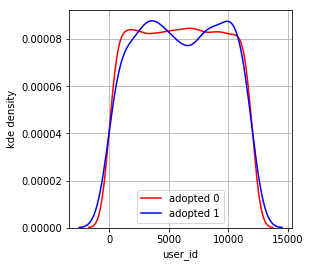

In [273]:
# KDE density plot
var = 'user_id'
print('Variable name:', var)
# distribution of variable:
plt.rcParams['figure.figsize'] = 4,4
sns.kdeplot(record.loc[record['adopted_user'] == 0, var], label = 'adopted 0', color='red')
sns.kdeplot(record.loc[record['adopted_user'] == 1, var], label = 'adopted 1', color='blue')
plt.xlabel(var)
plt.ylabel('kde density')
#plt.yscale('log')
plt.grid(True)
plt.show()


Variable name: creation_source


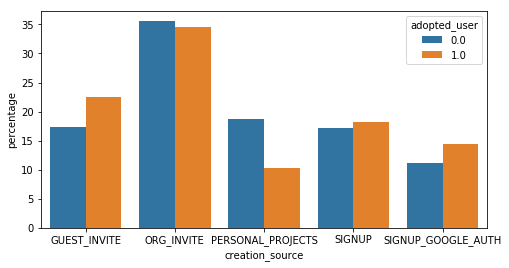

In [274]:
print('Variable name:', 'creation_source')
# distribution of variable:
# This is how we have to present the bar plot: using the percentage, not count
plt.rcParams['figure.figsize'] = 8,4
var = (record.groupby(['adopted_user'])['creation_source'].value_counts(normalize=True)
       .rename('percentage').mul(100).reset_index().sort_values('creation_source'))
sns.barplot(x="creation_source", y='percentage', hue='adopted_user', data=var)
plt.show()


Creation source has some differentiability

Variable name: opted_in_to_mailing_list


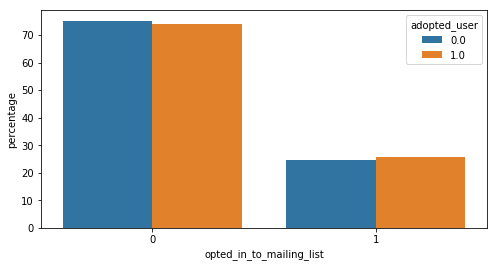

In [275]:
print('Variable name:', 'opted_in_to_mailing_list')
# distribution of variable:
# This is how we have to present the bar plot: using the percentage, not count
plt.rcParams['figure.figsize'] = 8,4
var = (record.groupby(['adopted_user'])['opted_in_to_mailing_list'].value_counts(normalize=True)
       .rename('percentage').mul(100).reset_index().sort_values('opted_in_to_mailing_list'))
sns.barplot(x="opted_in_to_mailing_list", y='percentage', hue='adopted_user', data=var)
plt.show()


In [276]:
record['enabled_for_marketing_drip'].unique()

array([0, 1], dtype=int64)

Variable name: enabled_for_marketing_drip


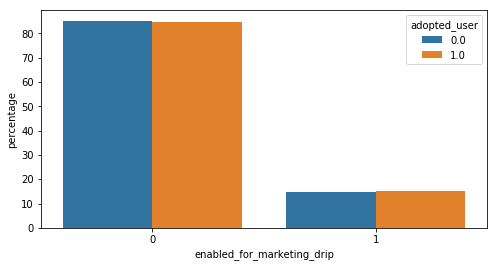

In [277]:
print('Variable name:', 'enabled_for_marketing_drip')
# distribution of variable:
# This is how we have to present the bar plot: using the percentage, not count
plt.rcParams['figure.figsize'] = 8,4
var = (record.groupby(['adopted_user'])['enabled_for_marketing_drip'].value_counts(normalize=True)
       .rename('percentage').mul(100).reset_index().sort_values('enabled_for_marketing_drip'))
sns.barplot(x="enabled_for_marketing_drip", y='percentage', hue='adopted_user', data=var)
plt.show()


Variable name: org_id


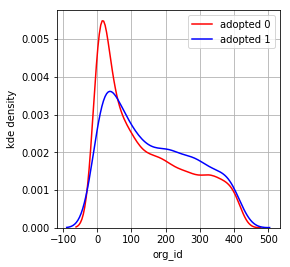

In [278]:
# KDE density plot
var = 'org_id'
print('Variable name:', var)
# distribution of variable:
plt.rcParams['figure.figsize'] = 4,4
sns.kdeplot(record.loc[record['adopted_user'] == 0, var], label = 'adopted 0', color='red')
sns.kdeplot(record.loc[record['adopted_user'] == 1, var], label = 'adopted 1', color='blue')
plt.xlabel(var)
plt.ylabel('kde density')
#plt.yscale('log')
plt.grid(True)
plt.show()


Variable name: invited_by_user_id


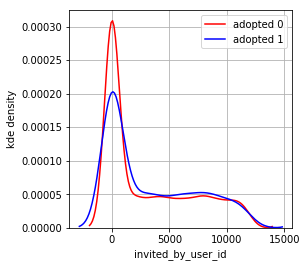

In [279]:
# invited_by_user_id
var = 'invited_by_user_id'

record['invited_by_user_id'] = record['invited_by_user_id'].fillna(0)
print('Variable name:', var)
# distribution of variable:
plt.rcParams['figure.figsize'] = 4,4
sns.kdeplot(record.loc[record['adopted_user'] == 0, var], label = 'adopted 0', color='red')
sns.kdeplot(record.loc[record['adopted_user'] == 1, var], label = 'adopted 1', color='blue')
plt.xlabel(var)
plt.ylabel('kde density')
#plt.yscale('log')
plt.grid(True)
plt.show()


Variable name: activity_duration


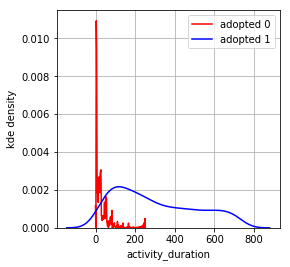

In [280]:
# activity duration
var = 'activity_duration'

print('Variable name:', var)
# distribution of variable:
plt.rcParams['figure.figsize'] = 4,4
sns.kdeplot(record.loc[record['adopted_user'] == 0, var], label = 'adopted 0', color='red')
sns.kdeplot(record.loc[record['adopted_user'] == 1, var], label = 'adopted 1', color='blue')
plt.xlabel(var)
plt.ylabel('kde density')
#plt.yscale('log')
plt.grid(True)
plt.show()


## Data formatting for modeling: final steps

In [281]:
record.head()

,user_id,creation_time,name,email,creation_source,last_session_creation_time,opted_in_to_mailing_list,enabled_for_marketing_drip,org_id,invited_by_user_id,adopted_user,activity_duration
0,1,2014-04-22 03:53:30,Clausen August,AugustCClausen@yahoo.com,GUEST_INVITE,2014-04-21 23:53:30,1,0,11,10803.0,0.0,0.000000
1,2,2013-11-15 03:45:04,Poole Matthew,MatthewPoole@gustr.com,ORG_INVITE,2014-03-30 23:45:04,0,0,1,316.0,1.0,136.000000
2,3,2013-03-19 23:14:52,Bottrill Mitchell,MitchellBottrill@gustr.com,ORG_INVITE,2013-03-19 19:14:52,0,0,94,1525.0,0.0,0.000000
3,4,2013-05-21 08:09:28,Clausen Nicklas,NicklasSClausen@yahoo.com,GUEST_INVITE,2013-05-22 04:09:28,0,0,1,5151.0,0.0,1.000000
4,5,2013-01-17 10:14:20,Raw Grace,GraceRaw@yahoo.com,GUEST_INVITE,2013-01-22 05:14:20,0,0,193,5240.0,0.0,4.958333


In [282]:
record.dtypes

user_id                                int64
creation_time                 datetime64[ns]
name                                  object
email                                 object
creation_source                       object
last_session_creation_time    datetime64[ns]
opted_in_to_mailing_list               int64
enabled_for_marketing_drip             int64
org_id                                 int64
invited_by_user_id                   float64
adopted_user                         float64
activity_duration                    float64
dtype: object

In [283]:
# Dropping redundant variables
record = record.drop(columns=['user_id', 'creation_time', 'name', 'email', 'last_session_creation_time'])

In [284]:
record.creation_source.unique()

array(['GUEST_INVITE', 'ORG_INVITE', 'SIGNUP', 'PERSONAL_PROJECTS',
       'SIGNUP_GOOGLE_AUTH'], dtype=object)

In [285]:
## One hot encoding for unique category >2 for categorical variables
df_obj = pd.get_dummies(record.select_dtypes('object'))
df_obj

,creation_source_GUEST_INVITE,creation_source_ORG_INVITE,creation_source_PERSONAL_PROJECTS,creation_source_SIGNUP,creation_source_SIGNUP_GOOGLE_AUTH
0,1,0,0,0,0
1,0,1,0,0,0
2,0,1,0,0,0
3,1,0,0,0,0
4,1,0,0,0,0
5,1,0,0,0,0
6,0,0,0,1,0
7,0,0,1,0,0
8,0,0,1,0,0
9,0,1,0,0,0


In [286]:
obj_columns = df_obj.columns

for col in obj_columns:
    record[col] = df_obj[col]

In [287]:
record.shape

(12000, 12)

In [288]:
label = record['adopted_user']

In [289]:
# Dropping redundant variables
record = record.drop(columns=['creation_source', 'adopted_user'])

In [290]:
print(record.shape)
record.head()

(12000, 10)


,opted_in_to_mailing_list,enabled_for_marketing_drip,org_id,invited_by_user_id,activity_duration,creation_source_GUEST_INVITE,creation_source_ORG_INVITE,creation_source_PERSONAL_PROJECTS,creation_source_SIGNUP,creation_source_SIGNUP_GOOGLE_AUTH
0,1,0,11,10803.0,0.000000,1,0,0,0,0
1,0,0,1,316.0,136.000000,0,1,0,0,0
2,0,0,94,1525.0,0.000000,0,1,0,0,0
3,0,0,1,5151.0,1.000000,1,0,0,0,0
4,0,0,193,5240.0,4.958333,1,0,0,0,0


## Predictive modeling

Scaling data

In [294]:
scaler = MinMaxScaler(feature_range = (0, 1))
features = list(record.columns)
record = pd.DataFrame(record, columns = features)
scaler.fit(record)
record = scaler.transform(record)


In [295]:
record = pd.DataFrame(record, columns = features)
record.head()

,opted_in_to_mailing_list,enabled_for_marketing_drip,org_id,invited_by_user_id,activity_duration,creation_source_GUEST_INVITE,creation_source_ORG_INVITE,creation_source_PERSONAL_PROJECTS,creation_source_SIGNUP,creation_source_SIGNUP_GOOGLE_AUTH
0,1.0,0.0,0.026442,0.900325,0.000057,1.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.002404,0.026336,0.186603,0.0,1.0,0.0,0.0,0.0
2,0.0,0.0,0.225962,0.127094,0.000057,0.0,1.0,0.0,0.0,0.0
3,0.0,0.0,0.002404,0.429286,0.001429,1.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.463942,0.436703,0.006858,1.0,0.0,0.0,0.0,0.0


## Logistic regression

In [296]:
# test train split
X_train, X_test, y_train, y_test = train_test_split(record, label, test_size = 0.3, random_state=42)

In [297]:
# logistic regression
log_reg = LogisticRegression(C = 0.0001)
log_reg.fit(X_train, y_train)

C:\Users\manas\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=0.0001, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='warn', n_jobs=None, penalty='l2', random_state=None,
          solver='warn', tol=0.0001, verbose=0, warm_start=False)

In [298]:
log_reg_pred = log_reg.predict_proba(X_test)[:, 1]
log_reg_pred

array([0.40549438, 0.39144342, 0.40338296, ..., 0.42119551, 0.4256831 ,
       0.43360402])

In [299]:
# roc_auc_score
valid_auc = roc_auc_score(y_test, log_reg_pred)
valid_auc

0.5451690361595449

In [300]:
#confusion_matrix
print('Confusion matrix: \n', confusion_matrix(y_test, log_reg.predict(X_test)))

Confusion matrix: 
 [[3114    0]
 [ 486    0]]


Logistic regression did a very poor classification by categorizing all the entries as 'adopted user'. So we will use random forest classifier.

In [301]:
# random forest
X_train, X_valid, y_train, y_valid = train_test_split(record, label, test_size = 0.3, random_state=42)
rf = RandomForestClassifier(n_estimators = 100, random_state = 50, verbose = 1, n_jobs = -1)
rf.fit(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.2s finished


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
            oob_score=False, random_state=50, verbose=1, warm_start=False)

In [302]:
rf_valid = rf.predict_proba(X_valid)[:, 1]
valid_auc = roc_auc_score(y_valid, rf_valid)
valid_auc

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished


0.9890742987331871

In [303]:
print('Confusion matrix: \n', confusion_matrix(y_test, rf.predict(X_test)))

Confusion matrix: 
 [[3085   29]
 [  58  428]]


[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished


Random forest is much better classifier, it correctly classified the entries ~99% times. It mis-classified only 29 real adopetd users and 58 non-adopted users.

In [305]:
feature_score = rf.feature_importances_
feature_name = record.columns
feat_imp = pd.DataFrame()
feat_imp['feature_name'] = feature_name
feat_imp['feature_score'] = feature_score
feat_imp = feat_imp.sort_values('feature_score', ascending=False)
feat_imp.head()

,feature_name,feature_score
4,activity_duration,0.881372
2,org_id,0.063863
3,invited_by_user_id,0.034291
0,opted_in_to_mailing_list,0.004773
7,creation_source_PERSONAL_PROJECTS,0.003606


Among all the features, duration of activity (activity_duration) is the most important feature in finding out who will be an adopted user, followed by the organization they belong to (org_id), and which user invited them to join (invited_by_user_id). But as the score suggests, activity_duration has much higher effect than the rest.